# **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note** If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

In [2]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (540, 960, 3)


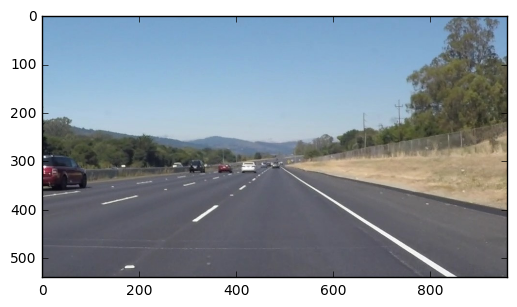

In [3]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image)  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [11]:
def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    # plt.imshow(mask)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

left_x1 = 0.
right_x1 = 0.
left_x2 = 0.
right_x2 = 0.
def draw_lines(img, lines, color=[255, 0, 0], thickness=10):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    
    imshape = img.shape
    left_count = 0.
    right_count = 0.
    global left_x1
    global right_x1
    global left_x2
    global right_x2

    left_x1_sum = 0.
    left_x2_sum = 0.
    right_x1_sum = 0.
    right_x2_sum = 0.
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 != x1:
                slope = (y2 - y1)/(x2 - x1)
                if slope > 0.5:
                    right_count += 1
                    right_x1_sum += ((x2-x1)/(y2-y1))*(imshape[0]*0.6 - y1) + x1
                    right_x2_sum += ((x2-x1)/(y2-y1))*(imshape[0] - y1) + x1
                else:
                    if slope < -0.5:
                        left_count += 1
                        left_x1_sum += ((x2 - x1) / (y2 - y1)) * (imshape[0]*0.6 - y1) + x1
                        left_x2_sum += ((x2 - x1) / (y2 - y1)) * (imshape[0] - y1) + x1


    #for line in lines:
    #    for x1, y1, x2, y2 in line:
    #        cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    if right_count != 0:
        right_x1 = right_x1_sum/right_count
        right_x2 = right_x2_sum/right_count
    cv2.line(img, (math.floor(right_x1), math.floor(imshape[0]*0.6)), ((math.floor(right_x2), imshape[0])), color, thickness)
    if left_count != 0:
        left_x1  = left_x1_sum/left_count
        left_x2  = left_x2_sum/left_count
    cv2.line(img, (math.floor(left_x1),  math.floor(imshape[0]*0.6)), ((math.floor(left_x2), imshape[0])),  color, thickness)
    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((*img.shape, 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

def pipeline(image):
    
    img = mpimg.imread(image)
    
    gray = grayscale(img)
    # plt.imshow(gray, cmap = 'gray')
    
    # Define a kernel size and apply Gaussian smoothing
    kernel_size = 5
    blur_gray = gaussian_blur(gray, kernel_size)
    # plt.imshow(blur_gray, cmap = 'gray')
        
    # Define our parameters for Canny and apply
    low_threshold = 50
    high_threshold = 100
    edges = canny(blur_gray, low_threshold, high_threshold)
    # plt.imshow(edges, cmap = 'gray')
    
    # This time we are defining a four sided polygon to mask
    imshape = img.shape
    #print(imshape)
    vertices = np.array([[(0, imshape[0]), (imshape[1]*0.6, imshape[0]*0.45), (imshape[1]*0.6, imshape[0]*0.65),
                          (imshape[1], imshape[0])]], dtype=np.int32)
    masked_edges = region_of_interest(edges, vertices)
    # plt.imshow(masked_edges, cmap = 'gray')
    
    # Define the Hough transform parameters
    # Make a blank the same size as our image to draw on
    rho = 1  # distance resolution in pixels of the Hough grid
    theta = np.pi / 180  # angular resolution in radians of the Hough grid
    threshold = 10  # minimum number of votes (intersections in Hough grid cell)
    min_line_len = 50  # minimum number of pixels making up a line
    max_line_gap = 50  # maximum gap in pixels between connectable line segments
    
    # Run Hough on edge detected image
    # Output "lines" is an array containing endpoints of detected line segments
    line_image = hough_lines(masked_edges, rho, theta, threshold, min_line_len, max_line_gap)
    # Iterate over the output "lines" and draw lines on a blank image
    # line_image = np.copy(pl_original_image)*0 # creating a blank to draw lines on
    # draw_lines(line_image, lines, color=[255, 0, 0], thickness=2)
    lines_edges = weighted_img(line_image, img)
    # plt.imshow(lines_edges)
    
    return lines_edges

## Test on Images

Now you should build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

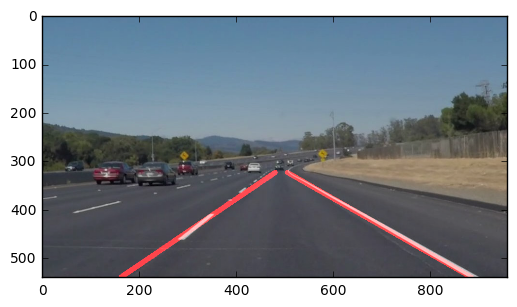

In [12]:
import os

os.listdir("test_images/")
image = pipeline('test_images/solidWhiteCurve.jpg')
plt.imshow(image)

run your solution on all test_images and make copies into the test_images directory).


## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

In [6]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [13]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image with lines are drawn on lanes)
     
    # Color selection to gray
    gray = grayscale(image)
    # plt.imshow(gray, cmap = 'gray')
    
    # Define a kernel size and apply Gaussian smoothing
    kernel_size = 5
    blur_gray = gaussian_blur(gray, kernel_size)
    # plt.imshow(blur_gray, cmap = 'gray')
    # plt.show()
    
    # Define our parameters for Canny and apply
    low_threshold = 50
    high_threshold = 150
    edges = cv2.Canny(blur_gray, low_threshold, high_threshold)
    
    # This time we are defining a four sided polygon of side [(0, 540), (450, 290), (490, 290), (960, 540)] to mask
    imshape = image.shape
    #vertices = np.array([[(0,imshape[0]),(450, 290), (490, 290), (imshape[1],imshape[0])]], dtype=np.int32)
    vertices = np.array([[(0,imshape[0]),(490, 290), (imshape[1],imshape[0])]], dtype=np.int32)
    masked_image = region_of_interest(edges, vertices)
    plt.imshow(masked_image, cmap='Greys_r')

    # Hough transform
    #rho = 2
    #theta = np.pi/180 
    #threshold = 15     
    #min_line_len = 40
    #max_line_gap = 10 

    rho = 1
    theta = np.pi/180 
    threshold = 100     
    min_line_len = 10
    max_line_gap = 100 

    line_img = hough_lines(masked_image, rho, theta, threshold, min_line_len, max_line_gap)
        
    plt.imshow(line_img)

    result = weighted_img(line_img, image)
    # plt.imshow(result, cmap='gray')
    plt.show()
    return result

Let's try the one with the solid white lane on the right first ...

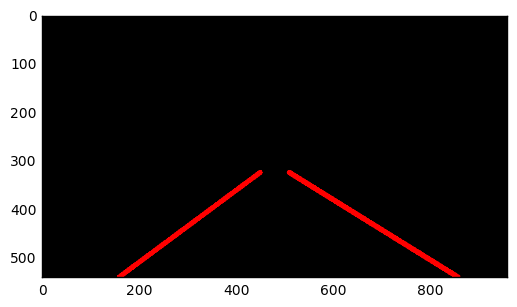

[MoviePy] >>>> Building video white.mp4
[MoviePy] Writing video white.mp4


  0%|                                                                                           | 0/222 [00:00<?, ?it/s]

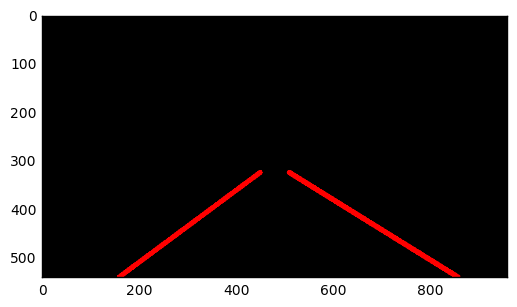

  0%|▎                                                                                  | 1/222 [00:00<02:18,  1.60it/s]

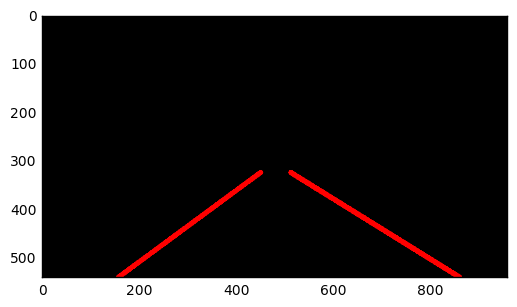

  1%|▋                                                                                  | 2/222 [00:01<02:25,  1.51it/s]

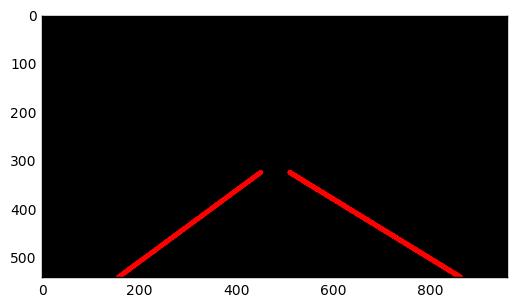

  1%|█                                                                                  | 3/222 [00:01<02:16,  1.60it/s]

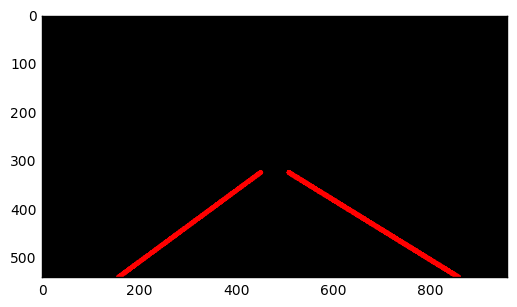

  2%|█▍                                                                                 | 4/222 [00:02<02:20,  1.55it/s]

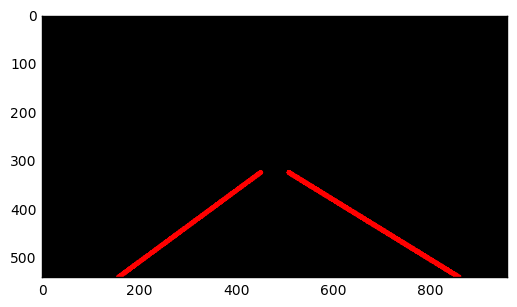

  2%|█▊                                                                                 | 5/222 [00:03<02:17,  1.58it/s]

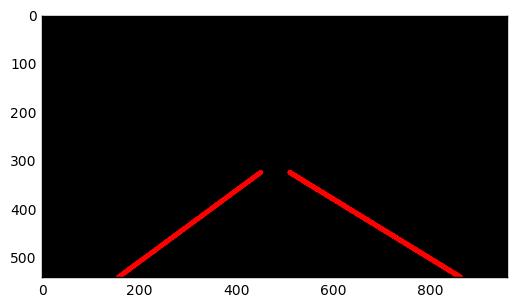

  3%|██▏                                                                                | 6/222 [00:03<02:17,  1.57it/s]

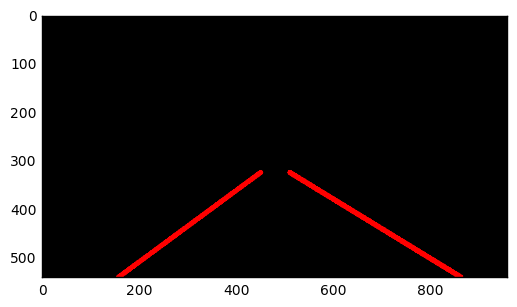

  3%|██▌                                                                                | 7/222 [00:04<02:12,  1.62it/s]

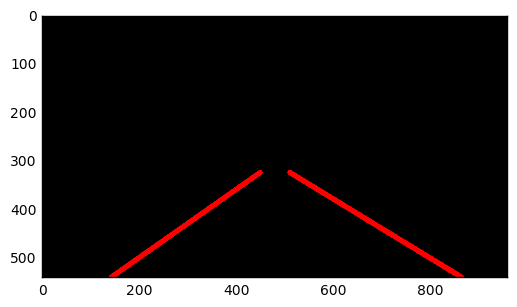

  4%|██▉                                                                                | 8/222 [00:04<02:04,  1.71it/s]

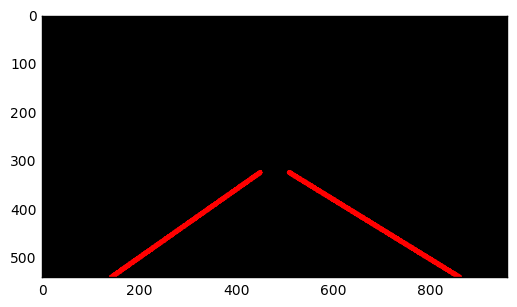

  4%|███▎                                                                               | 9/222 [00:05<02:03,  1.72it/s]

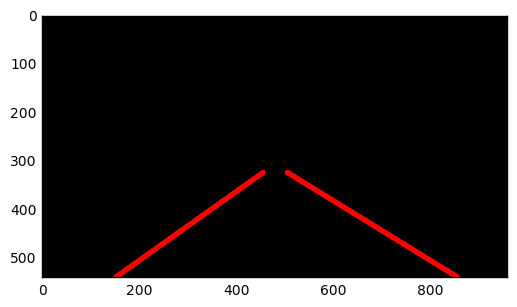

  5%|███▋                                                                              | 10/222 [00:06<02:02,  1.73it/s]

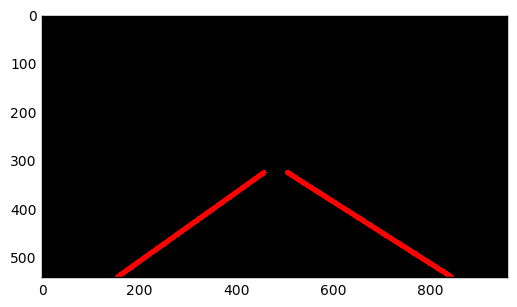

  5%|████                                                                              | 11/222 [00:06<02:02,  1.72it/s]

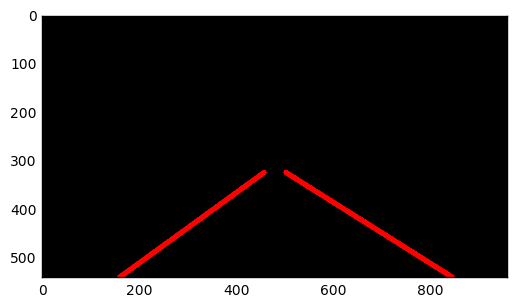

  5%|████▍                                                                             | 12/222 [00:07<02:17,  1.52it/s]

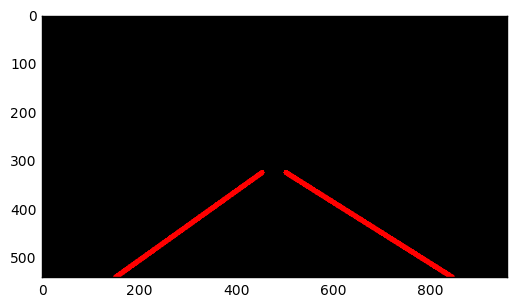

  6%|████▊                                                                             | 13/222 [00:08<02:30,  1.39it/s]

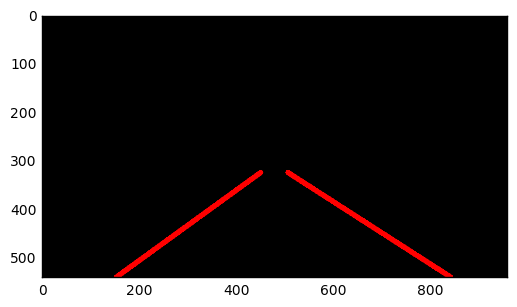

  6%|█████▏                                                                            | 14/222 [00:08<02:22,  1.46it/s]

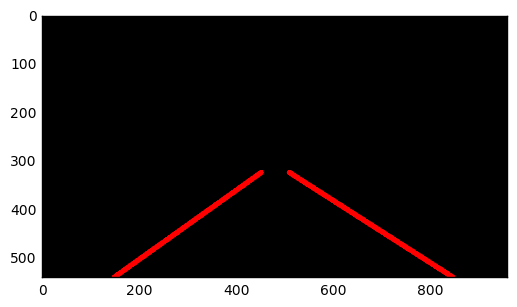

  7%|█████▌                                                                            | 15/222 [00:09<02:24,  1.43it/s]

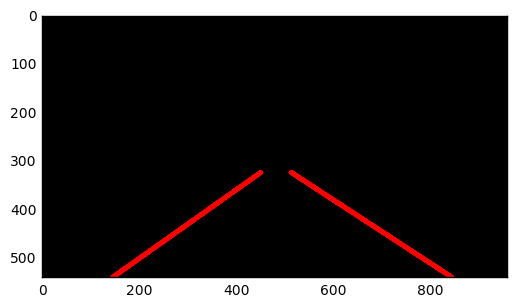

  7%|█████▉                                                                            | 16/222 [00:10<02:24,  1.43it/s]

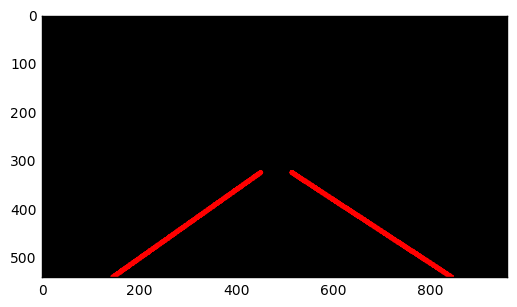

  8%|██████▎                                                                           | 17/222 [00:10<02:14,  1.52it/s]

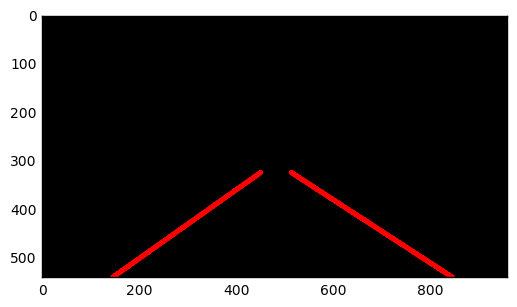

  8%|██████▋                                                                           | 18/222 [00:11<02:09,  1.58it/s]

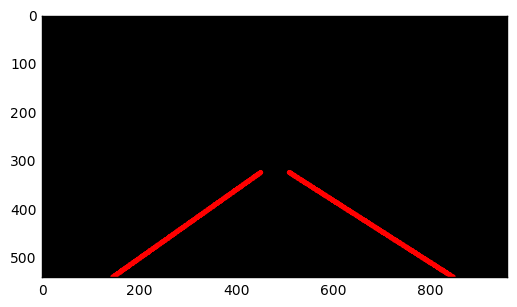

  9%|███████                                                                           | 19/222 [00:12<02:06,  1.60it/s]

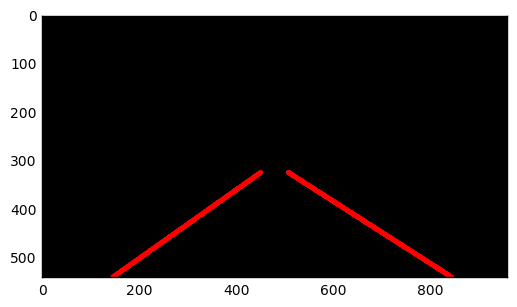

  9%|███████▍                                                                          | 20/222 [00:12<02:03,  1.64it/s]

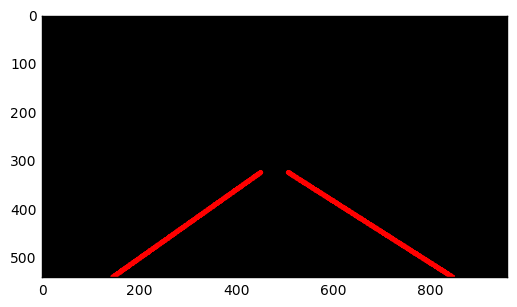

  9%|███████▊                                                                          | 21/222 [00:13<02:04,  1.61it/s]

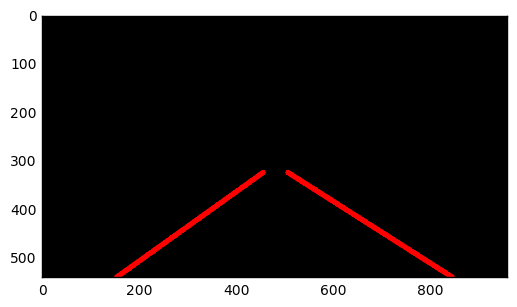

 10%|████████▏                                                                         | 22/222 [00:14<02:06,  1.58it/s]

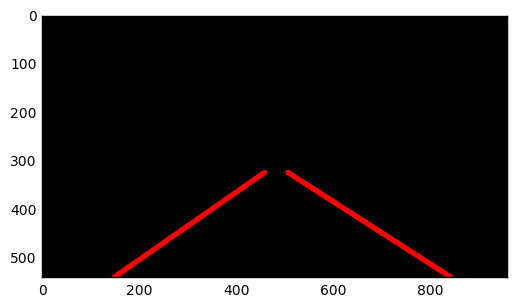

 10%|████████▍                                                                         | 23/222 [00:14<02:00,  1.65it/s]

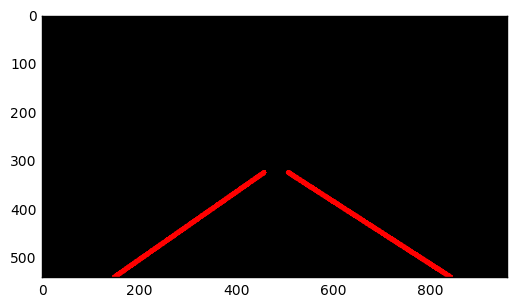

 11%|████████▊                                                                         | 24/222 [00:15<02:13,  1.48it/s]

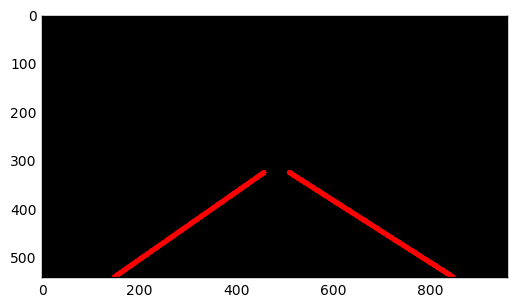

 11%|█████████▏                                                                        | 25/222 [00:15<02:02,  1.61it/s]

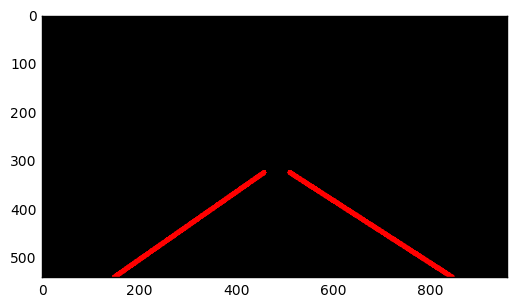

 12%|█████████▌                                                                        | 26/222 [00:16<01:57,  1.66it/s]

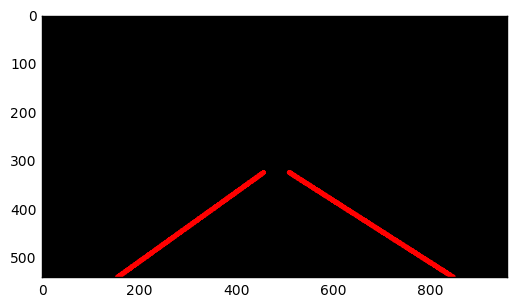

 12%|█████████▉                                                                        | 27/222 [00:16<01:51,  1.75it/s]

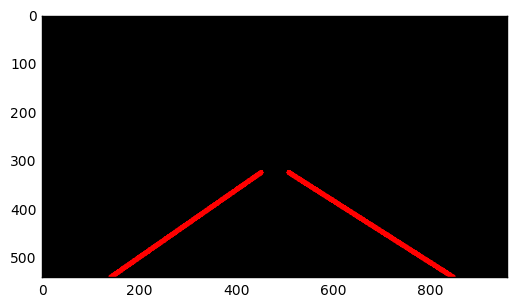

 13%|██████████▎                                                                       | 28/222 [00:17<01:50,  1.75it/s]

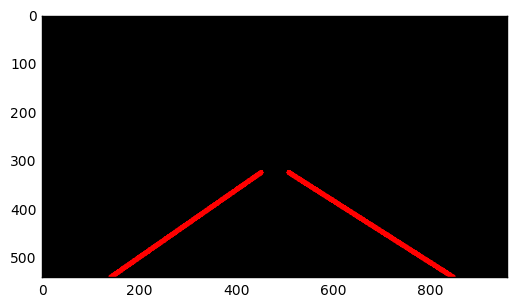

 13%|██████████▋                                                                       | 29/222 [00:18<01:49,  1.76it/s]

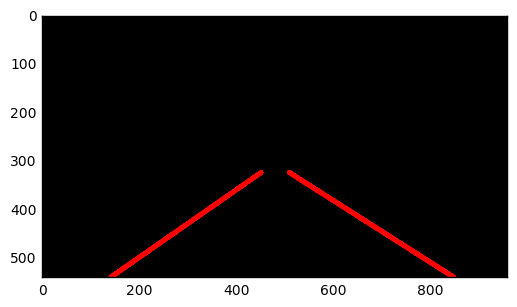

 14%|███████████                                                                       | 30/222 [00:18<01:48,  1.77it/s]

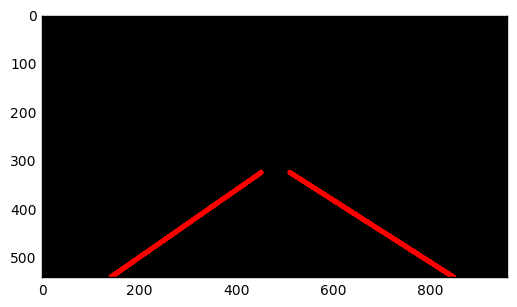

 14%|███████████▍                                                                      | 31/222 [00:19<01:47,  1.77it/s]

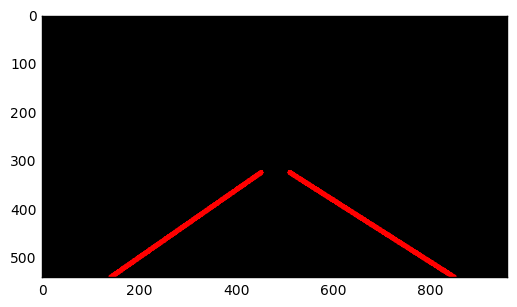

 14%|███████████▊                                                                      | 32/222 [00:19<01:42,  1.85it/s]

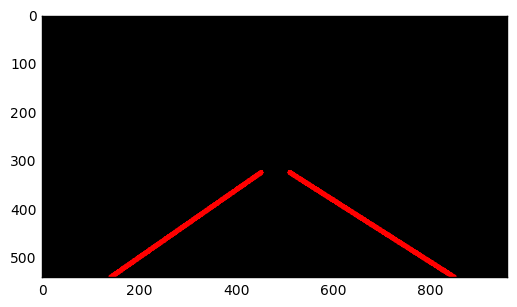

 15%|████████████▏                                                                     | 33/222 [00:20<01:40,  1.88it/s]

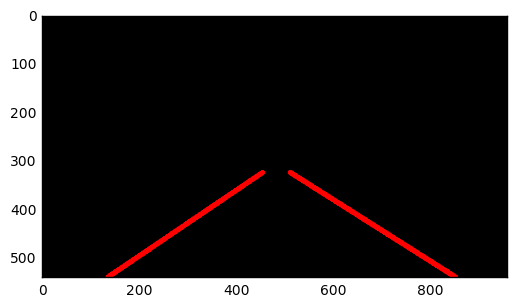

 15%|████████████▌                                                                     | 34/222 [00:20<01:37,  1.93it/s]

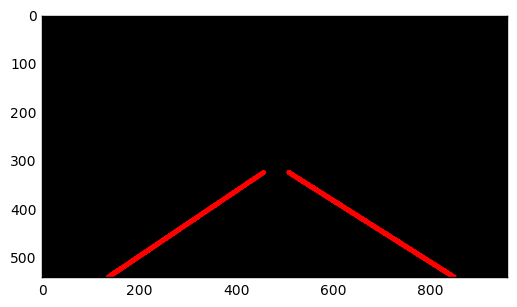

 16%|████████████▉                                                                     | 35/222 [00:21<01:51,  1.68it/s]

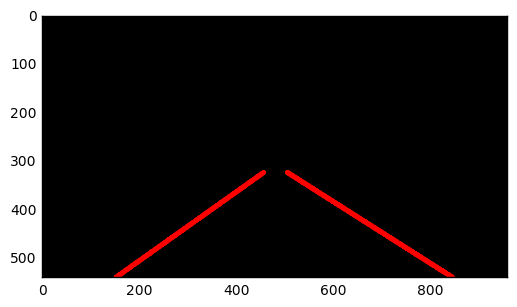

 16%|█████████████▎                                                                    | 36/222 [00:21<01:44,  1.77it/s]

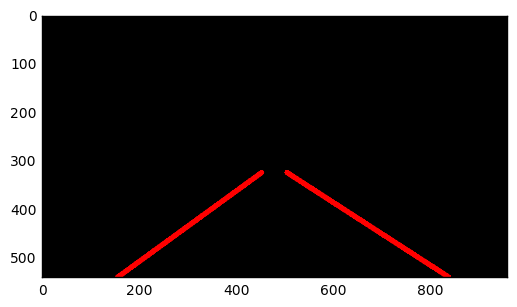

 17%|█████████████▋                                                                    | 37/222 [00:22<01:45,  1.76it/s]

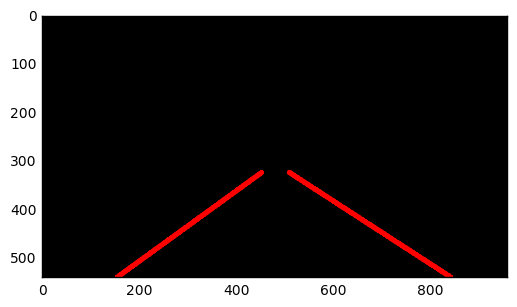

 17%|██████████████                                                                    | 38/222 [00:23<01:43,  1.78it/s]

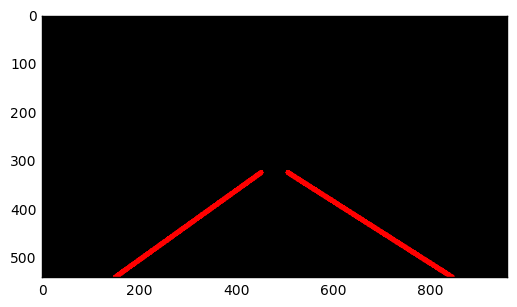

 18%|██████████████▍                                                                   | 39/222 [00:23<01:44,  1.75it/s]

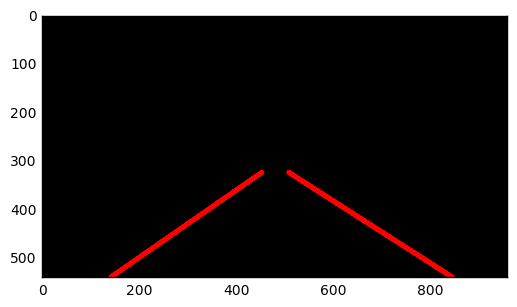

 18%|██████████████▊                                                                   | 40/222 [00:24<01:42,  1.77it/s]

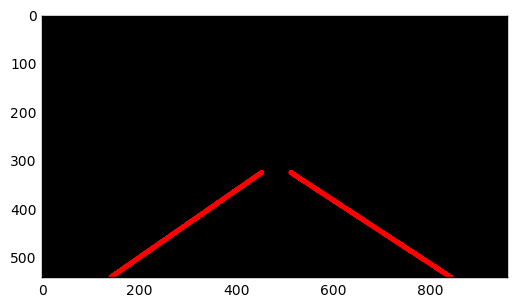

 18%|███████████████▏                                                                  | 41/222 [00:24<01:37,  1.86it/s]

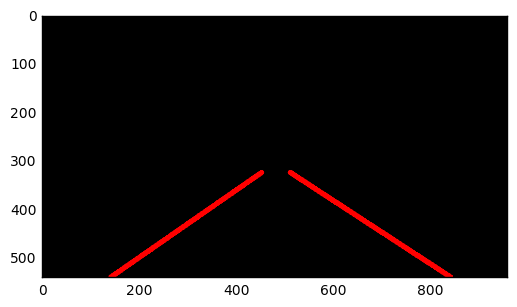

 19%|███████████████▌                                                                  | 42/222 [00:25<01:35,  1.89it/s]

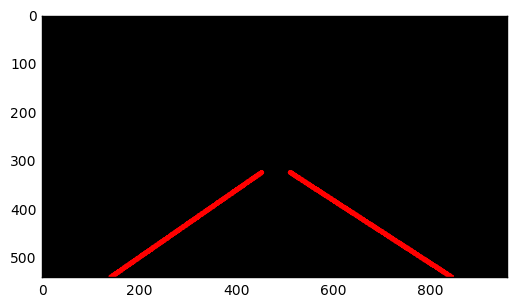

 19%|███████████████▉                                                                  | 43/222 [00:25<01:33,  1.91it/s]

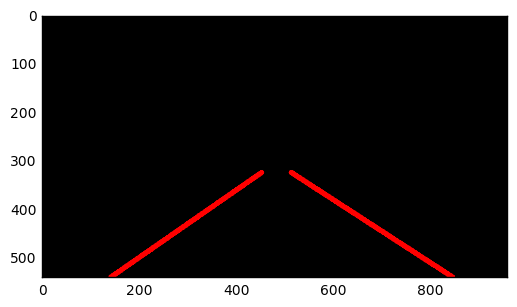

 20%|████████████████▎                                                                 | 44/222 [00:26<01:33,  1.90it/s]

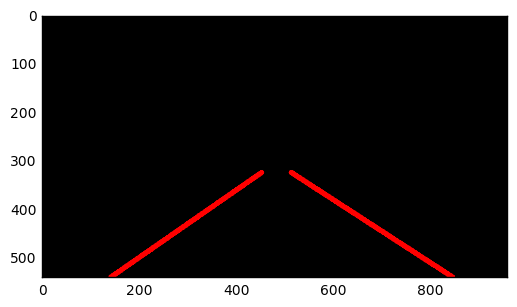

 20%|████████████████▌                                                                 | 45/222 [00:26<01:30,  1.96it/s]

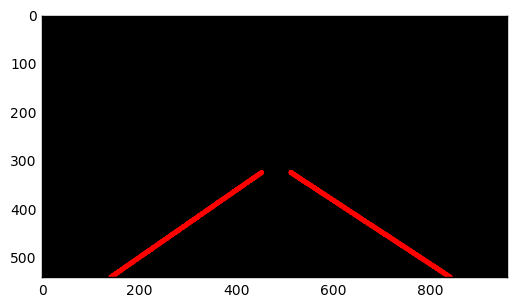

 21%|████████████████▉                                                                 | 46/222 [00:27<01:45,  1.67it/s]

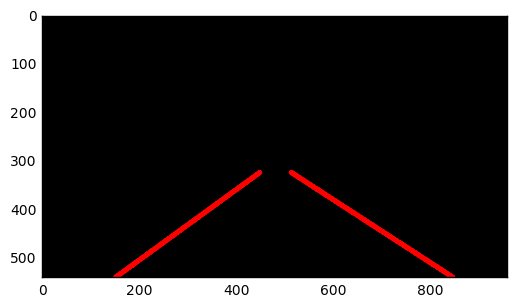

 21%|█████████████████▎                                                                | 47/222 [00:28<01:43,  1.69it/s]

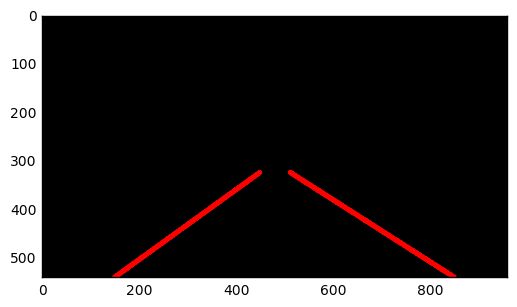

 22%|█████████████████▋                                                                | 48/222 [00:28<01:43,  1.69it/s]

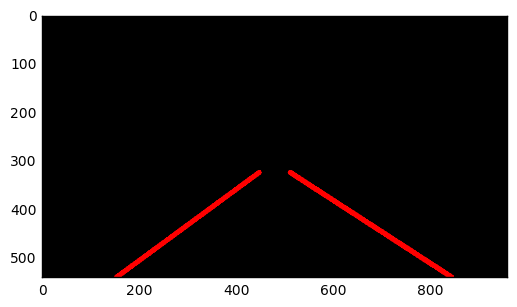

 22%|██████████████████                                                                | 49/222 [00:29<01:40,  1.73it/s]

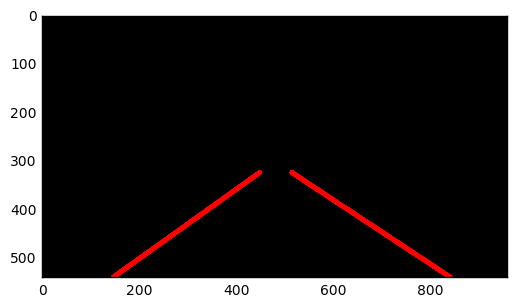

 23%|██████████████████▍                                                               | 50/222 [00:29<01:36,  1.78it/s]

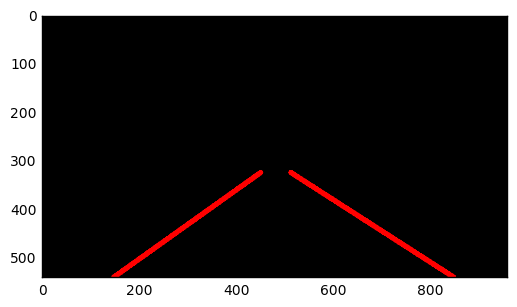

 23%|██████████████████▊                                                               | 51/222 [00:30<01:35,  1.80it/s]

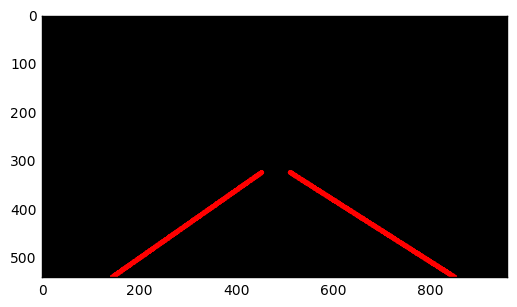

 23%|███████████████████▏                                                              | 52/222 [00:31<01:57,  1.44it/s]

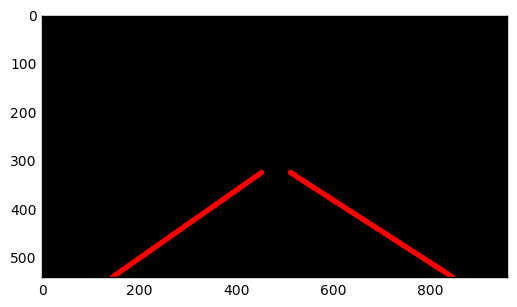

 24%|███████████████████▌                                                              | 53/222 [00:32<02:19,  1.22it/s]

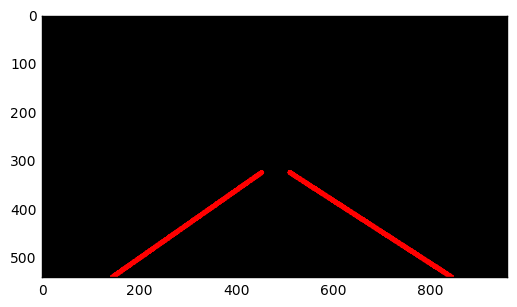

 24%|███████████████████▉                                                              | 54/222 [00:33<02:12,  1.27it/s]

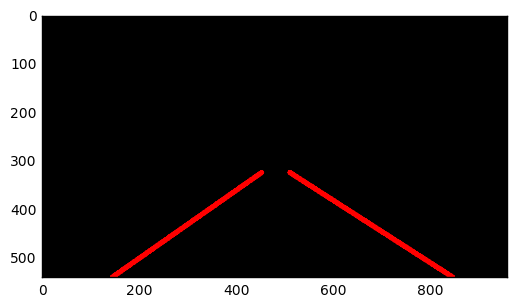

 25%|████████████████████▎                                                             | 55/222 [00:33<02:02,  1.36it/s]

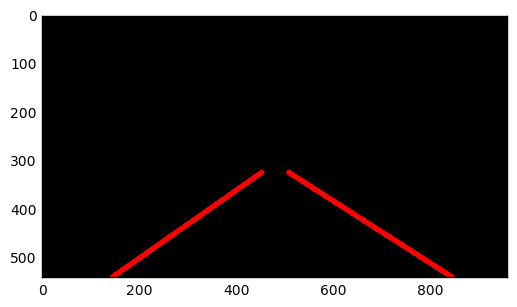

 25%|████████████████████▋                                                             | 56/222 [00:34<02:03,  1.35it/s]

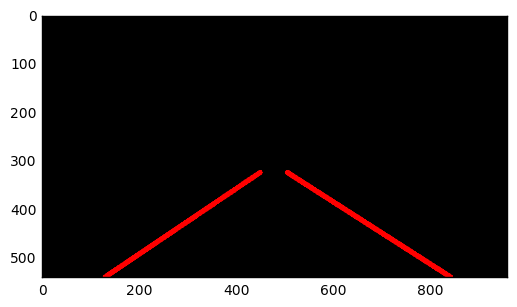

 26%|█████████████████████                                                             | 57/222 [00:35<02:07,  1.29it/s]

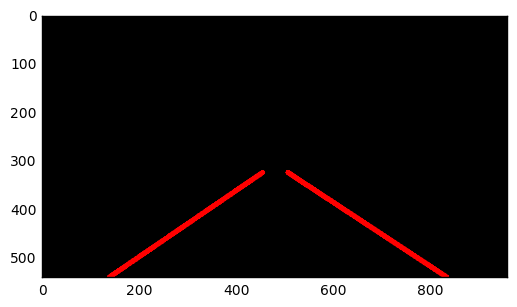

 26%|█████████████████████▍                                                            | 58/222 [00:35<01:55,  1.42it/s]

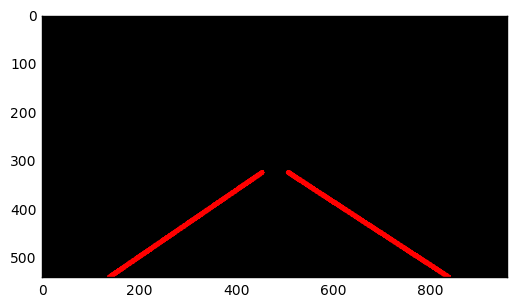

 27%|█████████████████████▊                                                            | 59/222 [00:36<01:49,  1.49it/s]

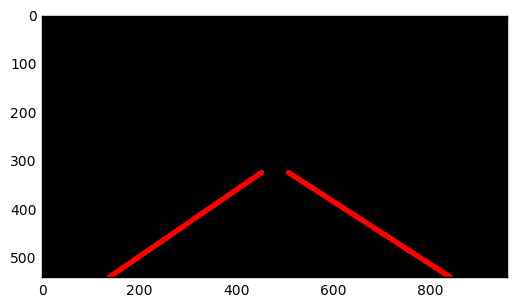

 27%|██████████████████████▏                                                           | 60/222 [00:37<01:52,  1.44it/s]

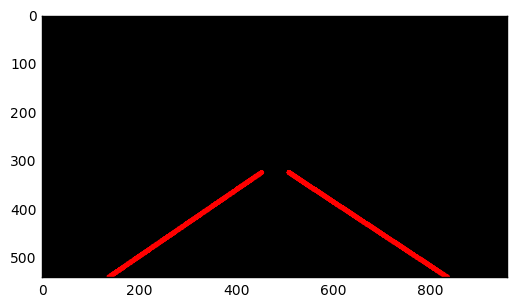

 27%|██████████████████████▌                                                           | 61/222 [00:38<02:07,  1.26it/s]

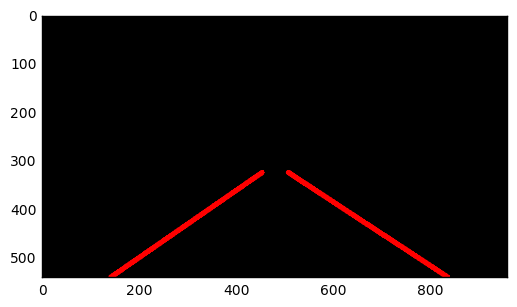

 28%|██████████████████████▉                                                           | 62/222 [00:38<01:59,  1.34it/s]

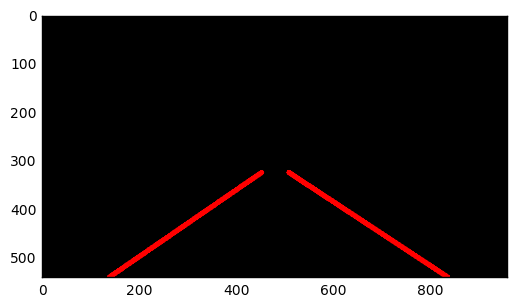

 28%|███████████████████████▎                                                          | 63/222 [00:39<01:56,  1.37it/s]

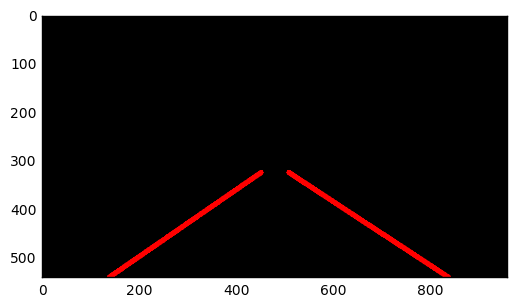

 29%|███████████████████████▋                                                          | 64/222 [00:40<01:51,  1.42it/s]

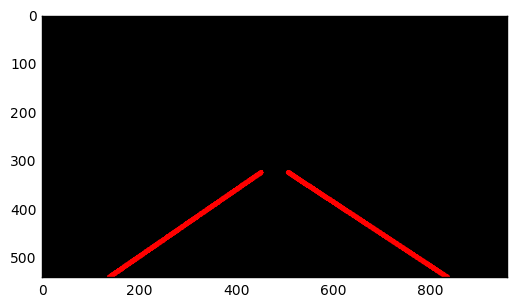

 29%|████████████████████████                                                          | 65/222 [00:41<01:53,  1.39it/s]

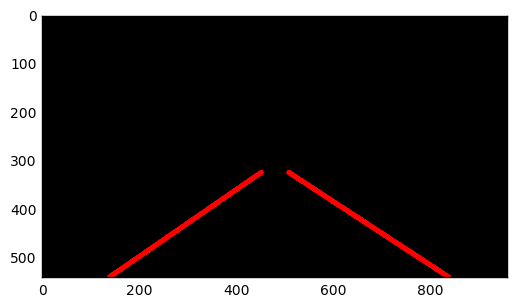

 30%|████████████████████████▍                                                         | 66/222 [00:41<01:55,  1.36it/s]

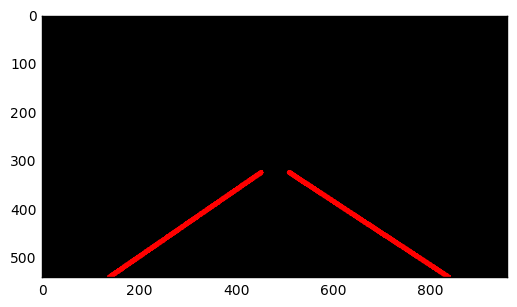

 30%|████████████████████████▋                                                         | 67/222 [00:42<02:16,  1.14it/s]

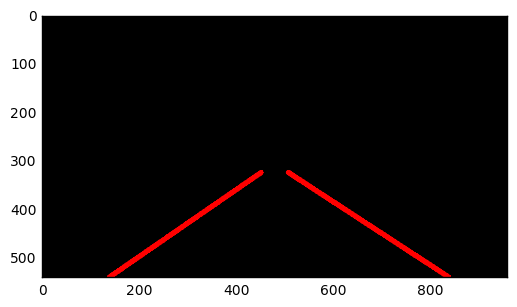

 31%|█████████████████████████                                                         | 68/222 [00:44<02:30,  1.02it/s]

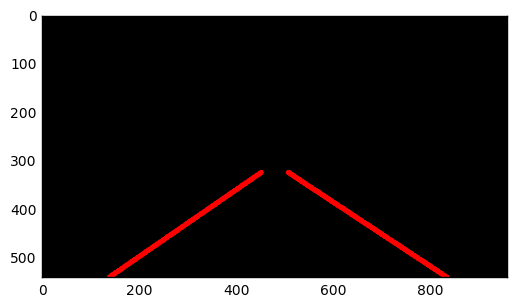

 31%|█████████████████████████▍                                                        | 69/222 [00:44<02:14,  1.14it/s]

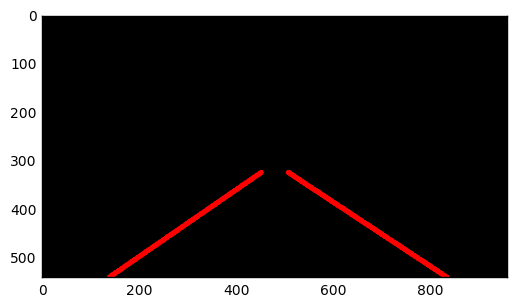

 32%|█████████████████████████▊                                                        | 70/222 [00:45<02:08,  1.18it/s]

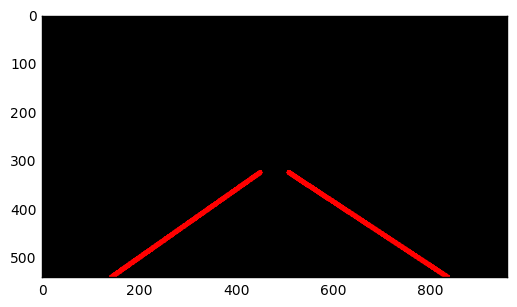

 32%|██████████████████████████▏                                                       | 71/222 [00:46<02:12,  1.14it/s]

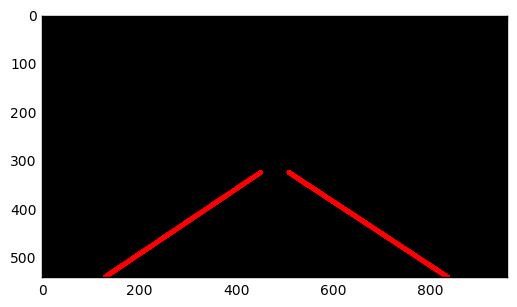

 32%|██████████████████████████▌                                                       | 72/222 [00:47<02:05,  1.20it/s]

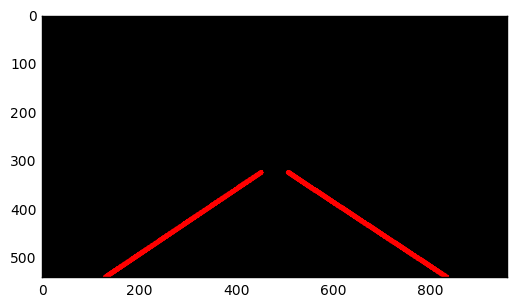

 33%|██████████████████████████▉                                                       | 73/222 [00:47<01:54,  1.31it/s]

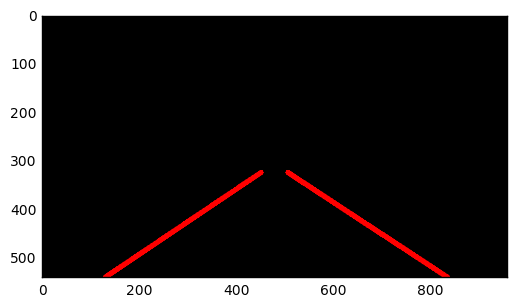

 33%|███████████████████████████▎                                                      | 74/222 [00:48<01:56,  1.27it/s]

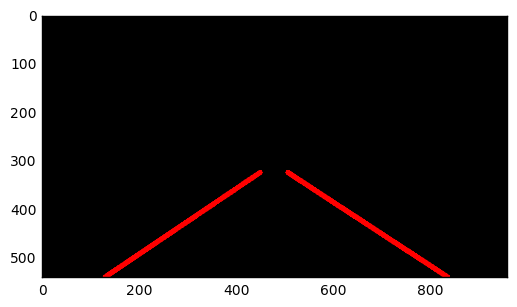

 34%|███████████████████████████▋                                                      | 75/222 [00:49<01:56,  1.26it/s]

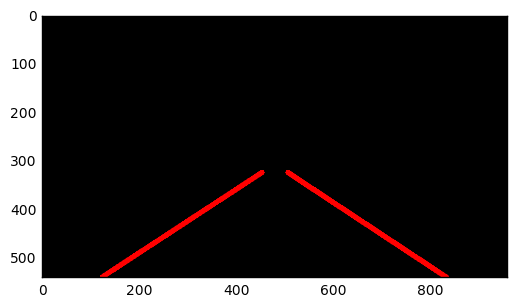

 34%|████████████████████████████                                                      | 76/222 [00:50<01:54,  1.28it/s]

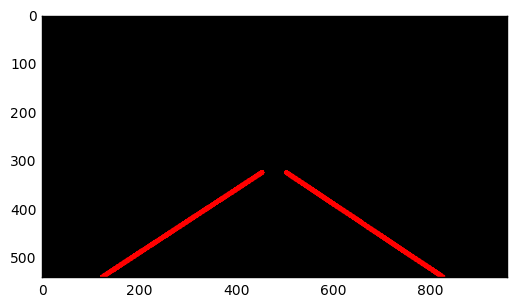

 35%|████████████████████████████▍                                                     | 77/222 [00:50<01:44,  1.38it/s]

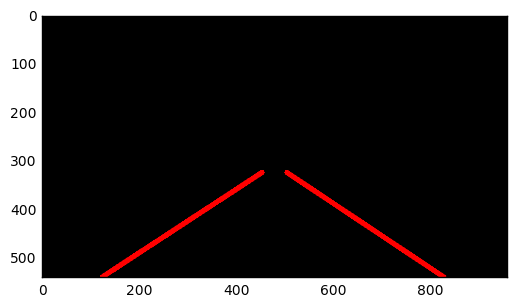

 35%|████████████████████████████▊                                                     | 78/222 [00:51<01:37,  1.48it/s]

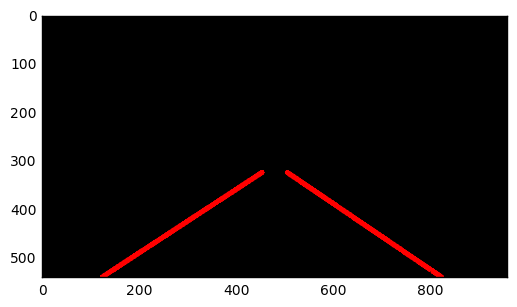

 36%|█████████████████████████████▏                                                    | 79/222 [00:52<01:49,  1.31it/s]

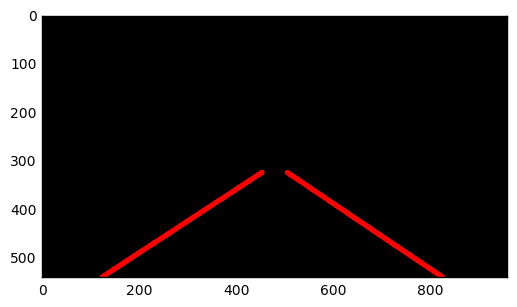

 36%|█████████████████████████████▌                                                    | 80/222 [00:52<01:39,  1.43it/s]

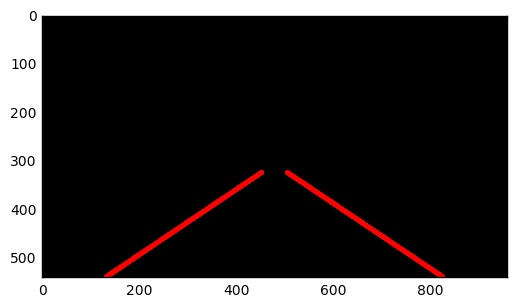

 36%|█████████████████████████████▉                                                    | 81/222 [00:53<01:29,  1.58it/s]

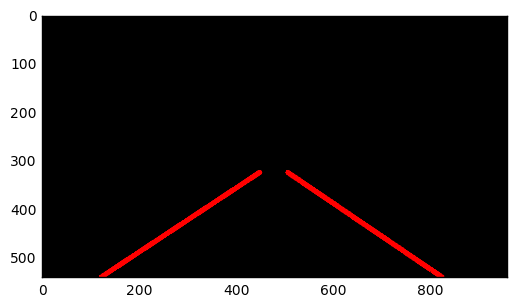

 37%|██████████████████████████████▎                                                   | 82/222 [00:54<01:29,  1.57it/s]

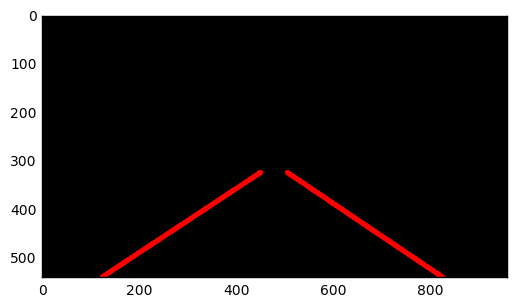

 37%|██████████████████████████████▋                                                   | 83/222 [00:54<01:32,  1.50it/s]

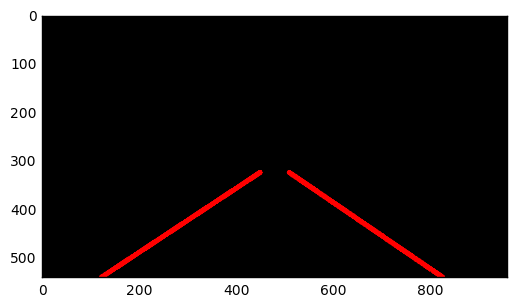

 38%|███████████████████████████████                                                   | 84/222 [00:55<01:38,  1.41it/s]

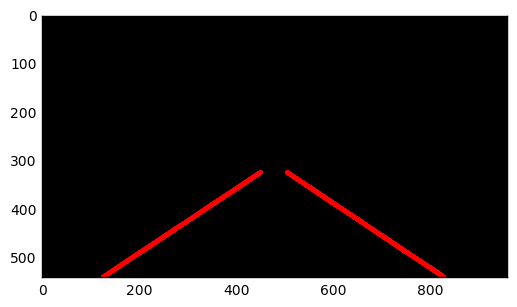

 38%|███████████████████████████████▍                                                  | 85/222 [00:56<01:42,  1.34it/s]

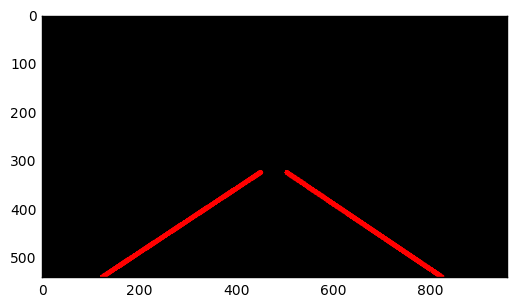

 39%|███████████████████████████████▊                                                  | 86/222 [00:57<01:40,  1.35it/s]

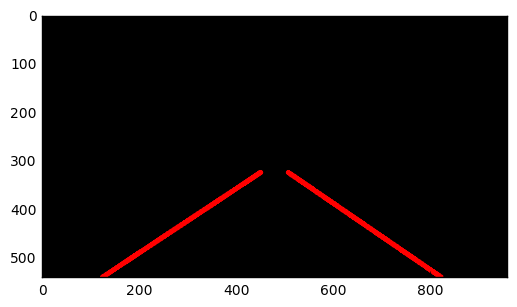

 39%|████████████████████████████████▏                                                 | 87/222 [00:57<01:39,  1.36it/s]

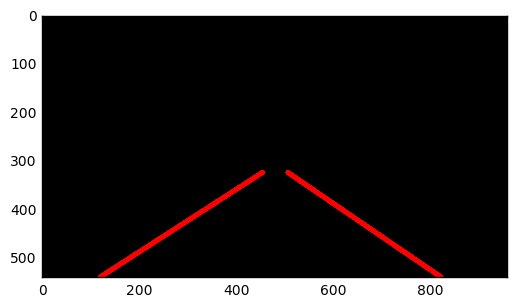

 40%|████████████████████████████████▌                                                 | 88/222 [00:58<01:37,  1.37it/s]

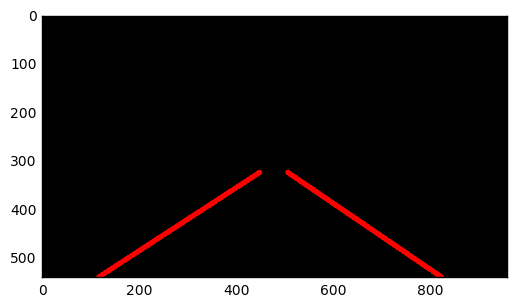

 40%|████████████████████████████████▊                                                 | 89/222 [00:59<01:33,  1.43it/s]

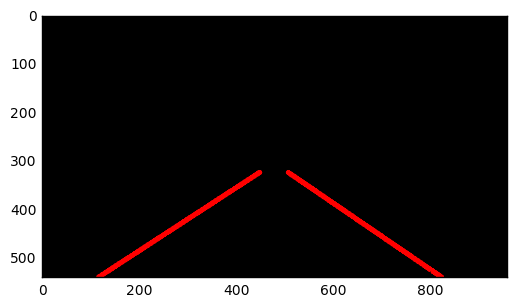

 41%|█████████████████████████████████▏                                                | 90/222 [01:00<01:37,  1.36it/s]

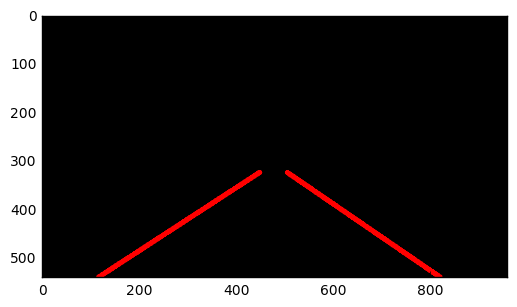

 41%|█████████████████████████████████▌                                                | 91/222 [01:00<01:30,  1.45it/s]

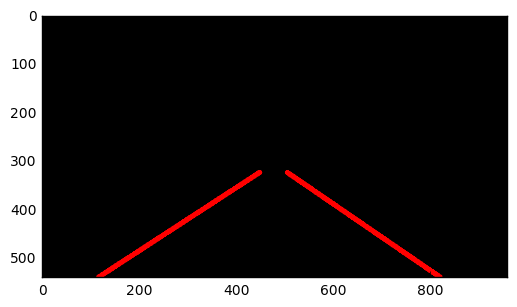

 41%|█████████████████████████████████▉                                                | 92/222 [01:01<01:29,  1.45it/s]

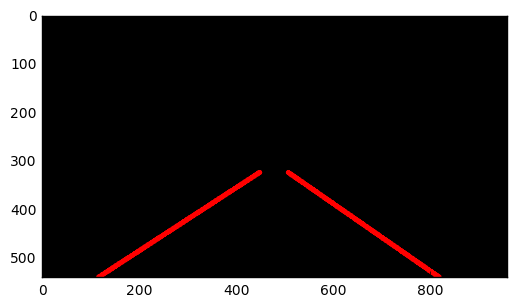

 42%|██████████████████████████████████▎                                               | 93/222 [01:02<01:28,  1.45it/s]

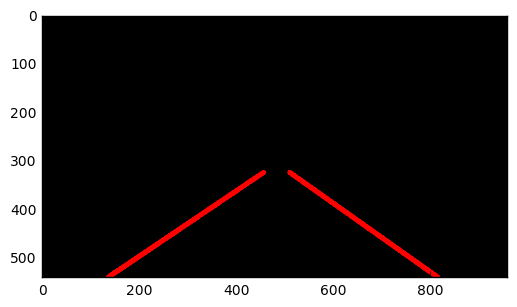

 42%|██████████████████████████████████▋                                               | 94/222 [01:02<01:23,  1.53it/s]

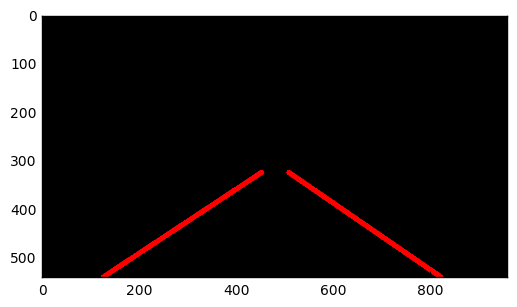

 43%|███████████████████████████████████                                               | 95/222 [01:03<01:19,  1.60it/s]

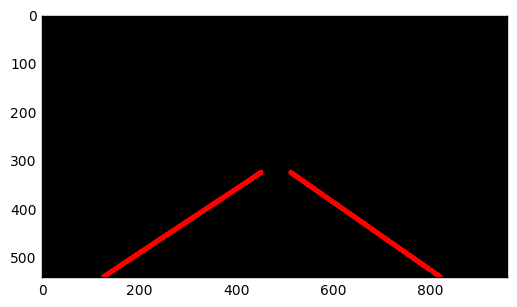

 43%|███████████████████████████████████▍                                              | 96/222 [01:03<01:16,  1.64it/s]

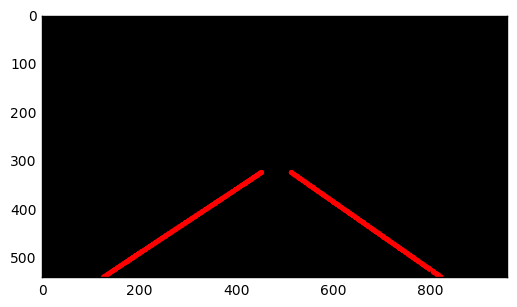

 44%|███████████████████████████████████▊                                              | 97/222 [01:04<01:21,  1.54it/s]

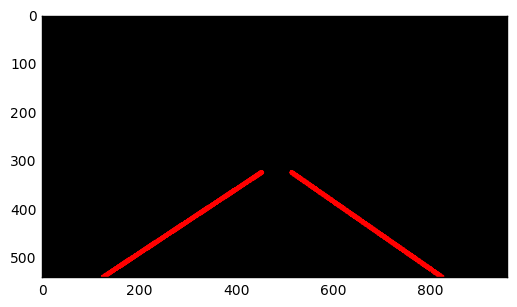

 44%|████████████████████████████████████▏                                             | 98/222 [01:05<01:18,  1.59it/s]

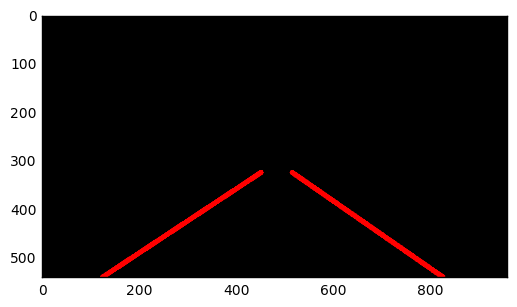

 45%|████████████████████████████████████▌                                             | 99/222 [01:05<01:17,  1.59it/s]

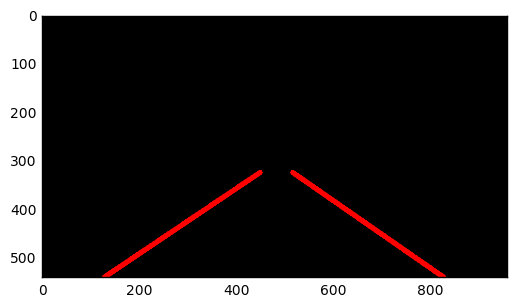

 45%|████████████████████████████████████▍                                            | 100/222 [01:06<01:20,  1.51it/s]

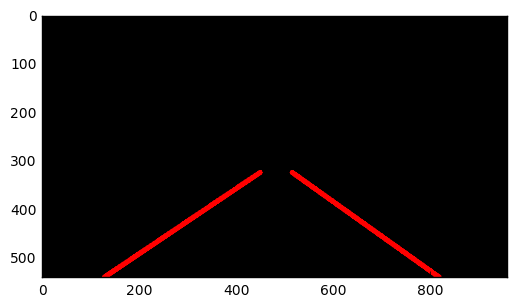

 45%|████████████████████████████████████▊                                            | 101/222 [01:07<01:27,  1.39it/s]

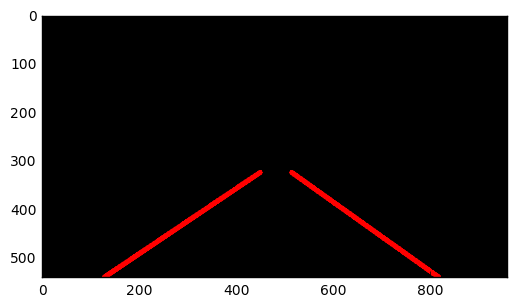

 46%|█████████████████████████████████████▏                                           | 102/222 [01:08<01:32,  1.29it/s]

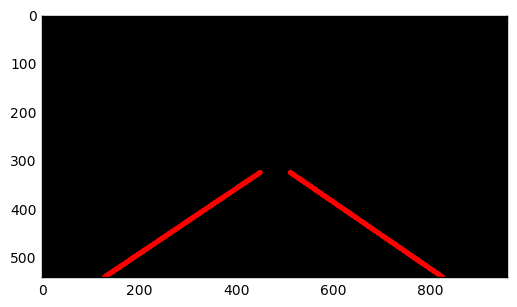

 46%|█████████████████████████████████████▌                                           | 103/222 [01:08<01:26,  1.37it/s]

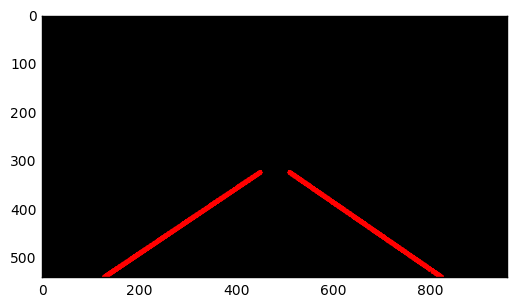

 47%|█████████████████████████████████████▉                                           | 104/222 [01:09<01:19,  1.49it/s]

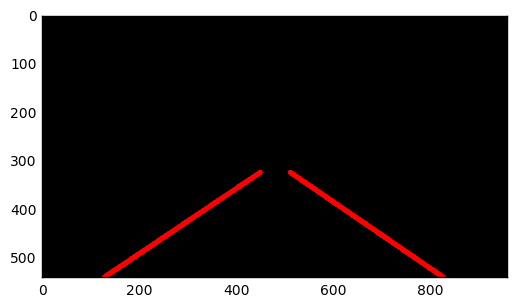

 47%|██████████████████████████████████████▎                                          | 105/222 [01:10<01:17,  1.51it/s]

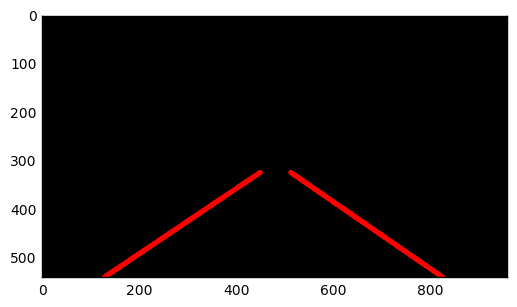

 48%|██████████████████████████████████████▋                                          | 106/222 [01:10<01:24,  1.38it/s]

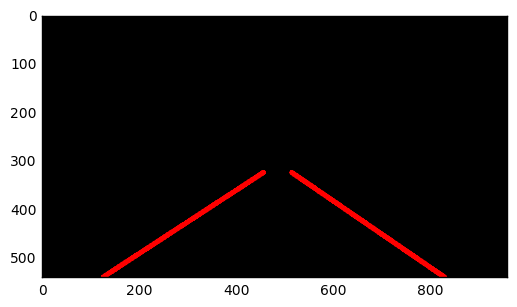

 48%|███████████████████████████████████████                                          | 107/222 [01:11<01:21,  1.40it/s]

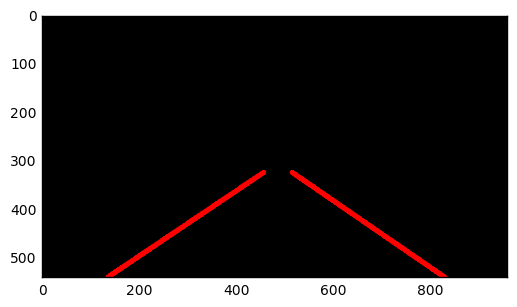

 49%|███████████████████████████████████████▍                                         | 108/222 [01:12<01:22,  1.38it/s]

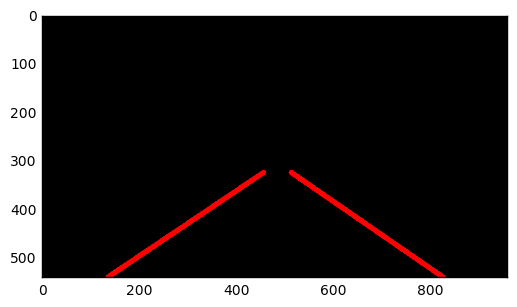

 49%|███████████████████████████████████████▊                                         | 109/222 [01:13<01:27,  1.29it/s]

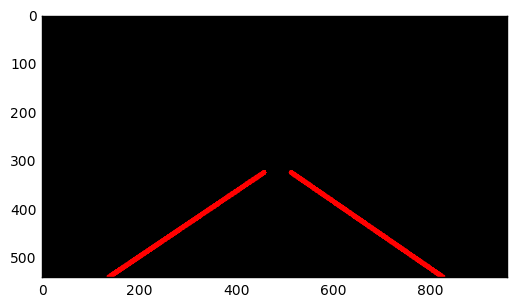

 50%|████████████████████████████████████████▏                                        | 110/222 [01:13<01:20,  1.38it/s]

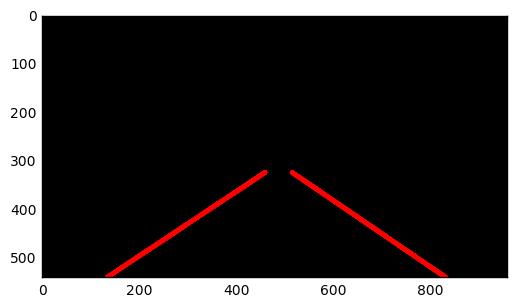

 50%|████████████████████████████████████████▌                                        | 111/222 [01:14<01:21,  1.37it/s]

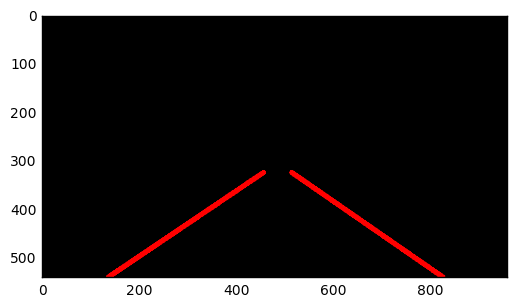

 50%|████████████████████████████████████████▊                                        | 112/222 [01:15<01:20,  1.36it/s]

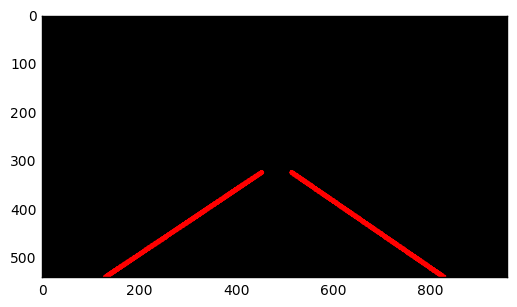

 51%|█████████████████████████████████████████▏                                       | 113/222 [01:15<01:16,  1.42it/s]

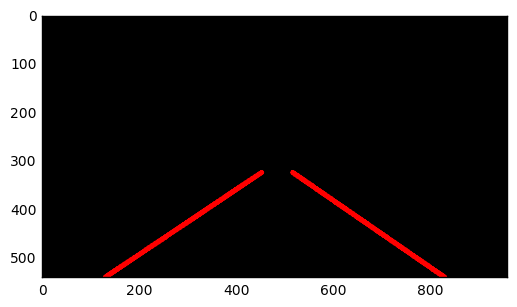

 51%|█████████████████████████████████████████▌                                       | 114/222 [01:16<01:14,  1.45it/s]

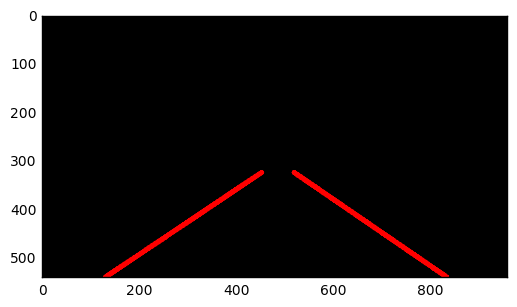

 52%|█████████████████████████████████████████▉                                       | 115/222 [01:17<01:15,  1.42it/s]

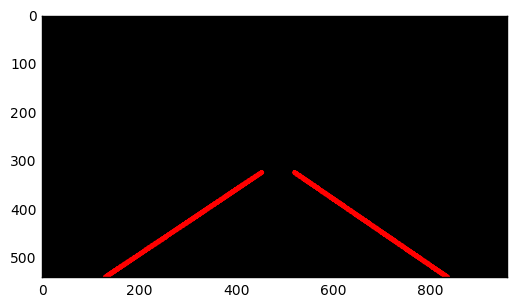

 52%|██████████████████████████████████████████▎                                      | 116/222 [01:18<01:14,  1.42it/s]

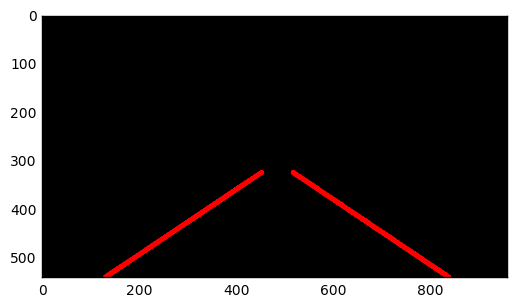

 53%|██████████████████████████████████████████▋                                      | 117/222 [01:18<01:13,  1.44it/s]

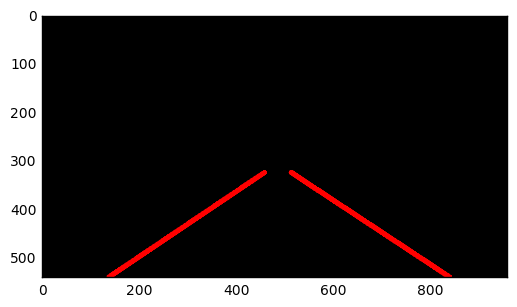

 53%|███████████████████████████████████████████                                      | 118/222 [01:19<01:19,  1.30it/s]

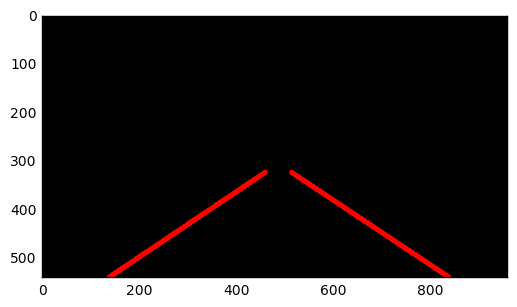

 54%|███████████████████████████████████████████▍                                     | 119/222 [01:20<01:11,  1.44it/s]

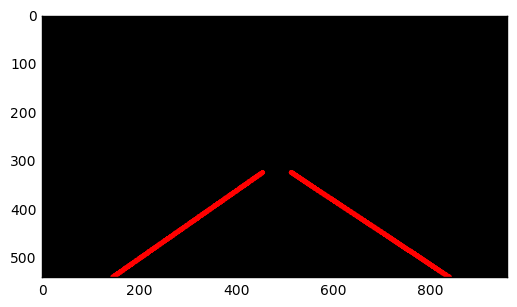

 54%|███████████████████████████████████████████▊                                     | 120/222 [01:20<01:05,  1.57it/s]

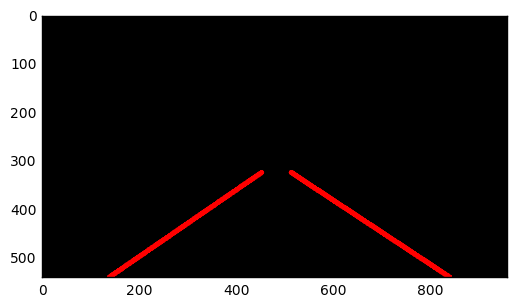

 55%|████████████████████████████████████████████▏                                    | 121/222 [01:21<01:01,  1.64it/s]

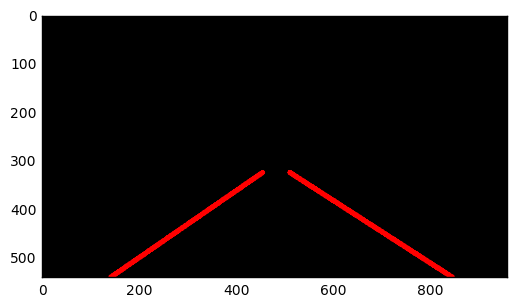

 55%|████████████████████████████████████████████▌                                    | 122/222 [01:21<00:58,  1.72it/s]

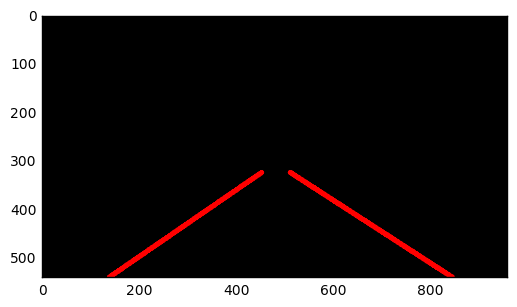

 55%|████████████████████████████████████████████▉                                    | 123/222 [01:22<01:04,  1.53it/s]

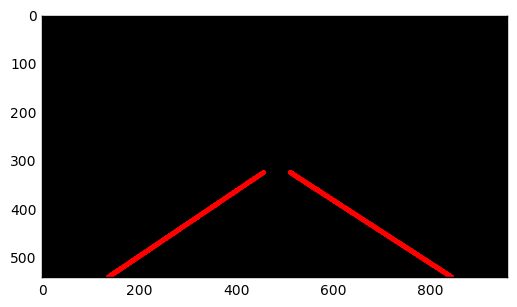

 56%|█████████████████████████████████████████████▏                                   | 124/222 [01:23<01:04,  1.53it/s]

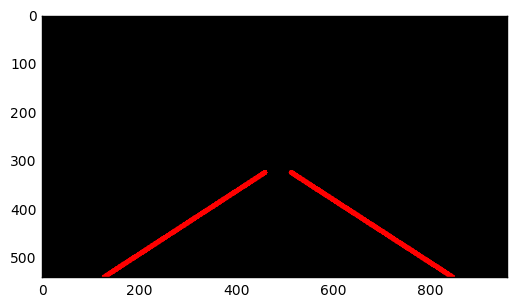

 56%|█████████████████████████████████████████████▌                                   | 125/222 [01:23<01:04,  1.50it/s]

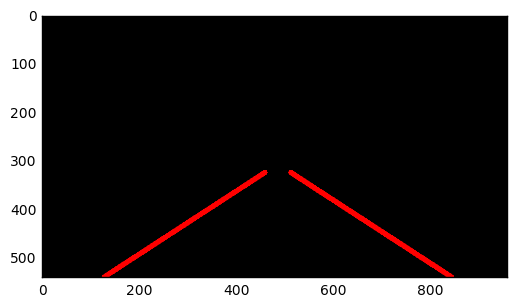

 57%|█████████████████████████████████████████████▉                                   | 126/222 [01:24<01:03,  1.52it/s]

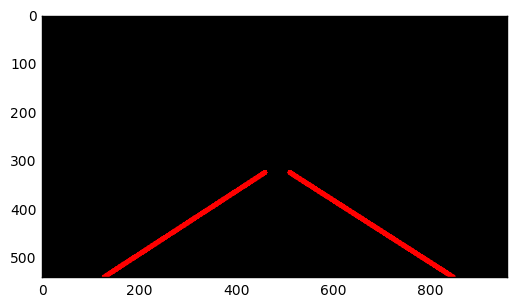

 57%|██████████████████████████████████████████████▎                                  | 127/222 [01:25<01:00,  1.57it/s]

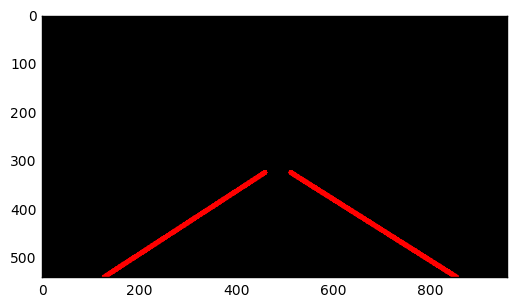

 58%|██████████████████████████████████████████████▋                                  | 128/222 [01:25<00:58,  1.62it/s]

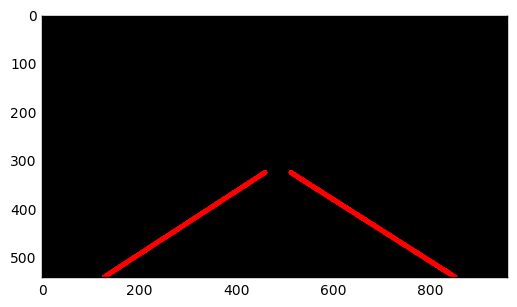

 58%|███████████████████████████████████████████████                                  | 129/222 [01:26<00:56,  1.64it/s]

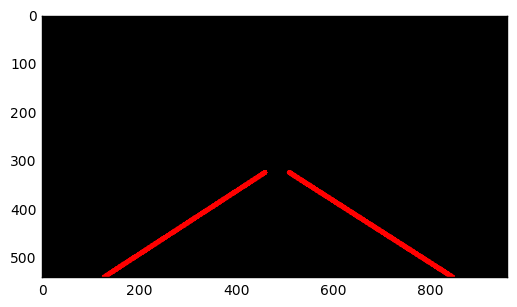

 59%|███████████████████████████████████████████████▍                                 | 130/222 [01:26<00:53,  1.72it/s]

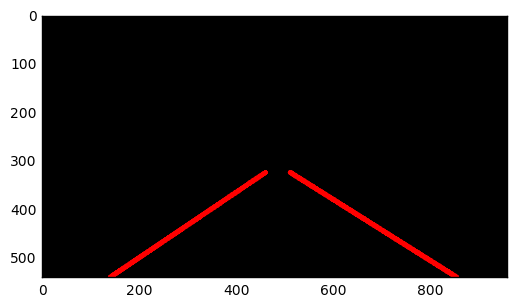

 59%|███████████████████████████████████████████████▊                                 | 131/222 [01:27<00:51,  1.78it/s]

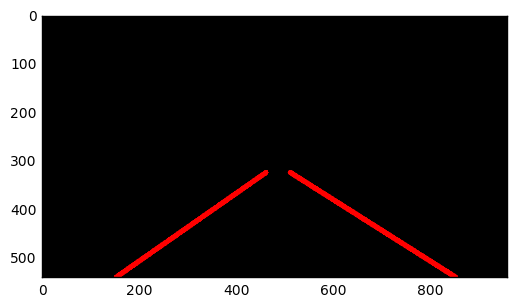

 59%|████████████████████████████████████████████████▏                                | 132/222 [01:27<00:48,  1.84it/s]

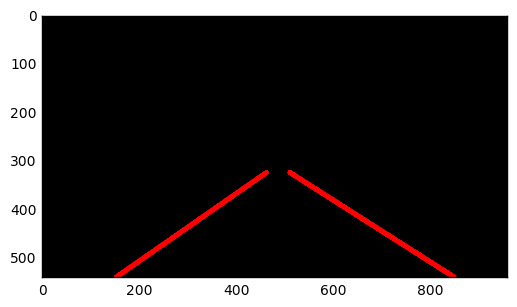

 60%|████████████████████████████████████████████████▌                                | 133/222 [01:28<00:48,  1.83it/s]

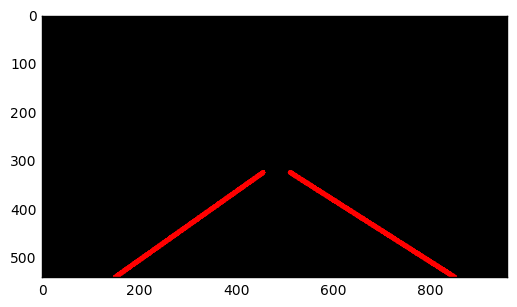

 60%|████████████████████████████████████████████████▉                                | 134/222 [01:29<00:54,  1.61it/s]

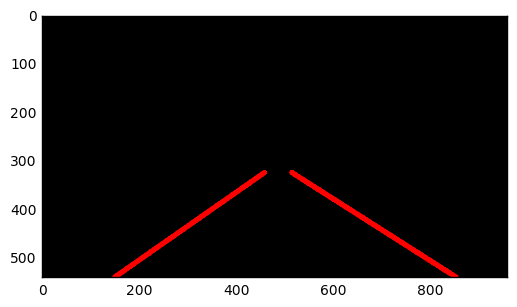

 61%|█████████████████████████████████████████████████▎                               | 135/222 [01:29<00:53,  1.61it/s]

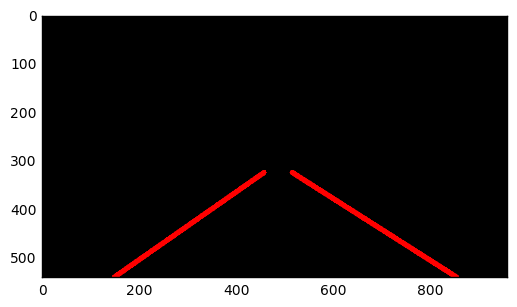

 61%|█████████████████████████████████████████████████▌                               | 136/222 [01:30<00:52,  1.63it/s]

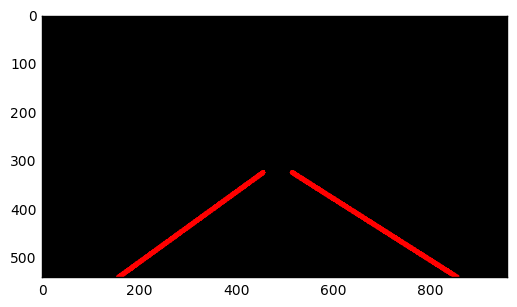

 62%|█████████████████████████████████████████████████▉                               | 137/222 [01:30<00:49,  1.71it/s]

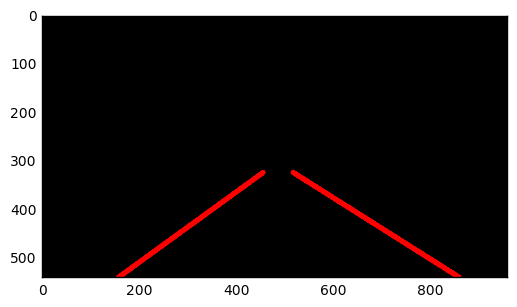

 62%|██████████████████████████████████████████████████▎                              | 138/222 [01:31<00:52,  1.59it/s]

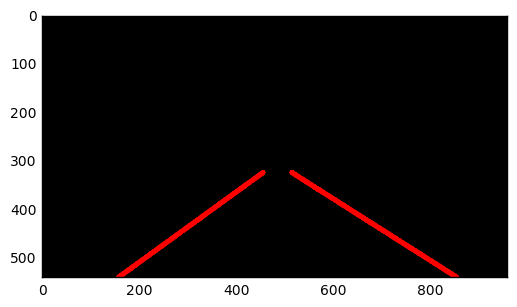

 63%|██████████████████████████████████████████████████▋                              | 139/222 [01:32<00:51,  1.60it/s]

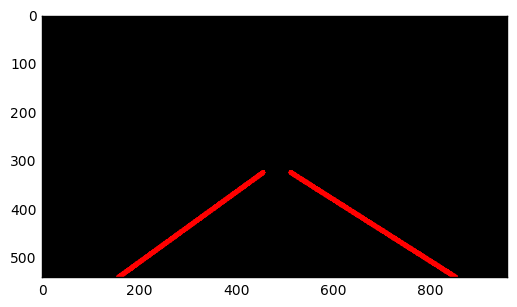

 63%|███████████████████████████████████████████████████                              | 140/222 [01:32<00:48,  1.68it/s]

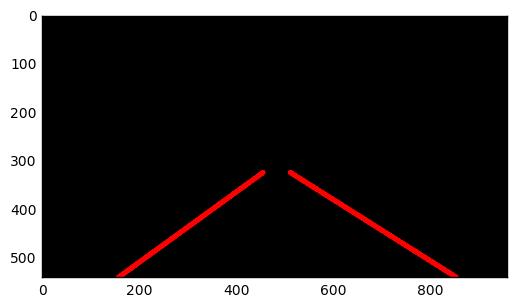

 64%|███████████████████████████████████████████████████▍                             | 141/222 [01:33<00:50,  1.60it/s]

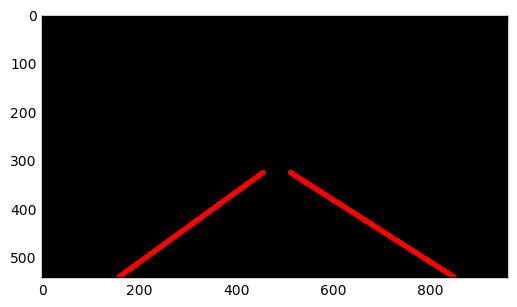

 64%|███████████████████████████████████████████████████▊                             | 142/222 [01:34<00:49,  1.61it/s]

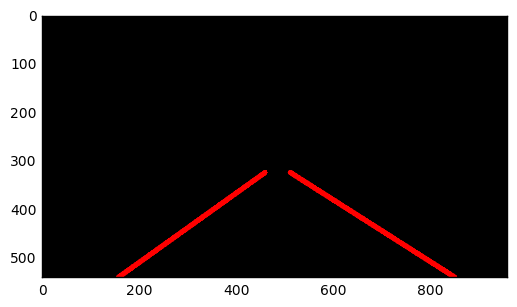

 64%|████████████████████████████████████████████████████▏                            | 143/222 [01:34<00:50,  1.57it/s]

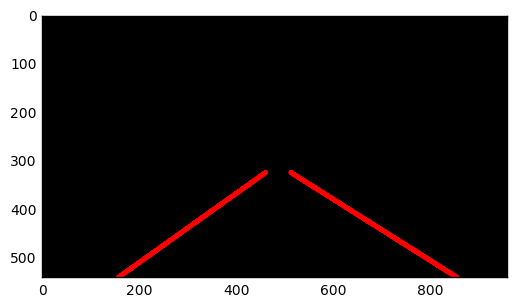

 65%|████████████████████████████████████████████████████▌                            | 144/222 [01:35<00:55,  1.41it/s]

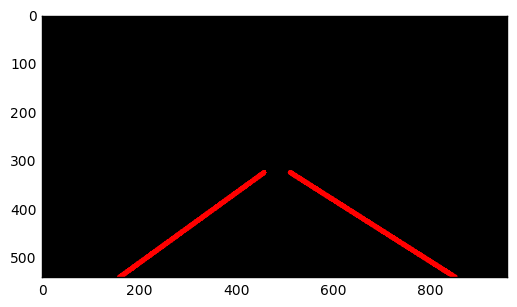

 65%|████████████████████████████████████████████████████▉                            | 145/222 [01:36<01:02,  1.23it/s]

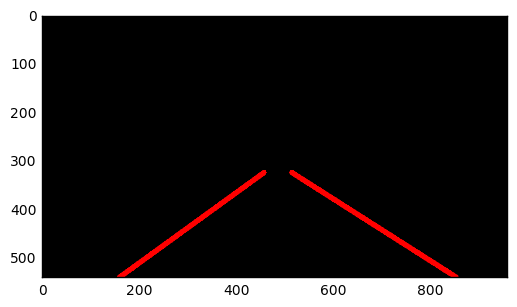

 66%|█████████████████████████████████████████████████████▎                           | 146/222 [01:37<01:04,  1.18it/s]

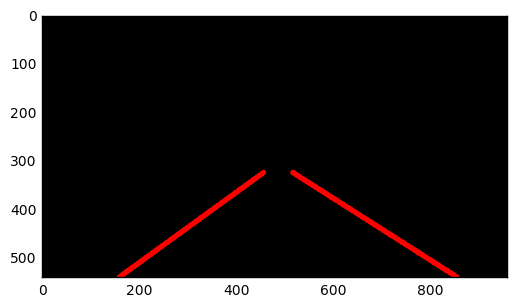

 66%|█████████████████████████████████████████████████████▋                           | 147/222 [01:38<01:01,  1.21it/s]

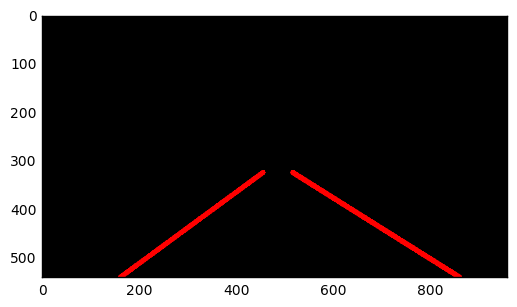

 67%|██████████████████████████████████████████████████████                           | 148/222 [01:39<00:57,  1.29it/s]

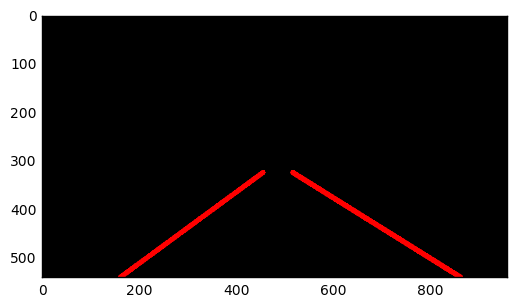

 67%|██████████████████████████████████████████████████████▎                          | 149/222 [01:39<00:53,  1.38it/s]

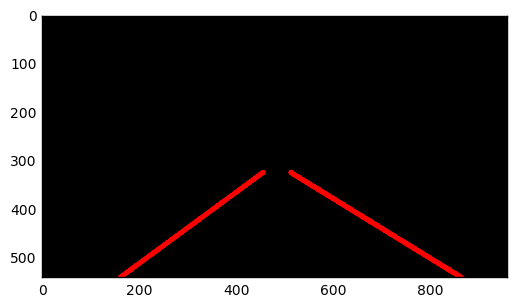

 68%|██████████████████████████████████████████████████████▋                          | 150/222 [01:40<00:52,  1.38it/s]

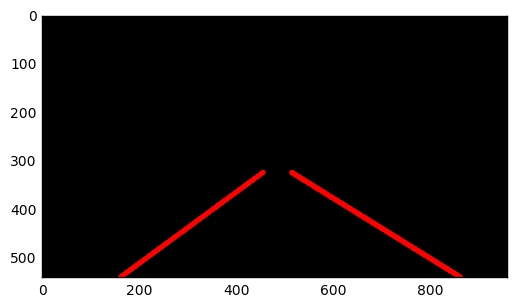

 68%|███████████████████████████████████████████████████████                          | 151/222 [01:40<00:48,  1.47it/s]

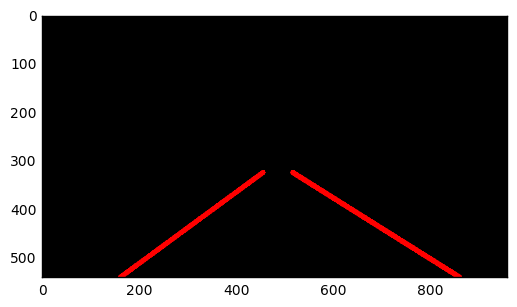

 68%|███████████████████████████████████████████████████████▍                         | 152/222 [01:41<00:45,  1.54it/s]

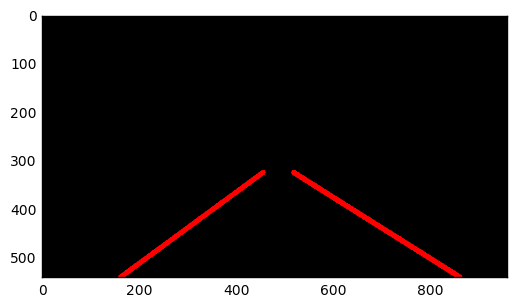

 69%|███████████████████████████████████████████████████████▊                         | 153/222 [01:42<00:46,  1.49it/s]

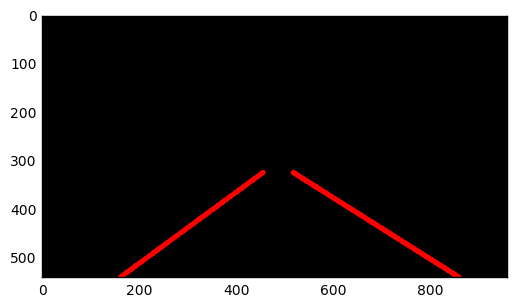

 69%|████████████████████████████████████████████████████████▏                        | 154/222 [01:42<00:43,  1.56it/s]

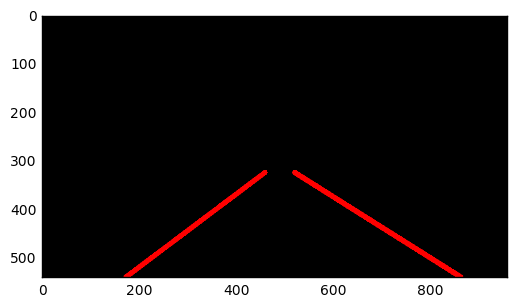

 70%|████████████████████████████████████████████████████████▌                        | 155/222 [01:43<00:40,  1.65it/s]

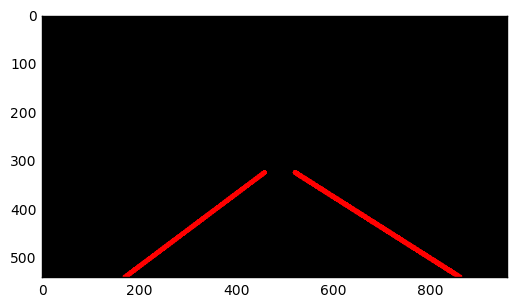

 70%|████████████████████████████████████████████████████████▉                        | 156/222 [01:44<00:48,  1.36it/s]

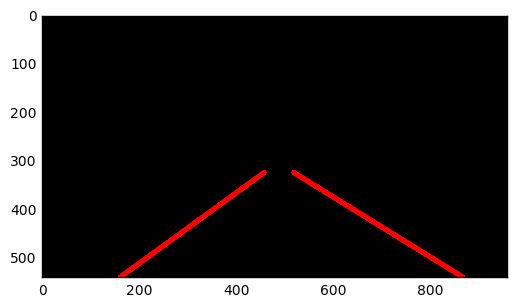

 71%|█████████████████████████████████████████████████████████▎                       | 157/222 [01:45<00:46,  1.40it/s]

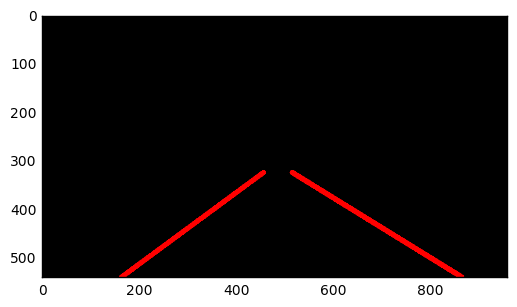

 71%|█████████████████████████████████████████████████████████▋                       | 158/222 [01:45<00:43,  1.49it/s]

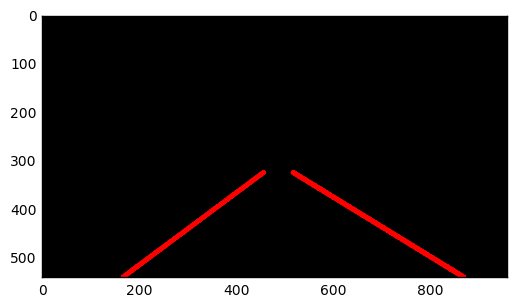

 72%|██████████████████████████████████████████████████████████                       | 159/222 [01:46<00:42,  1.48it/s]

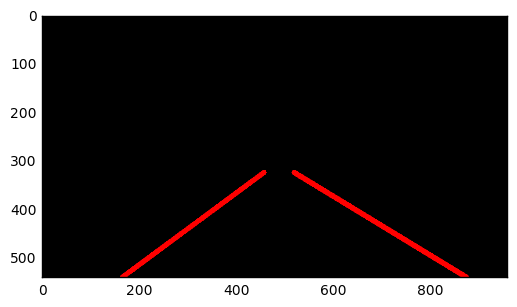

 72%|██████████████████████████████████████████████████████████▍                      | 160/222 [01:46<00:40,  1.54it/s]

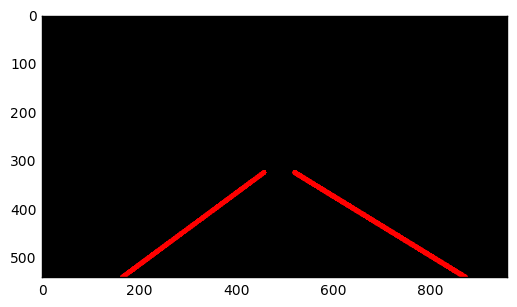

 73%|██████████████████████████████████████████████████████████▋                      | 161/222 [01:47<00:38,  1.57it/s]

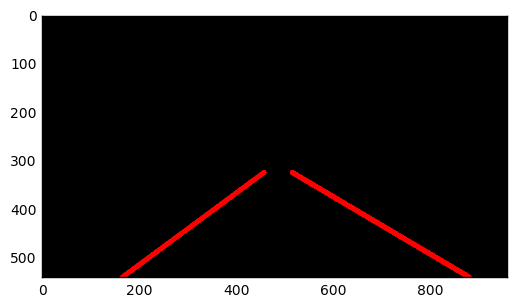

 73%|███████████████████████████████████████████████████████████                      | 162/222 [01:48<00:37,  1.61it/s]

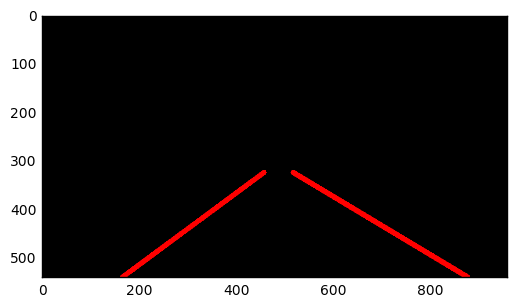

 73%|███████████████████████████████████████████████████████████▍                     | 163/222 [01:48<00:35,  1.69it/s]

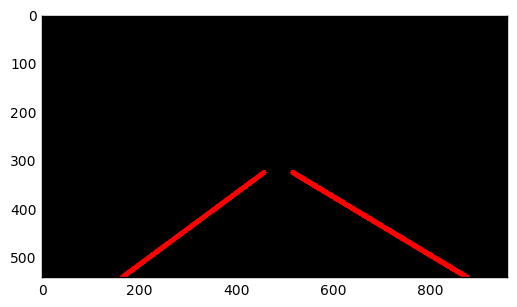

 74%|███████████████████████████████████████████████████████████▊                     | 164/222 [01:49<00:33,  1.72it/s]

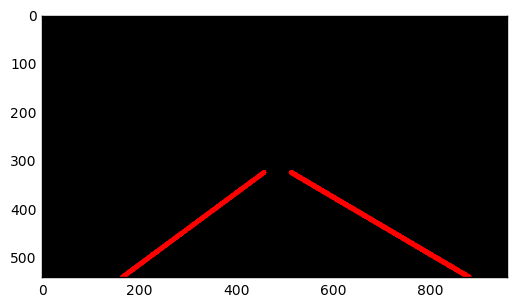

 74%|████████████████████████████████████████████████████████████▏                    | 165/222 [01:49<00:31,  1.79it/s]

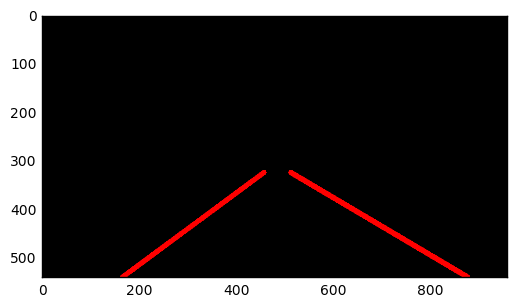

 75%|████████████████████████████████████████████████████████████▌                    | 166/222 [01:50<00:30,  1.82it/s]

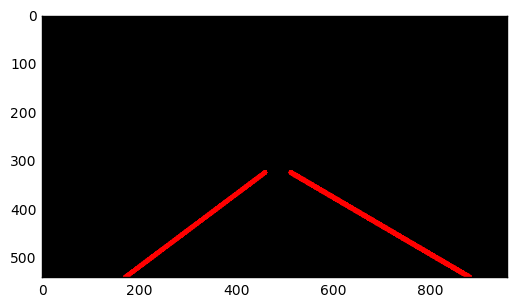

 75%|████████████████████████████████████████████████████████████▉                    | 167/222 [01:51<00:34,  1.58it/s]

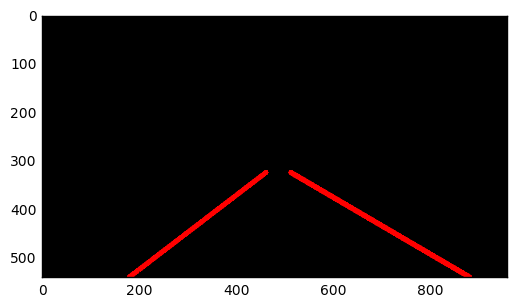

 76%|█████████████████████████████████████████████████████████████▎                   | 168/222 [01:51<00:35,  1.52it/s]

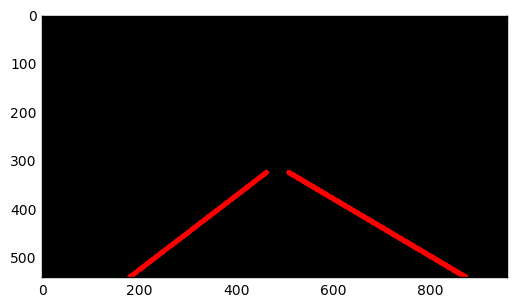

 76%|█████████████████████████████████████████████████████████████▋                   | 169/222 [01:52<00:33,  1.56it/s]

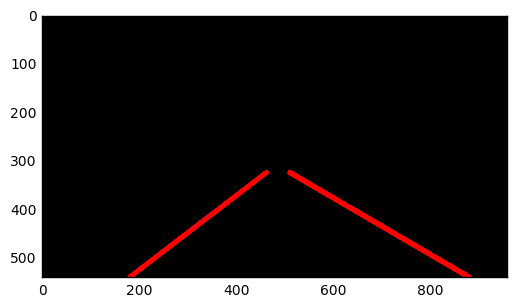

 77%|██████████████████████████████████████████████████████████████                   | 170/222 [01:52<00:31,  1.67it/s]

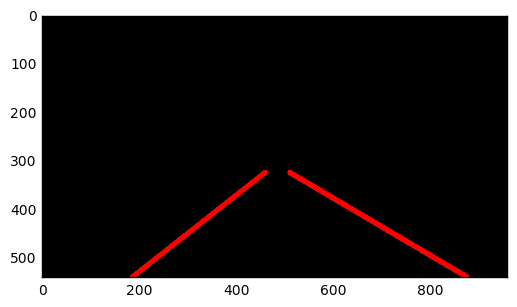

 77%|██████████████████████████████████████████████████████████████▍                  | 171/222 [01:53<00:29,  1.73it/s]

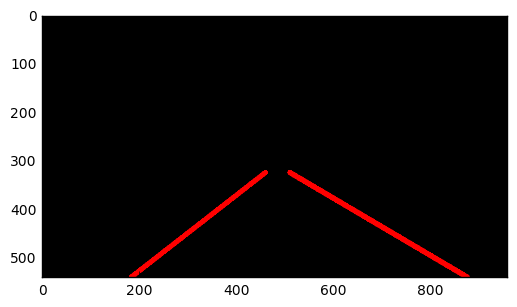

 77%|██████████████████████████████████████████████████████████████▊                  | 172/222 [01:53<00:27,  1.79it/s]

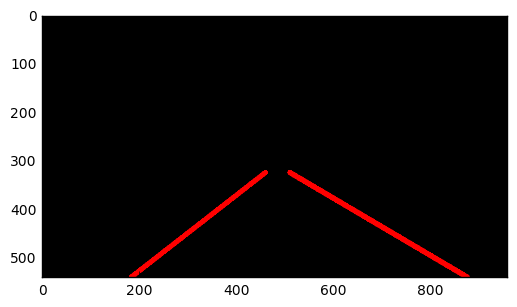

 78%|███████████████████████████████████████████████████████████████                  | 173/222 [01:54<00:27,  1.81it/s]

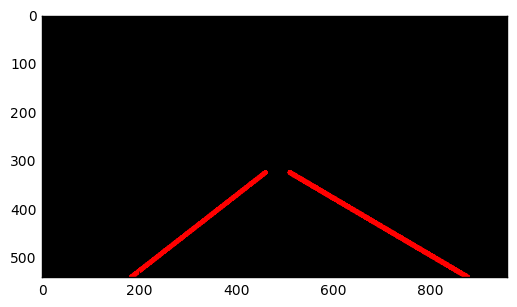

 78%|███████████████████████████████████████████████████████████████▍                 | 174/222 [01:54<00:26,  1.84it/s]

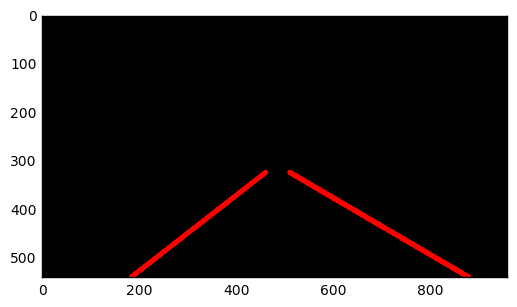

 79%|███████████████████████████████████████████████████████████████▊                 | 175/222 [01:55<00:25,  1.87it/s]

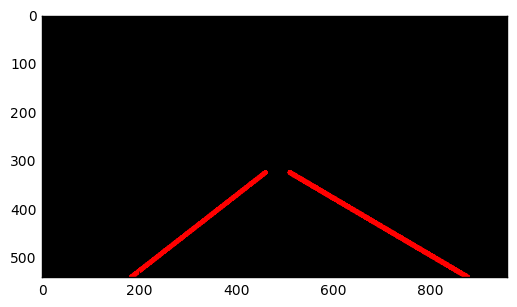

 79%|████████████████████████████████████████████████████████████████▏                | 176/222 [01:56<00:24,  1.88it/s]

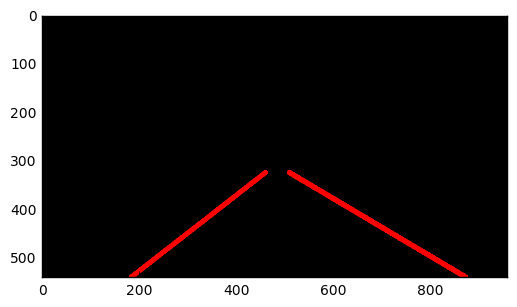

 80%|████████████████████████████████████████████████████████████████▌                | 177/222 [01:56<00:25,  1.80it/s]

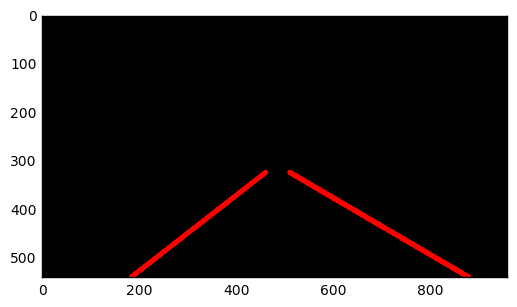

 80%|████████████████████████████████████████████████████████████████▉                | 178/222 [01:57<00:29,  1.49it/s]

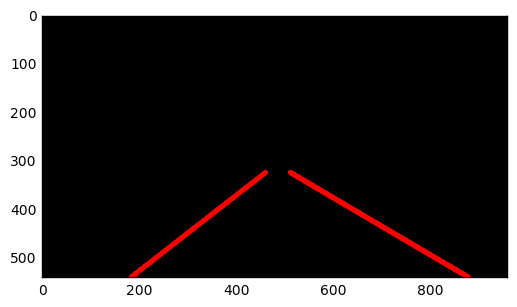

 81%|█████████████████████████████████████████████████████████████████▎               | 179/222 [01:58<00:27,  1.57it/s]

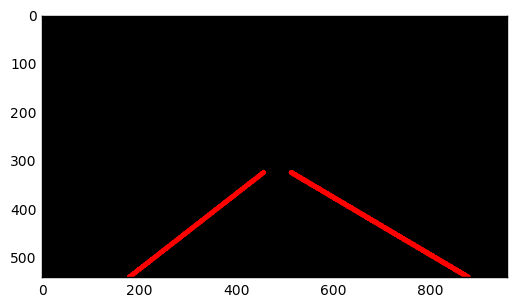

 81%|█████████████████████████████████████████████████████████████████▋               | 180/222 [01:58<00:25,  1.67it/s]

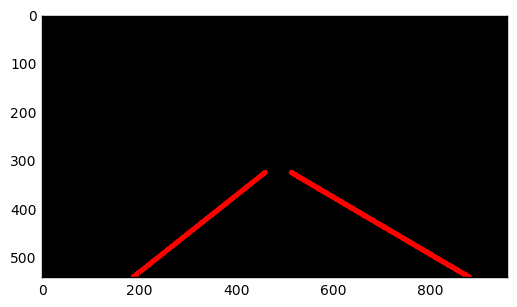

 82%|██████████████████████████████████████████████████████████████████               | 181/222 [01:59<00:23,  1.72it/s]

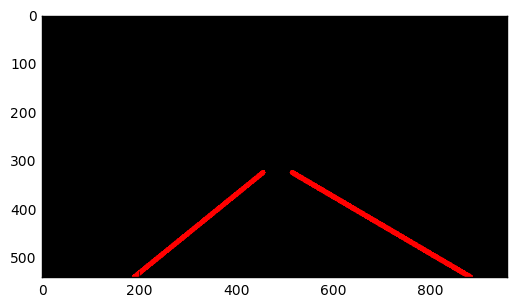

 82%|██████████████████████████████████████████████████████████████████▍              | 182/222 [01:59<00:22,  1.80it/s]

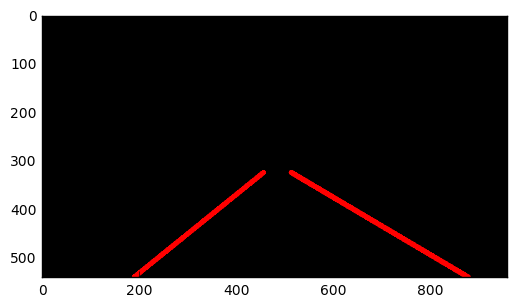

 82%|██████████████████████████████████████████████████████████████████▊              | 183/222 [02:00<00:21,  1.82it/s]

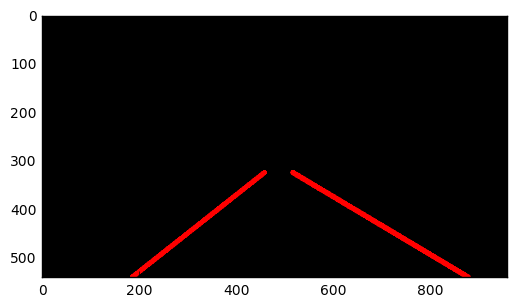

 83%|███████████████████████████████████████████████████████████████████▏             | 184/222 [02:00<00:20,  1.86it/s]

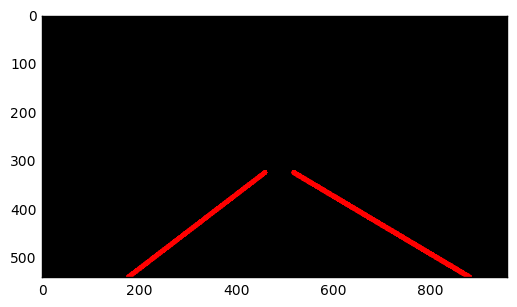

 83%|███████████████████████████████████████████████████████████████████▌             | 185/222 [02:01<00:19,  1.87it/s]

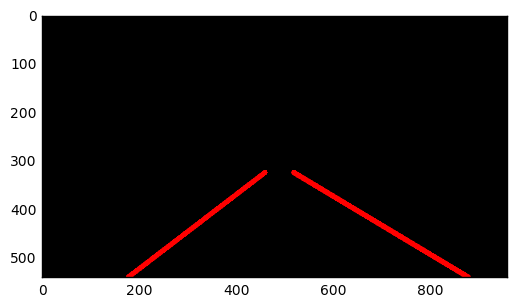

 84%|███████████████████████████████████████████████████████████████████▊             | 186/222 [02:01<00:19,  1.88it/s]

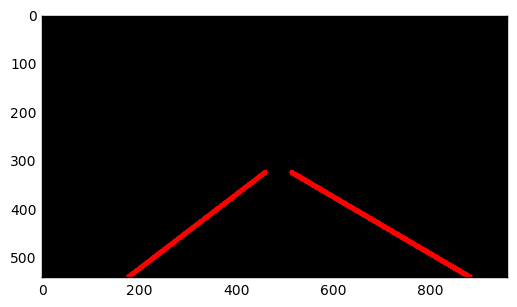

 84%|████████████████████████████████████████████████████████████████████▏            | 187/222 [02:02<00:18,  1.89it/s]

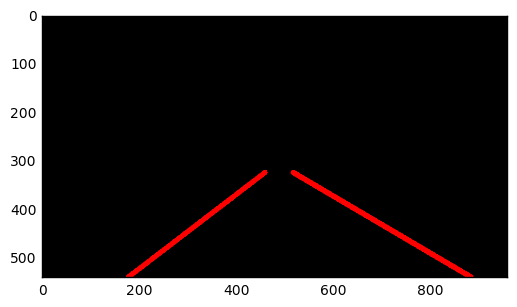

 85%|████████████████████████████████████████████████████████████████████▌            | 188/222 [02:02<00:17,  1.90it/s]

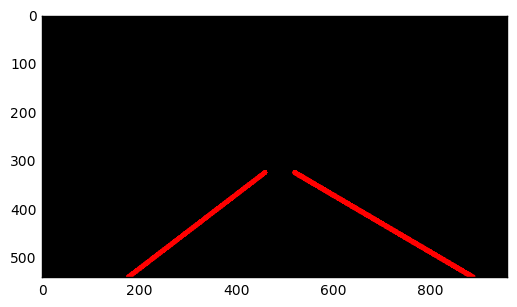

 85%|████████████████████████████████████████████████████████████████████▉            | 189/222 [02:03<00:19,  1.70it/s]

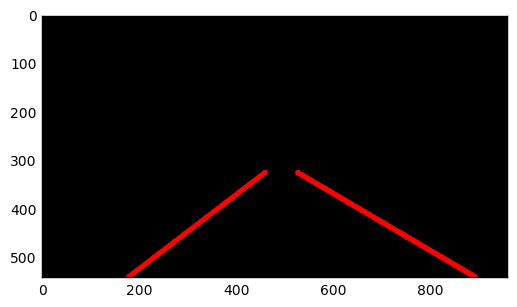

 86%|█████████████████████████████████████████████████████████████████████▎           | 190/222 [02:04<00:18,  1.75it/s]

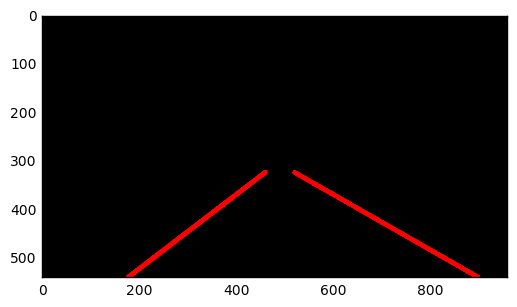

 86%|█████████████████████████████████████████████████████████████████████▋           | 191/222 [02:04<00:17,  1.81it/s]

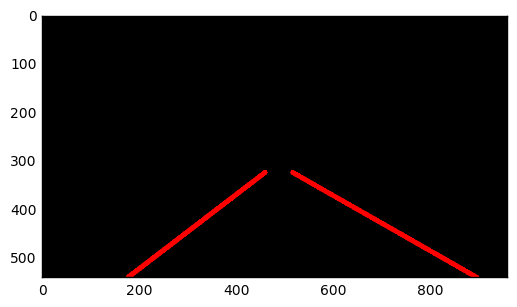

 86%|██████████████████████████████████████████████████████████████████████           | 192/222 [02:05<00:16,  1.80it/s]

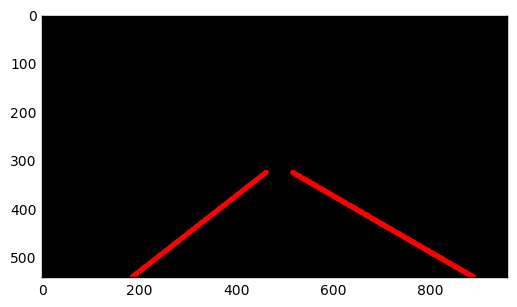

 87%|██████████████████████████████████████████████████████████████████████▍          | 193/222 [02:05<00:15,  1.85it/s]

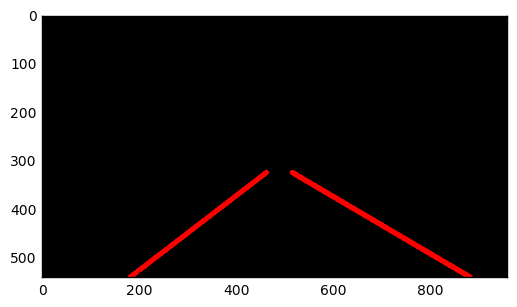

 87%|██████████████████████████████████████████████████████████████████████▊          | 194/222 [02:06<00:15,  1.84it/s]

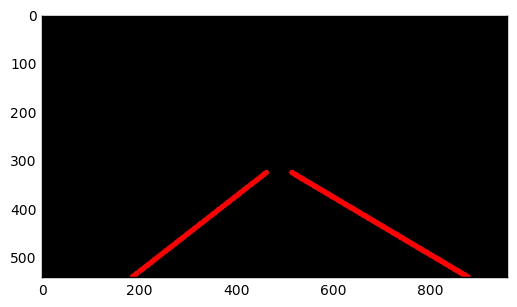

 88%|███████████████████████████████████████████████████████████████████████▏         | 195/222 [02:06<00:14,  1.82it/s]

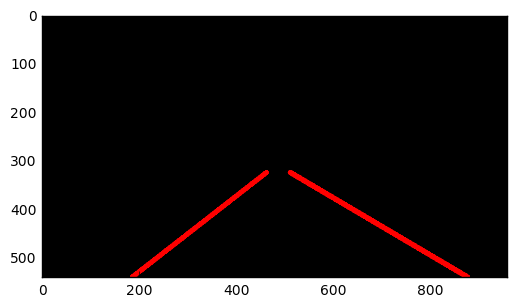

 88%|███████████████████████████████████████████████████████████████████████▌         | 196/222 [02:07<00:14,  1.74it/s]

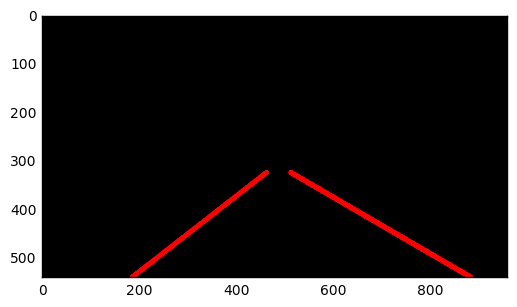

 89%|███████████████████████████████████████████████████████████████████████▉         | 197/222 [02:07<00:13,  1.79it/s]

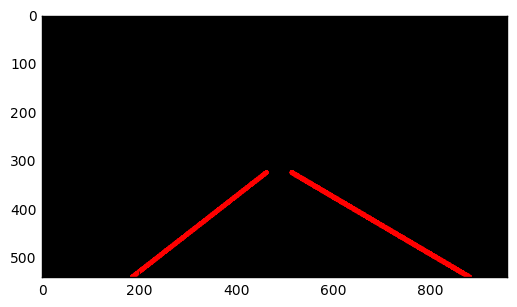

 89%|████████████████████████████████████████████████████████████████████████▏        | 198/222 [02:08<00:13,  1.82it/s]

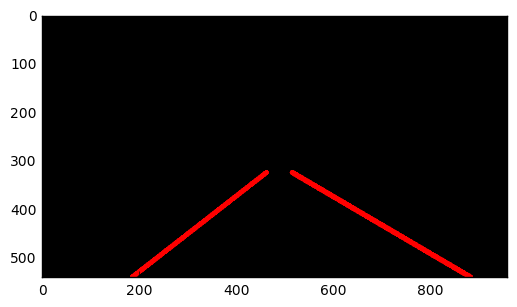

 90%|████████████████████████████████████████████████████████████████████████▌        | 199/222 [02:08<00:12,  1.84it/s]

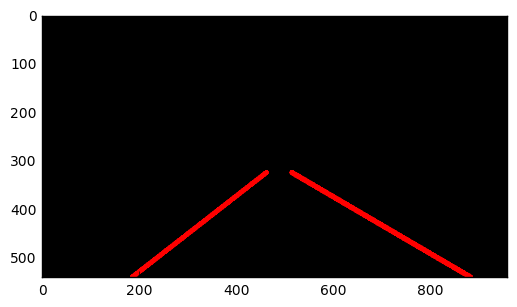

 90%|████████████████████████████████████████████████████████████████████████▉        | 200/222 [02:09<00:13,  1.67it/s]

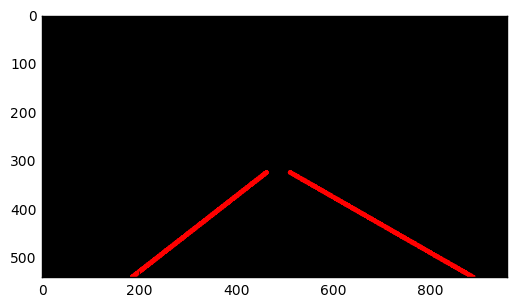

 91%|█████████████████████████████████████████████████████████████████████████▎       | 201/222 [02:10<00:12,  1.73it/s]

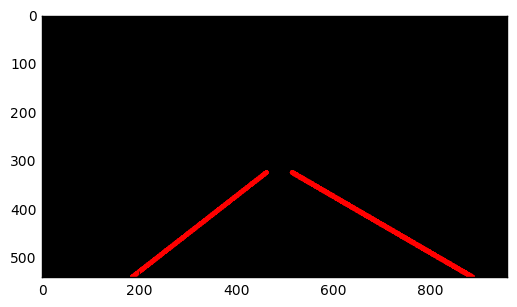

 91%|█████████████████████████████████████████████████████████████████████████▋       | 202/222 [02:10<00:11,  1.79it/s]

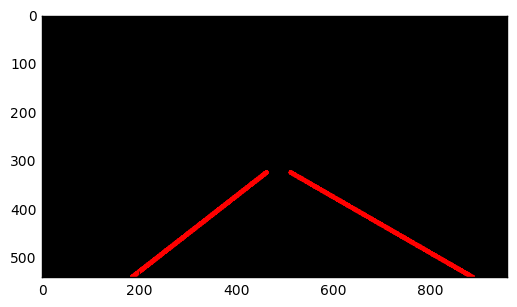

 91%|██████████████████████████████████████████████████████████████████████████       | 203/222 [02:11<00:10,  1.80it/s]

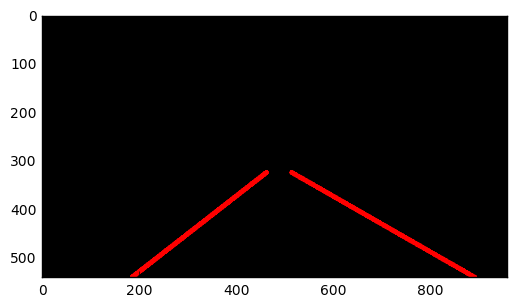

 92%|██████████████████████████████████████████████████████████████████████████▍      | 204/222 [02:11<00:09,  1.81it/s]

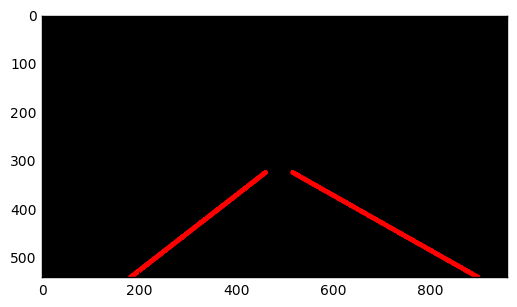

 92%|██████████████████████████████████████████████████████████████████████████▊      | 205/222 [02:12<00:09,  1.79it/s]

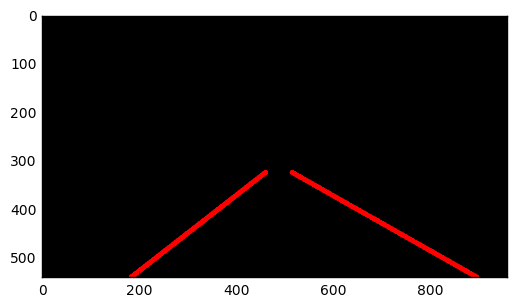

 93%|███████████████████████████████████████████████████████████████████████████▏     | 206/222 [02:13<00:09,  1.70it/s]

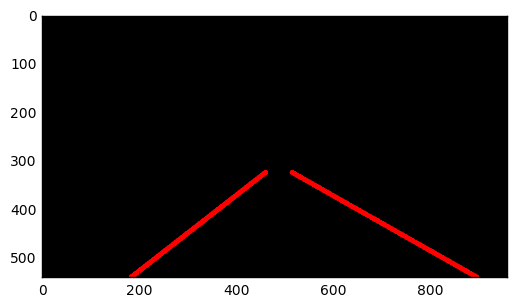

 93%|███████████████████████████████████████████████████████████████████████████▌     | 207/222 [02:13<00:08,  1.76it/s]

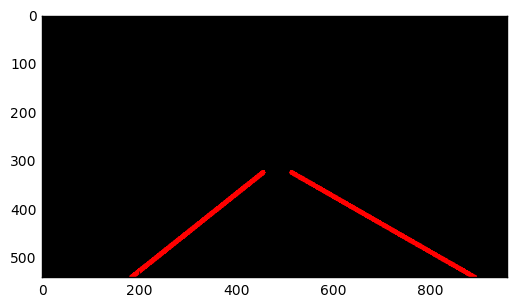

 94%|███████████████████████████████████████████████████████████████████████████▉     | 208/222 [02:14<00:07,  1.77it/s]

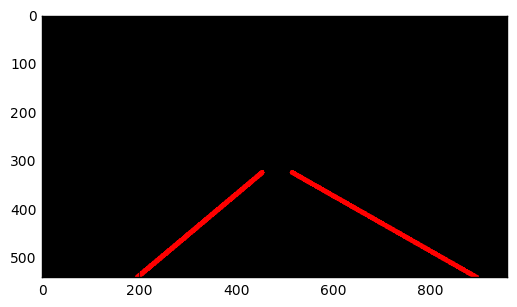

 94%|████████████████████████████████████████████████████████████████████████████▎    | 209/222 [02:14<00:07,  1.80it/s]

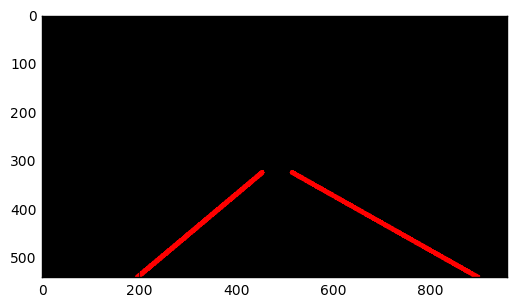

 95%|████████████████████████████████████████████████████████████████████████████▌    | 210/222 [02:15<00:06,  1.82it/s]

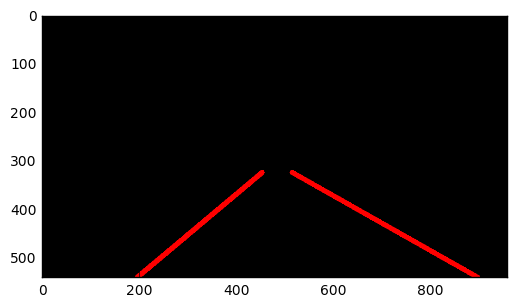

 95%|████████████████████████████████████████████████████████████████████████████▉    | 211/222 [02:15<00:06,  1.67it/s]

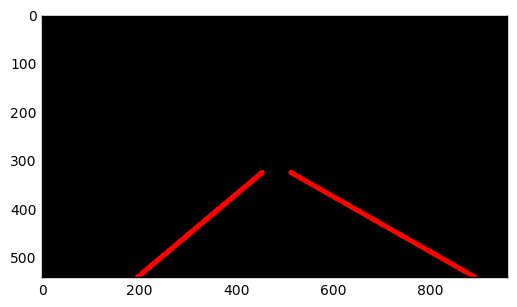

 95%|█████████████████████████████████████████████████████████████████████████████▎   | 212/222 [02:16<00:05,  1.72it/s]

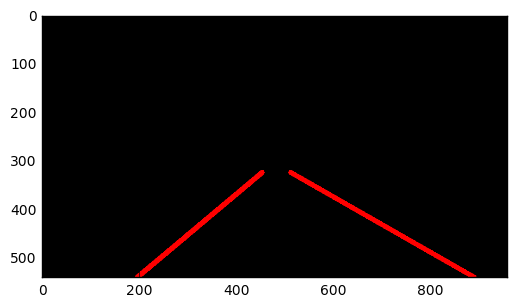

 96%|█████████████████████████████████████████████████████████████████████████████▋   | 213/222 [02:16<00:05,  1.78it/s]

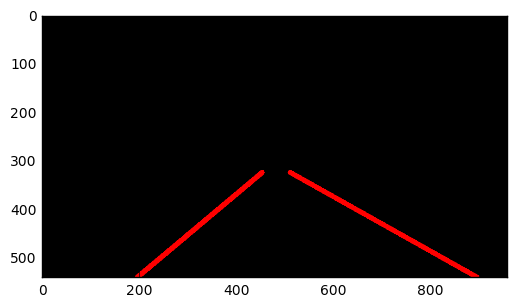

 96%|██████████████████████████████████████████████████████████████████████████████   | 214/222 [02:17<00:04,  1.83it/s]

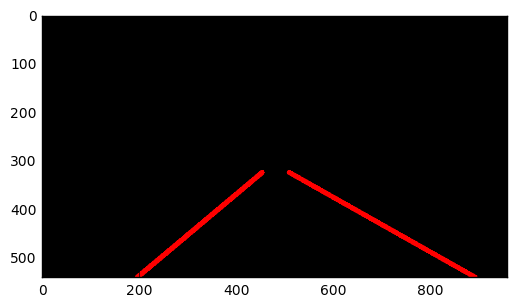

 97%|██████████████████████████████████████████████████████████████████████████████▍  | 215/222 [02:18<00:03,  1.84it/s]

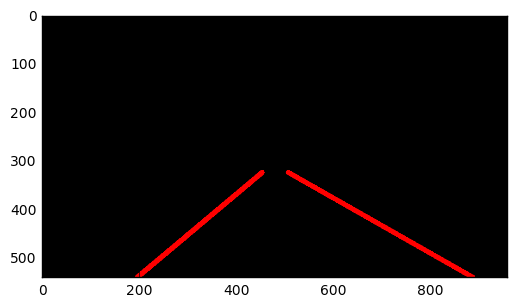

 97%|██████████████████████████████████████████████████████████████████████████████▊  | 216/222 [02:18<00:03,  1.87it/s]

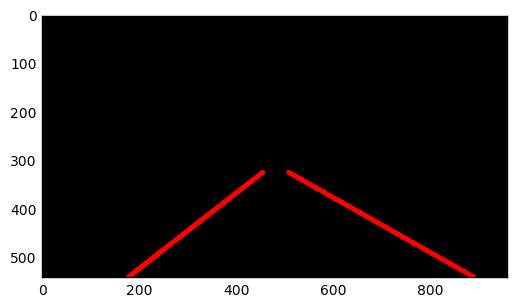

 98%|███████████████████████████████████████████████████████████████████████████████▏ | 217/222 [02:19<00:02,  1.89it/s]

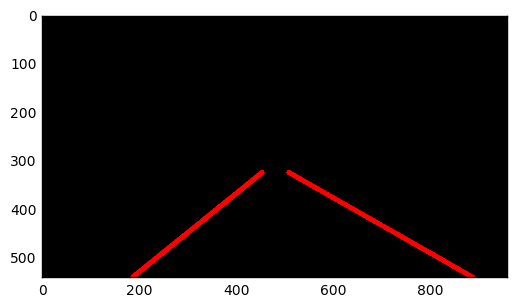

 98%|███████████████████████████████████████████████████████████████████████████████▌ | 218/222 [02:19<00:02,  1.93it/s]

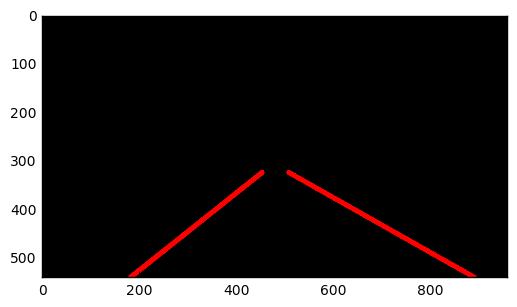

 99%|███████████████████████████████████████████████████████████████████████████████▉ | 219/222 [02:20<00:01,  1.88it/s]

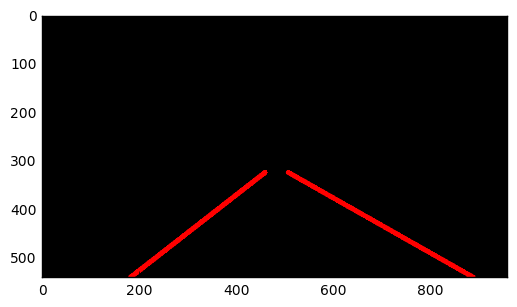

 99%|████████████████████████████████████████████████████████████████████████████████▎| 220/222 [02:20<00:01,  1.89it/s]

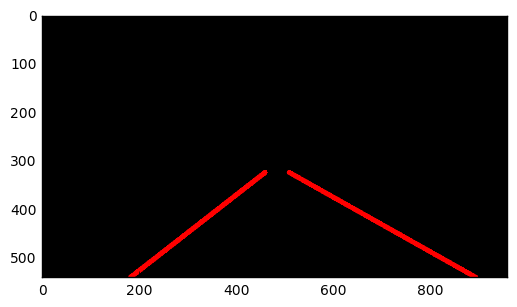

100%|████████████████████████████████████████████████████████████████████████████████▋| 221/222 [02:21<00:00,  1.86it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: white.mp4 

Wall time: 2min 22s


In [14]:
white_output = 'white.mp4'
clip1 = VideoFileClip("solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

**At this point, if you were successful you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform.  Modify your draw_lines function accordingly and try re-running your pipeline.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

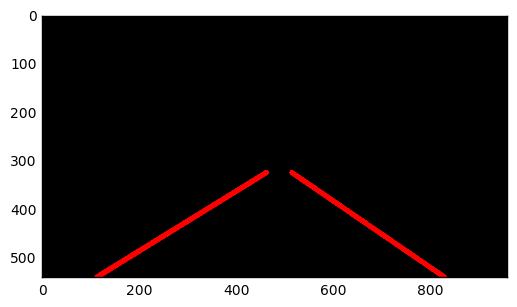

[MoviePy] >>>> Building video yellow.mp4
[MoviePy] Writing video yellow.mp4


  0%|                                                                                           | 0/682 [00:00<?, ?it/s]

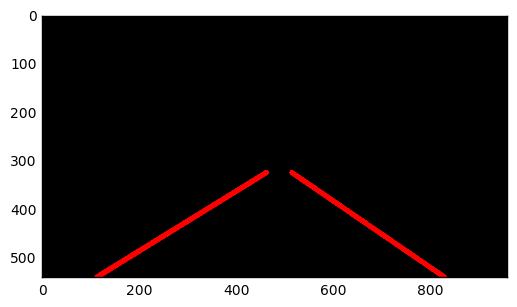

  0%|                                                                                   | 1/682 [00:00<07:47,  1.46it/s]

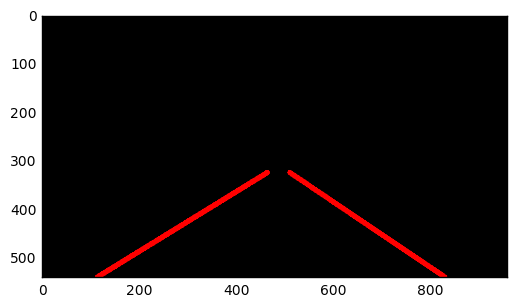

  0%|▏                                                                                  | 2/682 [00:01<07:47,  1.46it/s]

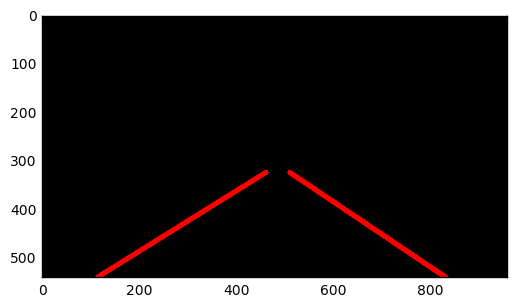

  0%|▎                                                                                  | 3/682 [00:02<09:49,  1.15it/s]

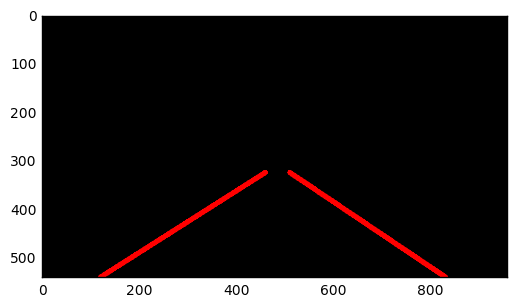

  1%|▍                                                                                  | 4/682 [00:03<10:44,  1.05it/s]

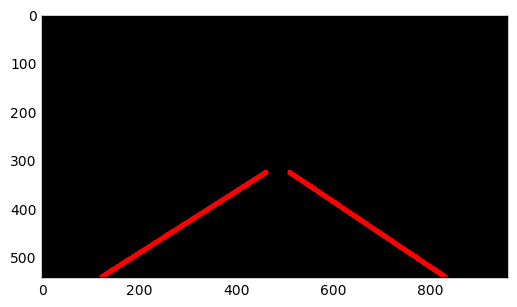

  1%|▌                                                                                  | 5/682 [00:04<10:37,  1.06it/s]

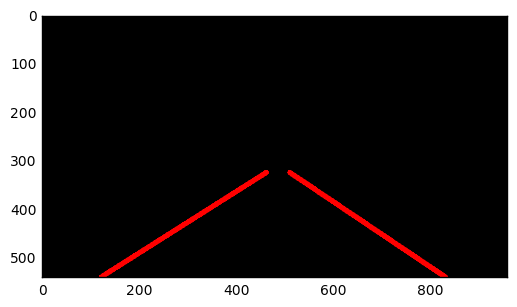

  1%|▋                                                                                  | 6/682 [00:05<11:05,  1.02it/s]

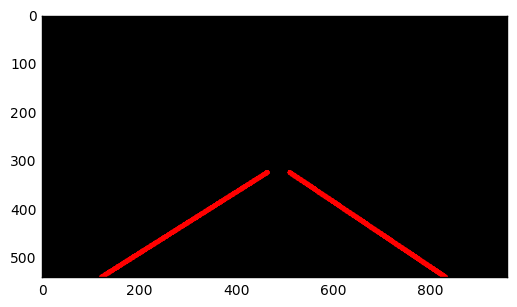

  1%|▊                                                                                  | 7/682 [00:06<10:50,  1.04it/s]

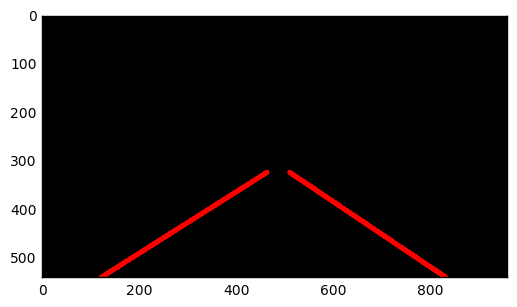

  1%|▉                                                                                  | 8/682 [00:07<09:35,  1.17it/s]

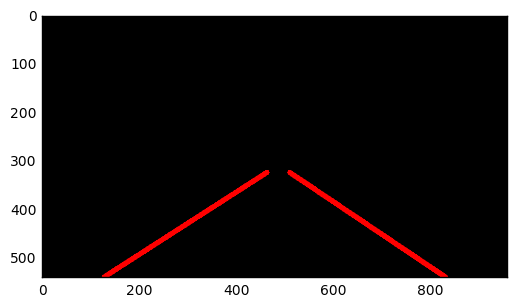

  1%|█                                                                                  | 9/682 [00:07<08:33,  1.31it/s]

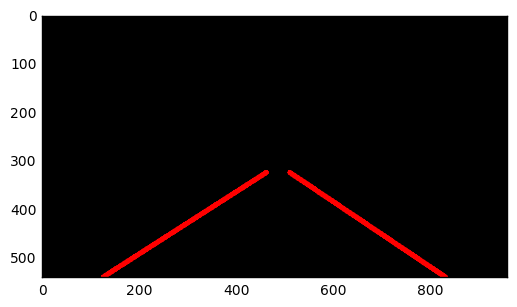

  1%|█▏                                                                                | 10/682 [00:08<07:49,  1.43it/s]

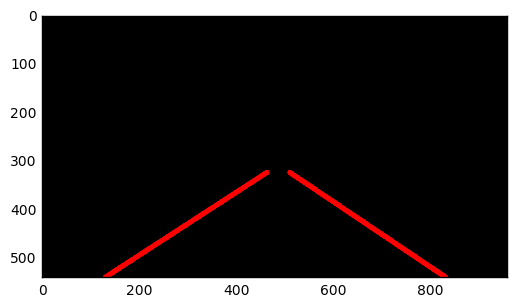

  2%|█▎                                                                                | 11/682 [00:09<08:00,  1.40it/s]

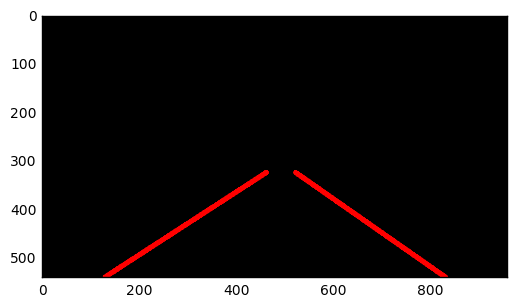

  2%|█▍                                                                                | 12/682 [00:09<07:59,  1.40it/s]

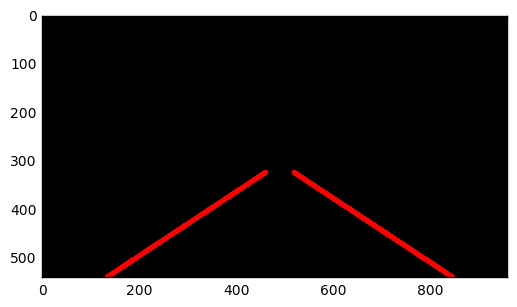

  2%|█▌                                                                                | 13/682 [00:10<07:34,  1.47it/s]

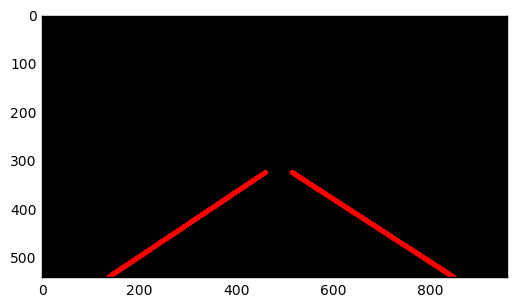

  2%|█▋                                                                                | 14/682 [00:11<07:07,  1.56it/s]

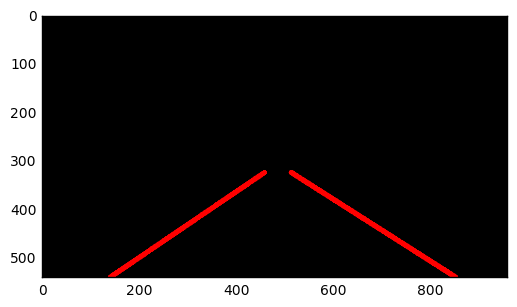

  2%|█▊                                                                                | 15/682 [00:11<06:39,  1.67it/s]

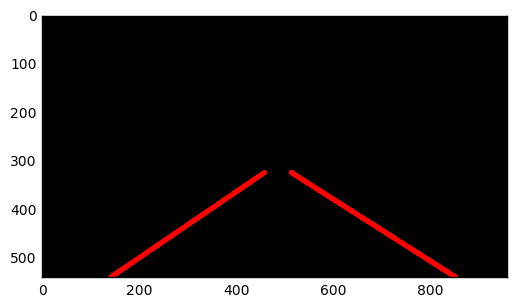

  2%|█▉                                                                                | 16/682 [00:12<06:26,  1.72it/s]

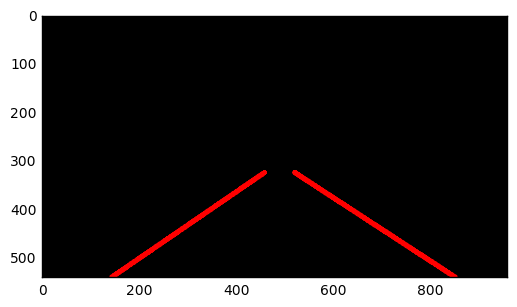

  2%|██                                                                                | 17/682 [00:12<06:09,  1.80it/s]

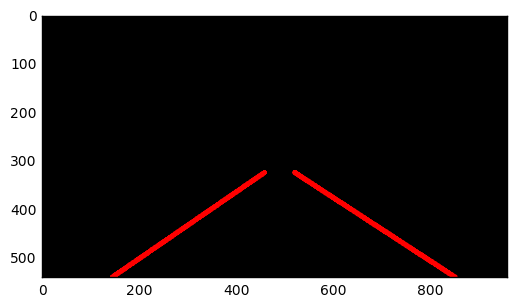

  3%|██▏                                                                               | 18/682 [00:13<06:06,  1.81it/s]

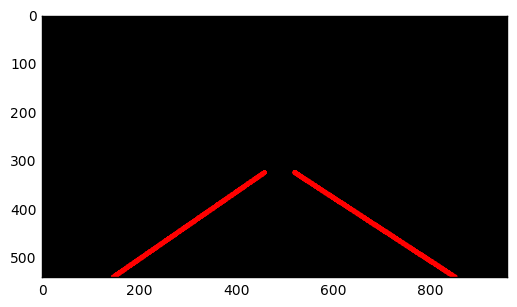

  3%|██▎                                                                               | 19/682 [00:13<05:53,  1.87it/s]

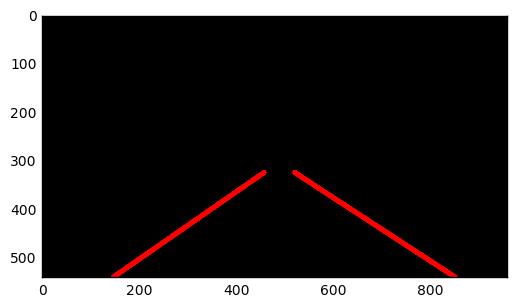

  3%|██▍                                                                               | 20/682 [00:14<05:49,  1.89it/s]

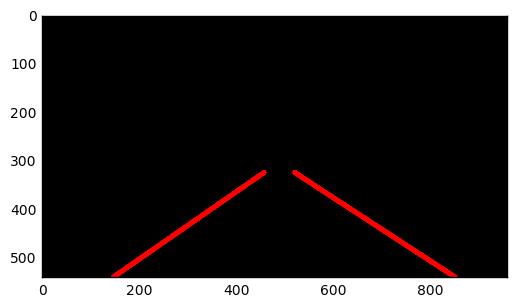

  3%|██▌                                                                               | 21/682 [00:14<05:43,  1.92it/s]

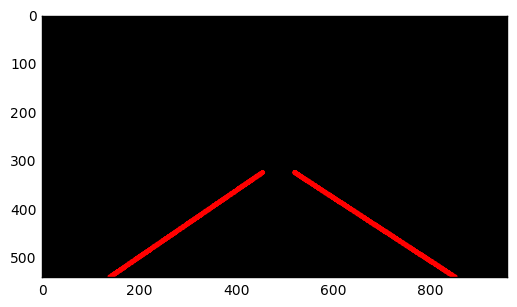

  3%|██▋                                                                               | 22/682 [00:15<06:51,  1.60it/s]

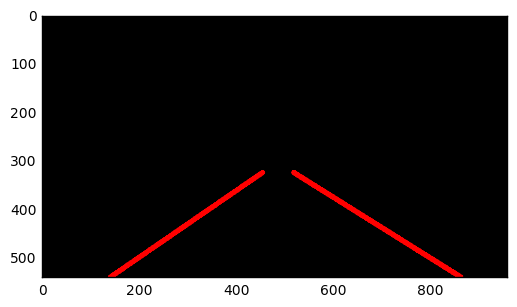

  3%|██▊                                                                               | 23/682 [00:16<06:38,  1.65it/s]

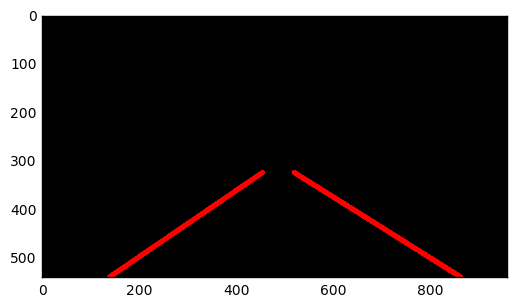

  4%|██▉                                                                               | 24/682 [00:16<06:29,  1.69it/s]

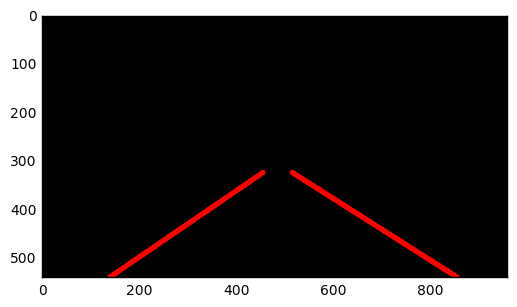

  4%|███                                                                               | 25/682 [00:17<06:25,  1.70it/s]

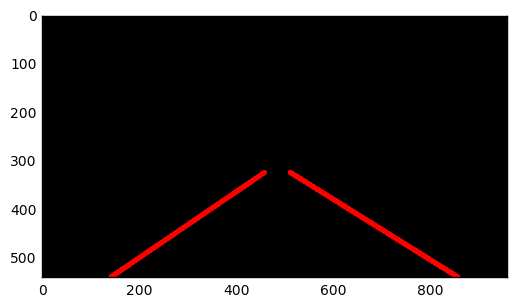

  4%|███▏                                                                              | 26/682 [00:17<06:15,  1.75it/s]

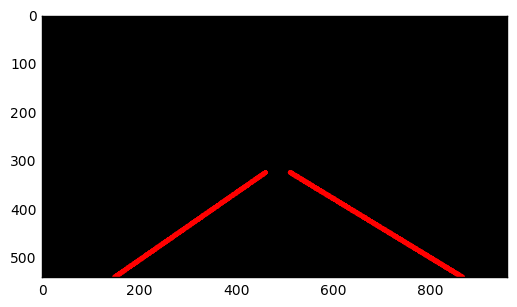

  4%|███▏                                                                              | 27/682 [00:18<06:06,  1.79it/s]

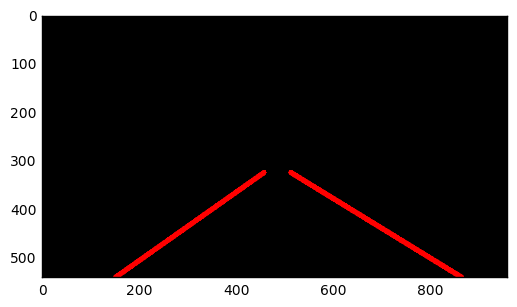

  4%|███▎                                                                              | 28/682 [00:18<06:01,  1.81it/s]

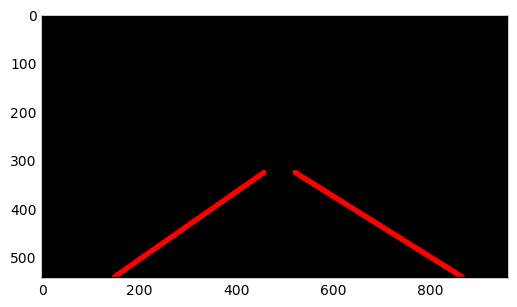

  4%|███▍                                                                              | 29/682 [00:19<05:47,  1.88it/s]

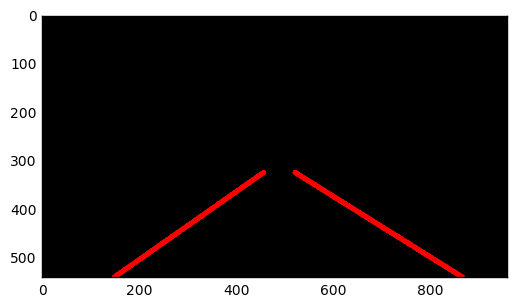

  4%|███▌                                                                              | 30/682 [00:19<05:41,  1.91it/s]

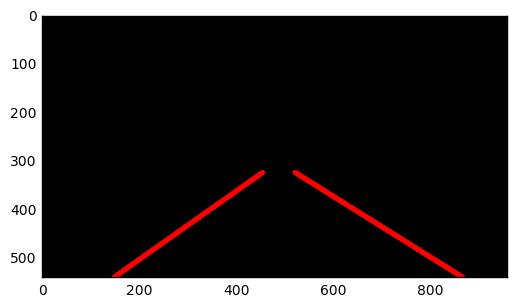

  5%|███▋                                                                              | 31/682 [00:20<05:34,  1.94it/s]

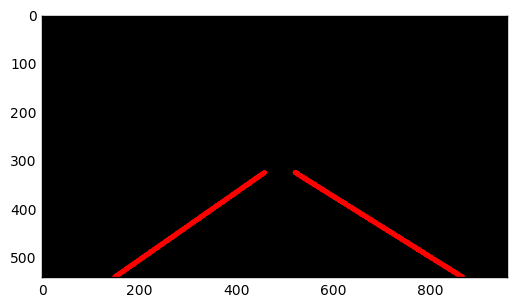

  5%|███▊                                                                              | 32/682 [00:20<05:37,  1.93it/s]

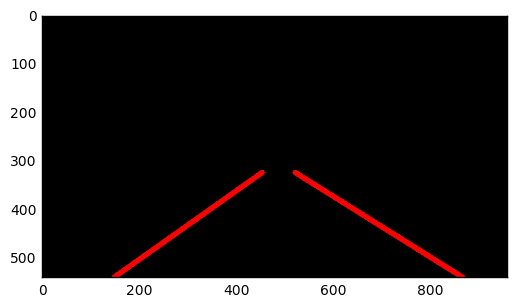

  5%|███▉                                                                              | 33/682 [00:21<06:19,  1.71it/s]

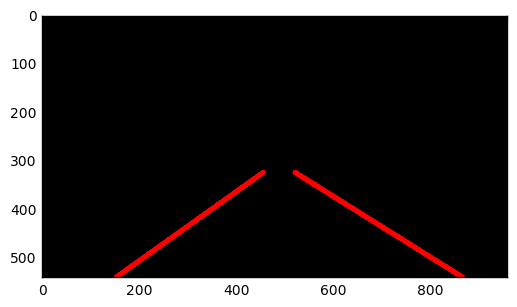

  5%|████                                                                              | 34/682 [00:22<06:10,  1.75it/s]

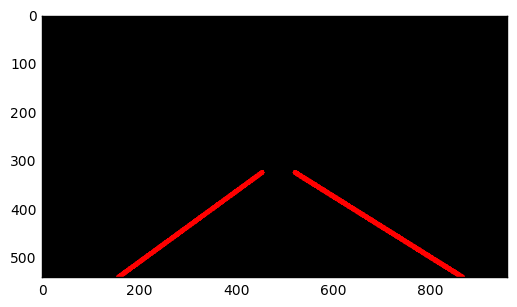

  5%|████▏                                                                             | 35/682 [00:22<06:07,  1.76it/s]

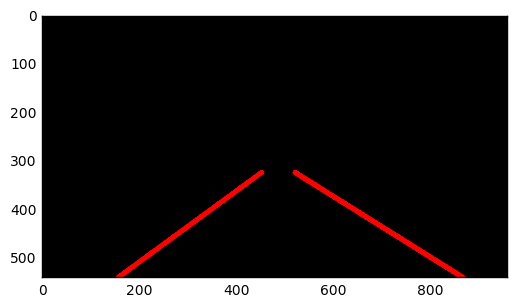

  5%|████▎                                                                             | 36/682 [00:23<05:56,  1.81it/s]

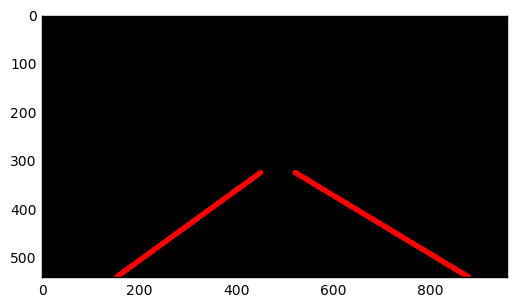

  5%|████▍                                                                             | 37/682 [00:23<05:44,  1.87it/s]

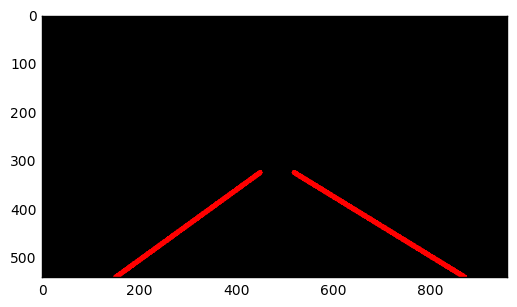

  6%|████▌                                                                             | 38/682 [00:24<05:35,  1.92it/s]

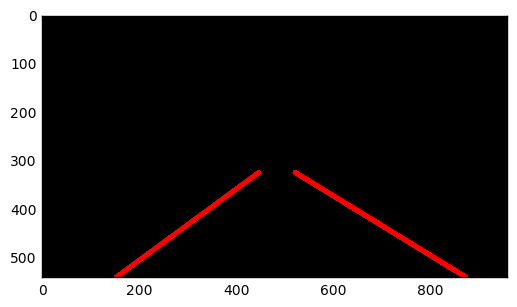

  6%|████▋                                                                             | 39/682 [00:24<05:35,  1.91it/s]

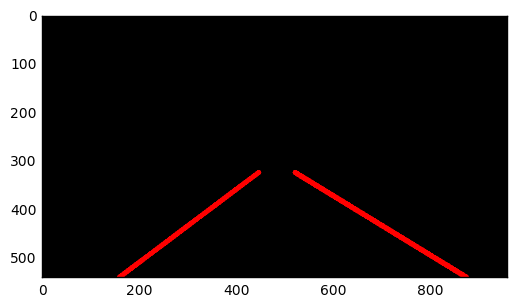

  6%|████▊                                                                             | 40/682 [00:25<05:28,  1.96it/s]

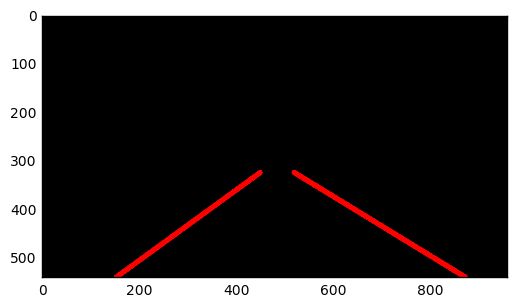

  6%|████▉                                                                             | 41/682 [00:25<05:28,  1.95it/s]

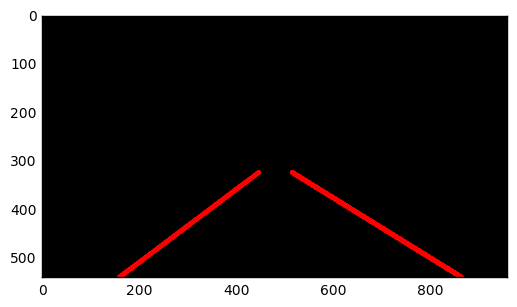

  6%|█████                                                                             | 42/682 [00:26<05:23,  1.98it/s]

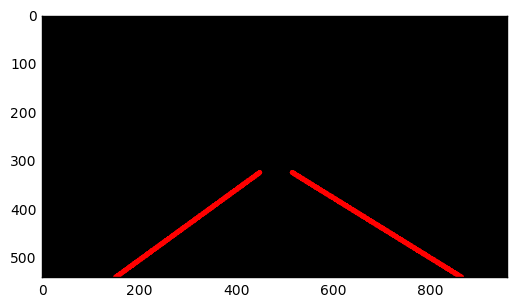

  6%|█████▏                                                                            | 43/682 [00:26<06:01,  1.77it/s]

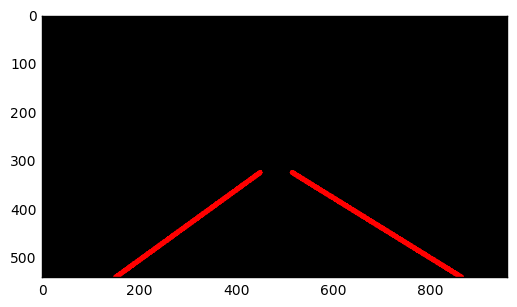

  6%|█████▎                                                                            | 44/682 [00:27<07:00,  1.52it/s]

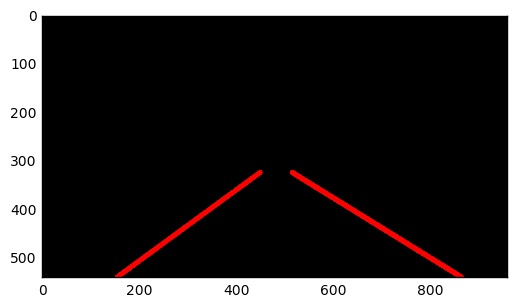

  7%|█████▍                                                                            | 45/682 [00:28<06:34,  1.61it/s]

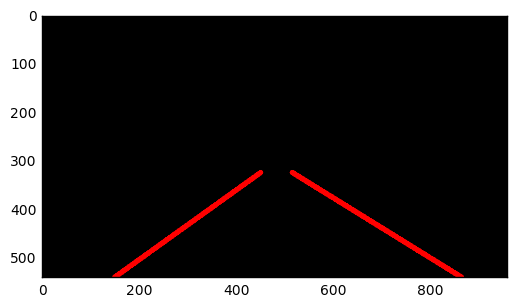

  7%|█████▌                                                                            | 46/682 [00:29<06:59,  1.52it/s]

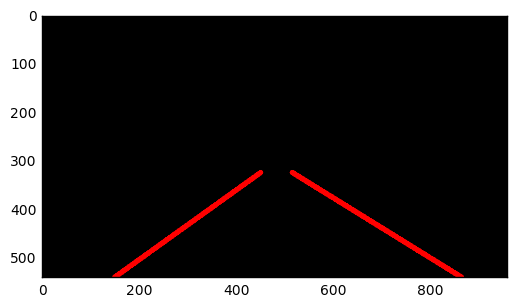

  7%|█████▋                                                                            | 47/682 [00:30<08:18,  1.27it/s]

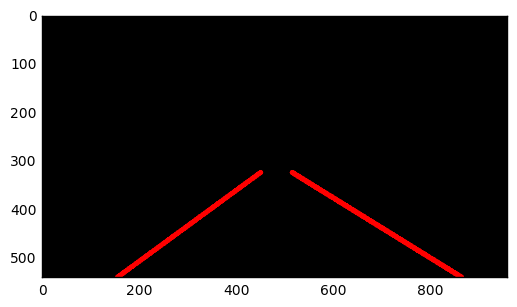

  7%|█████▊                                                                            | 48/682 [00:30<07:38,  1.38it/s]

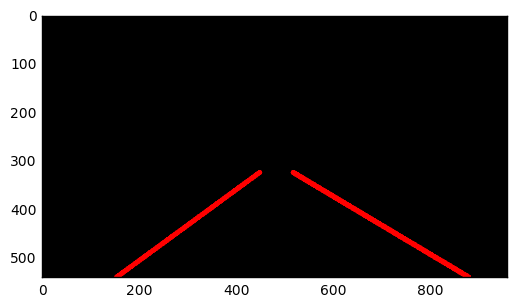

  7%|█████▉                                                                            | 49/682 [00:31<07:15,  1.45it/s]

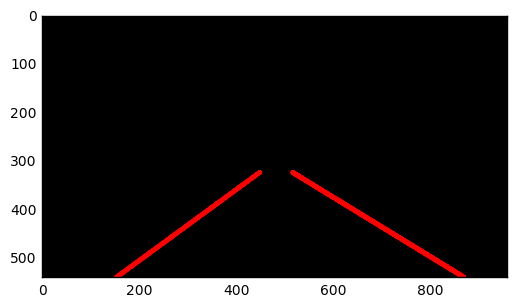

  7%|██████                                                                            | 50/682 [00:31<06:46,  1.56it/s]

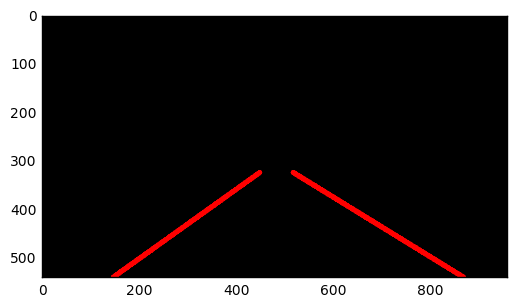

  7%|██████▏                                                                           | 51/682 [00:32<06:21,  1.66it/s]

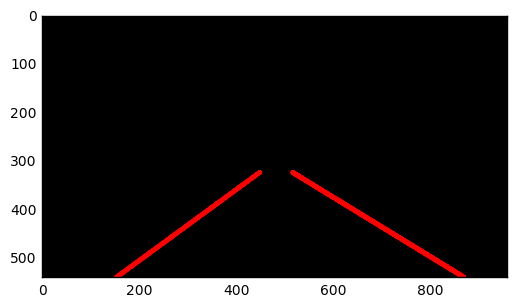

  8%|██████▎                                                                           | 52/682 [00:32<06:20,  1.66it/s]

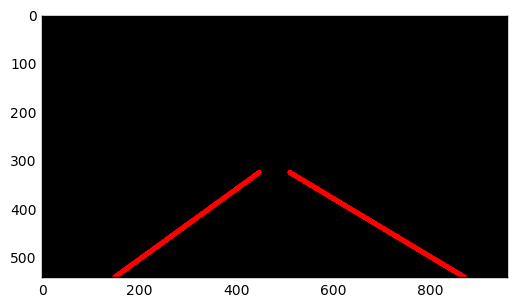

  8%|██████▎                                                                           | 53/682 [00:33<06:04,  1.73it/s]

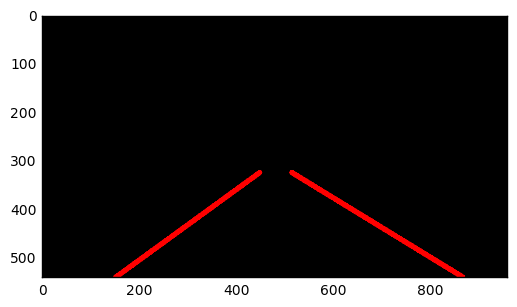

  8%|██████▍                                                                           | 54/682 [00:33<05:51,  1.79it/s]

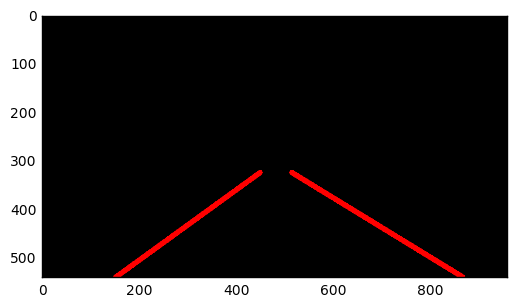

  8%|██████▌                                                                           | 55/682 [00:34<06:53,  1.52it/s]

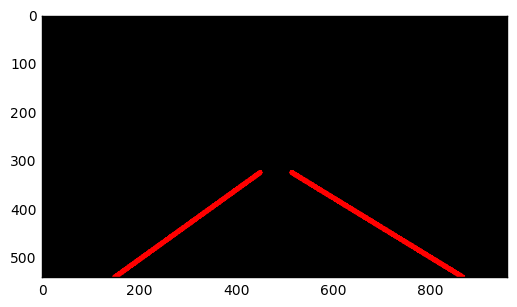

  8%|██████▋                                                                           | 56/682 [00:35<06:27,  1.62it/s]

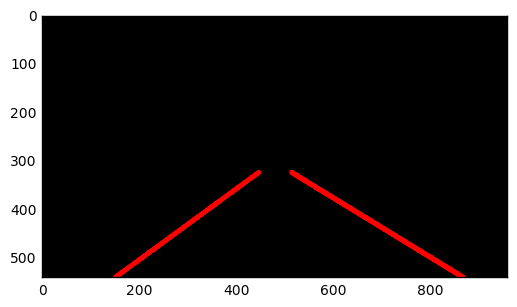

  8%|██████▊                                                                           | 57/682 [00:35<06:12,  1.68it/s]

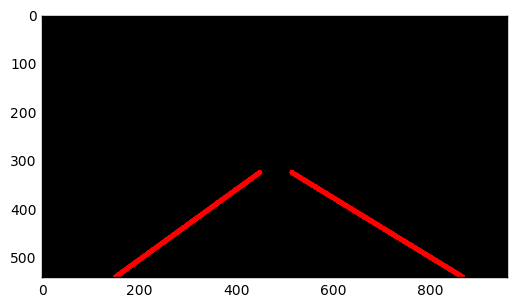

  9%|██████▉                                                                           | 58/682 [00:36<05:57,  1.74it/s]

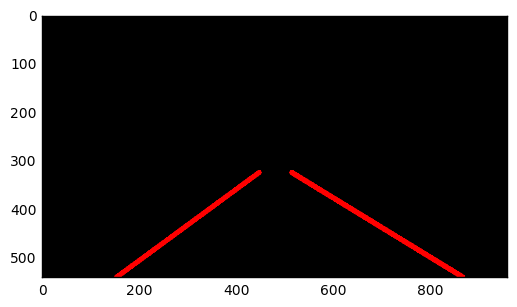

  9%|███████                                                                           | 59/682 [00:36<05:48,  1.79it/s]

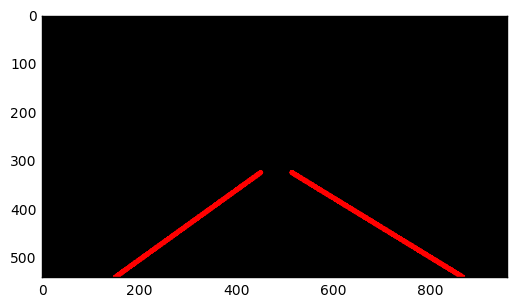

  9%|███████▏                                                                          | 60/682 [00:37<05:40,  1.83it/s]

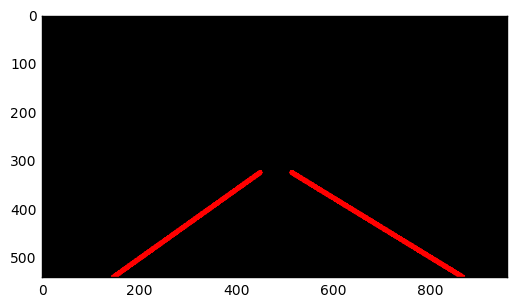

  9%|███████▎                                                                          | 61/682 [00:38<05:38,  1.83it/s]

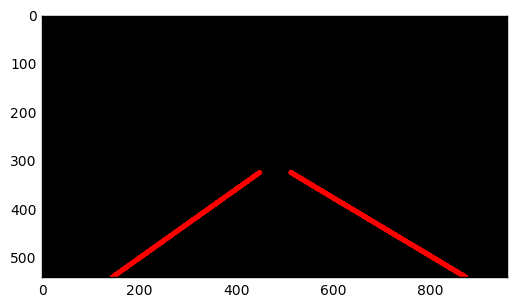

  9%|███████▍                                                                          | 62/682 [00:38<05:30,  1.88it/s]

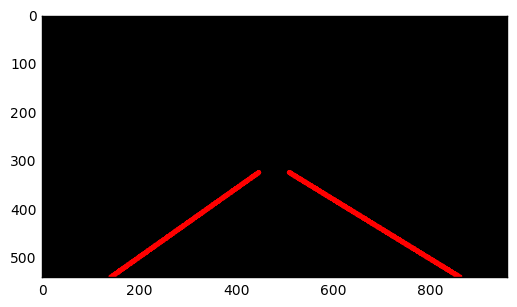

  9%|███████▌                                                                          | 63/682 [00:39<05:28,  1.88it/s]

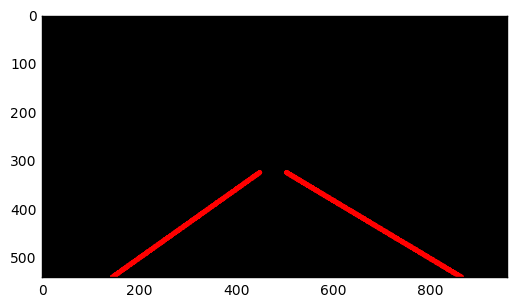

  9%|███████▋                                                                          | 64/682 [00:39<05:32,  1.86it/s]

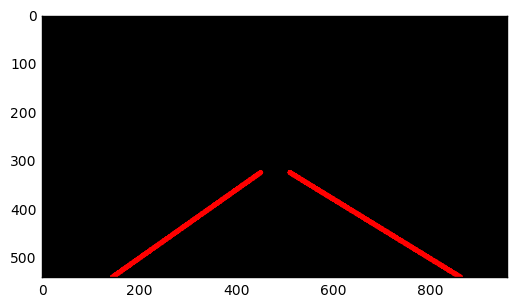

 10%|███████▊                                                                          | 65/682 [00:40<05:47,  1.78it/s]

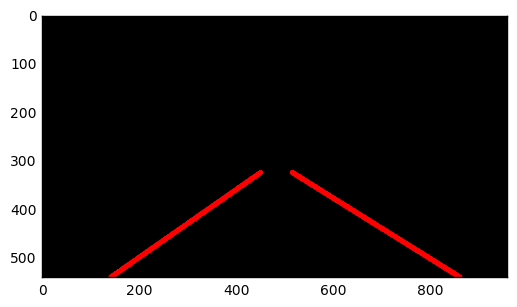

 10%|███████▉                                                                          | 66/682 [00:41<06:41,  1.54it/s]

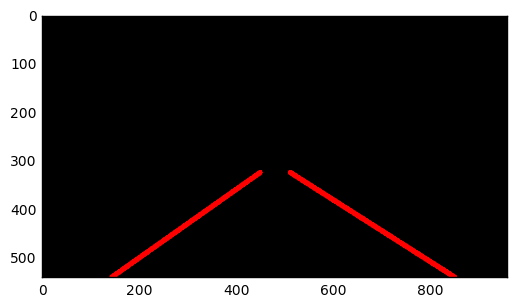

 10%|████████                                                                          | 67/682 [00:41<06:23,  1.60it/s]

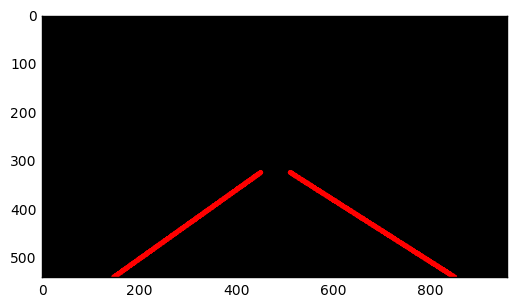

 10%|████████▏                                                                         | 68/682 [00:42<06:03,  1.69it/s]

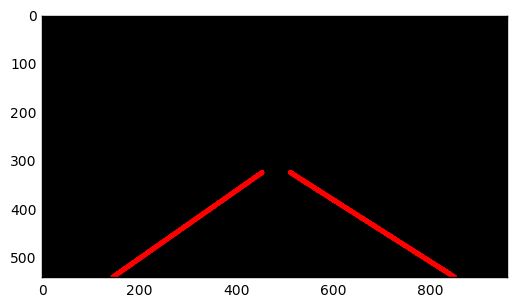

 10%|████████▎                                                                         | 69/682 [00:42<05:55,  1.72it/s]

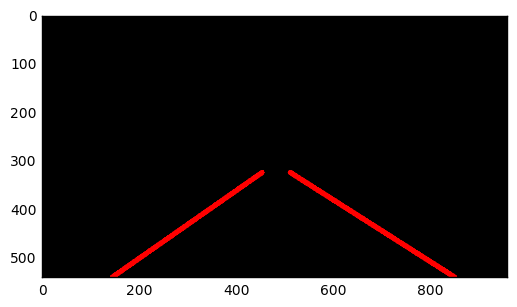

 10%|████████▍                                                                         | 70/682 [00:43<06:23,  1.60it/s]

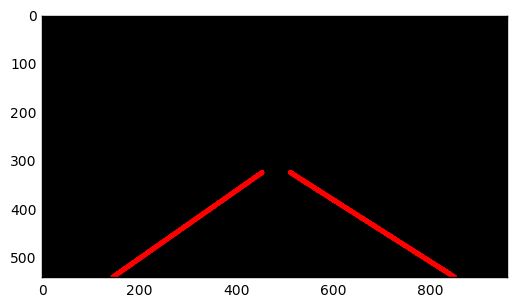

 10%|████████▌                                                                         | 71/682 [00:44<07:50,  1.30it/s]

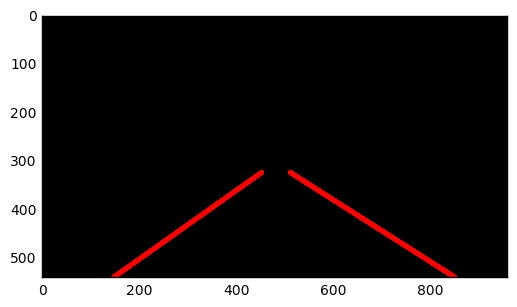

 11%|████████▋                                                                         | 72/682 [00:45<09:03,  1.12it/s]

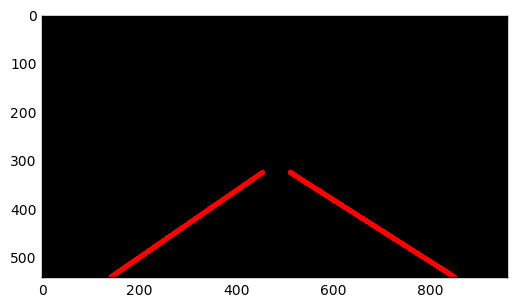

 11%|████████▊                                                                         | 73/682 [00:46<08:44,  1.16it/s]

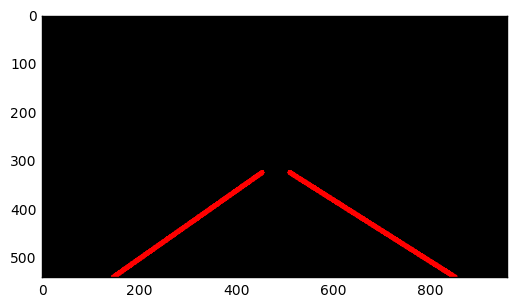

 11%|████████▉                                                                         | 74/682 [00:47<08:50,  1.15it/s]

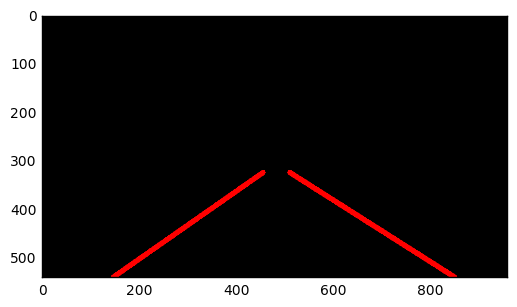

 11%|█████████                                                                         | 75/682 [00:48<07:56,  1.27it/s]

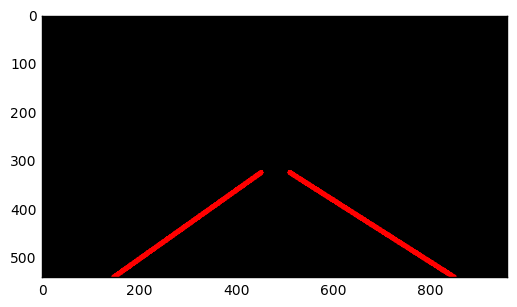

 11%|█████████▏                                                                        | 76/682 [00:48<07:02,  1.43it/s]

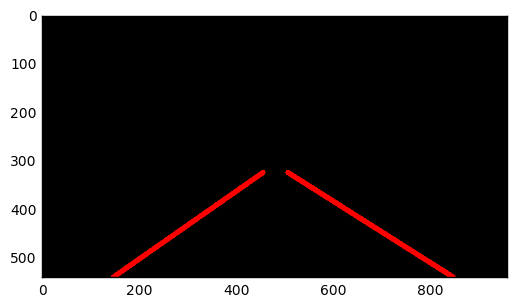

 11%|█████████▎                                                                        | 77/682 [00:49<07:09,  1.41it/s]

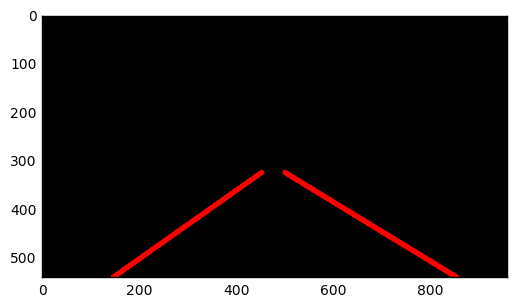

 11%|█████████▍                                                                        | 78/682 [00:49<06:39,  1.51it/s]

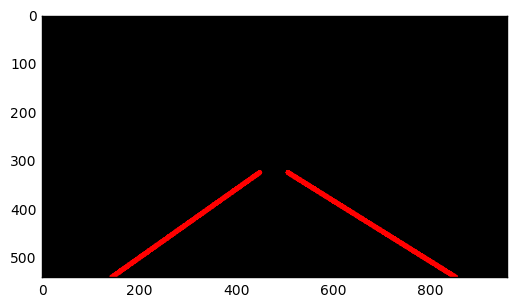

 12%|█████████▍                                                                        | 79/682 [00:50<06:11,  1.62it/s]

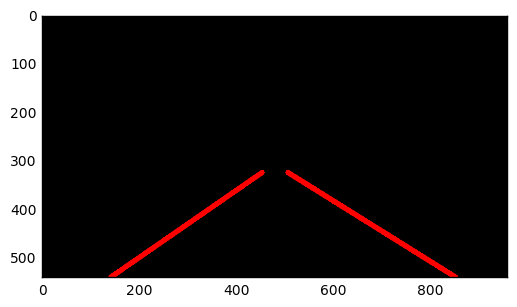

 12%|█████████▌                                                                        | 80/682 [00:50<06:01,  1.66it/s]

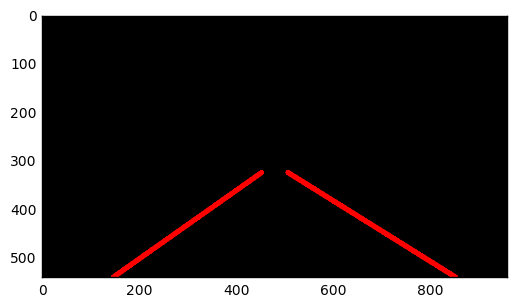

 12%|█████████▋                                                                        | 81/682 [00:51<05:50,  1.71it/s]

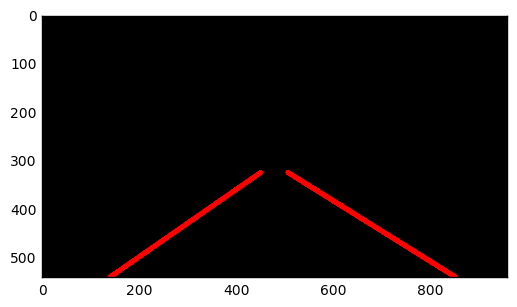

 12%|█████████▊                                                                        | 82/682 [00:51<05:41,  1.76it/s]

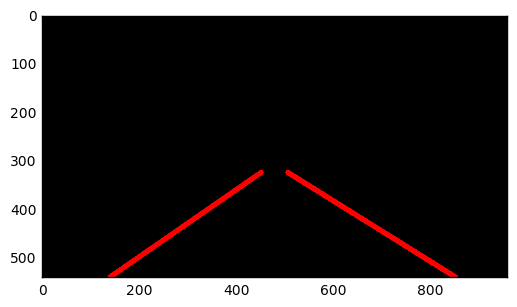

 12%|█████████▉                                                                        | 83/682 [00:52<05:41,  1.75it/s]

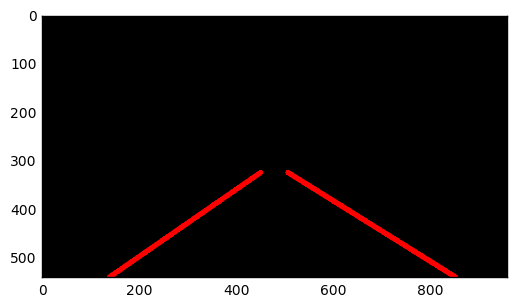

 12%|██████████                                                                        | 84/682 [00:53<05:33,  1.80it/s]

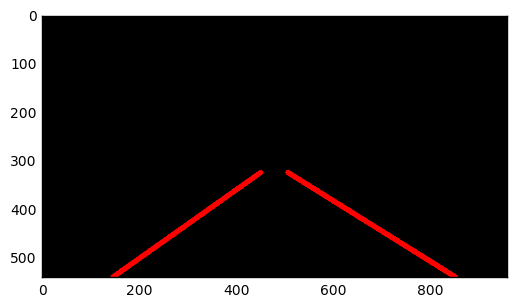

 12%|██████████▏                                                                       | 85/682 [00:53<05:30,  1.80it/s]

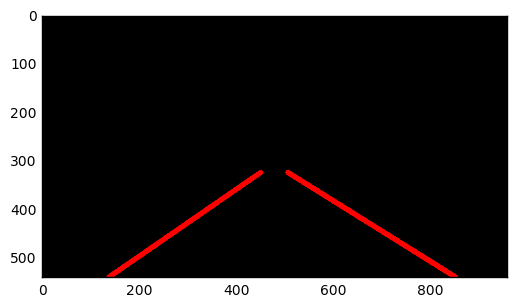

 13%|██████████▎                                                                       | 86/682 [00:54<05:26,  1.83it/s]

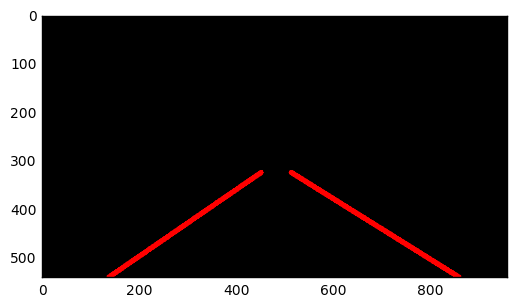

 13%|██████████▍                                                                       | 87/682 [00:54<05:28,  1.81it/s]

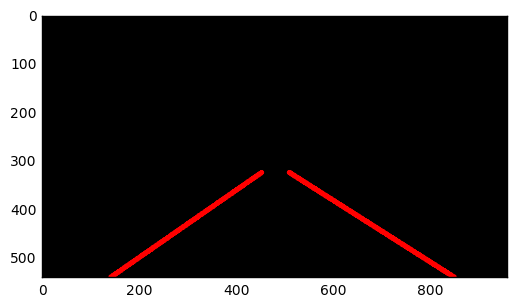

 13%|██████████▌                                                                       | 88/682 [00:55<06:07,  1.62it/s]

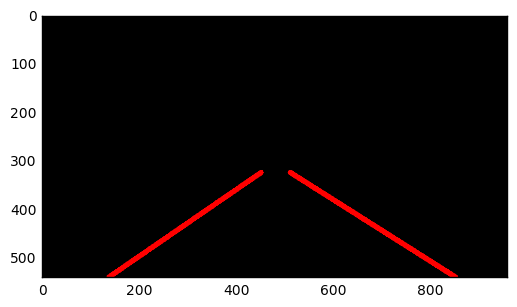

 13%|██████████▋                                                                       | 89/682 [00:56<05:56,  1.66it/s]

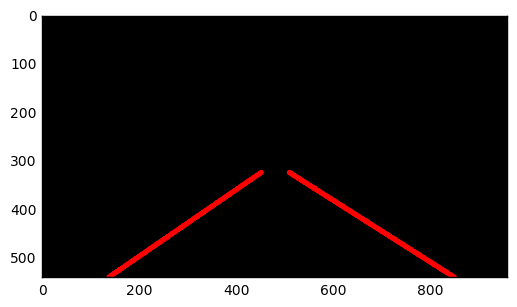

 13%|██████████▊                                                                       | 90/682 [00:56<05:44,  1.72it/s]

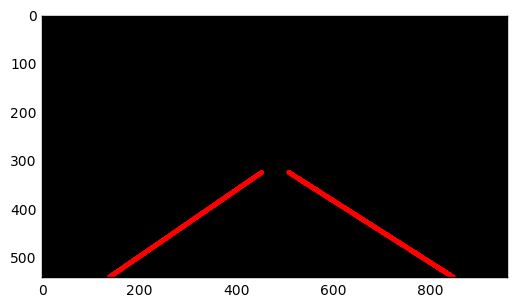

 13%|██████████▉                                                                       | 91/682 [00:57<05:36,  1.76it/s]

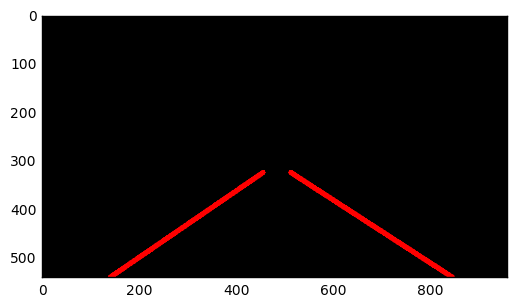

 13%|███████████                                                                       | 92/682 [00:57<05:25,  1.81it/s]

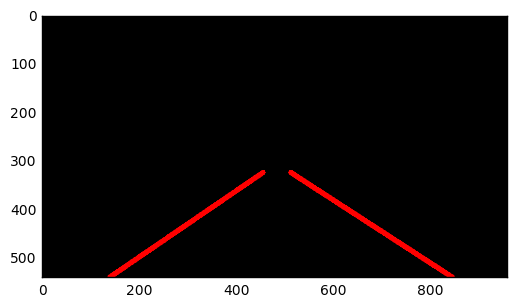

 14%|███████████▏                                                                      | 93/682 [00:58<05:20,  1.84it/s]

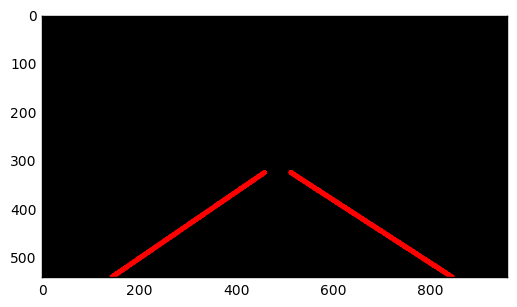

 14%|███████████▎                                                                      | 94/682 [00:58<05:18,  1.85it/s]

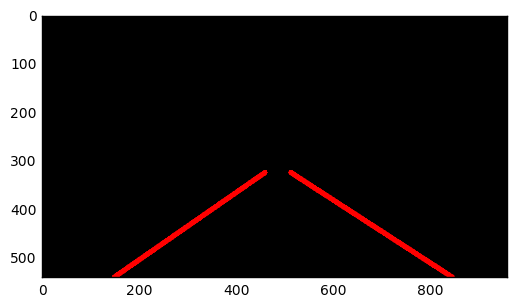

 14%|███████████▍                                                                      | 95/682 [00:59<05:13,  1.87it/s]

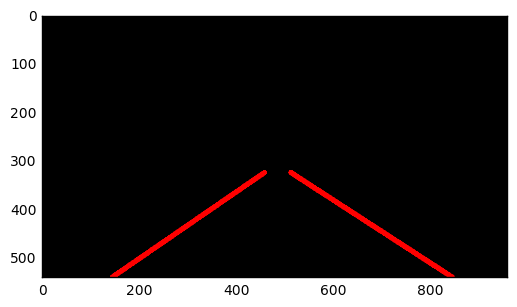

 14%|███████████▌                                                                      | 96/682 [00:59<05:10,  1.89it/s]

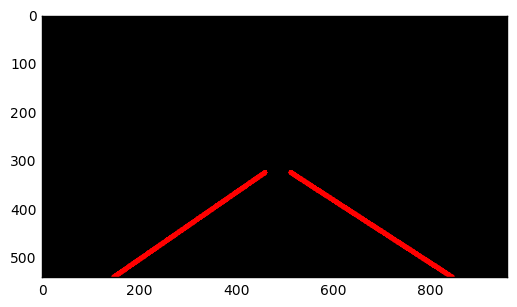

 14%|███████████▋                                                                      | 97/682 [01:00<05:13,  1.87it/s]

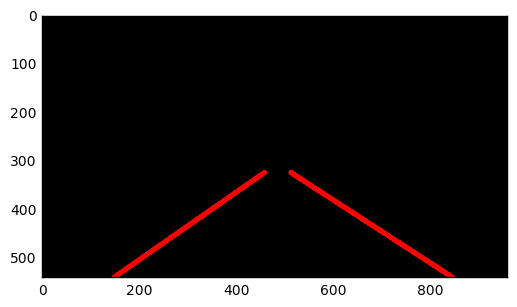

 14%|███████████▊                                                                      | 98/682 [01:00<05:18,  1.83it/s]

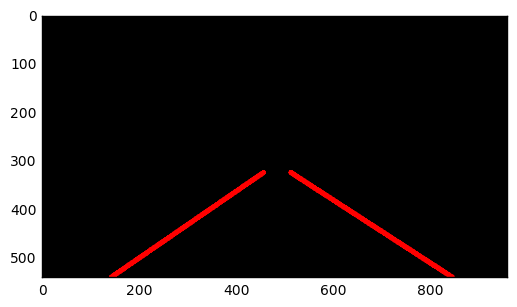

 15%|███████████▉                                                                      | 99/682 [01:01<05:54,  1.65it/s]

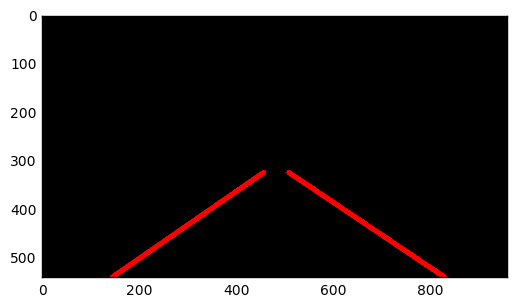

 15%|███████████▉                                                                     | 100/682 [01:02<05:42,  1.70it/s]

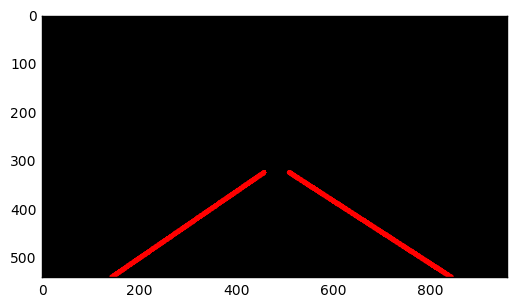

 15%|███████████▉                                                                     | 101/682 [01:02<05:32,  1.75it/s]

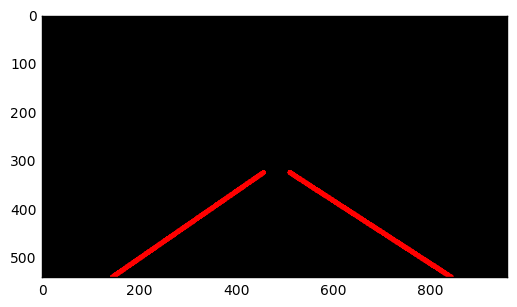

 15%|████████████                                                                     | 102/682 [01:03<05:31,  1.75it/s]

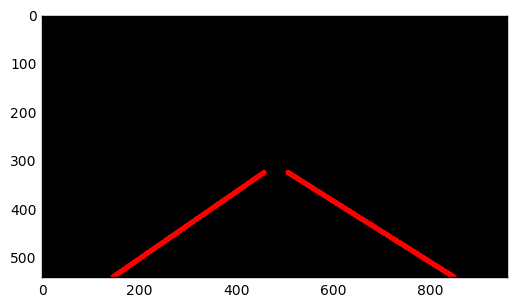

 15%|████████████▏                                                                    | 103/682 [01:03<05:25,  1.78it/s]

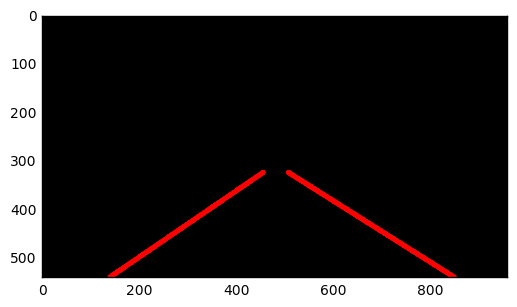

 15%|████████████▎                                                                    | 104/682 [01:04<05:22,  1.79it/s]

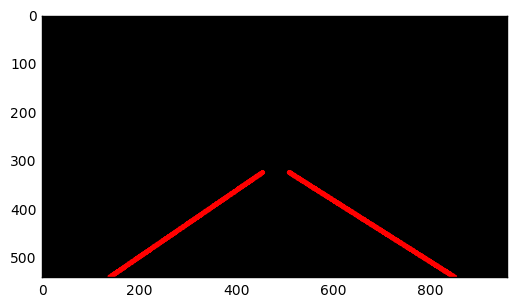

 15%|████████████▍                                                                    | 105/682 [01:05<05:51,  1.64it/s]

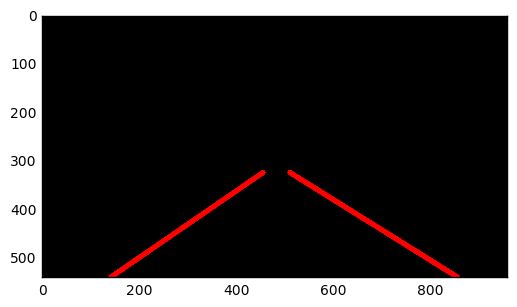

 16%|████████████▌                                                                    | 106/682 [01:05<05:54,  1.62it/s]

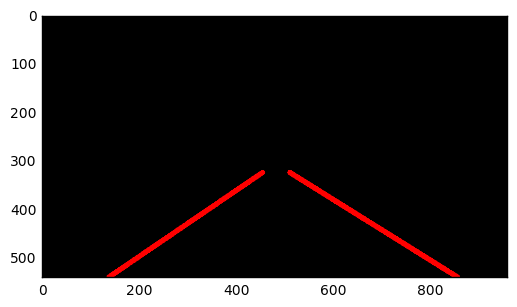

 16%|████████████▋                                                                    | 107/682 [01:06<05:35,  1.71it/s]

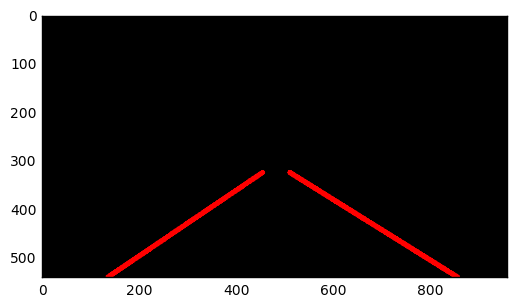

 16%|████████████▊                                                                    | 108/682 [01:06<05:29,  1.74it/s]

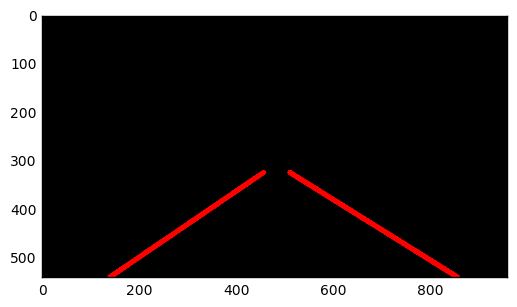

 16%|████████████▉                                                                    | 109/682 [01:07<05:19,  1.79it/s]

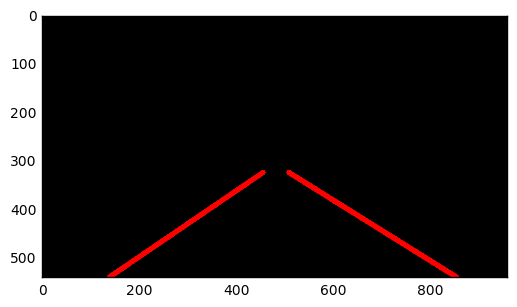

 16%|█████████████                                                                    | 110/682 [01:07<05:49,  1.64it/s]

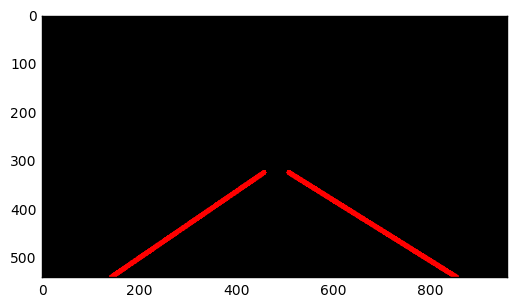

 16%|█████████████▏                                                                   | 111/682 [01:08<05:30,  1.73it/s]

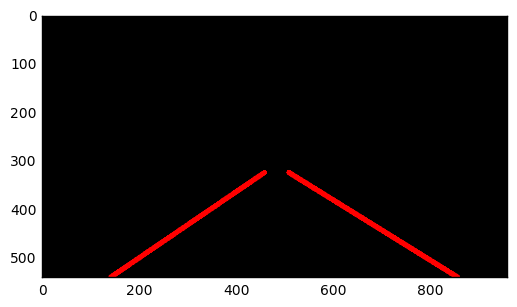

 16%|█████████████▎                                                                   | 112/682 [01:09<05:24,  1.76it/s]

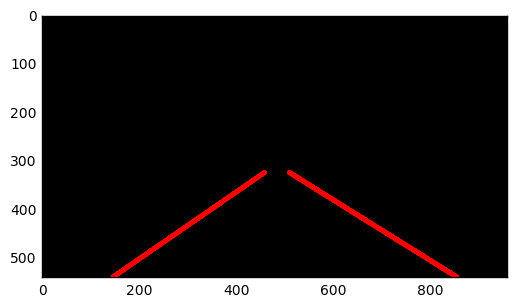

 17%|█████████████▍                                                                   | 113/682 [01:09<05:14,  1.81it/s]

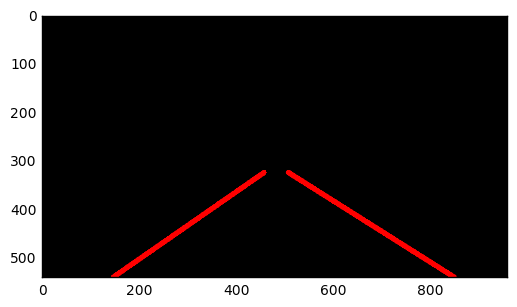

 17%|█████████████▌                                                                   | 114/682 [01:10<05:10,  1.83it/s]

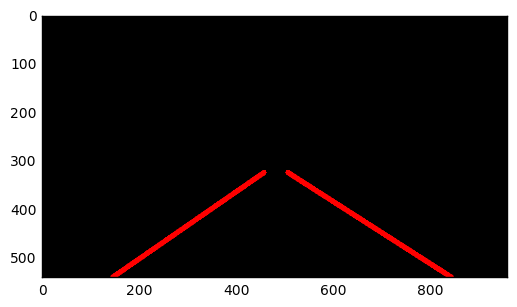

 17%|█████████████▋                                                                   | 115/682 [01:10<05:03,  1.87it/s]

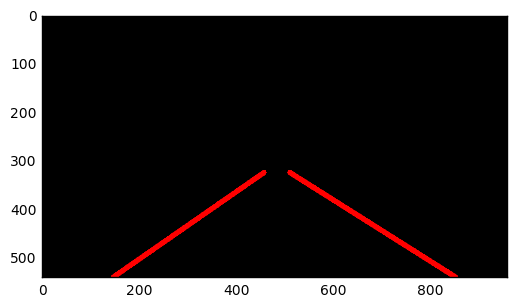

 17%|█████████████▊                                                                   | 116/682 [01:11<05:05,  1.85it/s]

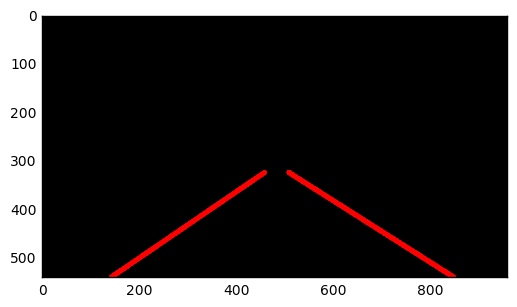

 17%|█████████████▉                                                                   | 117/682 [01:11<05:09,  1.82it/s]

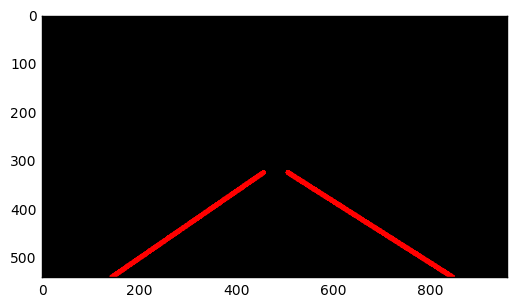

 17%|██████████████                                                                   | 118/682 [01:12<05:05,  1.84it/s]

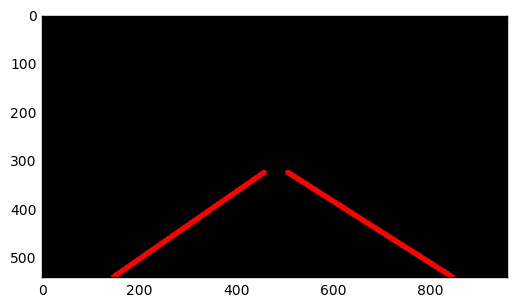

 17%|██████████████▏                                                                  | 119/682 [01:12<05:10,  1.81it/s]

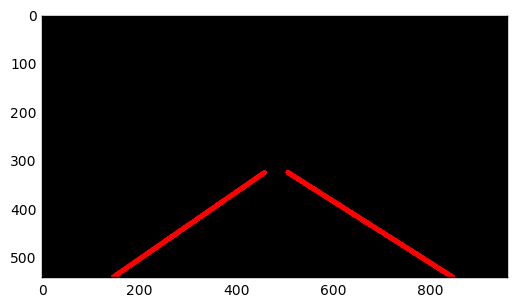

 18%|██████████████▎                                                                  | 120/682 [01:13<05:15,  1.78it/s]

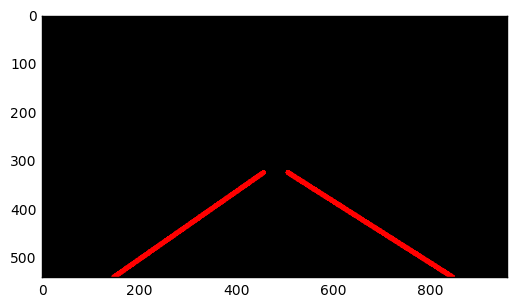

 18%|██████████████▎                                                                  | 121/682 [01:14<06:12,  1.51it/s]

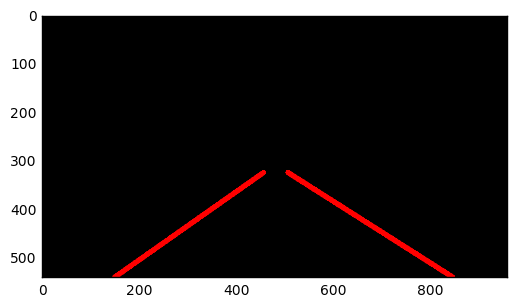

 18%|██████████████▍                                                                  | 122/682 [01:14<05:56,  1.57it/s]

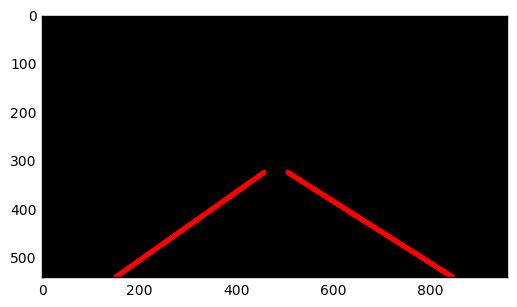

 18%|██████████████▌                                                                  | 123/682 [01:15<05:40,  1.64it/s]

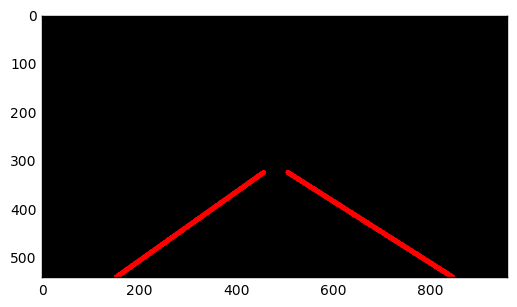

 18%|██████████████▋                                                                  | 124/682 [01:15<05:23,  1.73it/s]

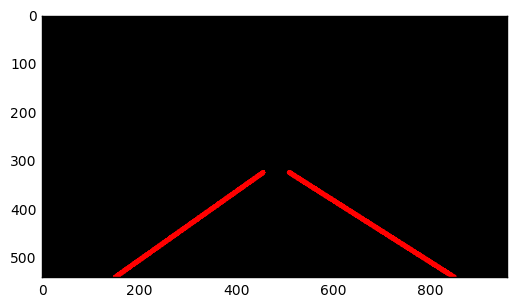

 18%|██████████████▊                                                                  | 125/682 [01:16<05:15,  1.76it/s]

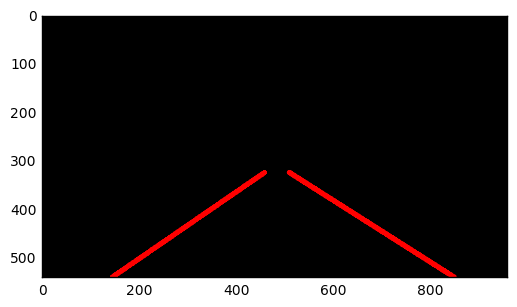

 18%|██████████████▉                                                                  | 126/682 [01:17<05:10,  1.79it/s]

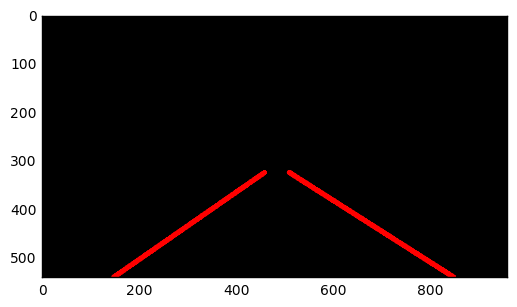

 19%|███████████████                                                                  | 127/682 [01:17<05:04,  1.82it/s]

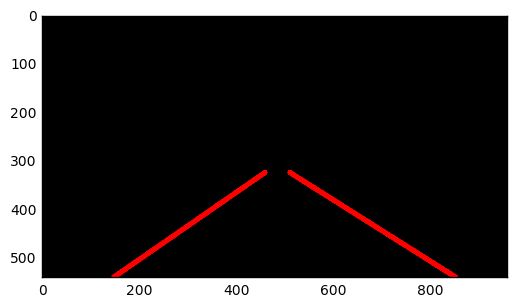

 19%|███████████████▏                                                                 | 128/682 [01:18<04:58,  1.86it/s]

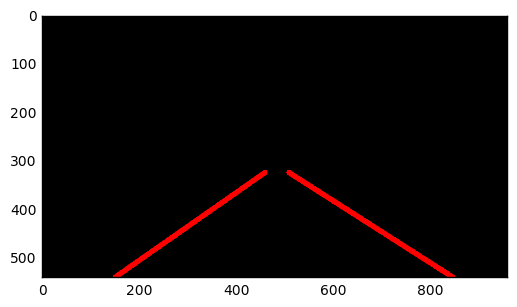

 19%|███████████████▎                                                                 | 129/682 [01:18<04:54,  1.88it/s]

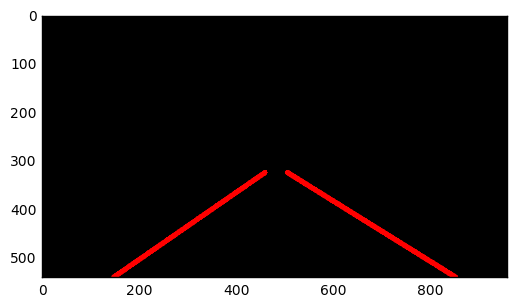

 19%|███████████████▍                                                                 | 130/682 [01:19<04:57,  1.85it/s]

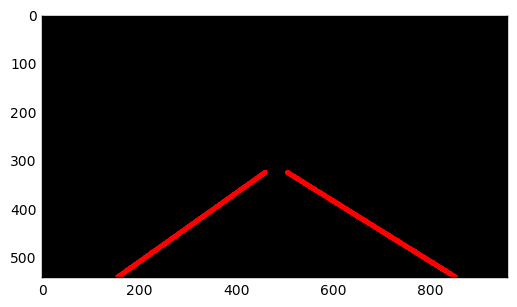

 19%|███████████████▌                                                                 | 131/682 [01:19<04:56,  1.86it/s]

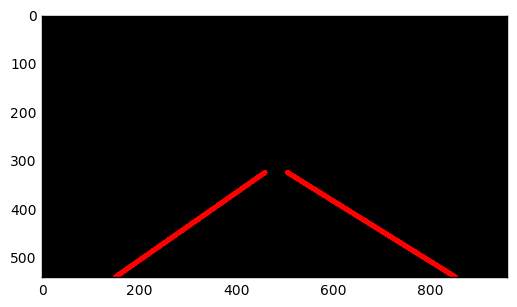

 19%|███████████████▋                                                                 | 132/682 [01:20<05:40,  1.62it/s]

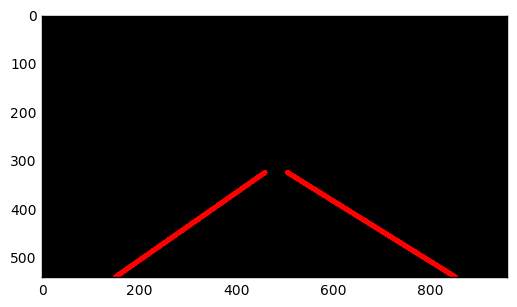

 20%|███████████████▊                                                                 | 133/682 [01:21<05:54,  1.55it/s]

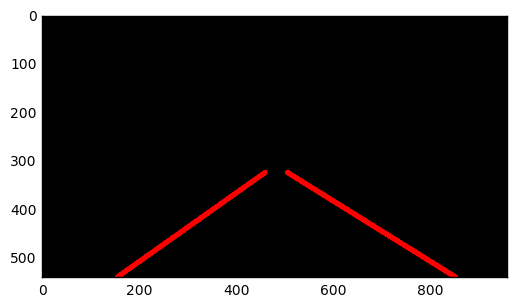

 20%|███████████████▉                                                                 | 134/682 [01:21<05:43,  1.60it/s]

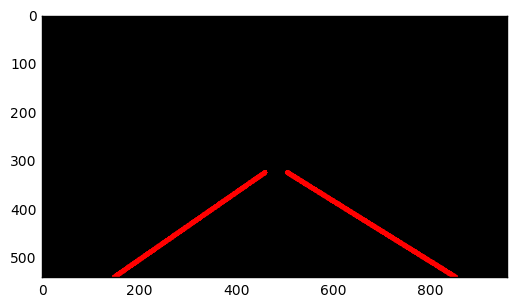

 20%|████████████████                                                                 | 135/682 [01:22<05:25,  1.68it/s]

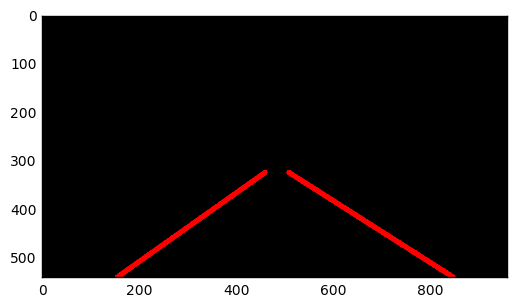

 20%|████████████████▏                                                                | 136/682 [01:22<05:26,  1.67it/s]

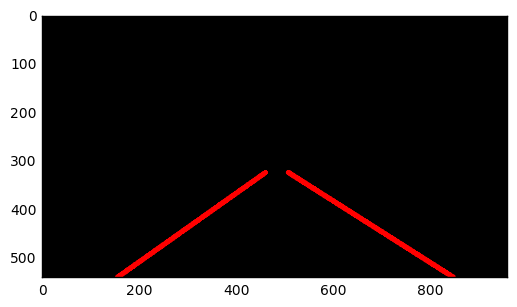

 20%|████████████████▎                                                                | 137/682 [01:23<05:15,  1.73it/s]

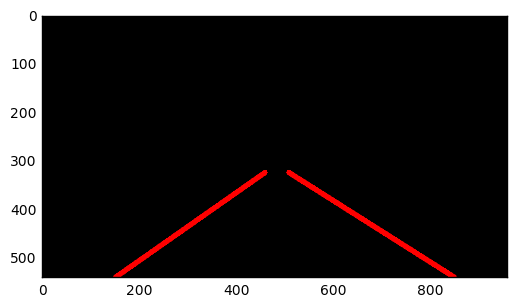

 20%|████████████████▍                                                                | 138/682 [01:24<05:46,  1.57it/s]

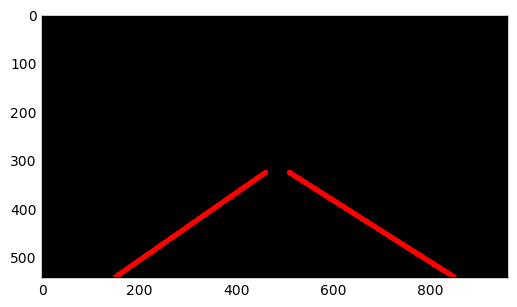

 20%|████████████████▌                                                                | 139/682 [01:25<06:31,  1.39it/s]

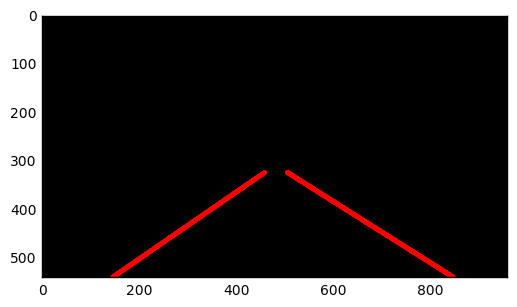

 21%|████████████████▋                                                                | 140/682 [01:25<06:37,  1.37it/s]

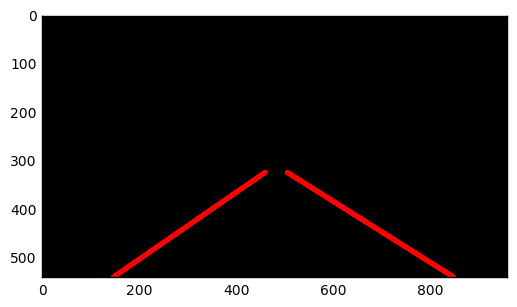

 21%|████████████████▋                                                                | 141/682 [01:26<06:11,  1.46it/s]

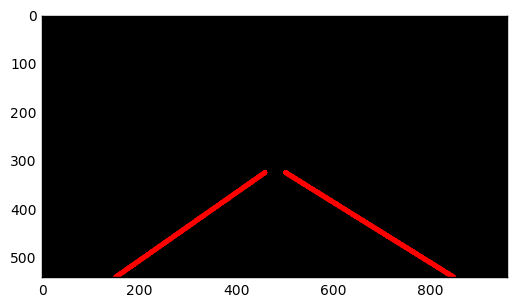

 21%|████████████████▊                                                                | 142/682 [01:27<06:03,  1.49it/s]

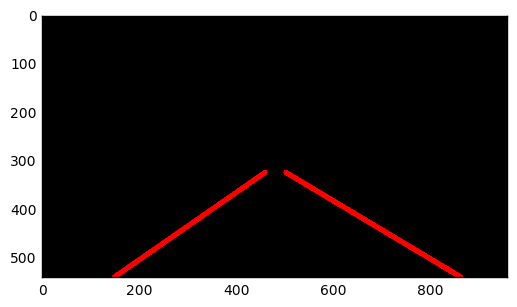

 21%|████████████████▉                                                                | 143/682 [01:28<06:54,  1.30it/s]

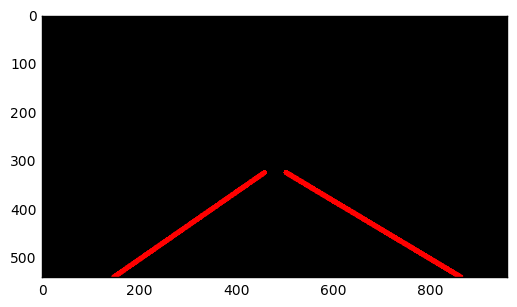

 21%|█████████████████                                                                | 144/682 [01:28<06:47,  1.32it/s]

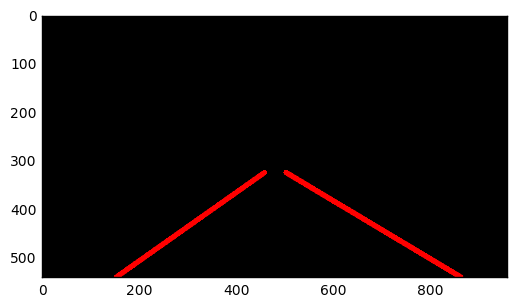

 21%|█████████████████▏                                                               | 145/682 [01:29<06:14,  1.43it/s]

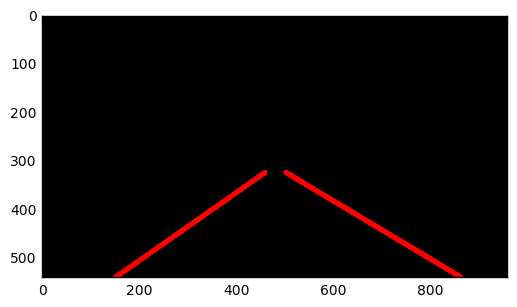

 21%|█████████████████▎                                                               | 146/682 [01:30<06:11,  1.44it/s]

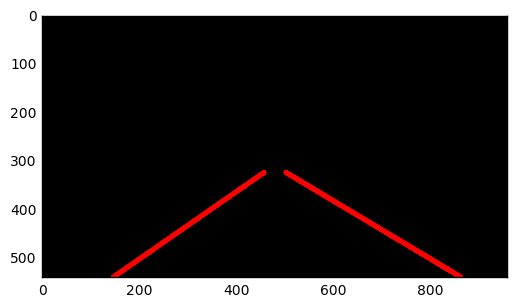

 22%|█████████████████▍                                                               | 147/682 [01:30<06:00,  1.49it/s]

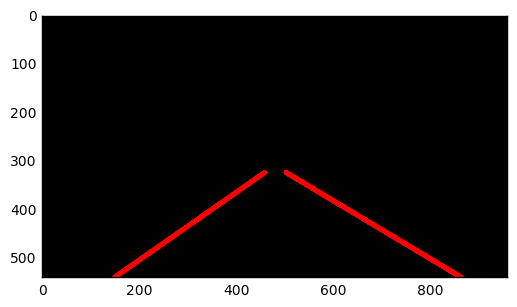

 22%|█████████████████▌                                                               | 148/682 [01:31<06:04,  1.47it/s]

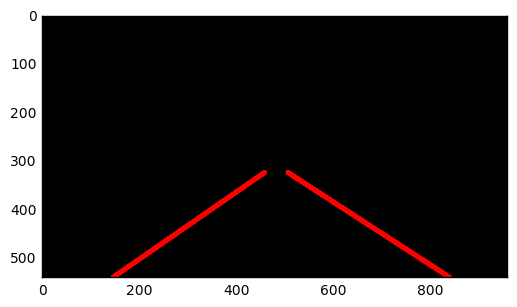

 22%|█████████████████▋                                                               | 149/682 [01:31<05:37,  1.58it/s]

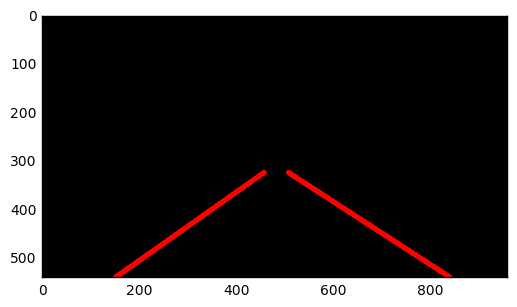

 22%|█████████████████▊                                                               | 150/682 [01:32<05:31,  1.61it/s]

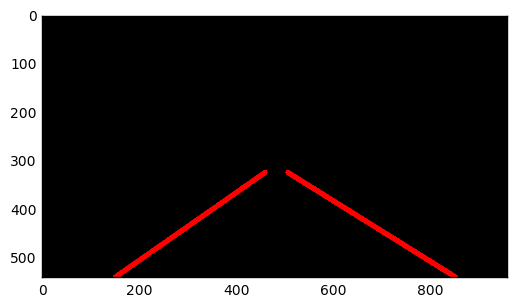

 22%|█████████████████▉                                                               | 151/682 [01:33<05:22,  1.65it/s]

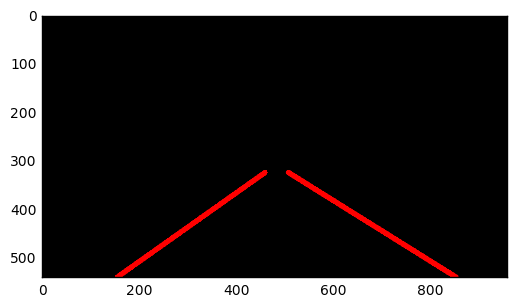

 22%|██████████████████                                                               | 152/682 [01:33<05:02,  1.75it/s]

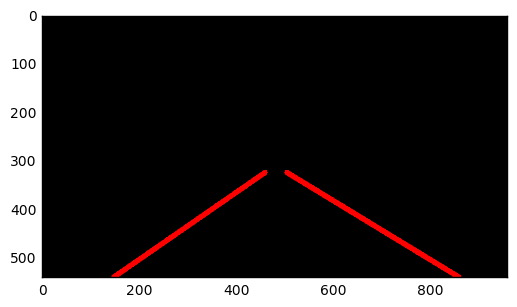

 22%|██████████████████▏                                                              | 153/682 [01:34<04:50,  1.82it/s]

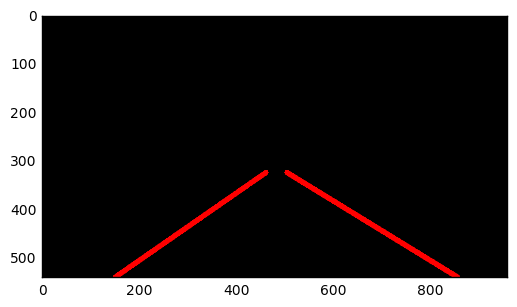

 23%|██████████████████▎                                                              | 154/682 [01:34<05:11,  1.70it/s]

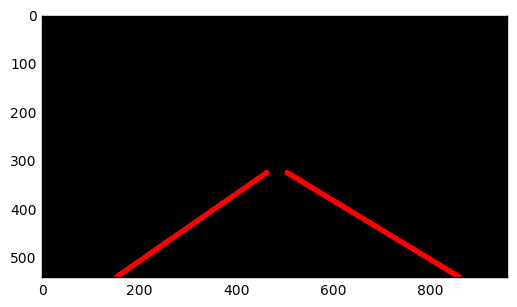

 23%|██████████████████▍                                                              | 155/682 [01:35<04:55,  1.78it/s]

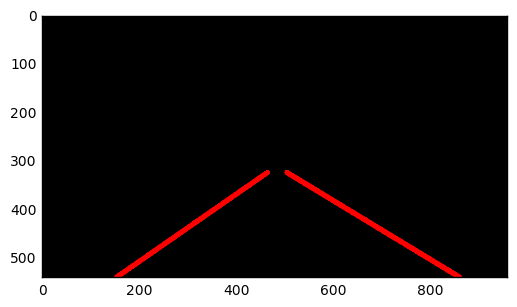

 23%|██████████████████▌                                                              | 156/682 [01:35<04:47,  1.83it/s]

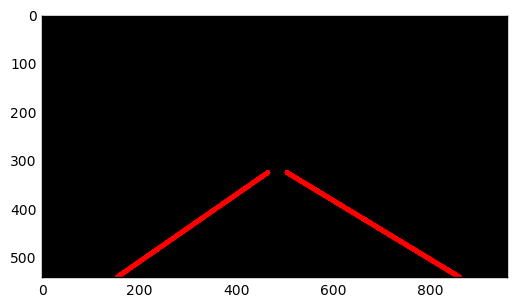

 23%|██████████████████▋                                                              | 157/682 [01:36<04:37,  1.89it/s]

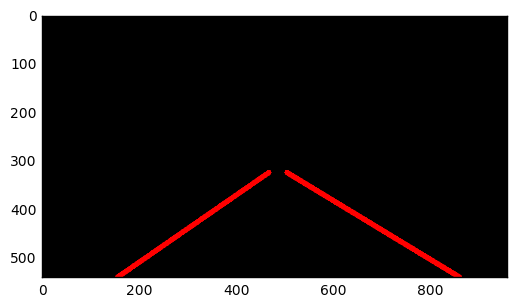

 23%|██████████████████▊                                                              | 158/682 [01:36<04:34,  1.91it/s]

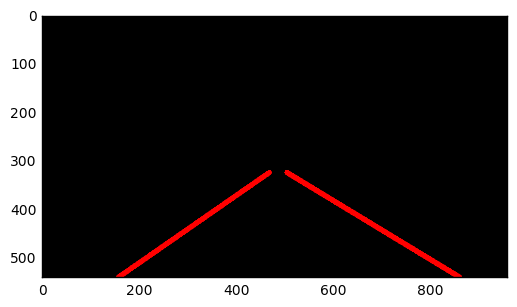

 23%|██████████████████▉                                                              | 159/682 [01:37<04:27,  1.95it/s]

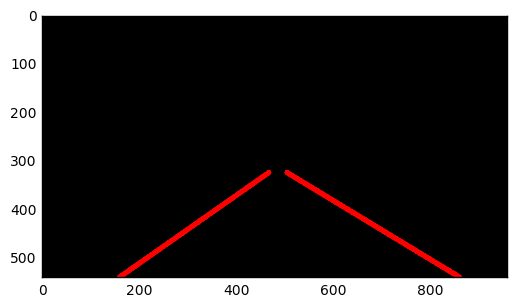

 23%|███████████████████                                                              | 160/682 [01:37<04:41,  1.85it/s]

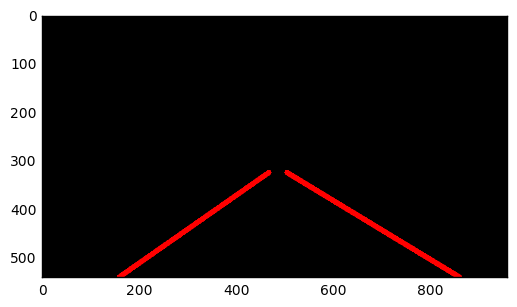

 24%|███████████████████                                                              | 161/682 [01:38<04:40,  1.86it/s]

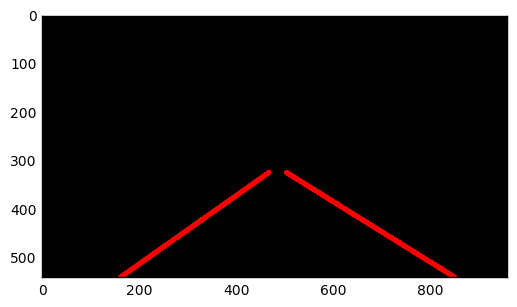

 24%|███████████████████▏                                                             | 162/682 [01:38<04:32,  1.91it/s]

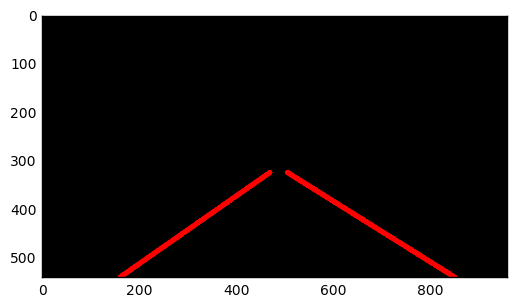

 24%|███████████████████▎                                                             | 163/682 [01:39<04:25,  1.96it/s]

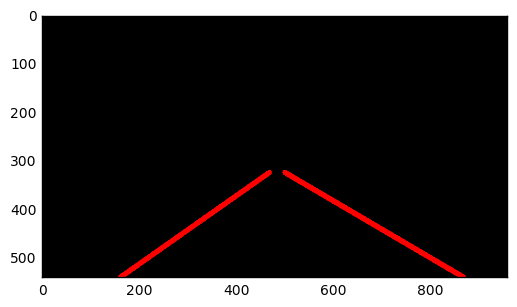

 24%|███████████████████▍                                                             | 164/682 [01:39<04:29,  1.92it/s]

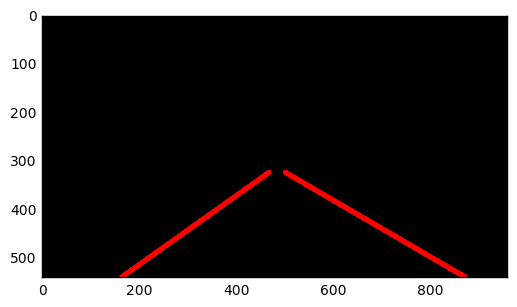

 24%|███████████████████▌                                                             | 165/682 [01:40<05:14,  1.64it/s]

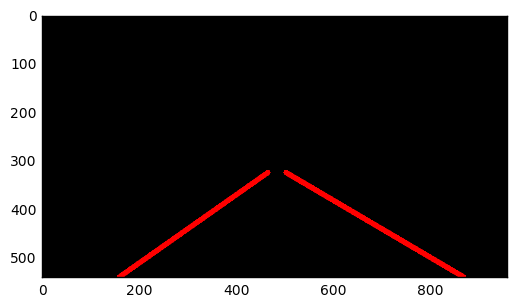

 24%|███████████████████▋                                                             | 166/682 [01:41<05:02,  1.70it/s]

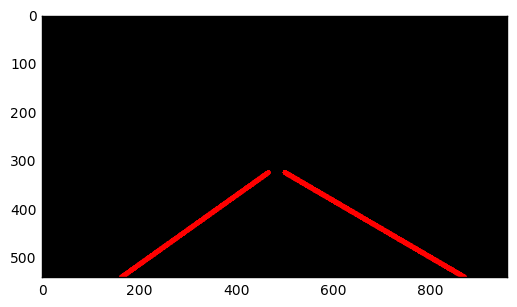

 24%|███████████████████▊                                                             | 167/682 [01:41<05:01,  1.71it/s]

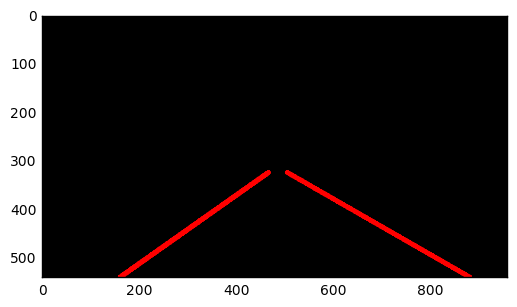

 25%|███████████████████▉                                                             | 168/682 [01:42<04:44,  1.80it/s]

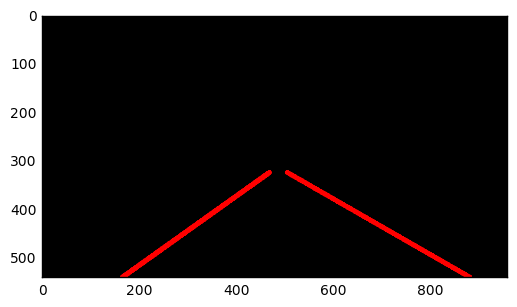

 25%|████████████████████                                                             | 169/682 [01:42<04:41,  1.83it/s]

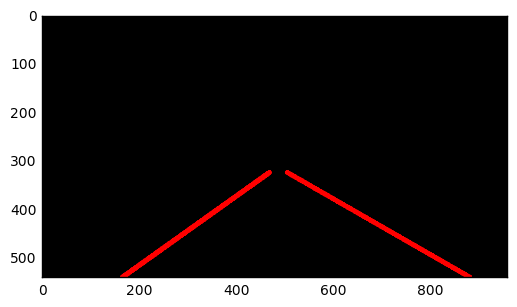

 25%|████████████████████▏                                                            | 170/682 [01:43<04:30,  1.89it/s]

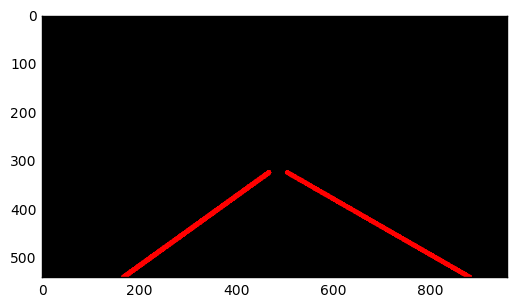

 25%|████████████████████▎                                                            | 171/682 [01:43<04:36,  1.85it/s]

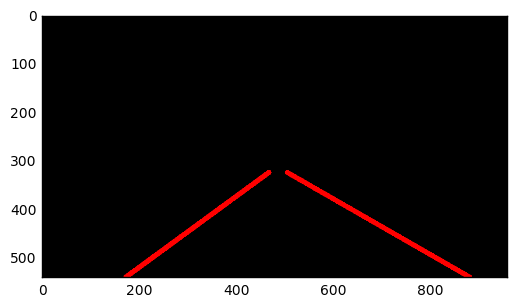

 25%|████████████████████▍                                                            | 172/682 [01:44<04:32,  1.87it/s]

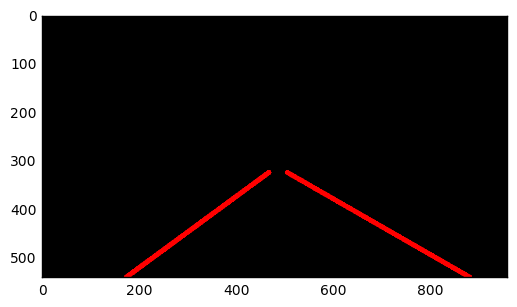

 25%|████████████████████▌                                                            | 173/682 [01:45<04:44,  1.79it/s]

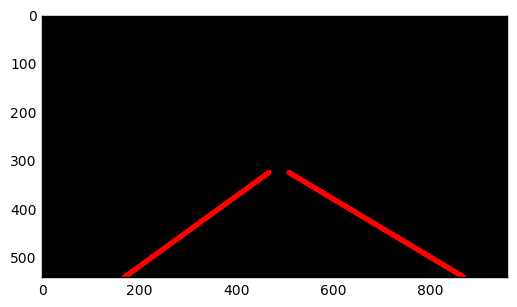

 26%|████████████████████▋                                                            | 174/682 [01:45<05:23,  1.57it/s]

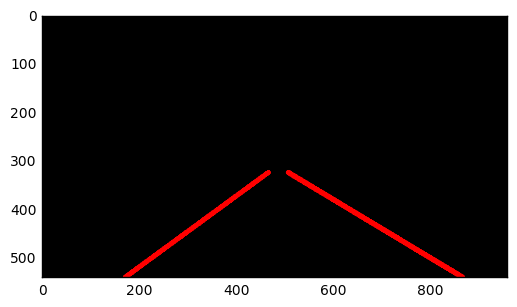

 26%|████████████████████▊                                                            | 175/682 [01:46<05:13,  1.61it/s]

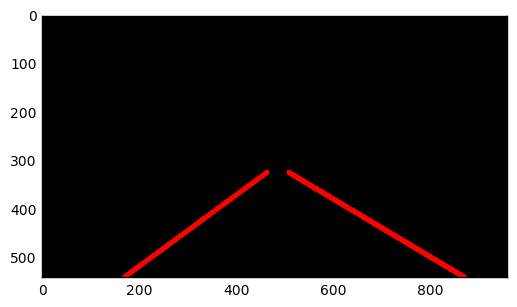

 26%|████████████████████▉                                                            | 176/682 [01:47<05:40,  1.49it/s]

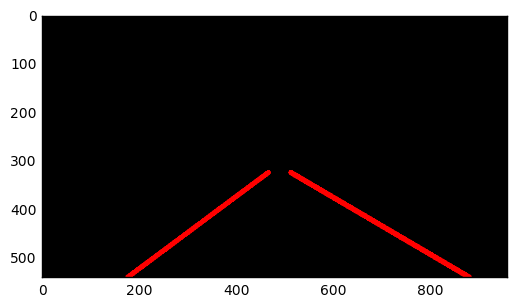

 26%|█████████████████████                                                            | 177/682 [01:47<05:16,  1.59it/s]

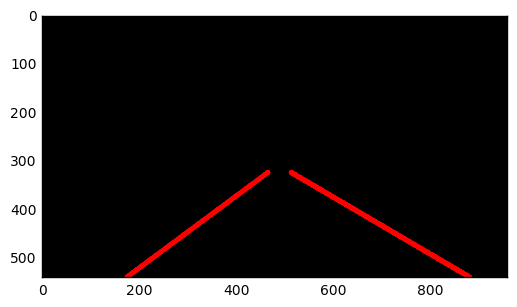

 26%|█████████████████████▏                                                           | 178/682 [01:48<04:58,  1.69it/s]

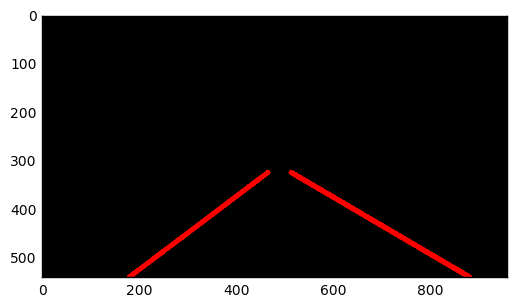

 26%|█████████████████████▎                                                           | 179/682 [01:48<04:46,  1.76it/s]

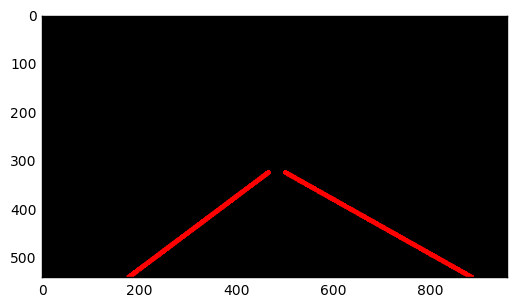

 26%|█████████████████████▍                                                           | 180/682 [01:49<04:36,  1.81it/s]

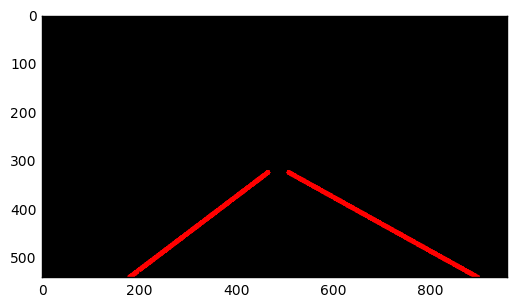

 27%|█████████████████████▍                                                           | 181/682 [01:49<04:38,  1.80it/s]

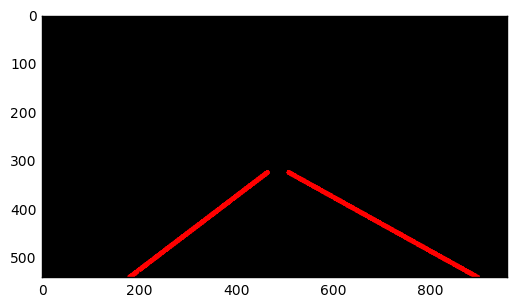

 27%|█████████████████████▌                                                           | 182/682 [01:50<04:44,  1.76it/s]

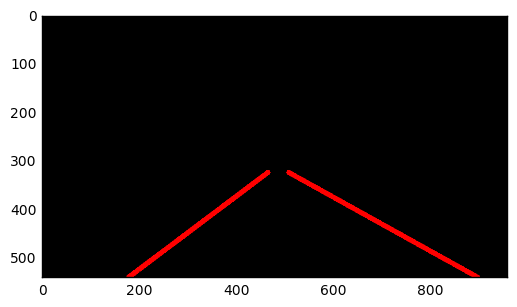

 27%|█████████████████████▋                                                           | 183/682 [01:51<04:47,  1.74it/s]

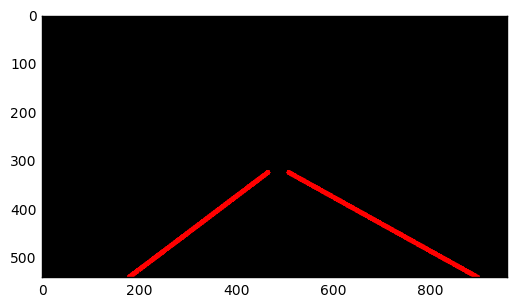

 27%|█████████████████████▊                                                           | 184/682 [01:51<04:40,  1.77it/s]

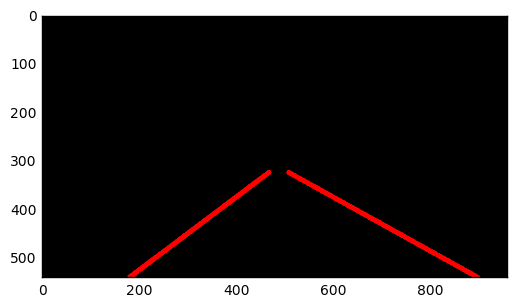

 27%|█████████████████████▉                                                           | 185/682 [01:52<04:34,  1.81it/s]

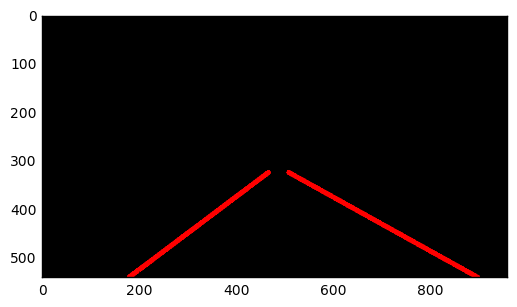

 27%|██████████████████████                                                           | 186/682 [01:52<04:25,  1.87it/s]

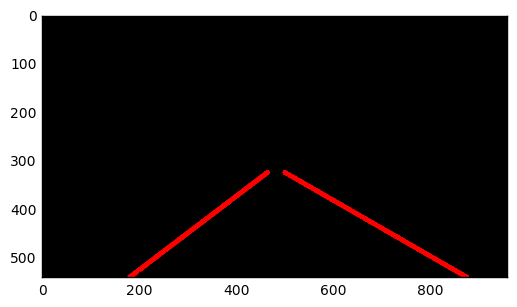

 27%|██████████████████████▏                                                          | 187/682 [01:53<04:48,  1.72it/s]

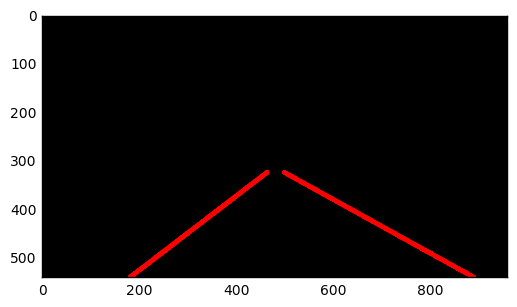

 28%|██████████████████████▎                                                          | 188/682 [01:53<04:40,  1.76it/s]

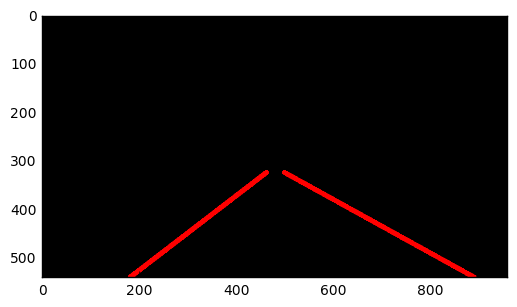

 28%|██████████████████████▍                                                          | 189/682 [01:54<04:28,  1.84it/s]

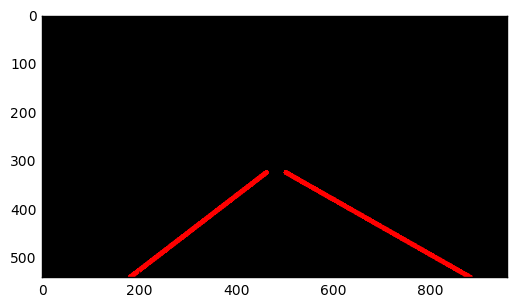

 28%|██████████████████████▌                                                          | 190/682 [01:54<04:28,  1.83it/s]

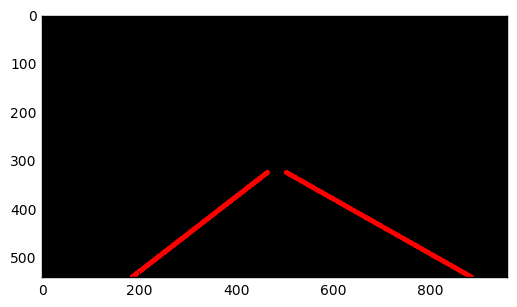

 28%|██████████████████████▋                                                          | 191/682 [01:55<04:24,  1.86it/s]

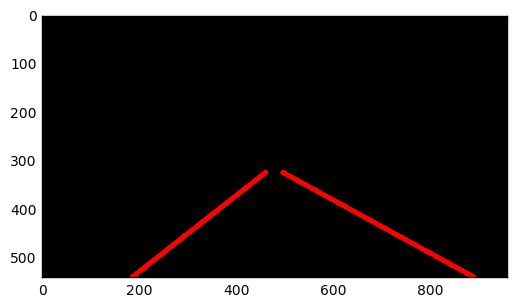

 28%|██████████████████████▊                                                          | 192/682 [01:55<04:25,  1.84it/s]

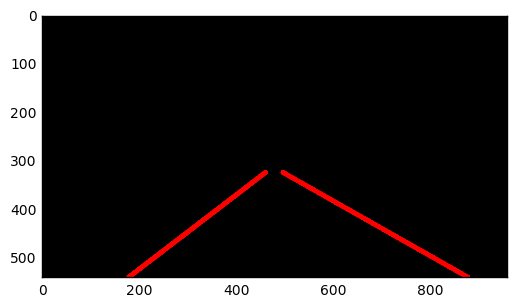

 28%|██████████████████████▉                                                          | 193/682 [01:56<04:27,  1.83it/s]

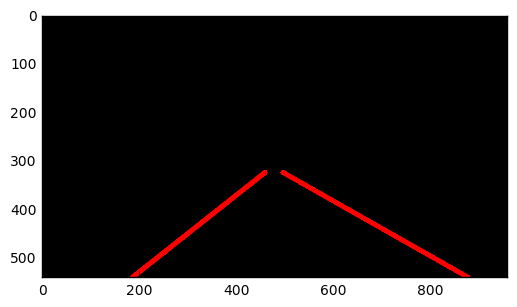

 28%|███████████████████████                                                          | 194/682 [01:57<04:25,  1.84it/s]

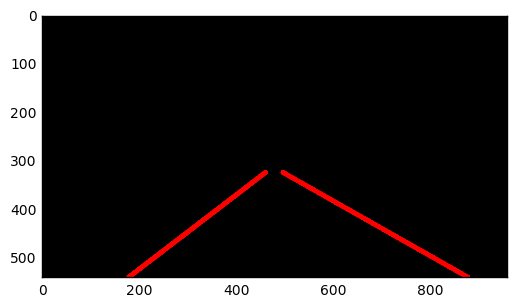

 29%|███████████████████████▏                                                         | 195/682 [01:57<04:16,  1.90it/s]

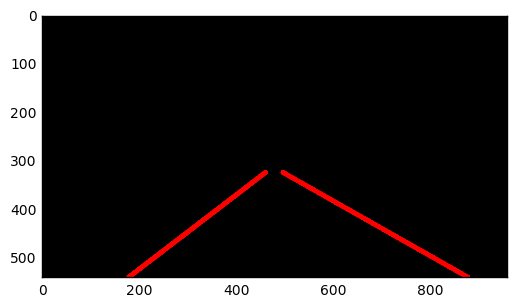

 29%|███████████████████████▎                                                         | 196/682 [01:58<04:13,  1.91it/s]

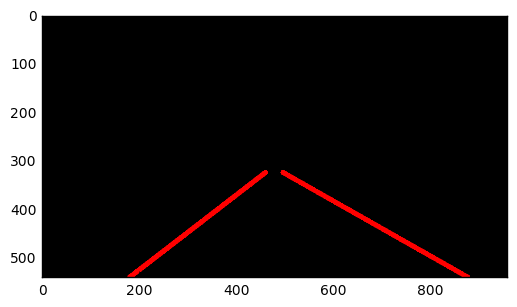

 29%|███████████████████████▍                                                         | 197/682 [01:58<04:11,  1.93it/s]

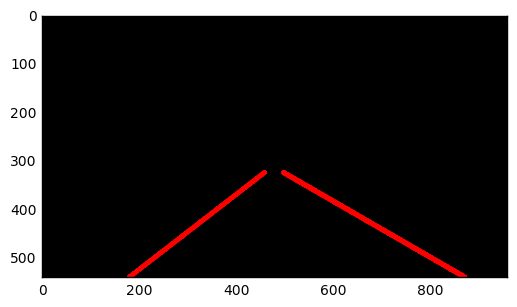

 29%|███████████████████████▌                                                         | 198/682 [01:59<04:39,  1.73it/s]

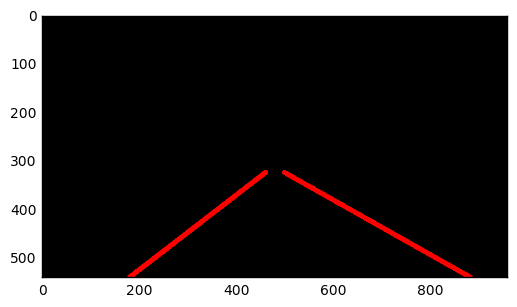

 29%|███████████████████████▋                                                         | 199/682 [01:59<04:27,  1.80it/s]

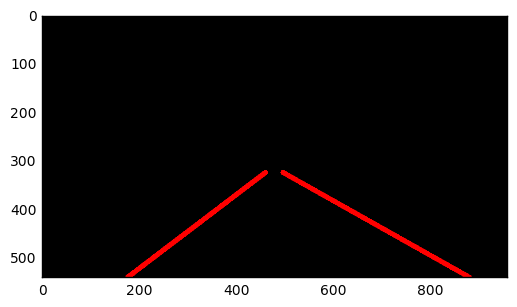

 29%|███████████████████████▊                                                         | 200/682 [02:00<04:17,  1.87it/s]

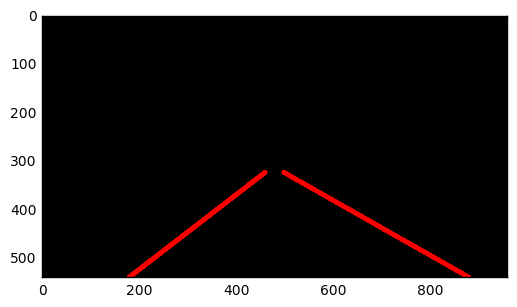

 29%|███████████████████████▊                                                         | 201/682 [02:00<04:15,  1.88it/s]

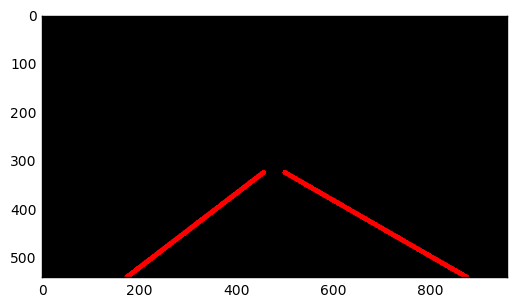

 30%|███████████████████████▉                                                         | 202/682 [02:01<04:07,  1.94it/s]

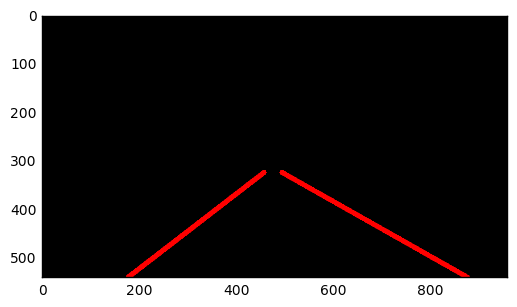

 30%|████████████████████████                                                         | 203/682 [02:01<04:05,  1.95it/s]

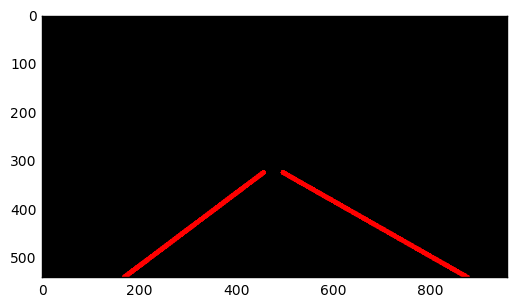

 30%|████████████████████████▏                                                        | 204/682 [02:02<04:00,  1.99it/s]

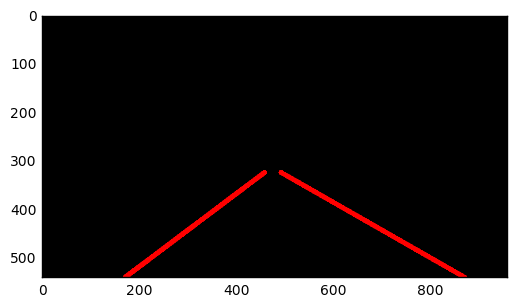

 30%|████████████████████████▎                                                        | 205/682 [02:02<04:03,  1.96it/s]

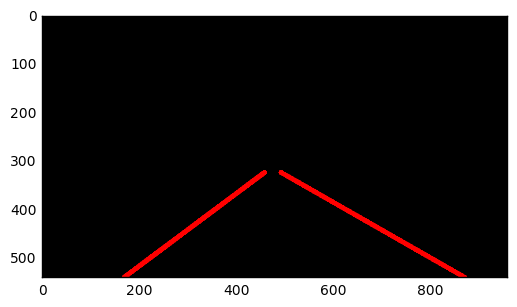

 30%|████████████████████████▍                                                        | 206/682 [02:03<04:01,  1.97it/s]

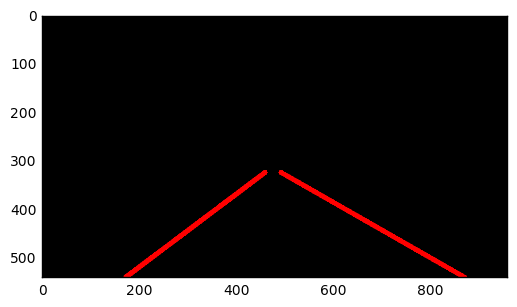

 30%|████████████████████████▌                                                        | 207/682 [02:03<04:03,  1.95it/s]

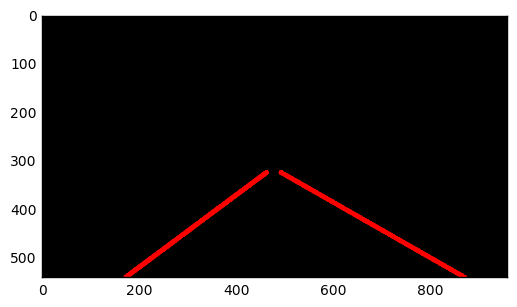

 30%|████████████████████████▋                                                        | 208/682 [02:04<03:58,  1.98it/s]

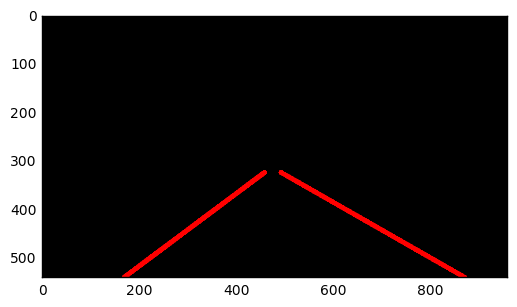

 31%|████████████████████████▊                                                        | 209/682 [02:05<04:37,  1.70it/s]

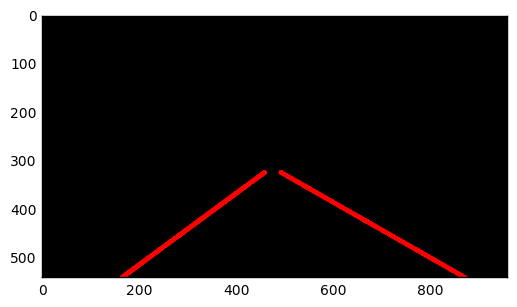

 31%|████████████████████████▉                                                        | 210/682 [02:05<05:05,  1.54it/s]

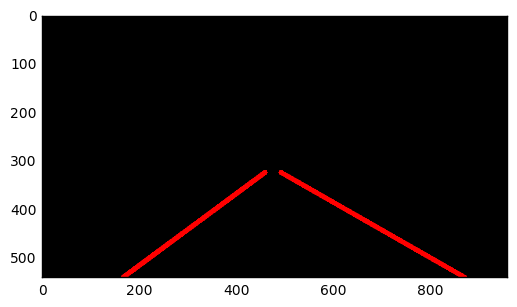

 31%|█████████████████████████                                                        | 211/682 [02:06<05:09,  1.52it/s]

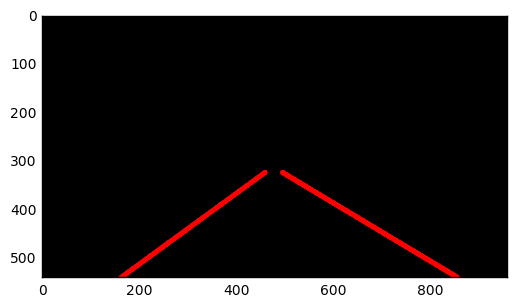

 31%|█████████████████████████▏                                                       | 212/682 [02:07<04:58,  1.58it/s]

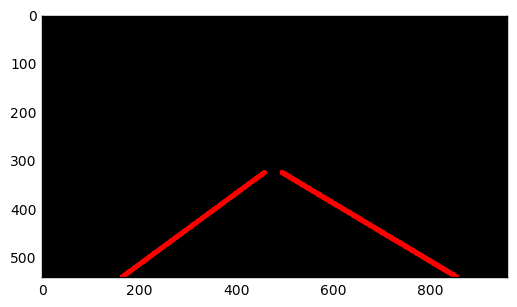

 31%|█████████████████████████▎                                                       | 213/682 [02:07<04:39,  1.68it/s]

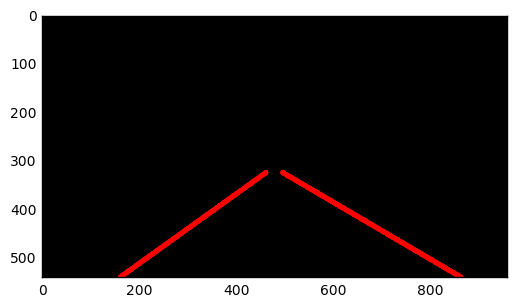

 31%|█████████████████████████▍                                                       | 214/682 [02:08<04:25,  1.77it/s]

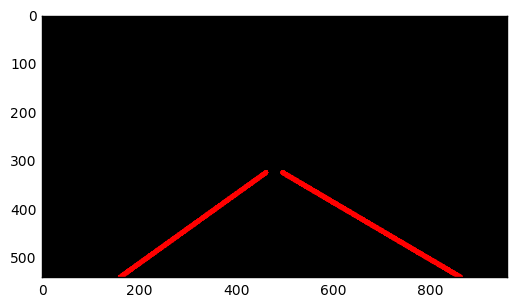

 32%|█████████████████████████▌                                                       | 215/682 [02:08<04:15,  1.82it/s]

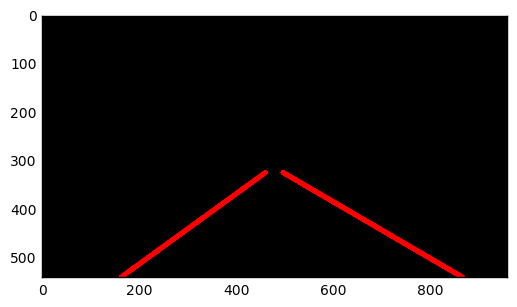

 32%|█████████████████████████▋                                                       | 216/682 [02:09<04:08,  1.87it/s]

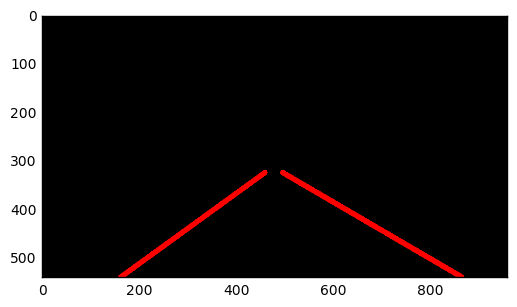

 32%|█████████████████████████▊                                                       | 217/682 [02:09<04:12,  1.84it/s]

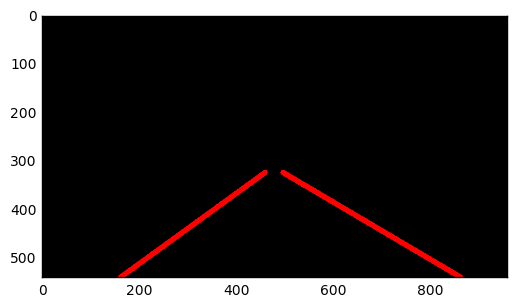

 32%|█████████████████████████▉                                                       | 218/682 [02:10<04:11,  1.84it/s]

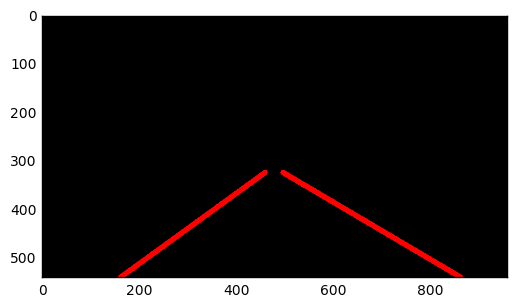

 32%|██████████████████████████                                                       | 219/682 [02:10<04:11,  1.84it/s]

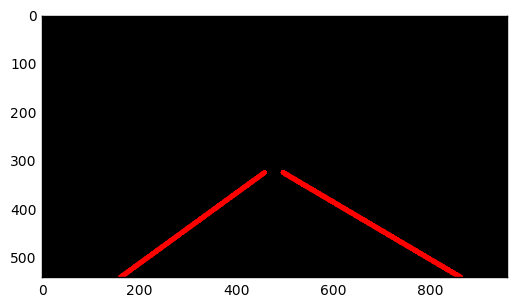

 32%|██████████████████████████▏                                                      | 220/682 [02:11<04:39,  1.65it/s]

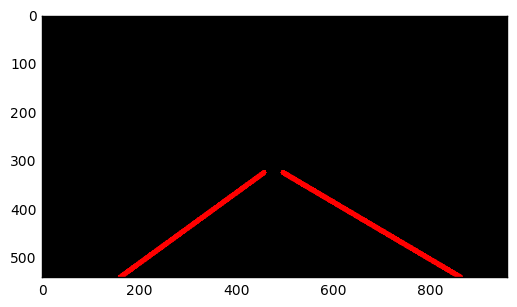

 32%|██████████████████████████▏                                                      | 221/682 [02:12<04:29,  1.71it/s]

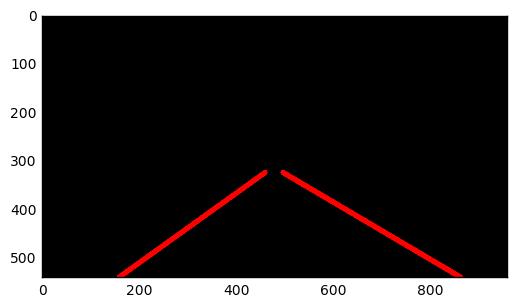

 33%|██████████████████████████▎                                                      | 222/682 [02:12<04:17,  1.78it/s]

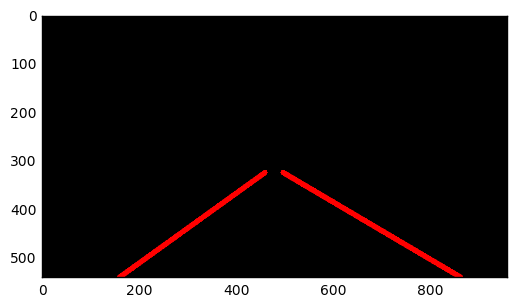

 33%|██████████████████████████▍                                                      | 223/682 [02:13<04:10,  1.83it/s]

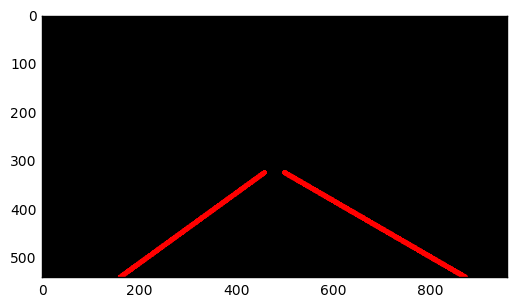

 33%|██████████████████████████▌                                                      | 224/682 [02:13<04:03,  1.88it/s]

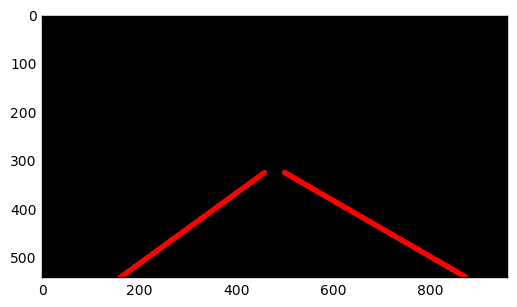

 33%|██████████████████████████▋                                                      | 225/682 [02:14<04:02,  1.89it/s]

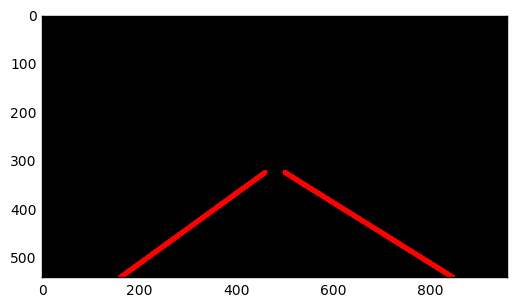

 33%|██████████████████████████▊                                                      | 226/682 [02:14<03:56,  1.92it/s]

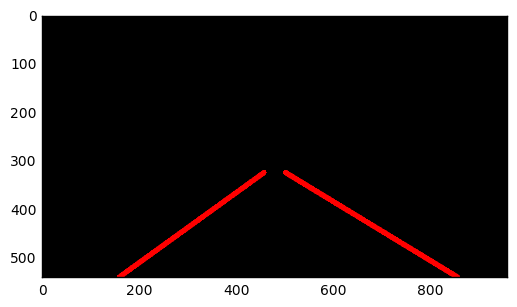

 33%|██████████████████████████▉                                                      | 227/682 [02:15<04:07,  1.83it/s]

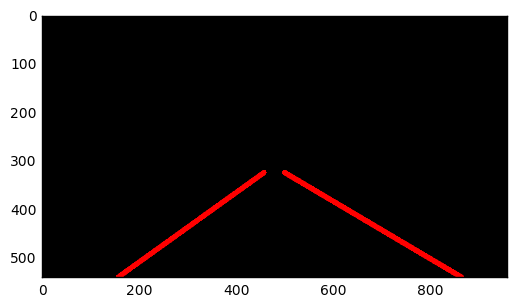

 33%|███████████████████████████                                                      | 228/682 [02:15<04:07,  1.83it/s]

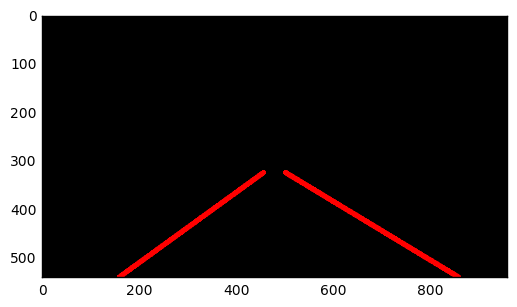

 34%|███████████████████████████▏                                                     | 229/682 [02:16<04:05,  1.85it/s]

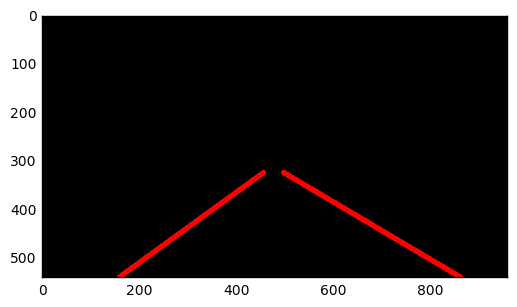

 34%|███████████████████████████▎                                                     | 230/682 [02:16<04:06,  1.83it/s]

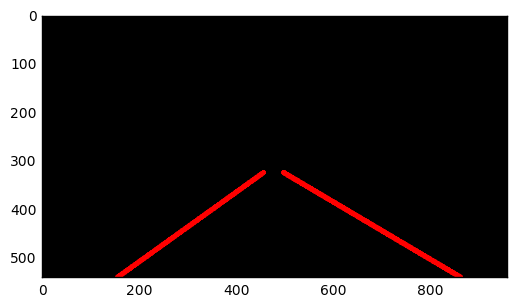

 34%|███████████████████████████▍                                                     | 231/682 [02:17<04:25,  1.70it/s]

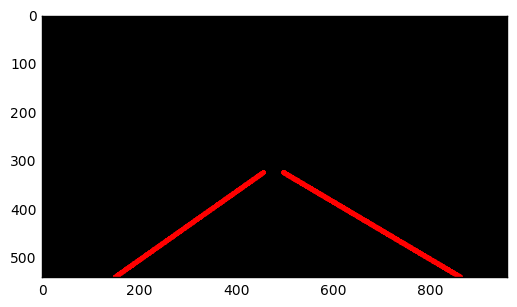

 34%|███████████████████████████▌                                                     | 232/682 [02:18<04:15,  1.76it/s]

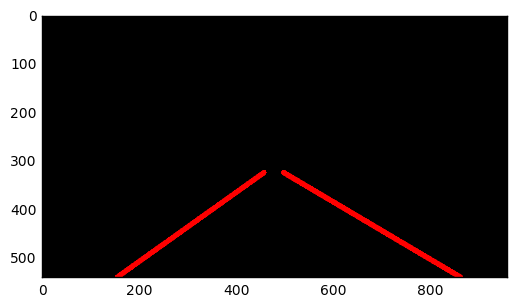

 34%|███████████████████████████▋                                                     | 233/682 [02:18<04:04,  1.83it/s]

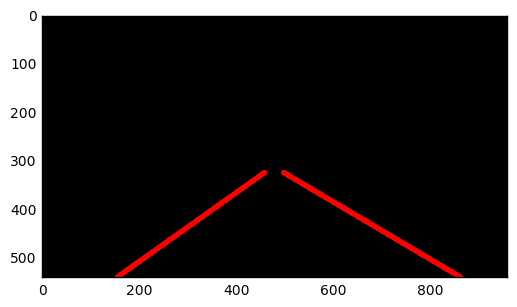

 34%|███████████████████████████▊                                                     | 234/682 [02:19<03:57,  1.89it/s]

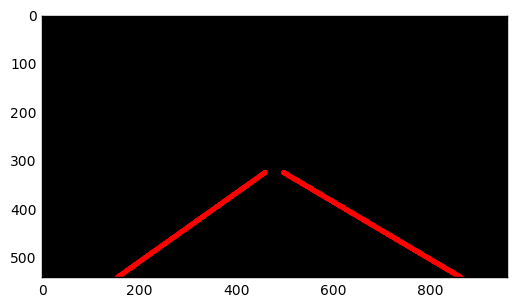

 34%|███████████████████████████▉                                                     | 235/682 [02:19<03:52,  1.92it/s]

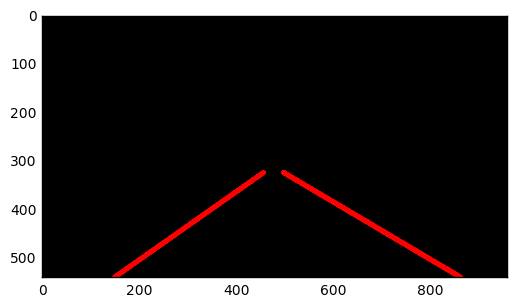

 35%|████████████████████████████                                                     | 236/682 [02:20<03:52,  1.92it/s]

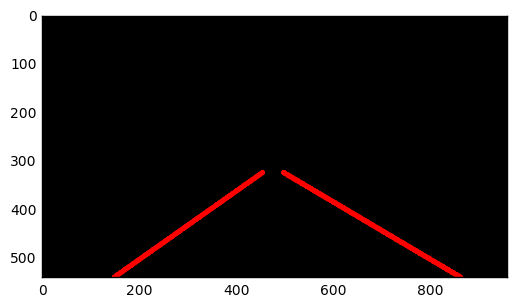

 35%|████████████████████████████▏                                                    | 237/682 [02:20<04:37,  1.60it/s]

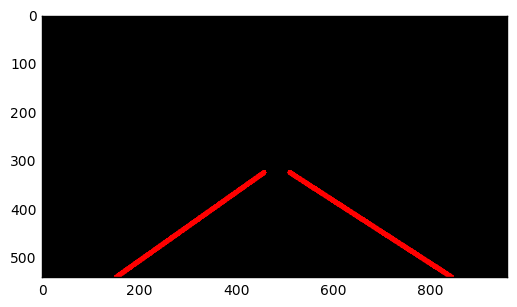

 35%|████████████████████████████▎                                                    | 238/682 [02:21<04:33,  1.62it/s]

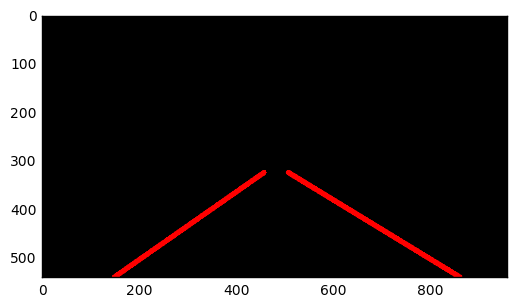

 35%|████████████████████████████▍                                                    | 239/682 [02:22<04:24,  1.68it/s]

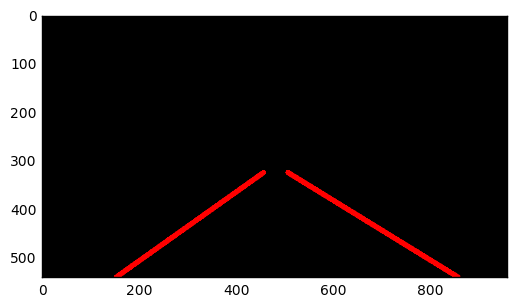

 35%|████████████████████████████▌                                                    | 240/682 [02:22<04:09,  1.77it/s]

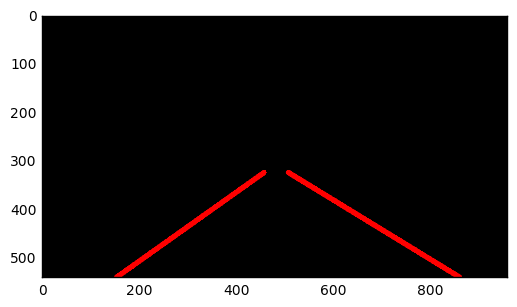

 35%|████████████████████████████▌                                                    | 241/682 [02:23<04:01,  1.83it/s]

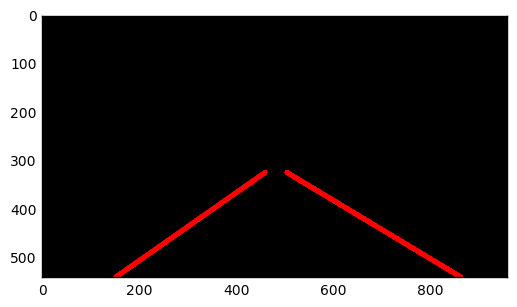

 35%|████████████████████████████▋                                                    | 242/682 [02:23<04:22,  1.68it/s]

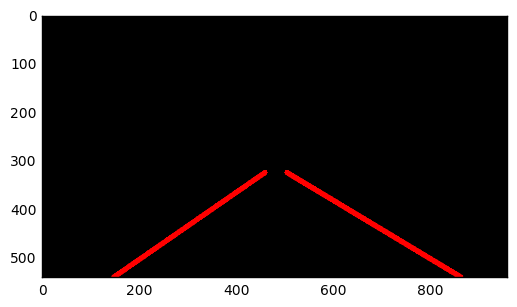

 36%|████████████████████████████▊                                                    | 243/682 [02:24<04:08,  1.77it/s]

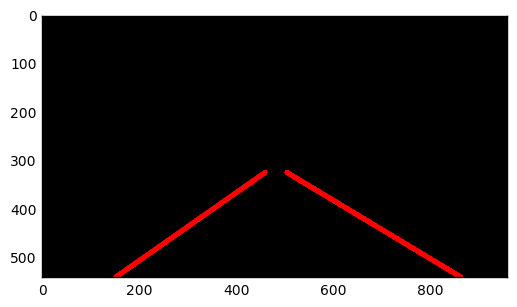

 36%|████████████████████████████▉                                                    | 244/682 [02:24<04:01,  1.81it/s]

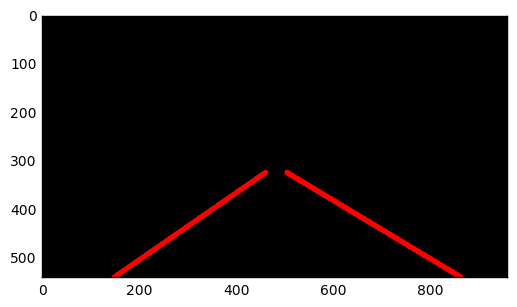

 36%|█████████████████████████████                                                    | 245/682 [02:25<03:52,  1.88it/s]

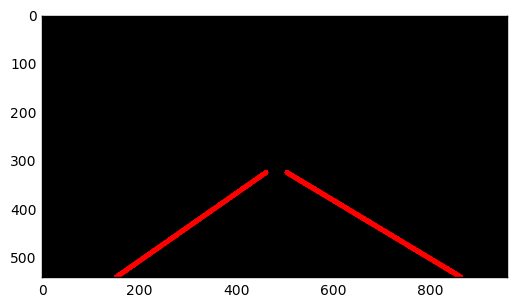

 36%|█████████████████████████████▏                                                   | 246/682 [02:25<03:49,  1.90it/s]

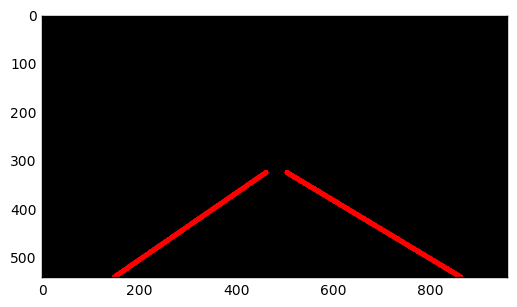

 36%|█████████████████████████████▎                                                   | 247/682 [02:26<03:45,  1.93it/s]

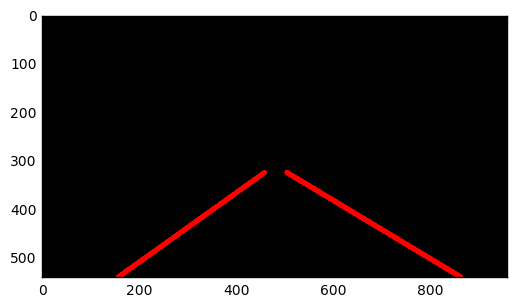

 36%|█████████████████████████████▍                                                   | 248/682 [02:26<03:46,  1.92it/s]

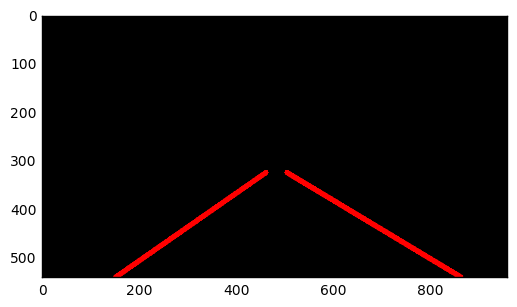

 37%|█████████████████████████████▌                                                   | 249/682 [02:27<03:41,  1.95it/s]

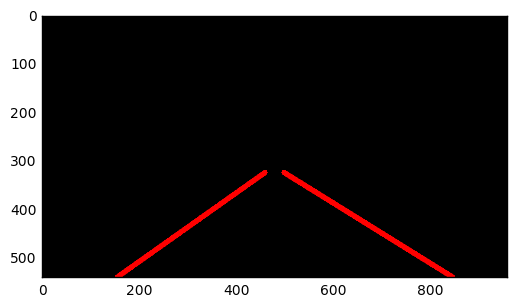

 37%|█████████████████████████████▋                                                   | 250/682 [02:27<03:43,  1.94it/s]

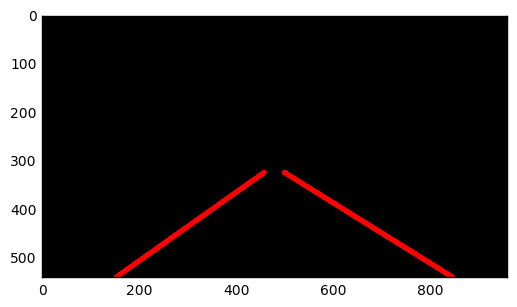

 37%|█████████████████████████████▊                                                   | 251/682 [02:28<03:41,  1.95it/s]

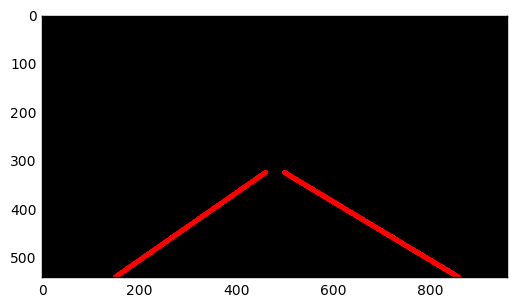

 37%|█████████████████████████████▉                                                   | 252/682 [02:28<03:44,  1.91it/s]

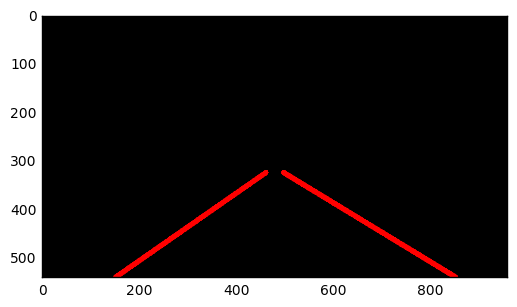

 37%|██████████████████████████████                                                   | 253/682 [02:29<04:09,  1.72it/s]

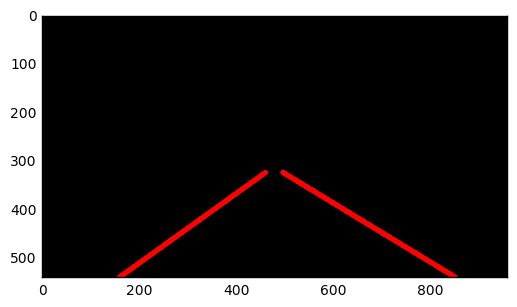

 37%|██████████████████████████████▏                                                  | 254/682 [02:30<04:04,  1.75it/s]

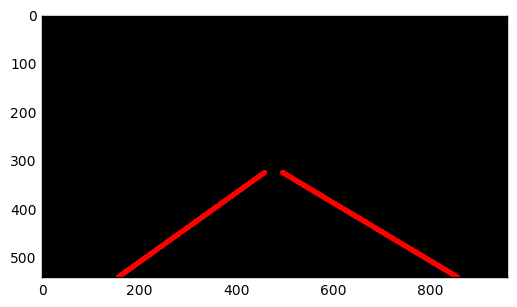

 37%|██████████████████████████████▎                                                  | 255/682 [02:30<03:59,  1.78it/s]

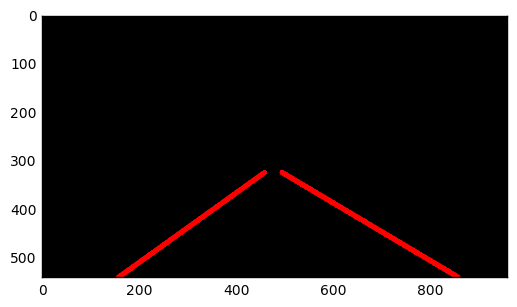

 38%|██████████████████████████████▍                                                  | 256/682 [02:31<03:53,  1.83it/s]

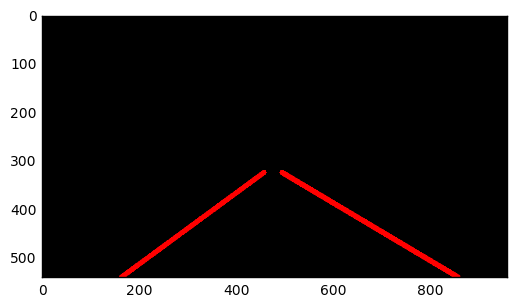

 38%|██████████████████████████████▌                                                  | 257/682 [02:31<03:47,  1.87it/s]

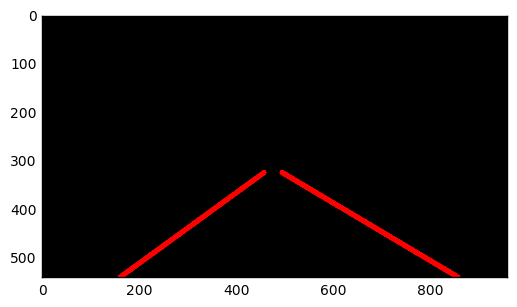

 38%|██████████████████████████████▋                                                  | 258/682 [02:32<03:41,  1.91it/s]

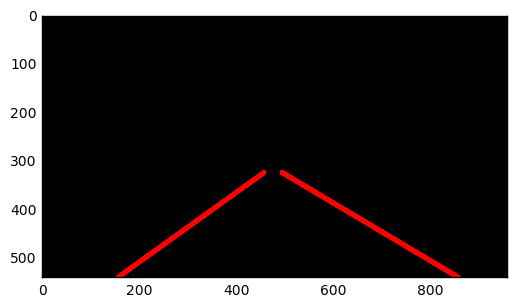

 38%|██████████████████████████████▊                                                  | 259/682 [02:32<03:39,  1.93it/s]

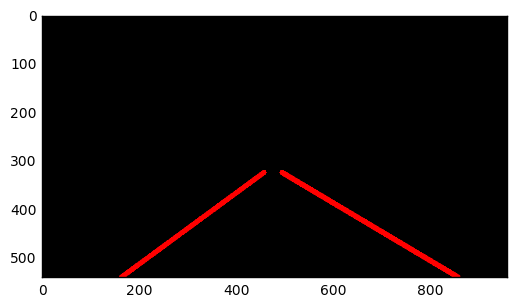

 38%|██████████████████████████████▉                                                  | 260/682 [02:33<03:35,  1.96it/s]

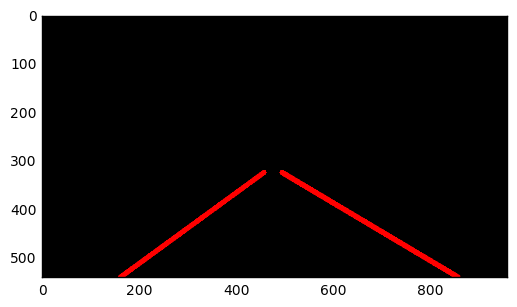

 38%|██████████████████████████████▉                                                  | 261/682 [02:33<03:35,  1.95it/s]

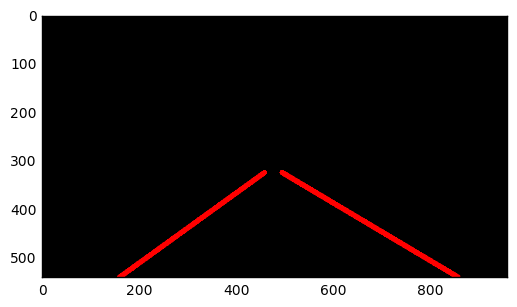

 38%|███████████████████████████████                                                  | 262/682 [02:34<03:33,  1.97it/s]

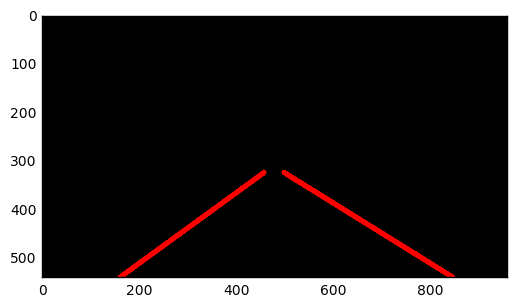

 39%|███████████████████████████████▏                                                 | 263/682 [02:34<03:33,  1.96it/s]

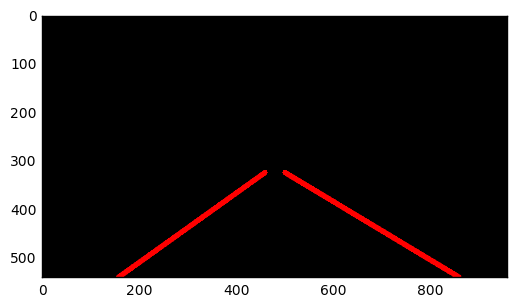

 39%|███████████████████████████████▎                                                 | 264/682 [02:35<04:04,  1.71it/s]

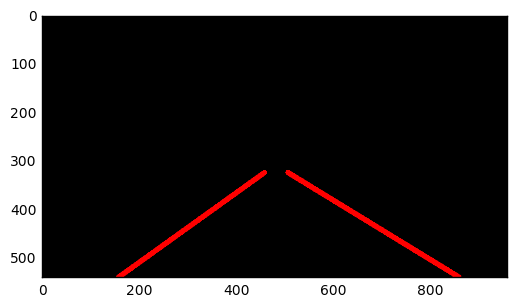

 39%|███████████████████████████████▍                                                 | 265/682 [02:36<04:01,  1.73it/s]

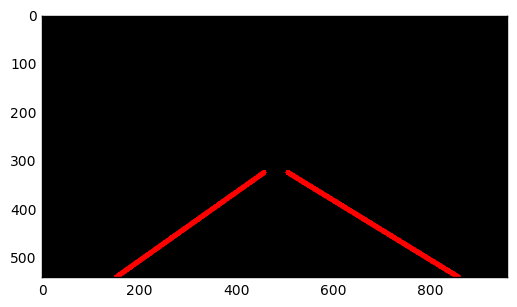

 39%|███████████████████████████████▌                                                 | 266/682 [02:36<03:59,  1.73it/s]

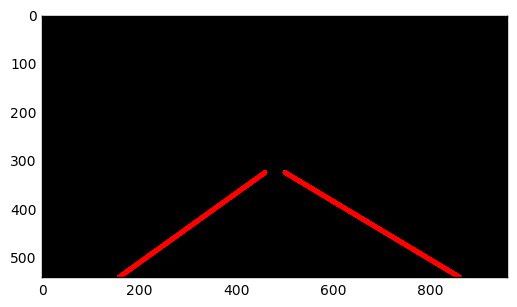

 39%|███████████████████████████████▋                                                 | 267/682 [02:37<03:53,  1.78it/s]

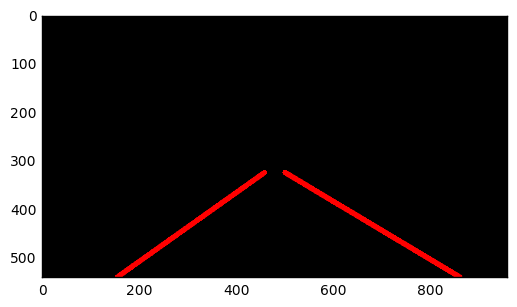

 39%|███████████████████████████████▊                                                 | 268/682 [02:37<03:46,  1.83it/s]

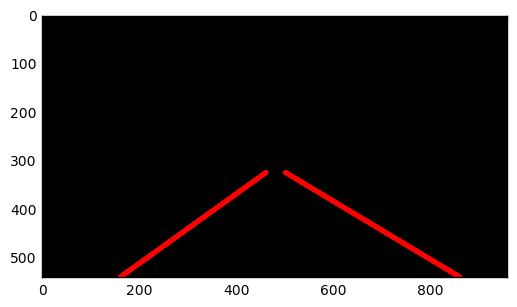

 39%|███████████████████████████████▉                                                 | 269/682 [02:38<03:37,  1.89it/s]

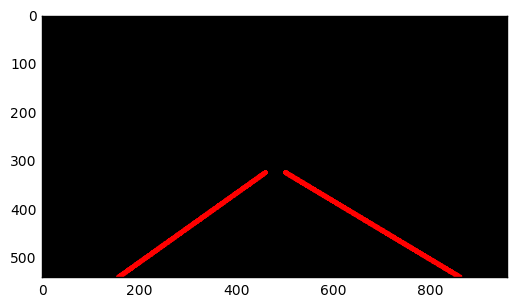

 40%|████████████████████████████████                                                 | 270/682 [02:38<03:36,  1.90it/s]

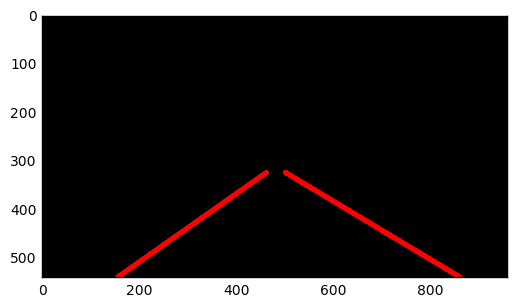

 40%|████████████████████████████████▏                                                | 271/682 [02:39<03:32,  1.93it/s]

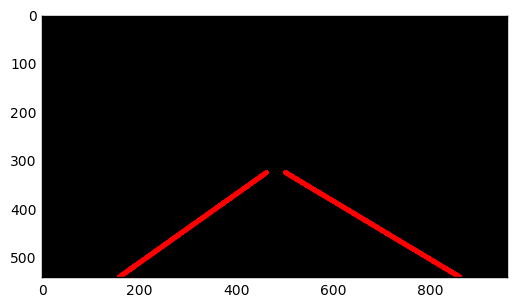

 40%|████████████████████████████████▎                                                | 272/682 [02:39<03:31,  1.94it/s]

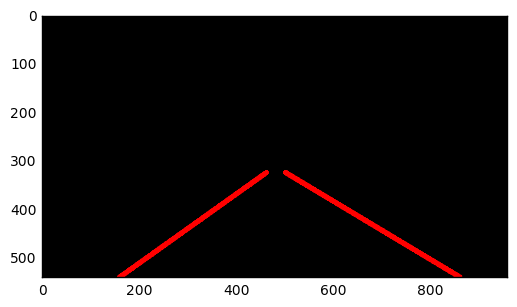

 40%|████████████████████████████████▍                                                | 273/682 [02:40<03:31,  1.93it/s]

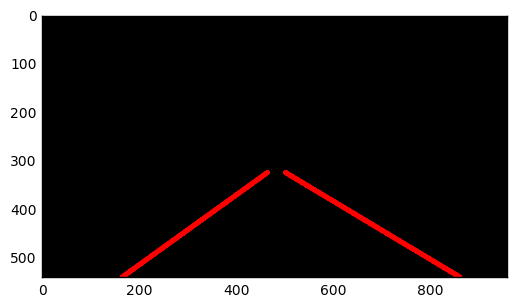

 40%|████████████████████████████████▌                                                | 274/682 [02:40<03:51,  1.76it/s]

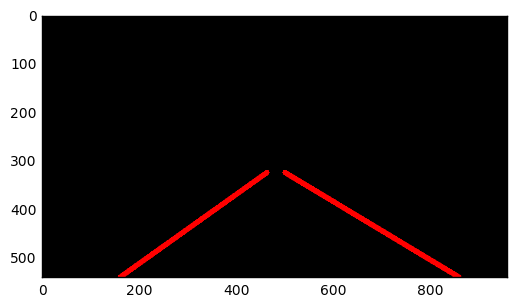

 40%|████████████████████████████████▋                                                | 275/682 [02:41<04:13,  1.61it/s]

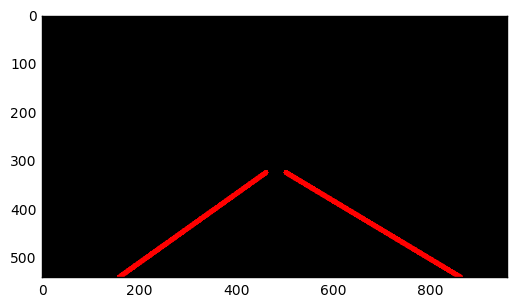

 40%|████████████████████████████████▊                                                | 276/682 [02:42<03:59,  1.70it/s]

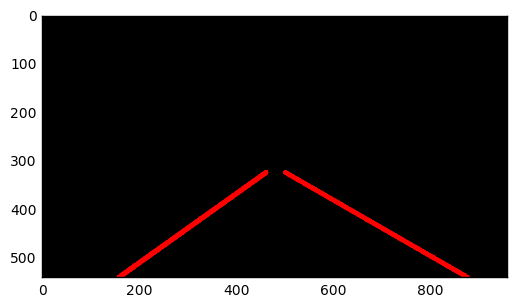

 41%|████████████████████████████████▉                                                | 277/682 [02:42<03:50,  1.76it/s]

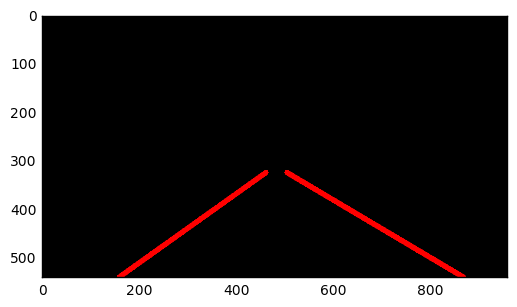

 41%|█████████████████████████████████                                                | 278/682 [02:43<03:47,  1.78it/s]

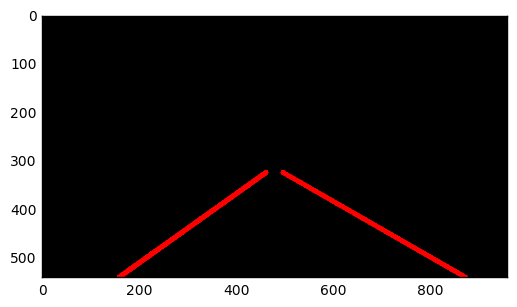

 41%|█████████████████████████████████▏                                               | 279/682 [02:43<04:08,  1.62it/s]

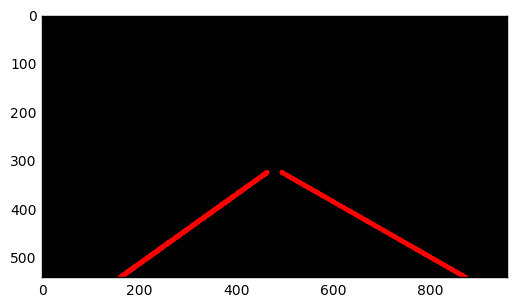

 41%|█████████████████████████████████▎                                               | 280/682 [02:44<04:24,  1.52it/s]

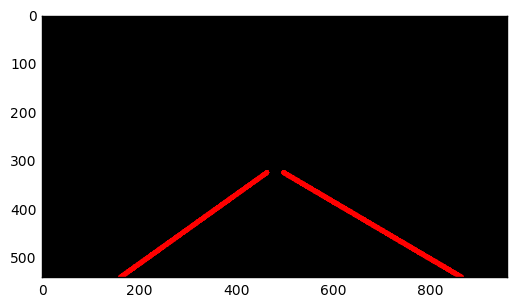

 41%|█████████████████████████████████▎                                               | 281/682 [02:45<04:46,  1.40it/s]

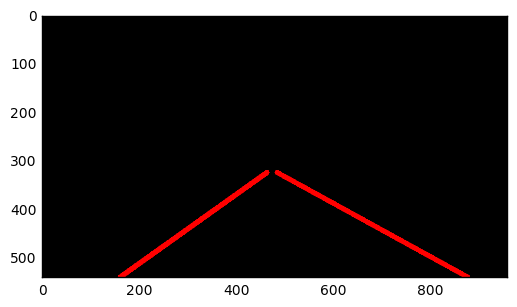

 41%|█████████████████████████████████▍                                               | 282/682 [02:46<05:22,  1.24it/s]

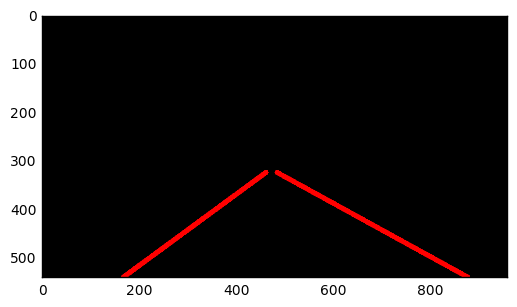

 41%|█████████████████████████████████▌                                               | 283/682 [02:47<05:02,  1.32it/s]

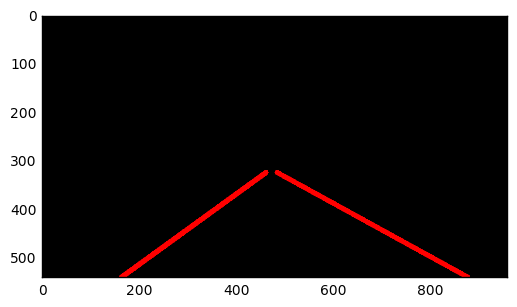

 42%|█████████████████████████████████▋                                               | 284/682 [02:47<04:41,  1.41it/s]

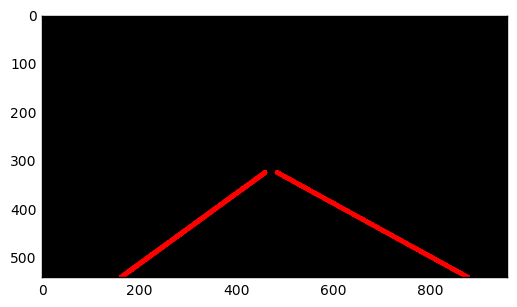

 42%|█████████████████████████████████▊                                               | 285/682 [02:48<04:17,  1.54it/s]

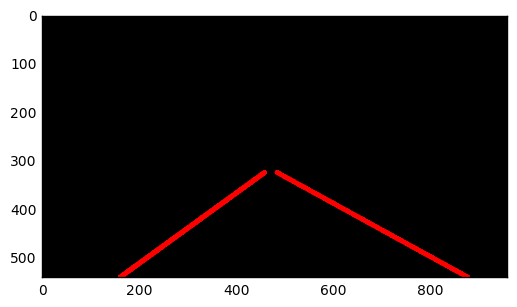

 42%|█████████████████████████████████▉                                               | 286/682 [02:49<04:36,  1.43it/s]

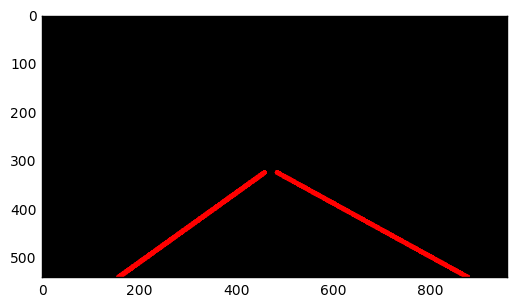

 42%|██████████████████████████████████                                               | 287/682 [02:49<04:15,  1.54it/s]

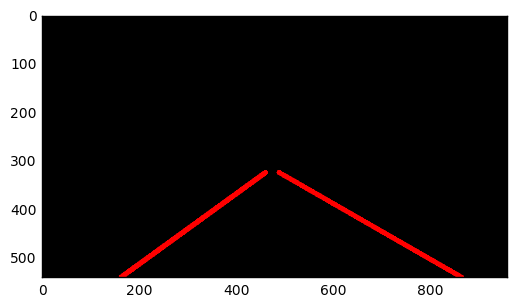

 42%|██████████████████████████████████▏                                              | 288/682 [02:50<04:06,  1.60it/s]

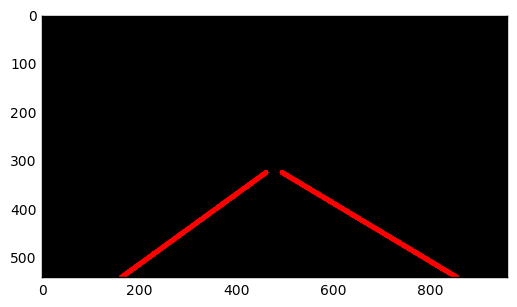

 42%|██████████████████████████████████▎                                              | 289/682 [02:50<04:17,  1.53it/s]

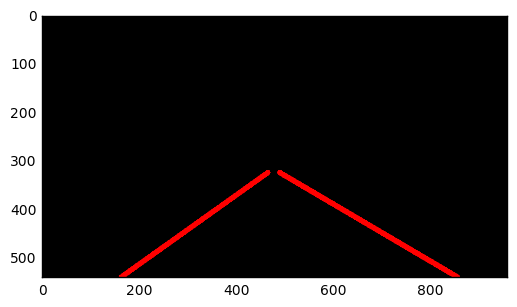

 43%|██████████████████████████████████▍                                              | 290/682 [02:51<04:05,  1.59it/s]

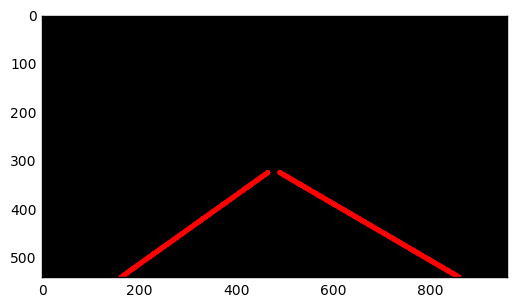

 43%|██████████████████████████████████▌                                              | 291/682 [02:52<03:59,  1.63it/s]

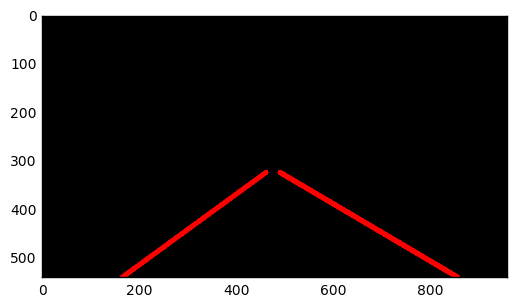

 43%|██████████████████████████████████▋                                              | 292/682 [02:52<03:48,  1.71it/s]

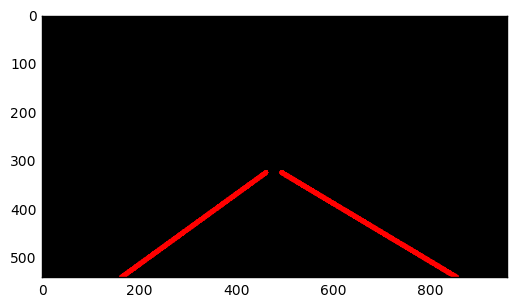

 43%|██████████████████████████████████▊                                              | 293/682 [02:53<03:44,  1.74it/s]

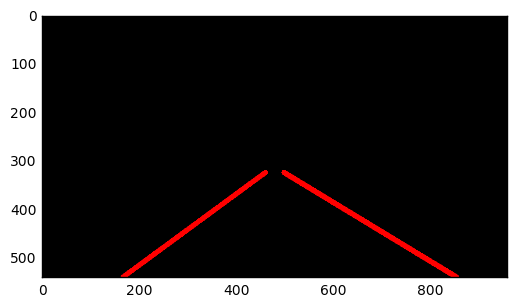

 43%|██████████████████████████████████▉                                              | 294/682 [02:53<03:42,  1.74it/s]

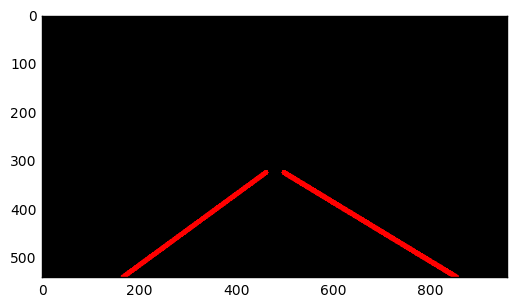

 43%|███████████████████████████████████                                              | 295/682 [02:54<03:44,  1.72it/s]

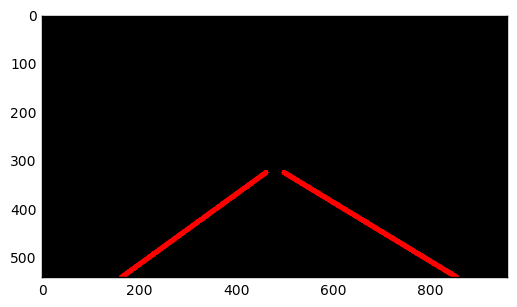

 43%|███████████████████████████████████▏                                             | 296/682 [02:54<03:51,  1.67it/s]

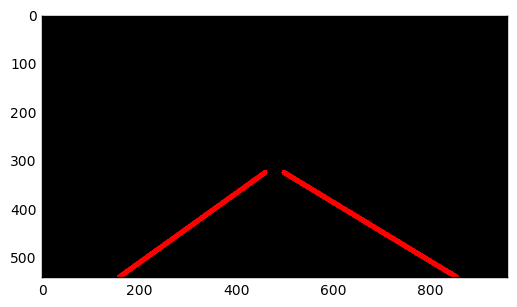

 44%|███████████████████████████████████▎                                             | 297/682 [02:55<04:32,  1.41it/s]

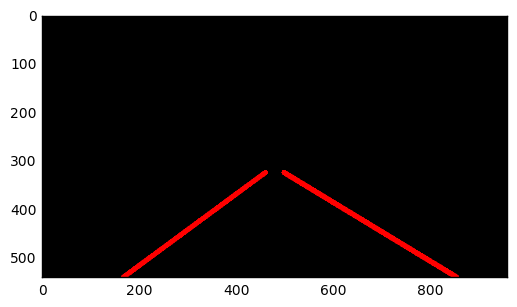

 44%|███████████████████████████████████▍                                             | 298/682 [02:56<04:29,  1.43it/s]

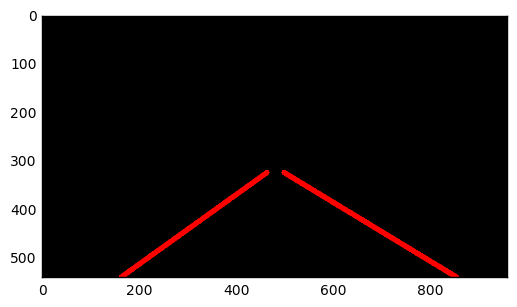

 44%|███████████████████████████████████▌                                             | 299/682 [02:57<04:17,  1.49it/s]

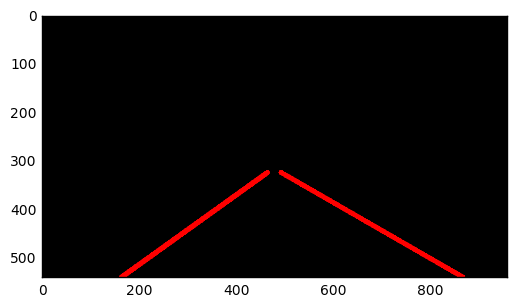

 44%|███████████████████████████████████▋                                             | 300/682 [02:57<04:13,  1.51it/s]

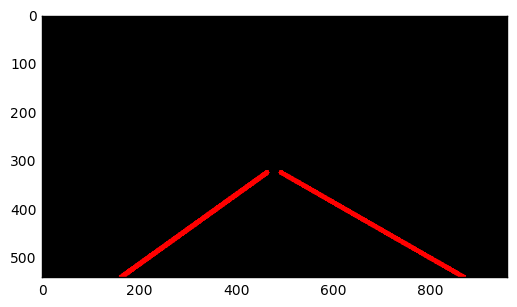

 44%|███████████████████████████████████▋                                             | 301/682 [02:58<04:02,  1.57it/s]

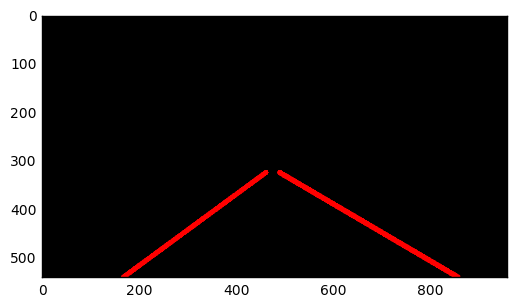

 44%|███████████████████████████████████▊                                             | 302/682 [02:59<04:21,  1.45it/s]

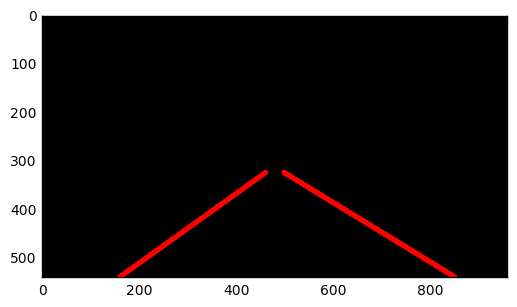

 44%|███████████████████████████████████▉                                             | 303/682 [03:00<04:40,  1.35it/s]

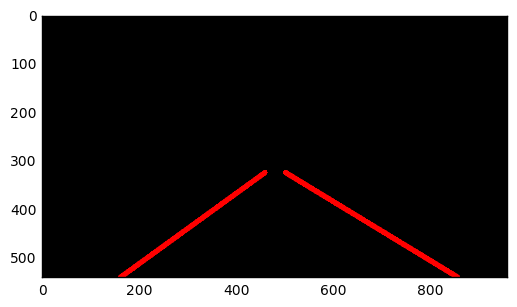

 45%|████████████████████████████████████                                             | 304/682 [03:00<04:30,  1.40it/s]

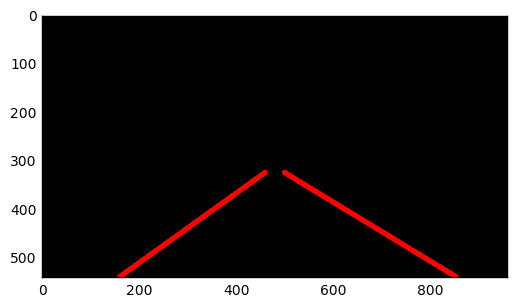

 45%|████████████████████████████████████▏                                            | 305/682 [03:01<04:18,  1.46it/s]

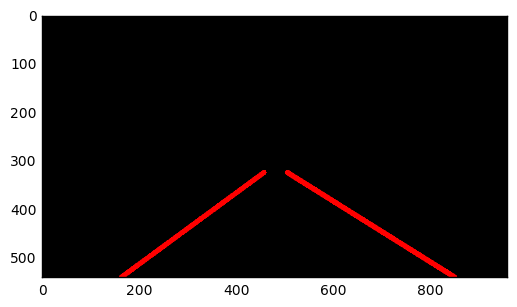

 45%|████████████████████████████████████▎                                            | 306/682 [03:02<04:13,  1.48it/s]

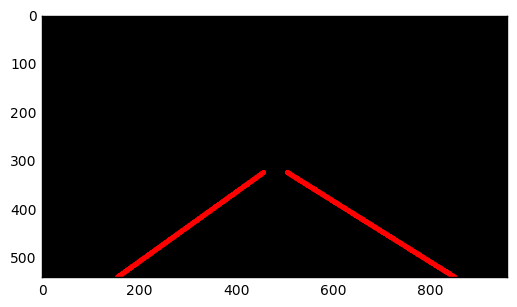

 45%|████████████████████████████████████▍                                            | 307/682 [03:02<04:00,  1.56it/s]

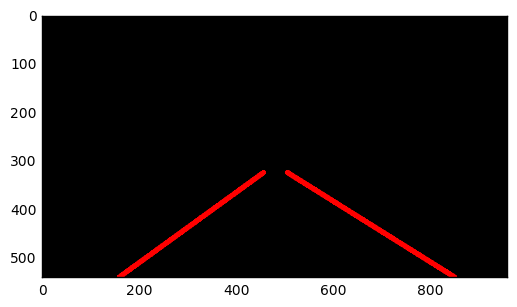

 45%|████████████████████████████████████▌                                            | 308/682 [03:03<04:44,  1.31it/s]

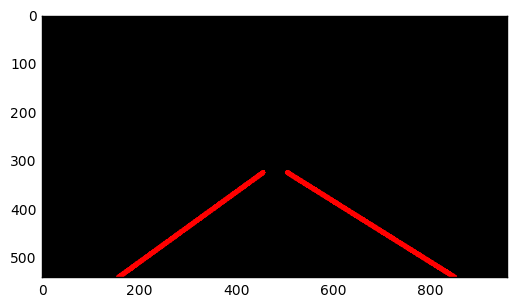

 45%|████████████████████████████████████▋                                            | 309/682 [03:04<04:43,  1.32it/s]

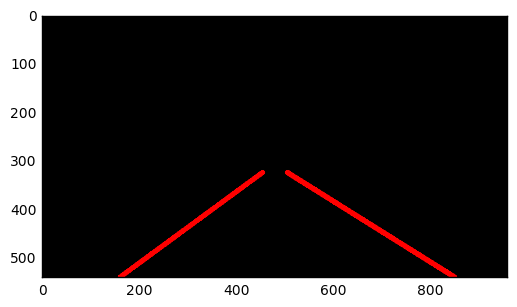

 45%|████████████████████████████████████▊                                            | 310/682 [03:05<04:33,  1.36it/s]

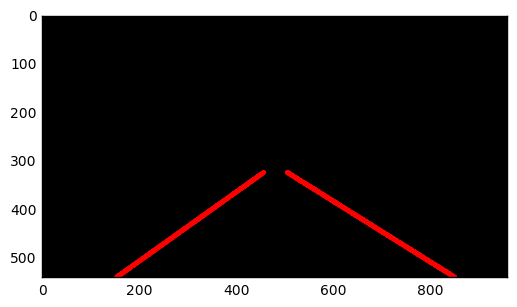

 46%|████████████████████████████████████▉                                            | 311/682 [03:05<04:31,  1.37it/s]

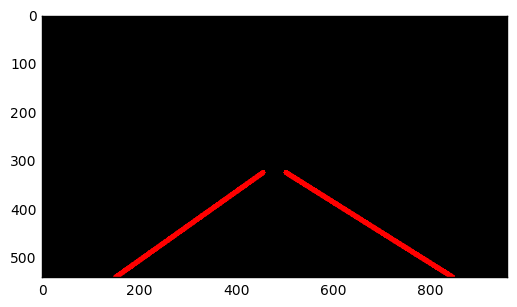

 46%|█████████████████████████████████████                                            | 312/682 [03:06<04:27,  1.38it/s]

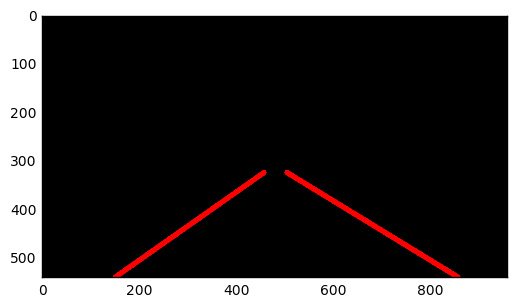

 46%|█████████████████████████████████████▏                                           | 313/682 [03:07<04:25,  1.39it/s]

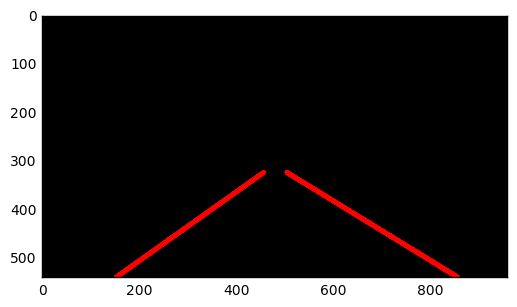

 46%|█████████████████████████████████████▎                                           | 314/682 [03:07<04:30,  1.36it/s]

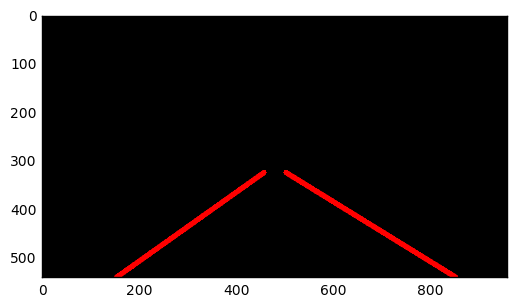

 46%|█████████████████████████████████████▍                                           | 315/682 [03:08<04:35,  1.33it/s]

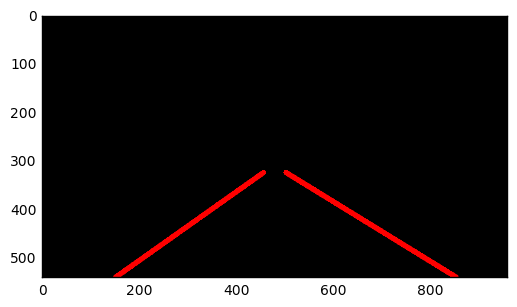

 46%|█████████████████████████████████████▌                                           | 316/682 [03:09<04:42,  1.29it/s]

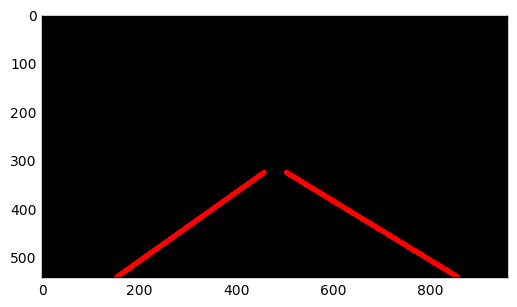

 46%|█████████████████████████████████████▋                                           | 317/682 [03:10<04:20,  1.40it/s]

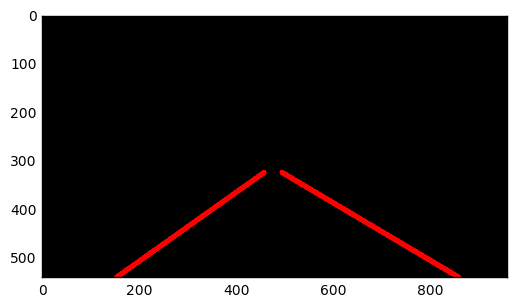

 47%|█████████████████████████████████████▊                                           | 318/682 [03:11<04:38,  1.31it/s]

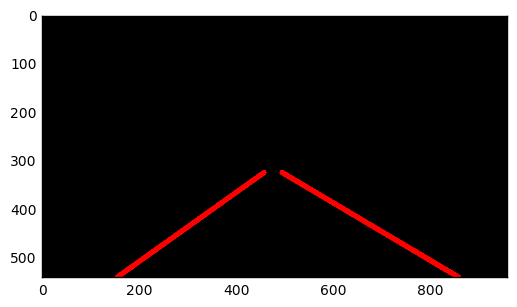

 47%|█████████████████████████████████████▉                                           | 319/682 [03:11<04:45,  1.27it/s]

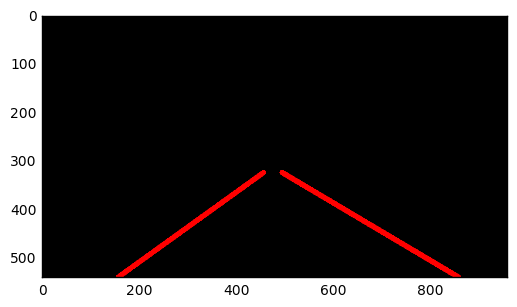

 47%|██████████████████████████████████████                                           | 320/682 [03:12<04:18,  1.40it/s]

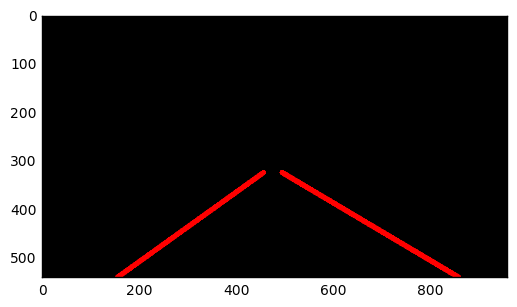

 47%|██████████████████████████████████████                                           | 321/682 [03:12<03:59,  1.51it/s]

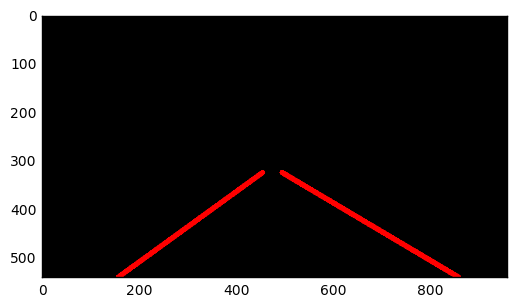

 47%|██████████████████████████████████████▏                                          | 322/682 [03:13<03:46,  1.59it/s]

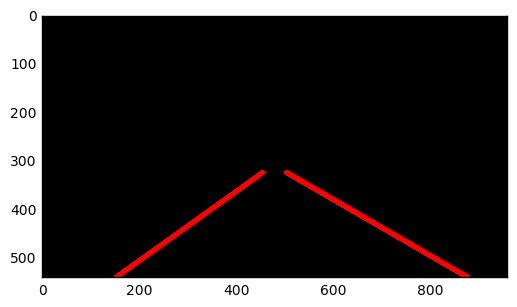

 47%|██████████████████████████████████████▎                                          | 323/682 [03:14<03:38,  1.64it/s]

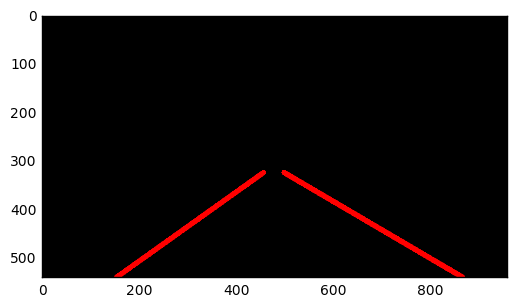

 48%|██████████████████████████████████████▍                                          | 324/682 [03:14<03:30,  1.70it/s]

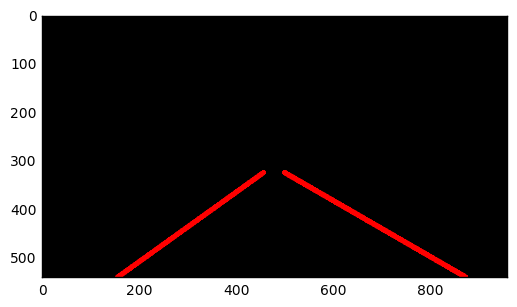

 48%|██████████████████████████████████████▌                                          | 325/682 [03:15<03:32,  1.68it/s]

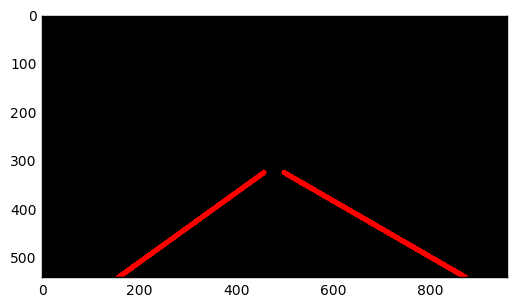

 48%|██████████████████████████████████████▋                                          | 326/682 [03:16<03:51,  1.54it/s]

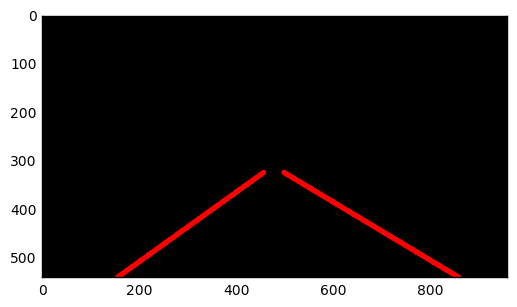

 48%|██████████████████████████████████████▊                                          | 327/682 [03:16<04:05,  1.45it/s]

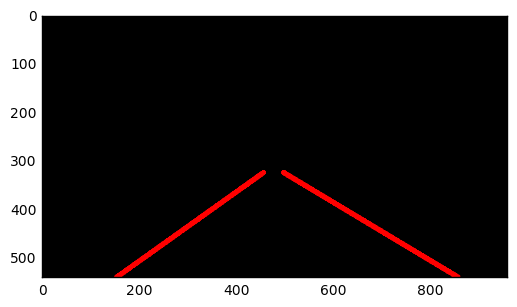

 48%|██████████████████████████████████████▉                                          | 328/682 [03:17<03:45,  1.57it/s]

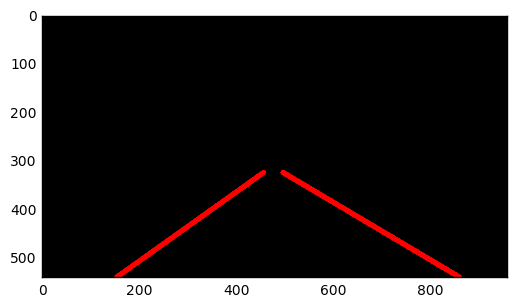

 48%|███████████████████████████████████████                                          | 329/682 [03:17<03:32,  1.66it/s]

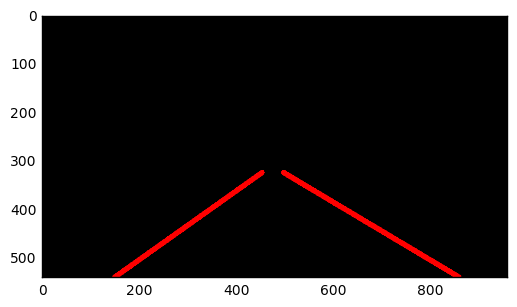

 48%|███████████████████████████████████████▏                                         | 330/682 [03:18<03:44,  1.57it/s]

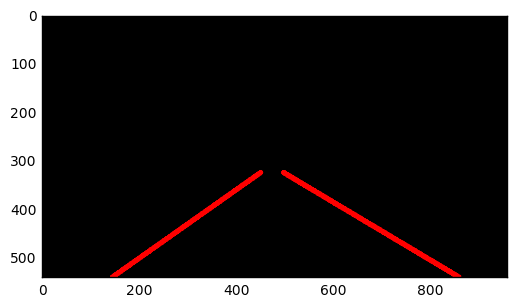

 49%|███████████████████████████████████████▎                                         | 331/682 [03:19<03:39,  1.60it/s]

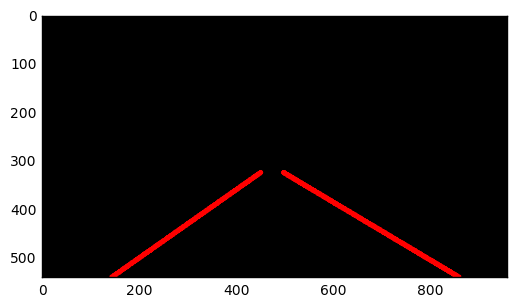

 49%|███████████████████████████████████████▍                                         | 332/682 [03:19<03:56,  1.48it/s]

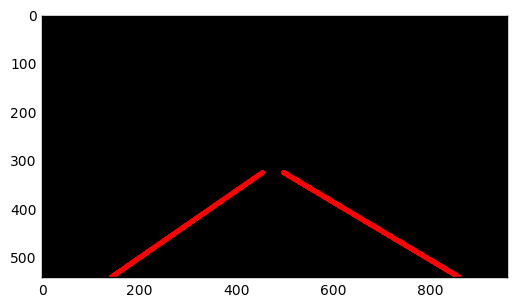

 49%|███████████████████████████████████████▌                                         | 333/682 [03:21<05:00,  1.16it/s]

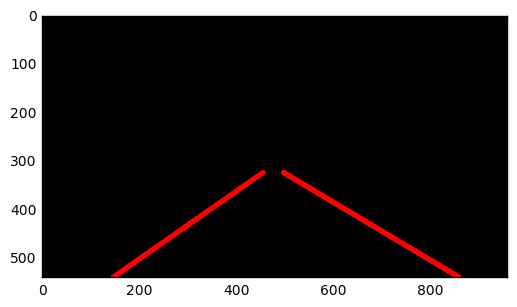

 49%|███████████████████████████████████████▋                                         | 334/682 [03:22<04:54,  1.18it/s]

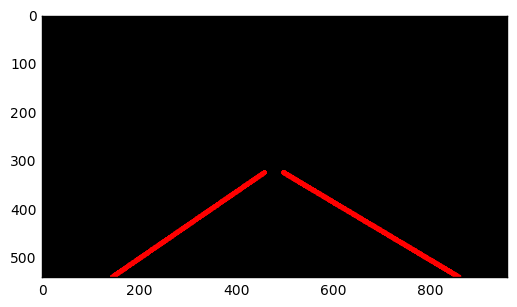

 49%|███████████████████████████████████████▊                                         | 335/682 [03:22<04:32,  1.27it/s]

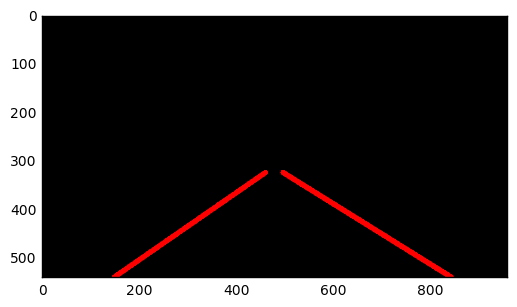

 49%|███████████████████████████████████████▉                                         | 336/682 [03:23<04:10,  1.38it/s]

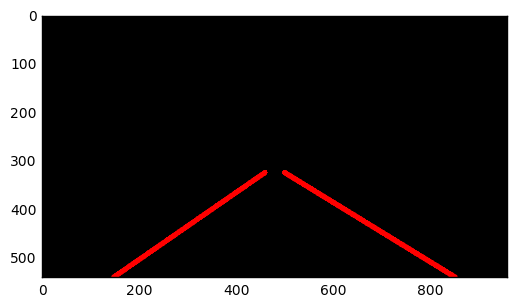

 49%|████████████████████████████████████████                                         | 337/682 [03:24<04:43,  1.22it/s]

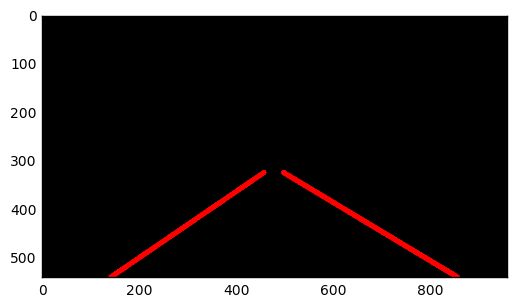

 50%|████████████████████████████████████████▏                                        | 338/682 [03:25<04:48,  1.19it/s]

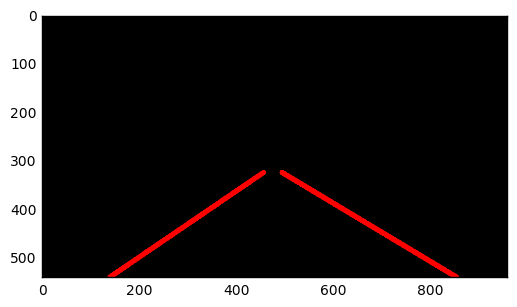

 50%|████████████████████████████████████████▎                                        | 339/682 [03:26<04:49,  1.19it/s]

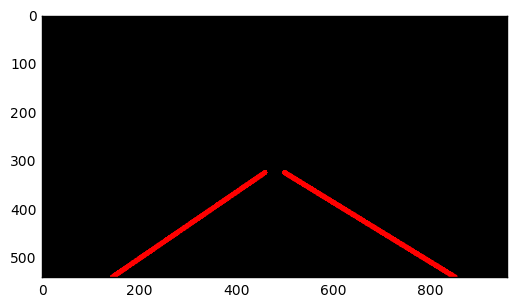

 50%|████████████████████████████████████████▍                                        | 340/682 [03:27<05:12,  1.09it/s]

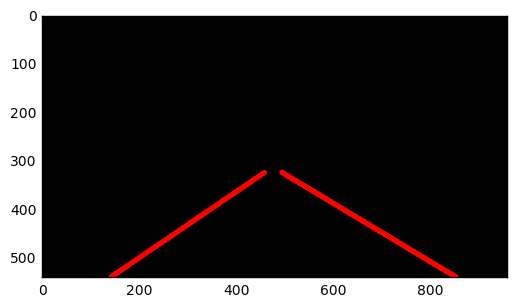

 50%|████████████████████████████████████████▌                                        | 341/682 [03:27<04:59,  1.14it/s]

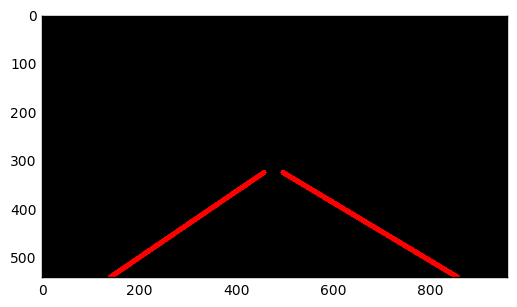

 50%|████████████████████████████████████████▌                                        | 342/682 [03:28<04:32,  1.25it/s]

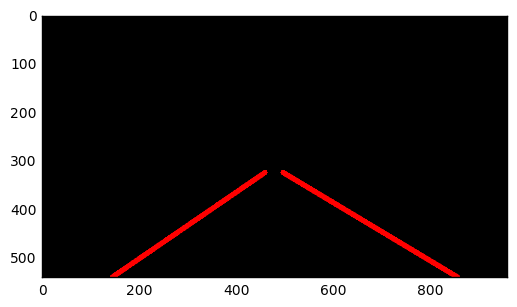

 50%|████████████████████████████████████████▋                                        | 343/682 [03:29<04:45,  1.19it/s]

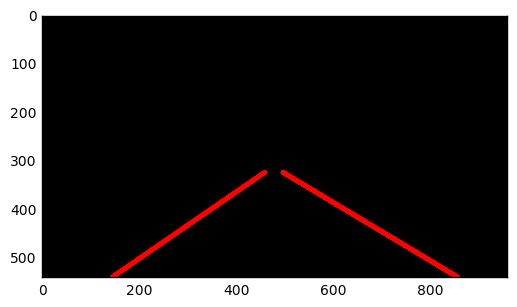

 50%|████████████████████████████████████████▊                                        | 344/682 [03:30<04:28,  1.26it/s]

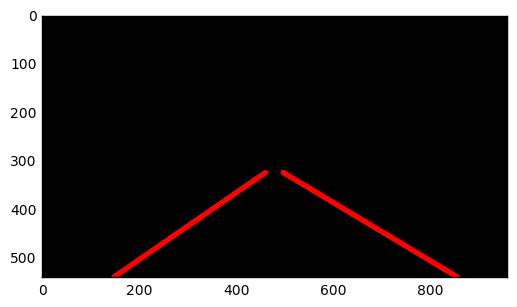

 51%|████████████████████████████████████████▉                                        | 345/682 [03:30<04:17,  1.31it/s]

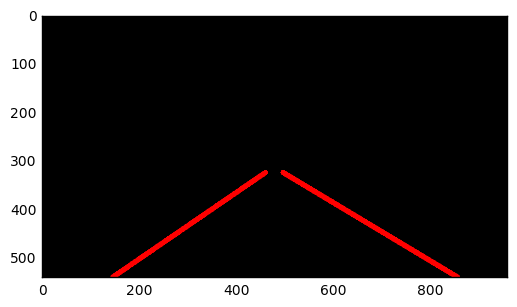

 51%|█████████████████████████████████████████                                        | 346/682 [03:31<04:08,  1.35it/s]

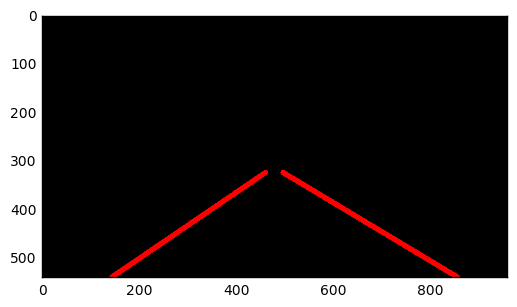

 51%|█████████████████████████████████████████▏                                       | 347/682 [03:32<03:58,  1.41it/s]

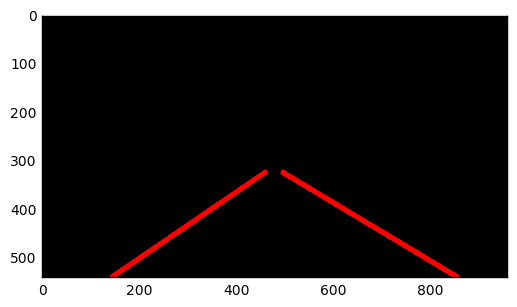

 51%|█████████████████████████████████████████▎                                       | 348/682 [03:32<03:49,  1.45it/s]

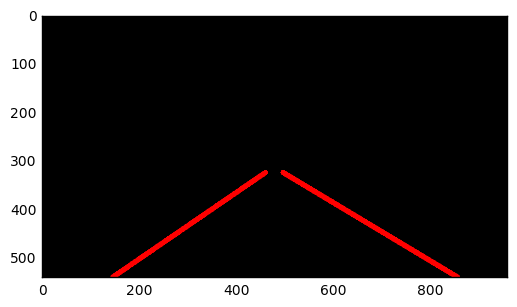

 51%|█████████████████████████████████████████▍                                       | 349/682 [03:33<03:39,  1.52it/s]

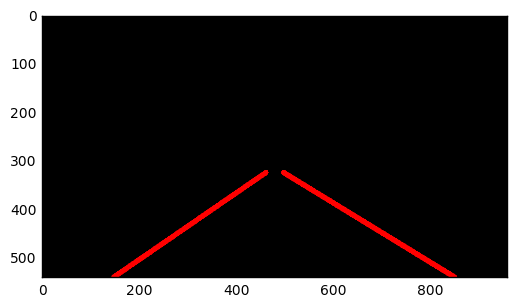

 51%|█████████████████████████████████████████▌                                       | 350/682 [03:33<03:28,  1.59it/s]

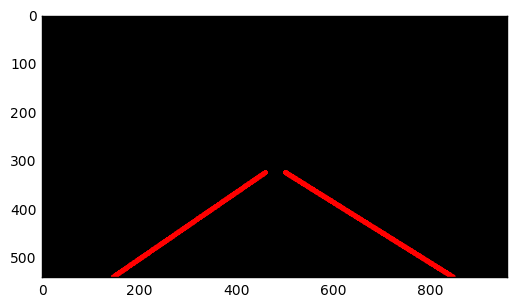

 51%|█████████████████████████████████████████▋                                       | 351/682 [03:34<03:18,  1.66it/s]

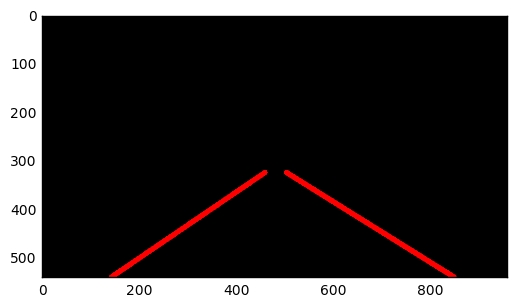

 52%|█████████████████████████████████████████▊                                       | 352/682 [03:35<03:44,  1.47it/s]

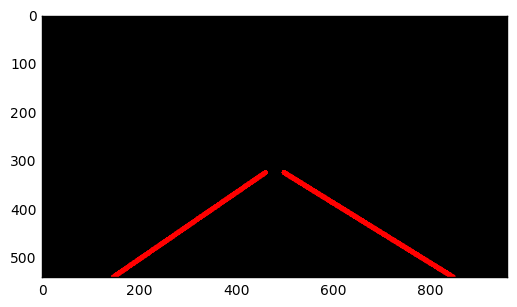

 52%|█████████████████████████████████████████▉                                       | 353/682 [03:35<03:34,  1.54it/s]

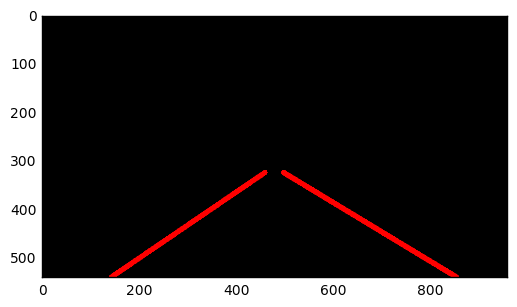

 52%|██████████████████████████████████████████                                       | 354/682 [03:36<03:24,  1.61it/s]

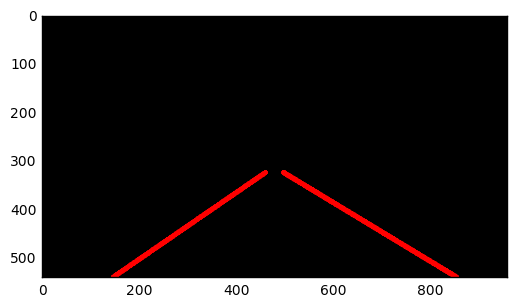

 52%|██████████████████████████████████████████▏                                      | 355/682 [03:37<03:16,  1.67it/s]

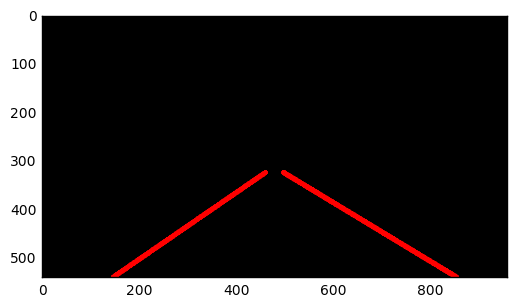

 52%|██████████████████████████████████████████▎                                      | 356/682 [03:37<03:06,  1.75it/s]

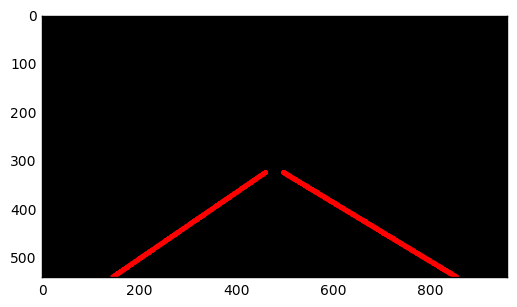

 52%|██████████████████████████████████████████▍                                      | 357/682 [03:38<03:01,  1.79it/s]

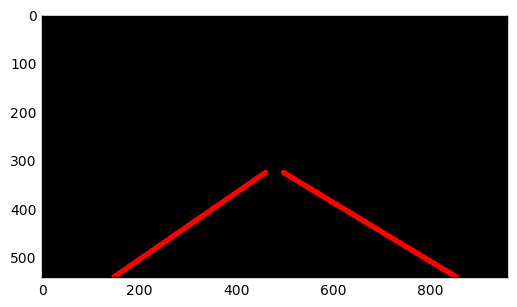

 52%|██████████████████████████████████████████▌                                      | 358/682 [03:38<02:59,  1.81it/s]

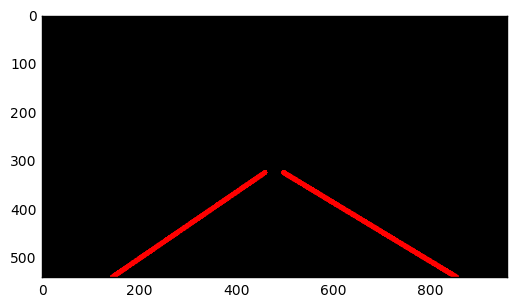

 53%|██████████████████████████████████████████▋                                      | 359/682 [03:39<02:54,  1.85it/s]

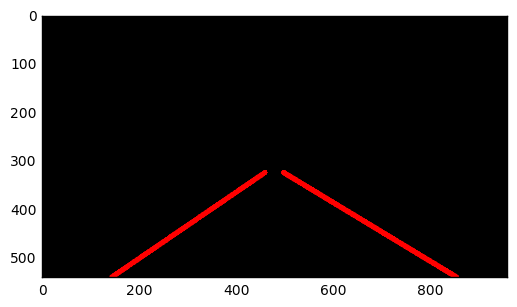

 53%|██████████████████████████████████████████▊                                      | 360/682 [03:39<02:53,  1.86it/s]

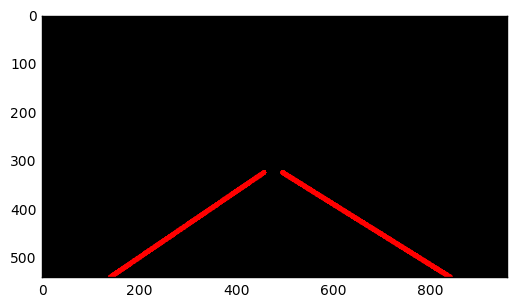

 53%|██████████████████████████████████████████▉                                      | 361/682 [03:40<02:52,  1.86it/s]

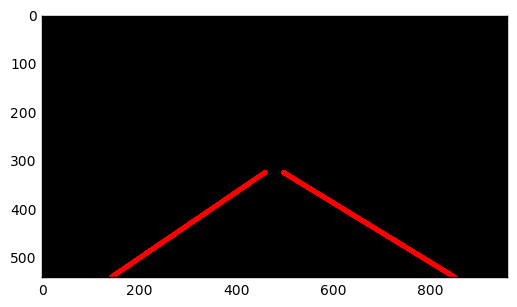

 53%|██████████████████████████████████████████▉                                      | 362/682 [03:40<02:54,  1.83it/s]

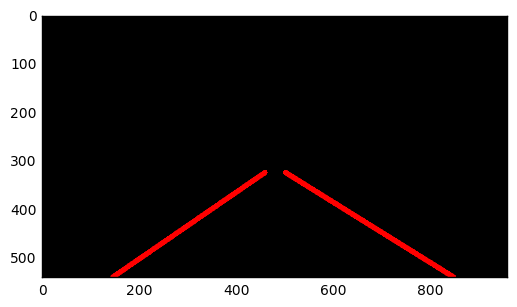

 53%|███████████████████████████████████████████                                      | 363/682 [03:41<03:18,  1.61it/s]

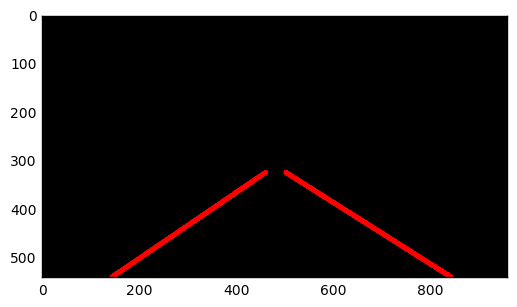

 53%|███████████████████████████████████████████▏                                     | 364/682 [03:42<03:13,  1.64it/s]

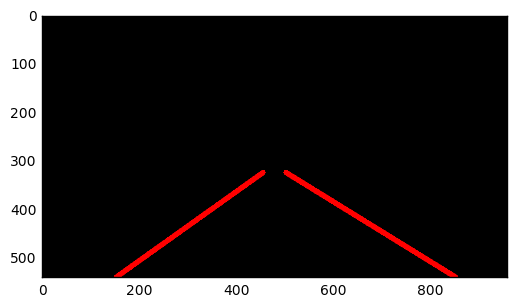

 54%|███████████████████████████████████████████▎                                     | 365/682 [03:42<03:08,  1.68it/s]

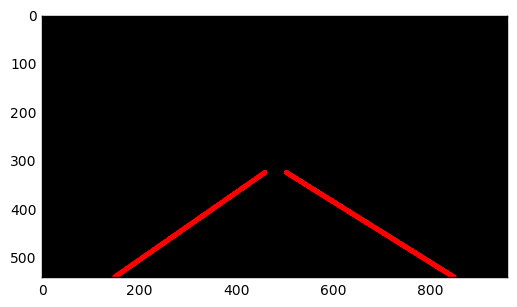

 54%|███████████████████████████████████████████▍                                     | 366/682 [03:43<02:59,  1.76it/s]

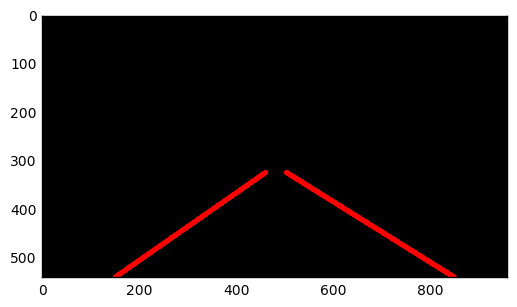

 54%|███████████████████████████████████████████▌                                     | 367/682 [03:43<02:57,  1.78it/s]

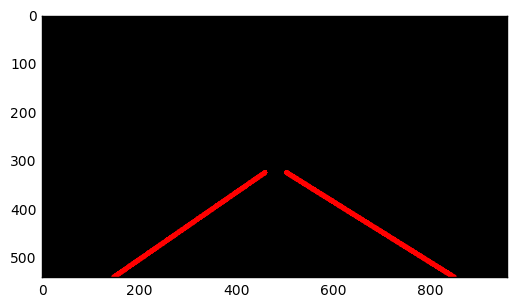

 54%|███████████████████████████████████████████▋                                     | 368/682 [03:44<02:50,  1.84it/s]

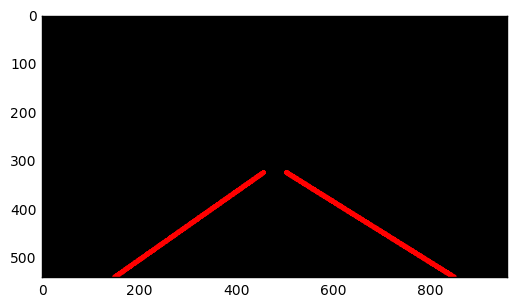

 54%|███████████████████████████████████████████▊                                     | 369/682 [03:44<02:51,  1.83it/s]

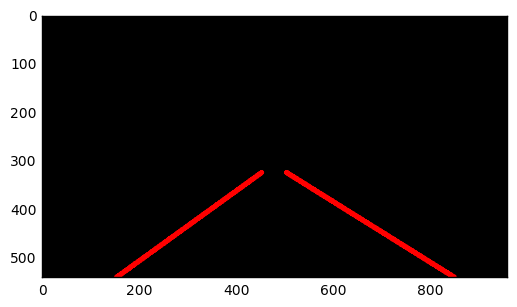

 54%|███████████████████████████████████████████▉                                     | 370/682 [03:45<02:49,  1.84it/s]

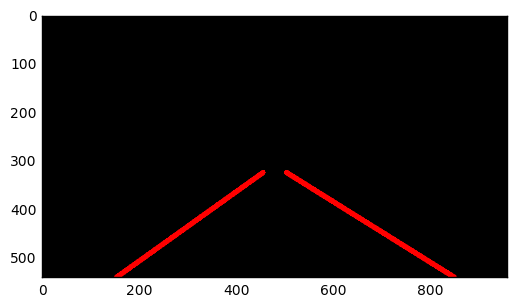

 54%|████████████████████████████████████████████                                     | 371/682 [03:45<02:49,  1.84it/s]

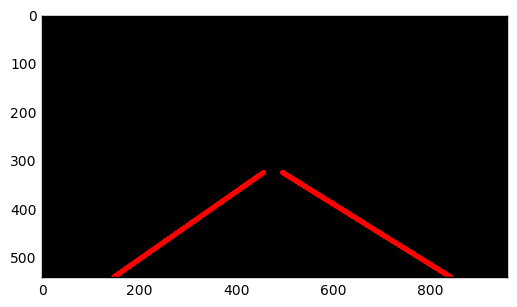

 55%|████████████████████████████████████████████▏                                    | 372/682 [03:46<02:50,  1.82it/s]

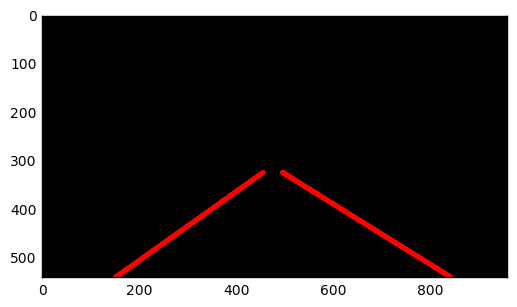

 55%|████████████████████████████████████████████▎                                    | 373/682 [03:47<03:02,  1.70it/s]

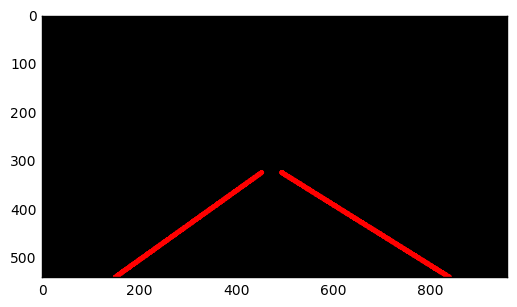

 55%|████████████████████████████████████████████▍                                    | 374/682 [03:48<03:33,  1.44it/s]

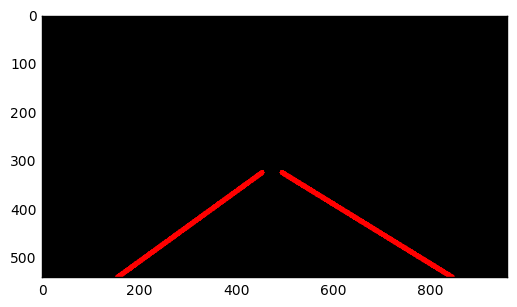

 55%|████████████████████████████████████████████▌                                    | 375/682 [03:48<03:24,  1.50it/s]

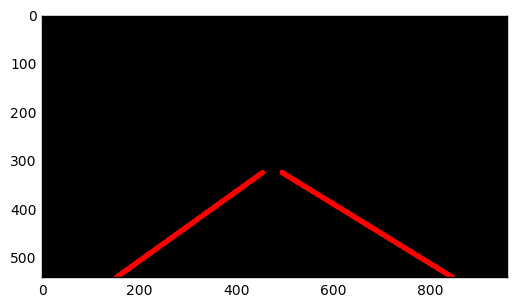

 55%|████████████████████████████████████████████▋                                    | 376/682 [03:49<03:09,  1.61it/s]

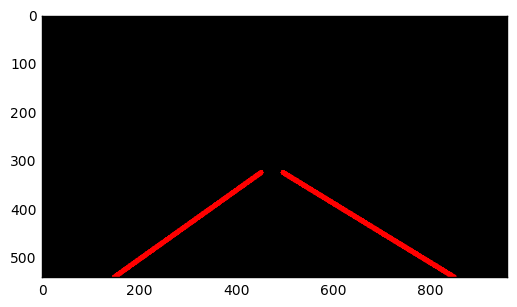

 55%|████████████████████████████████████████████▊                                    | 377/682 [03:49<03:01,  1.68it/s]

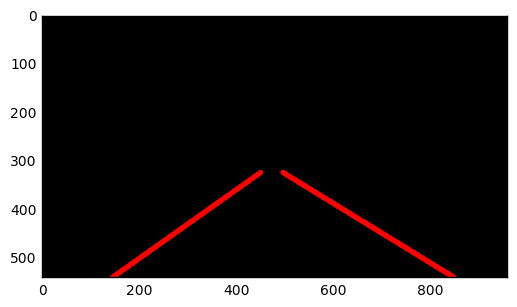

 55%|████████████████████████████████████████████▉                                    | 378/682 [03:50<02:57,  1.71it/s]

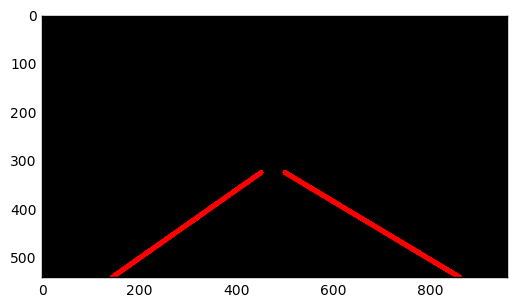

 56%|█████████████████████████████████████████████                                    | 379/682 [03:50<02:55,  1.72it/s]

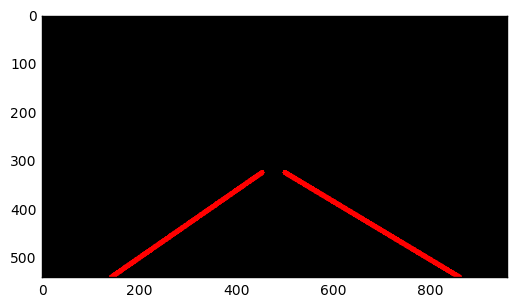

 56%|█████████████████████████████████████████████▏                                   | 380/682 [03:51<02:51,  1.77it/s]

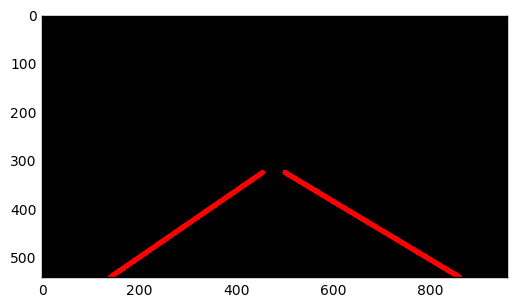

 56%|█████████████████████████████████████████████▎                                   | 381/682 [03:51<02:48,  1.79it/s]

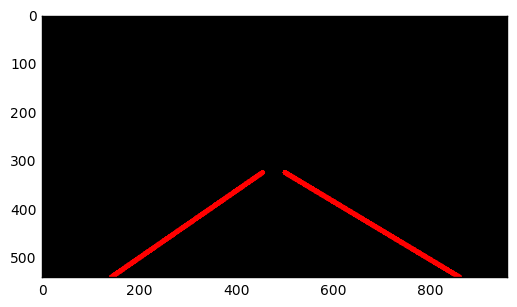

 56%|█████████████████████████████████████████████▎                                   | 382/682 [03:52<02:44,  1.83it/s]

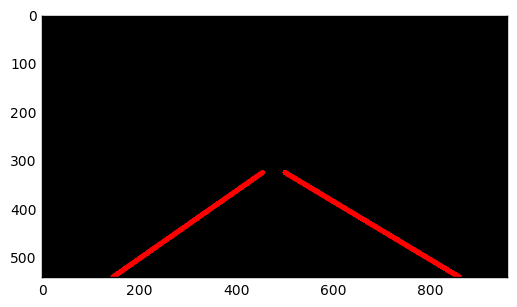

 56%|█████████████████████████████████████████████▍                                   | 383/682 [03:53<02:43,  1.83it/s]

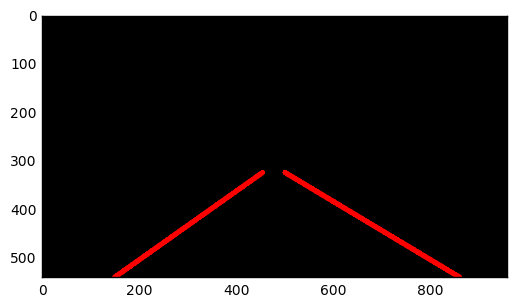

 56%|█████████████████████████████████████████████▌                                   | 384/682 [03:53<02:42,  1.84it/s]

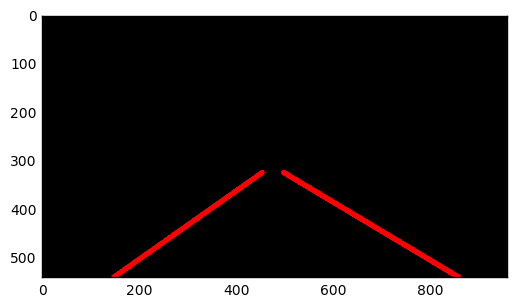

 56%|█████████████████████████████████████████████▋                                   | 385/682 [03:54<02:58,  1.66it/s]

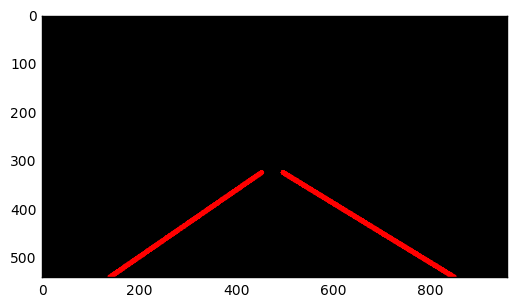

 57%|█████████████████████████████████████████████▊                                   | 386/682 [03:54<03:00,  1.64it/s]

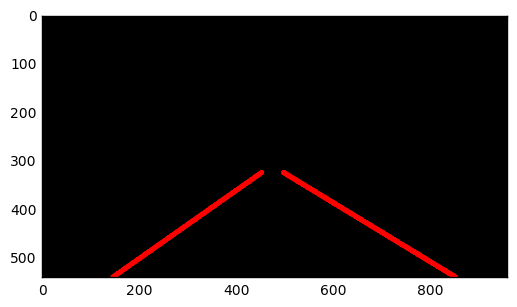

 57%|█████████████████████████████████████████████▉                                   | 387/682 [03:55<02:57,  1.67it/s]

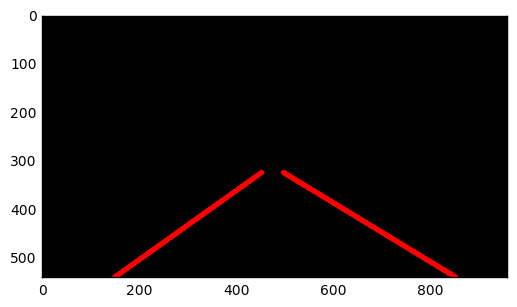

 57%|██████████████████████████████████████████████                                   | 388/682 [03:56<02:54,  1.68it/s]

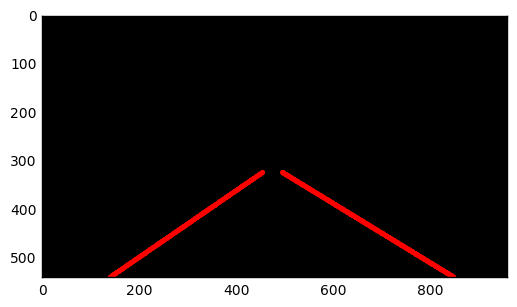

 57%|██████████████████████████████████████████████▏                                  | 389/682 [03:56<02:58,  1.64it/s]

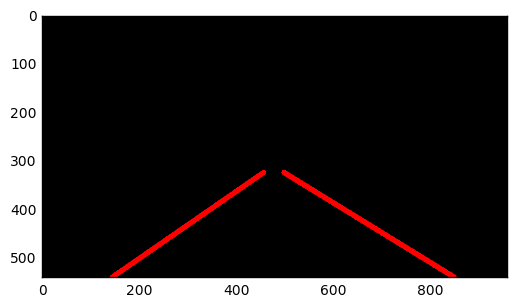

 57%|██████████████████████████████████████████████▎                                  | 390/682 [03:57<03:02,  1.60it/s]

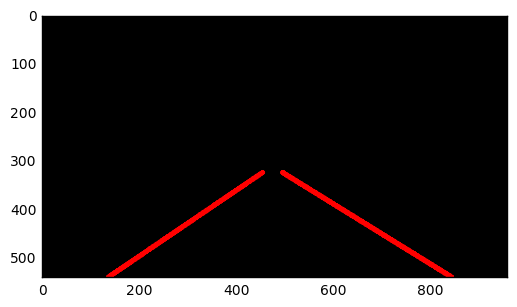

 57%|██████████████████████████████████████████████▍                                  | 391/682 [03:58<03:31,  1.38it/s]

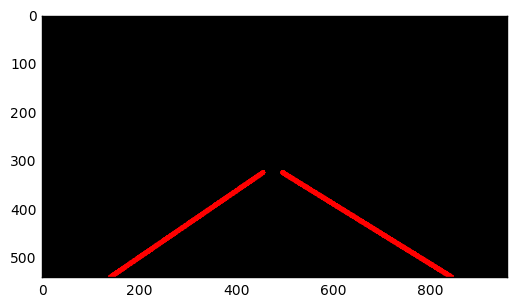

 57%|██████████████████████████████████████████████▌                                  | 392/682 [03:59<03:38,  1.33it/s]

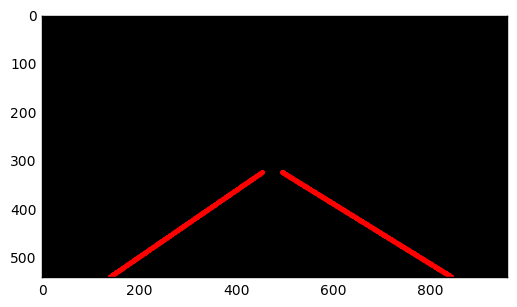

 58%|██████████████████████████████████████████████▋                                  | 393/682 [03:59<03:41,  1.30it/s]

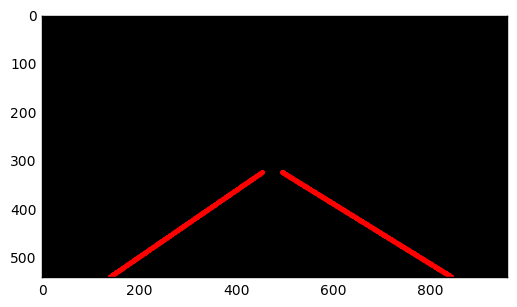

 58%|██████████████████████████████████████████████▊                                  | 394/682 [04:01<04:10,  1.15it/s]

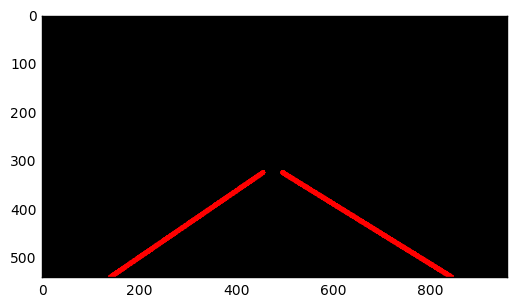

 58%|██████████████████████████████████████████████▉                                  | 395/682 [04:01<04:06,  1.16it/s]

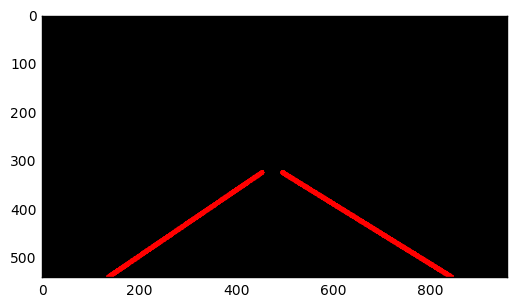

 58%|███████████████████████████████████████████████                                  | 396/682 [04:03<04:51,  1.02s/it]

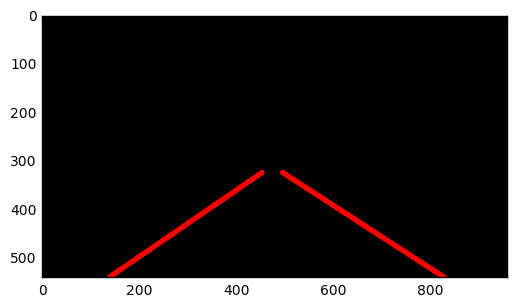

 58%|███████████████████████████████████████████████▏                                 | 397/682 [04:03<04:16,  1.11it/s]

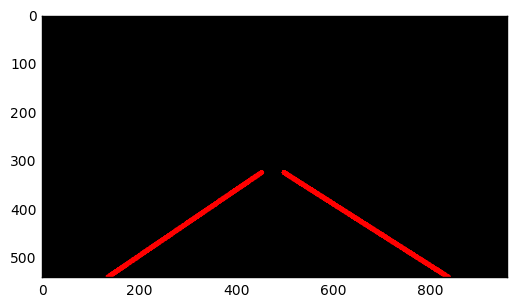

 58%|███████████████████████████████████████████████▎                                 | 398/682 [04:04<03:48,  1.24it/s]

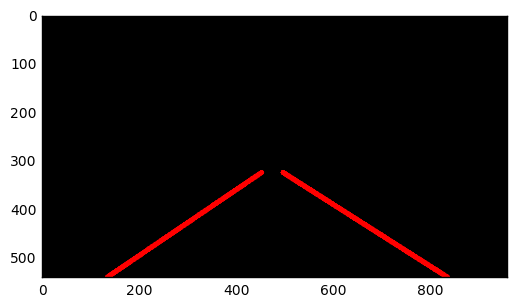

 59%|███████████████████████████████████████████████▍                                 | 399/682 [04:05<03:42,  1.27it/s]

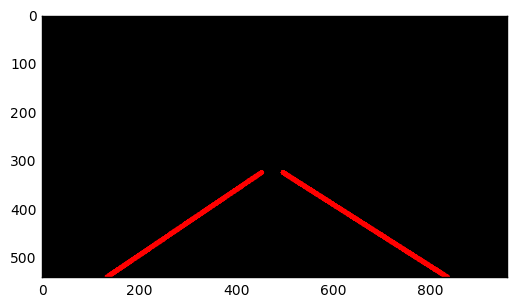

 59%|███████████████████████████████████████████████▌                                 | 400/682 [04:05<03:29,  1.35it/s]

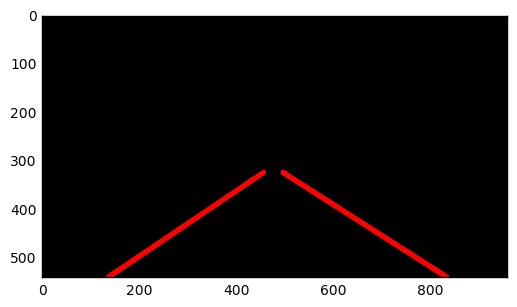

 59%|███████████████████████████████████████████████▋                                 | 401/682 [04:06<03:12,  1.46it/s]

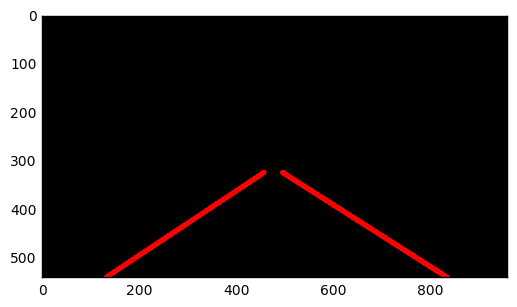

 59%|███████████████████████████████████████████████▋                                 | 402/682 [04:06<02:57,  1.58it/s]

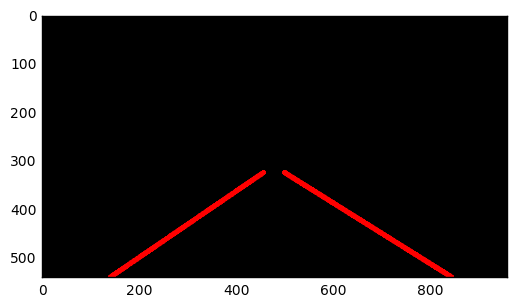

 59%|███████████████████████████████████████████████▊                                 | 403/682 [04:07<02:49,  1.64it/s]

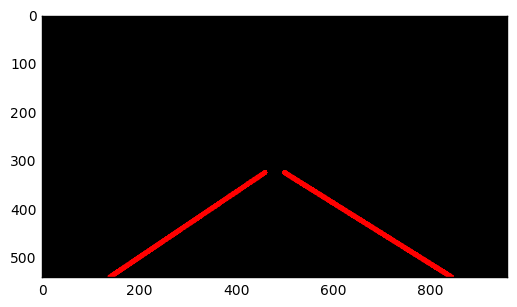

 59%|███████████████████████████████████████████████▉                                 | 404/682 [04:08<02:44,  1.69it/s]

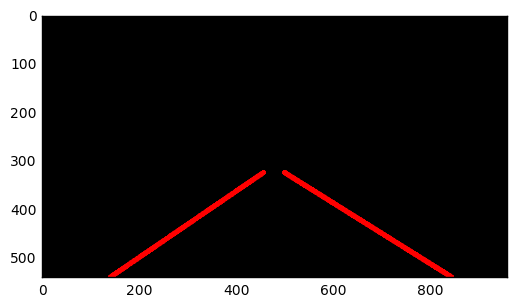

 59%|████████████████████████████████████████████████                                 | 405/682 [04:08<02:50,  1.63it/s]

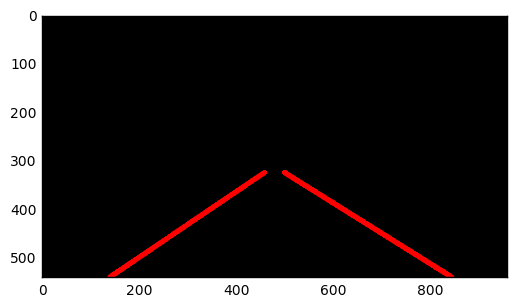

 60%|████████████████████████████████████████████████▏                                | 406/682 [04:09<03:24,  1.35it/s]

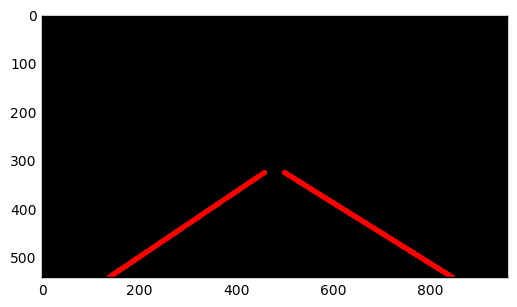

 60%|████████████████████████████████████████████████▎                                | 407/682 [04:10<03:40,  1.25it/s]

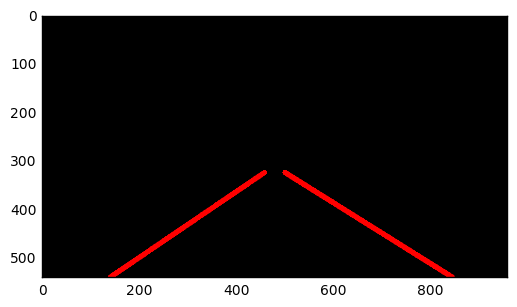

 60%|████████████████████████████████████████████████▍                                | 408/682 [04:11<03:17,  1.39it/s]

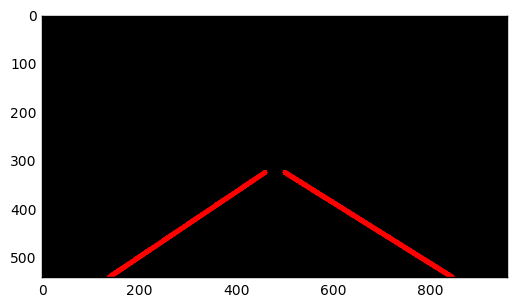

 60%|████████████████████████████████████████████████▌                                | 409/682 [04:11<03:02,  1.50it/s]

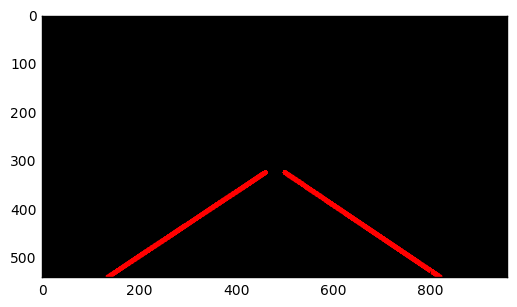

 60%|████████████████████████████████████████████████▋                                | 410/682 [04:12<02:47,  1.62it/s]

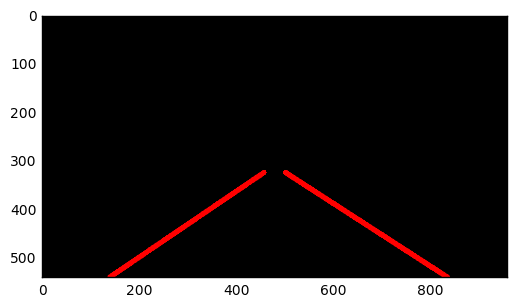

 60%|████████████████████████████████████████████████▊                                | 411/682 [04:12<02:40,  1.69it/s]

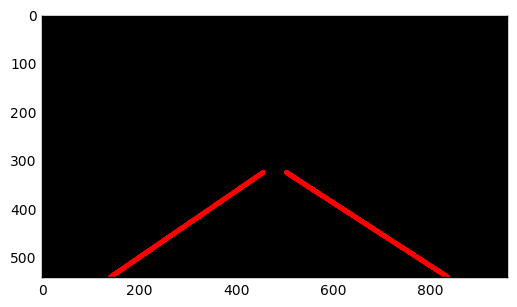

 60%|████████████████████████████████████████████████▉                                | 412/682 [04:13<02:32,  1.77it/s]

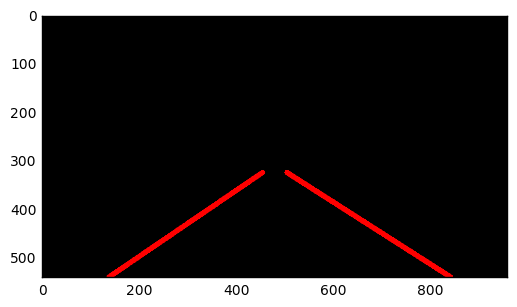

 61%|█████████████████████████████████████████████████                                | 413/682 [04:13<02:26,  1.83it/s]

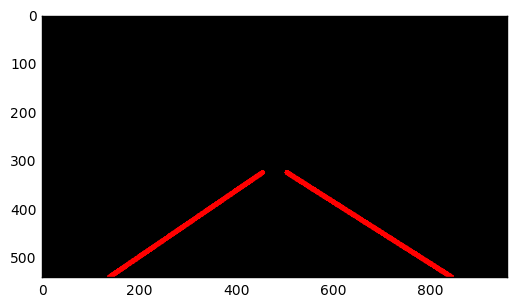

 61%|█████████████████████████████████████████████████▏                               | 414/682 [04:14<02:22,  1.88it/s]

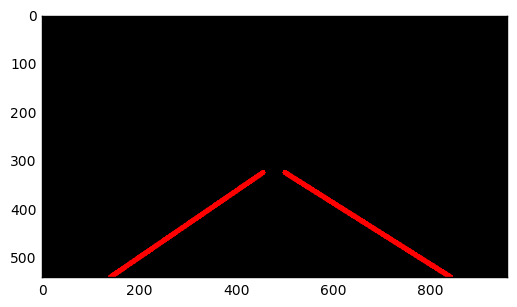

 61%|█████████████████████████████████████████████████▎                               | 415/682 [04:14<02:26,  1.82it/s]

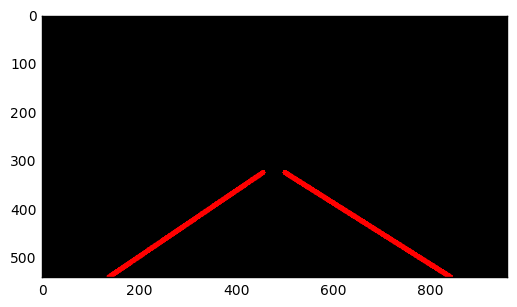

 61%|█████████████████████████████████████████████████▍                               | 416/682 [04:15<02:28,  1.79it/s]

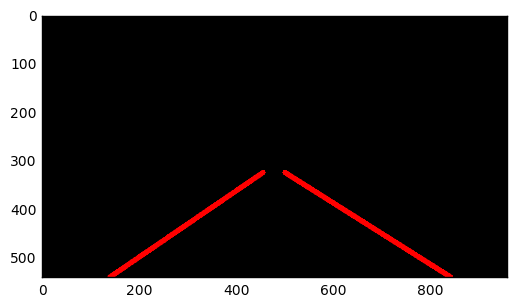

 61%|█████████████████████████████████████████████████▌                               | 417/682 [04:16<02:51,  1.55it/s]

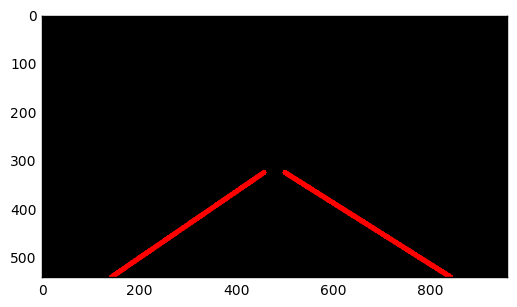

 61%|█████████████████████████████████████████████████▋                               | 418/682 [04:17<03:14,  1.36it/s]

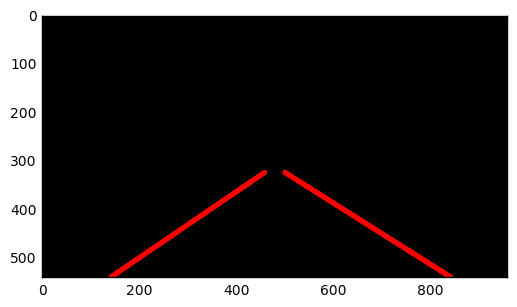

 61%|█████████████████████████████████████████████████▊                               | 419/682 [04:17<03:06,  1.41it/s]

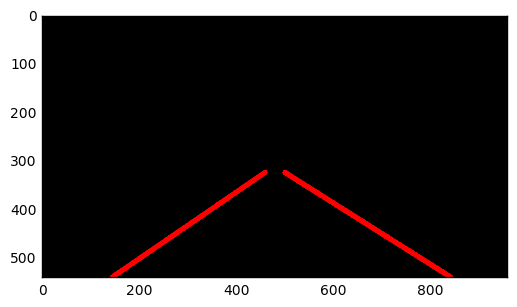

 62%|█████████████████████████████████████████████████▉                               | 420/682 [04:18<02:51,  1.53it/s]

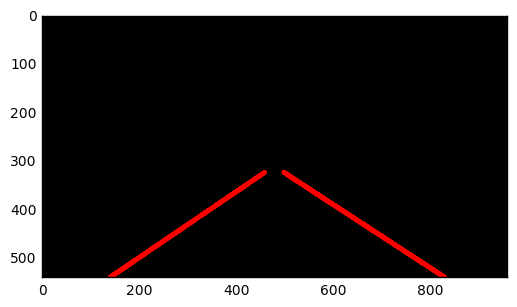

 62%|██████████████████████████████████████████████████                               | 421/682 [04:18<02:38,  1.64it/s]

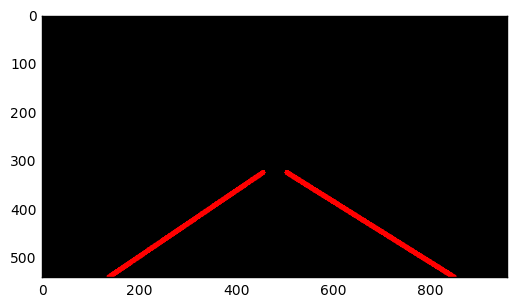

 62%|██████████████████████████████████████████████████                               | 422/682 [04:19<02:30,  1.72it/s]

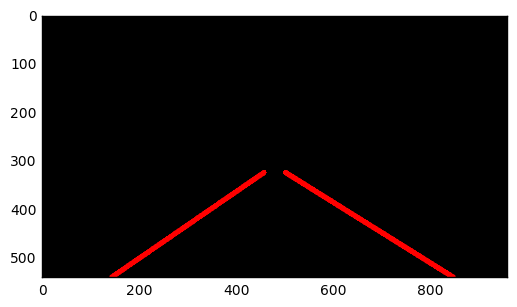

 62%|██████████████████████████████████████████████████▏                              | 423/682 [04:20<02:28,  1.75it/s]

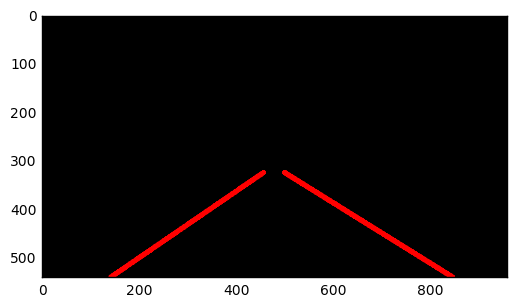

 62%|██████████████████████████████████████████████████▎                              | 424/682 [04:20<02:26,  1.76it/s]

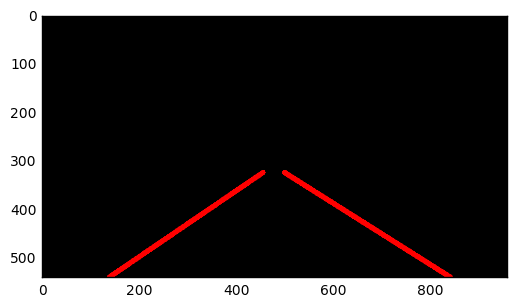

 62%|██████████████████████████████████████████████████▍                              | 425/682 [04:21<02:31,  1.70it/s]

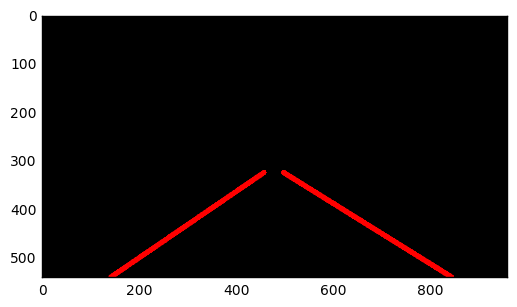

 62%|██████████████████████████████████████████████████▌                              | 426/682 [04:21<02:37,  1.63it/s]

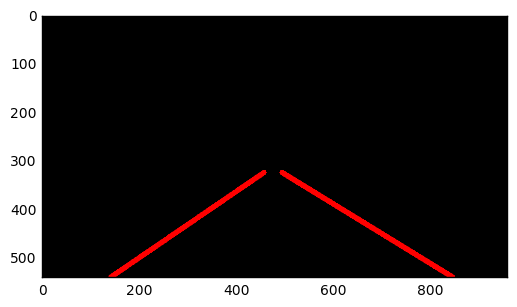

 63%|██████████████████████████████████████████████████▋                              | 427/682 [04:22<02:34,  1.65it/s]

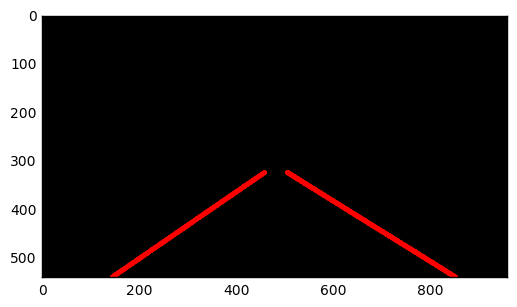

 63%|██████████████████████████████████████████████████▊                              | 428/682 [04:23<02:53,  1.47it/s]

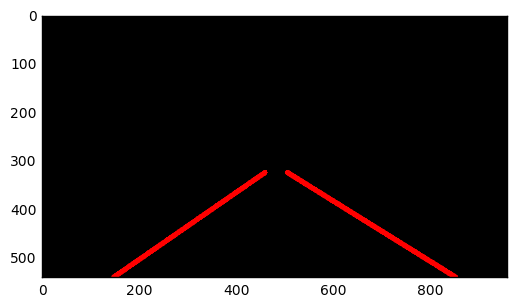

 63%|██████████████████████████████████████████████████▉                              | 429/682 [04:24<03:05,  1.36it/s]

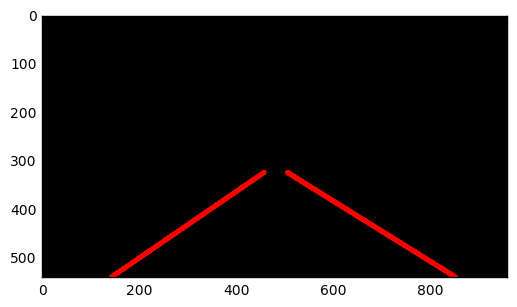

 63%|███████████████████████████████████████████████████                              | 430/682 [04:24<02:48,  1.50it/s]

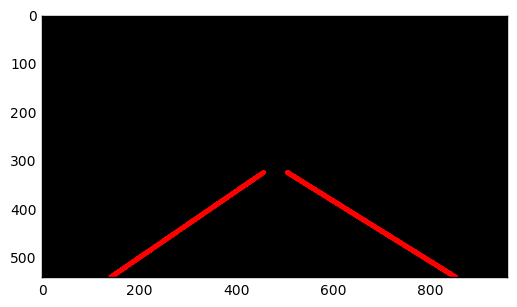

 63%|███████████████████████████████████████████████████▏                             | 431/682 [04:25<02:49,  1.48it/s]

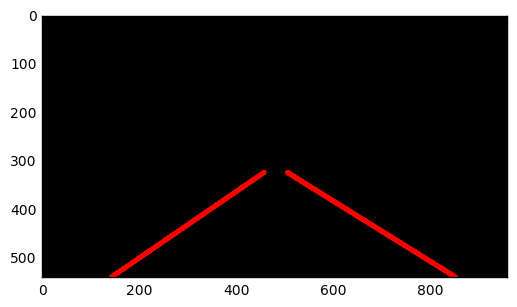

 63%|███████████████████████████████████████████████████▎                             | 432/682 [04:26<02:52,  1.45it/s]

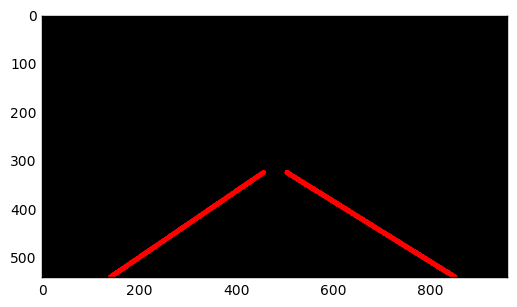

 63%|███████████████████████████████████████████████████▍                             | 433/682 [04:26<02:45,  1.51it/s]

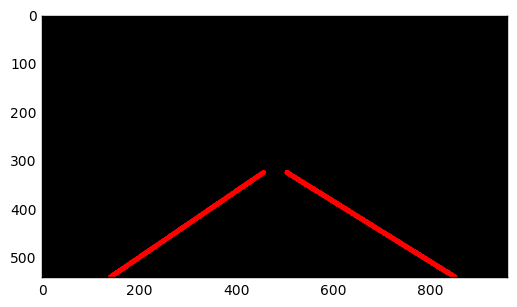

 64%|███████████████████████████████████████████████████▌                             | 434/682 [04:27<02:34,  1.61it/s]

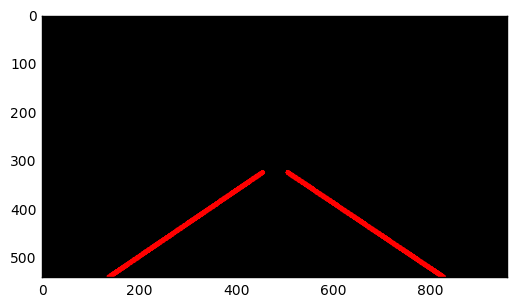

 64%|███████████████████████████████████████████████████▋                             | 435/682 [04:27<02:33,  1.61it/s]

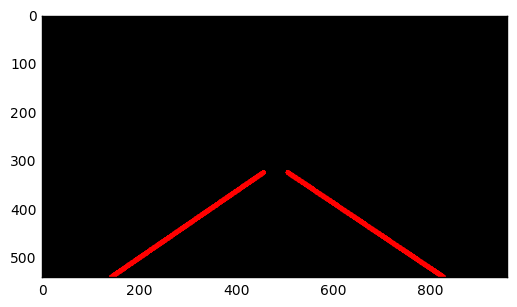

 64%|███████████████████████████████████████████████████▊                             | 436/682 [04:28<02:29,  1.64it/s]

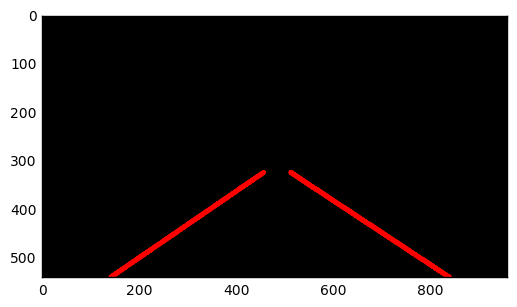

 64%|███████████████████████████████████████████████████▉                             | 437/682 [04:28<02:24,  1.69it/s]

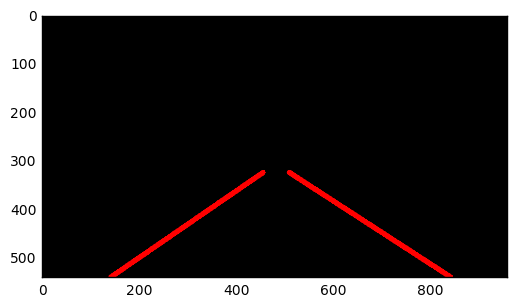

 64%|████████████████████████████████████████████████████                             | 438/682 [04:29<02:24,  1.69it/s]

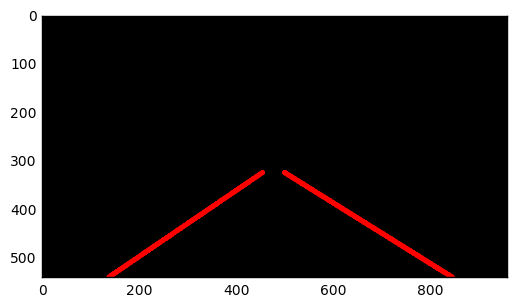

 64%|████████████████████████████████████████████████████▏                            | 439/682 [04:30<02:17,  1.76it/s]

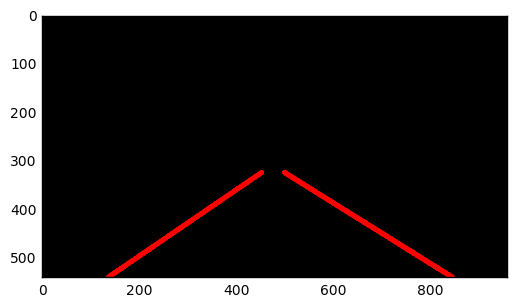

 65%|████████████████████████████████████████████████████▎                            | 440/682 [04:30<02:30,  1.61it/s]

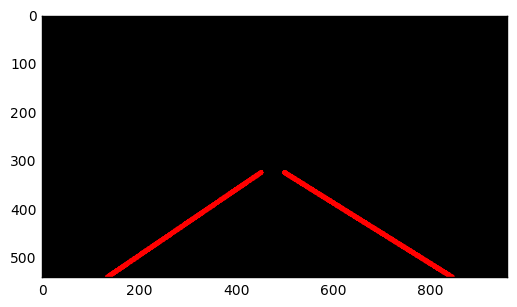

 65%|████████████████████████████████████████████████████▍                            | 441/682 [04:31<02:22,  1.69it/s]

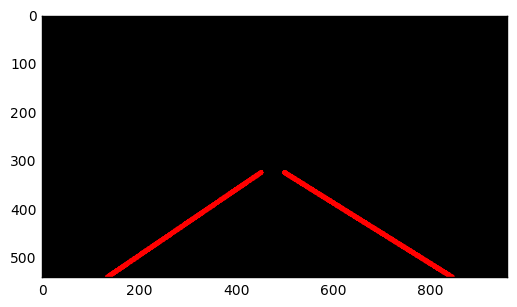

 65%|████████████████████████████████████████████████████▍                            | 442/682 [04:31<02:16,  1.75it/s]

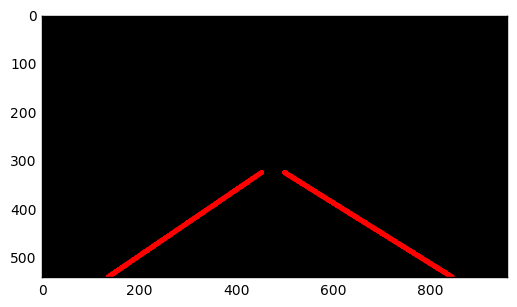

 65%|████████████████████████████████████████████████████▌                            | 443/682 [04:32<02:11,  1.81it/s]

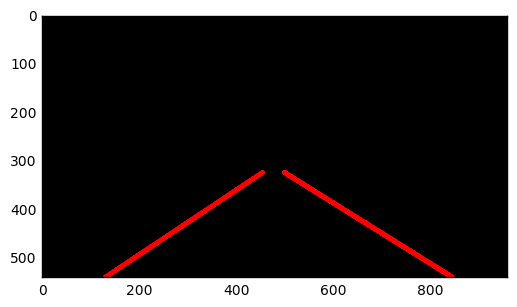

 65%|████████████████████████████████████████████████████▋                            | 444/682 [04:32<02:07,  1.86it/s]

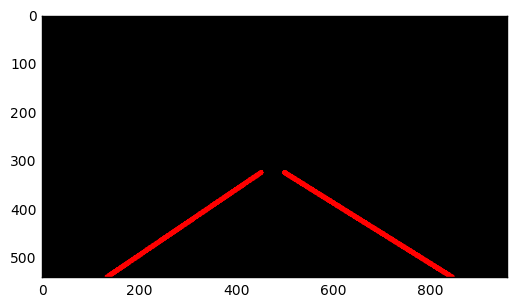

 65%|████████████████████████████████████████████████████▊                            | 445/682 [04:33<02:04,  1.91it/s]

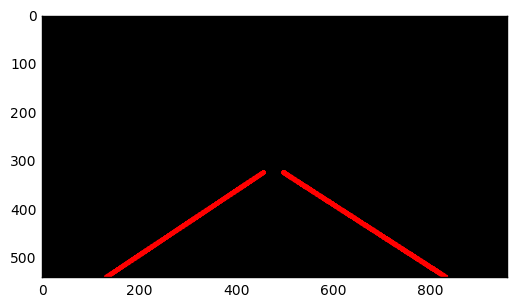

 65%|████████████████████████████████████████████████████▉                            | 446/682 [04:33<02:02,  1.92it/s]

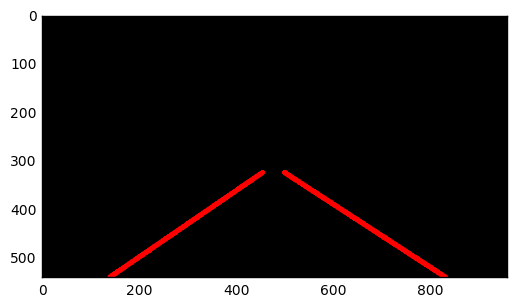

 66%|█████████████████████████████████████████████████████                            | 447/682 [04:34<02:01,  1.93it/s]

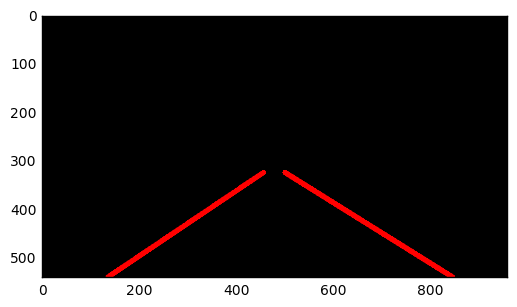

 66%|█████████████████████████████████████████████████████▏                           | 448/682 [04:34<02:01,  1.93it/s]

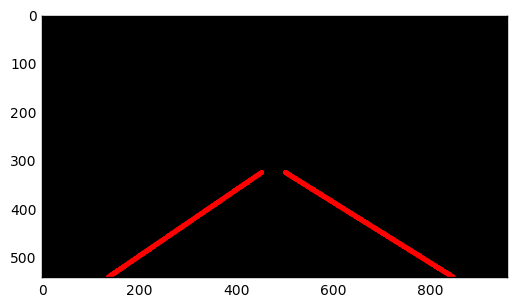

 66%|█████████████████████████████████████████████████████▎                           | 449/682 [04:35<02:03,  1.89it/s]

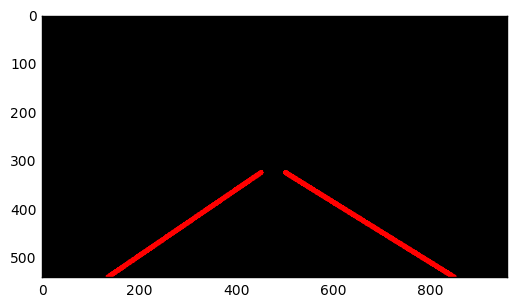

 66%|█████████████████████████████████████████████████████▍                           | 450/682 [04:36<02:03,  1.87it/s]

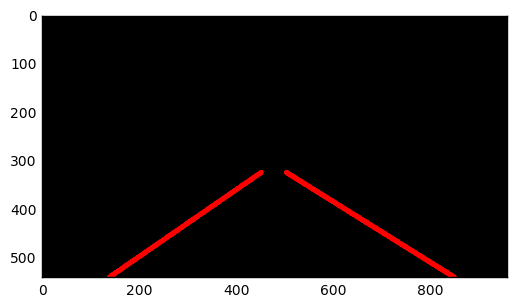

 66%|█████████████████████████████████████████████████████▌                           | 451/682 [04:36<02:17,  1.67it/s]

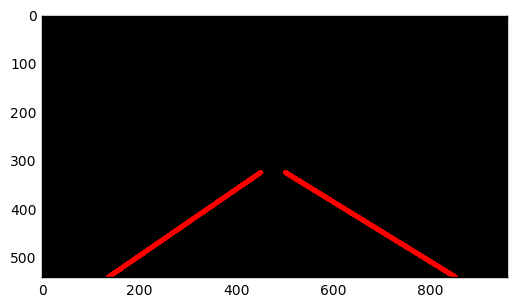

 66%|█████████████████████████████████████████████████████▋                           | 452/682 [04:37<02:10,  1.76it/s]

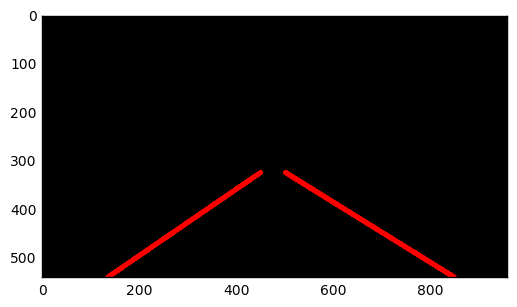

 66%|█████████████████████████████████████████████████████▊                           | 453/682 [04:37<02:05,  1.83it/s]

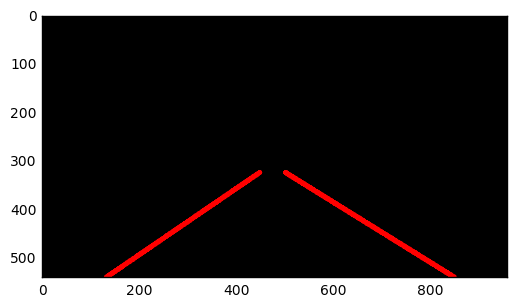

 67%|█████████████████████████████████████████████████████▉                           | 454/682 [04:38<02:00,  1.89it/s]

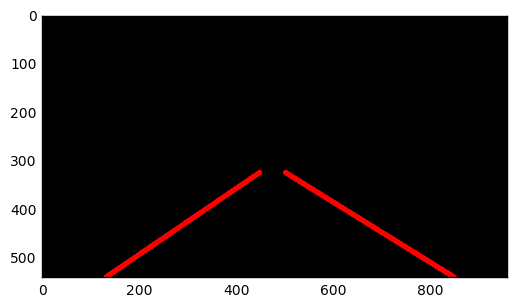

 67%|██████████████████████████████████████████████████████                           | 455/682 [04:38<01:59,  1.90it/s]

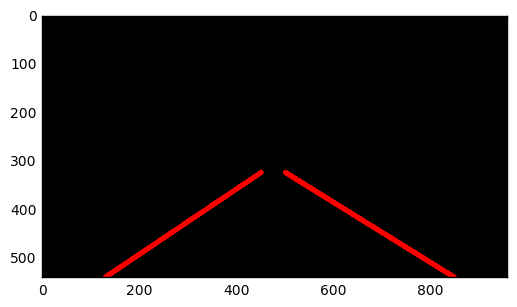

 67%|██████████████████████████████████████████████████████▏                          | 456/682 [04:39<01:56,  1.94it/s]

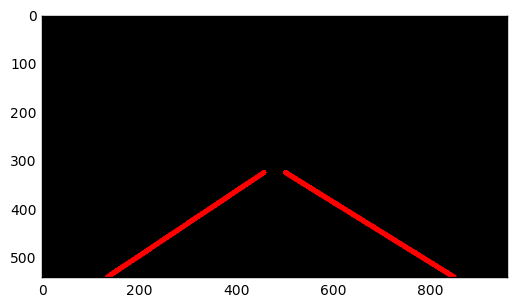

 67%|██████████████████████████████████████████████████████▎                          | 457/682 [04:39<01:54,  1.96it/s]

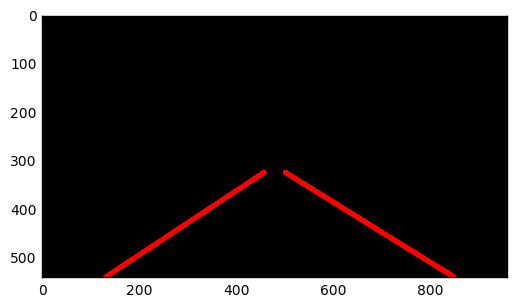

 67%|██████████████████████████████████████████████████████▍                          | 458/682 [04:40<01:54,  1.95it/s]

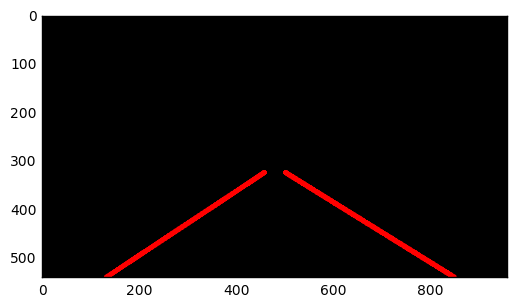

 67%|██████████████████████████████████████████████████████▌                          | 459/682 [04:40<01:56,  1.92it/s]

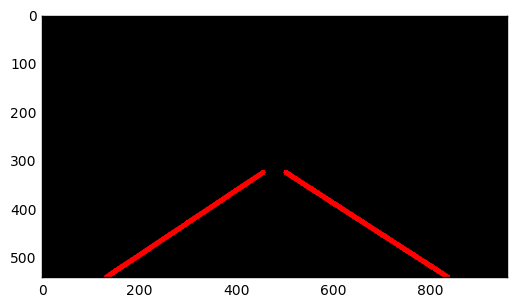

 67%|██████████████████████████████████████████████████████▋                          | 460/682 [04:41<01:55,  1.92it/s]

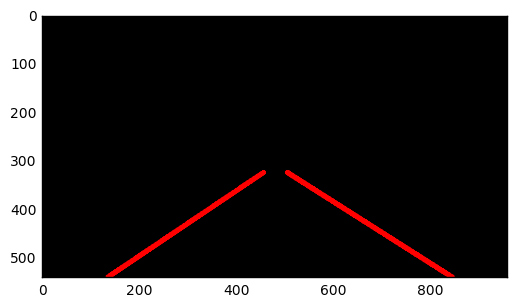

 68%|██████████████████████████████████████████████████████▊                          | 461/682 [04:41<01:54,  1.92it/s]

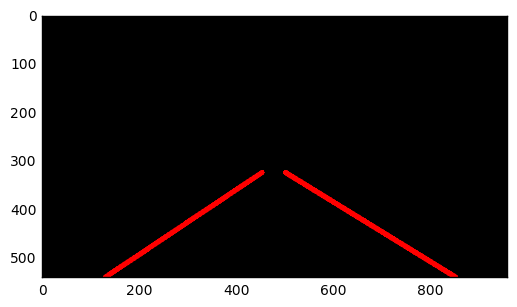

 68%|██████████████████████████████████████████████████████▊                          | 462/682 [04:42<02:05,  1.75it/s]

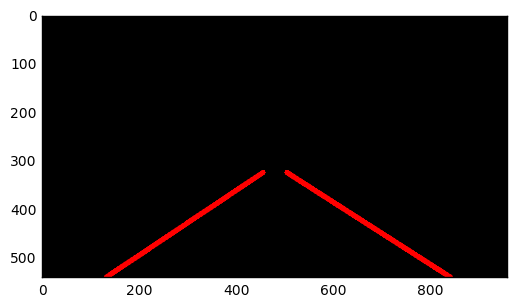

 68%|██████████████████████████████████████████████████████▉                          | 463/682 [04:43<02:01,  1.80it/s]

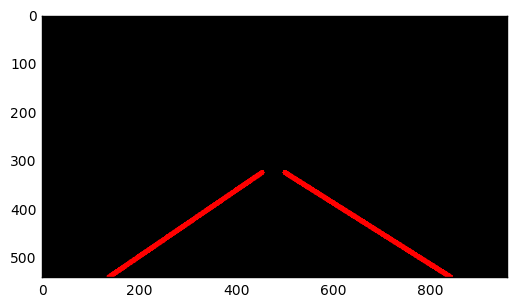

 68%|███████████████████████████████████████████████████████                          | 464/682 [04:43<01:57,  1.86it/s]

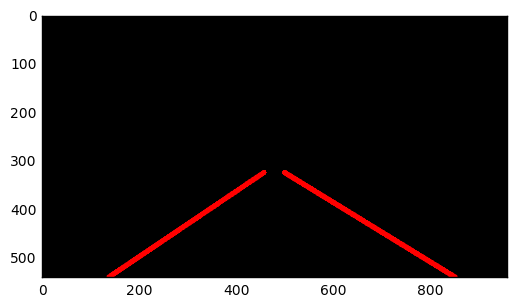

 68%|███████████████████████████████████████████████████████▏                         | 465/682 [04:44<01:54,  1.90it/s]

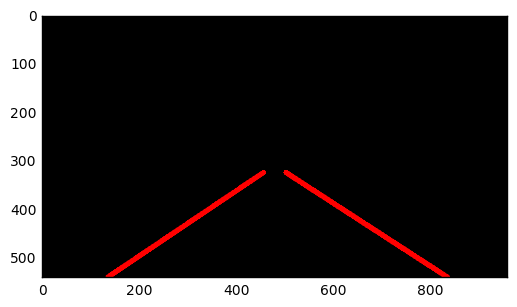

 68%|███████████████████████████████████████████████████████▎                         | 466/682 [04:44<01:50,  1.95it/s]

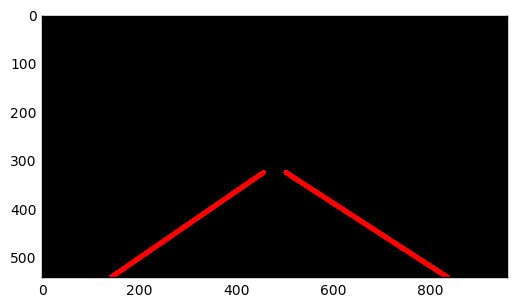

 68%|███████████████████████████████████████████████████████▍                         | 467/682 [04:45<01:51,  1.93it/s]

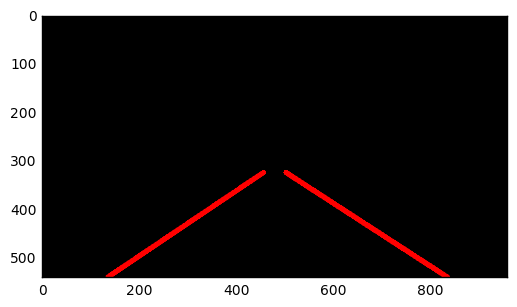

 69%|███████████████████████████████████████████████████████▌                         | 468/682 [04:45<01:52,  1.90it/s]

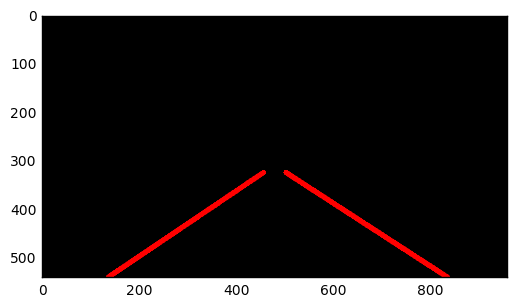

 69%|███████████████████████████████████████████████████████▋                         | 469/682 [04:46<01:51,  1.91it/s]

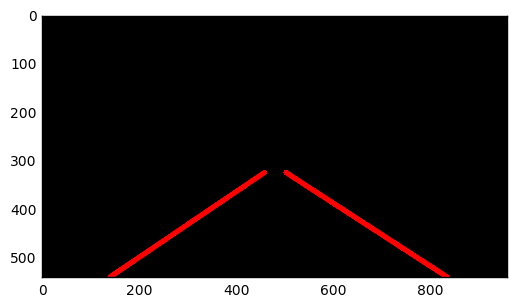

 69%|███████████████████████████████████████████████████████▊                         | 470/682 [04:46<01:53,  1.87it/s]

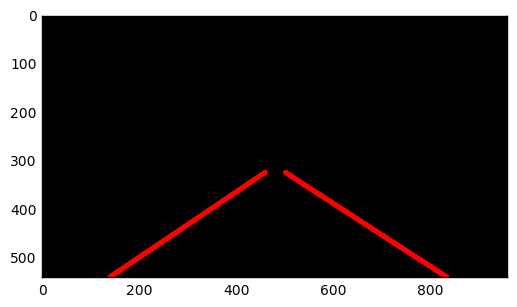

 69%|███████████████████████████████████████████████████████▉                         | 471/682 [04:47<01:50,  1.90it/s]

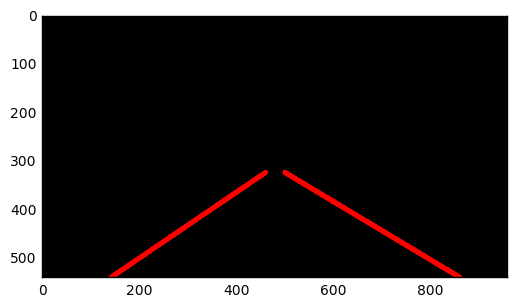

 69%|████████████████████████████████████████████████████████                         | 472/682 [04:47<01:49,  1.93it/s]

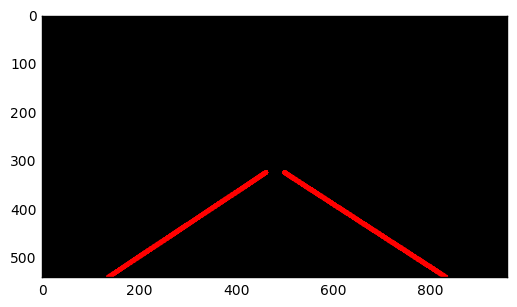

 69%|████████████████████████████████████████████████████████▏                        | 473/682 [04:48<02:05,  1.66it/s]

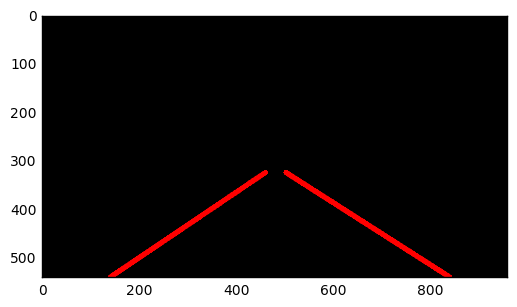

 70%|████████████████████████████████████████████████████████▎                        | 474/682 [04:49<02:01,  1.72it/s]

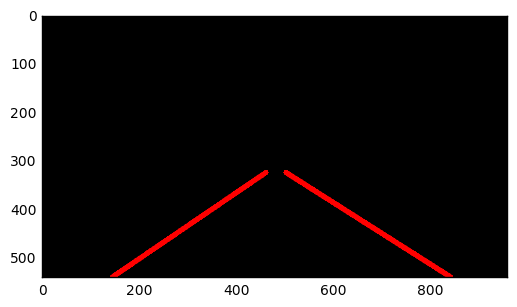

 70%|████████████████████████████████████████████████████████▍                        | 475/682 [04:49<01:54,  1.80it/s]

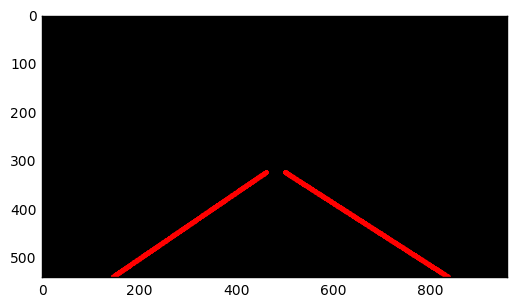

 70%|████████████████████████████████████████████████████████▌                        | 476/682 [04:50<01:52,  1.82it/s]

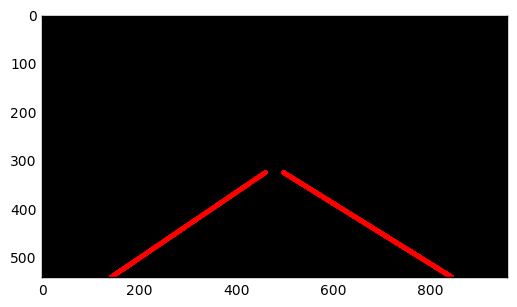

 70%|████████████████████████████████████████████████████████▋                        | 477/682 [04:50<01:51,  1.83it/s]

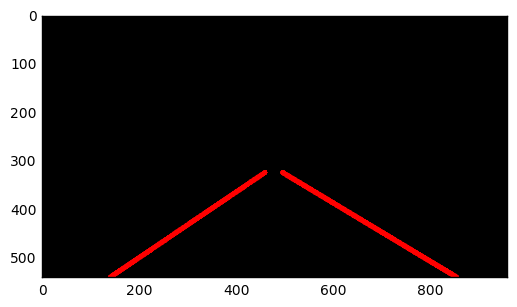

 70%|████████████████████████████████████████████████████████▊                        | 478/682 [04:51<01:50,  1.85it/s]

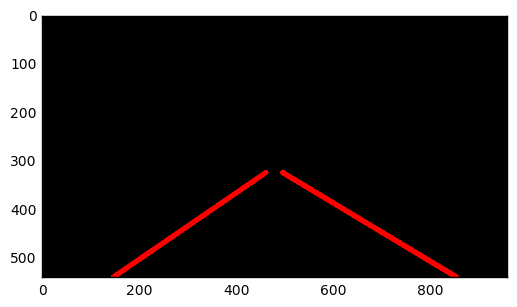

 70%|████████████████████████████████████████████████████████▉                        | 479/682 [04:51<01:49,  1.85it/s]

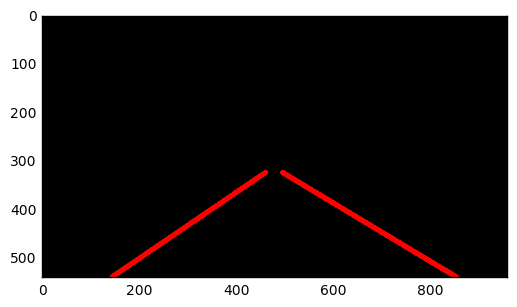

 70%|█████████████████████████████████████████████████████████                        | 480/682 [04:52<01:49,  1.85it/s]

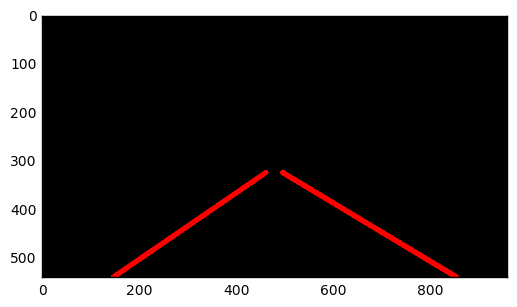

 71%|█████████████████████████████████████████████████████████▏                       | 481/682 [04:52<01:47,  1.87it/s]

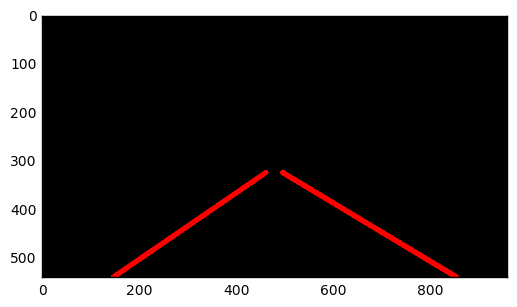

 71%|█████████████████████████████████████████████████████████▏                       | 482/682 [04:53<01:45,  1.90it/s]

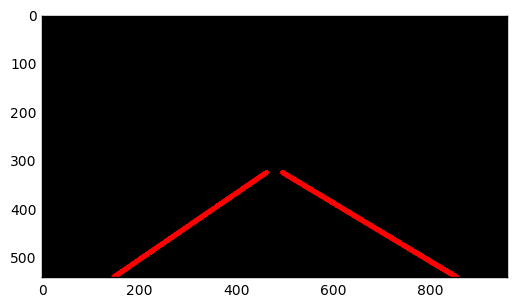

 71%|█████████████████████████████████████████████████████████▎                       | 483/682 [04:53<01:43,  1.93it/s]

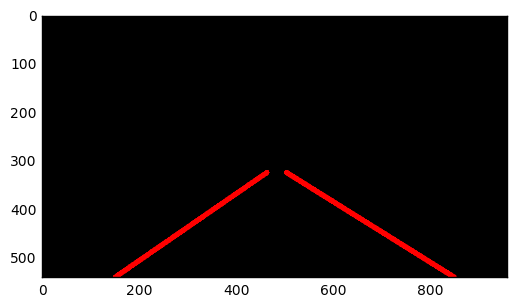

 71%|█████████████████████████████████████████████████████████▍                       | 484/682 [04:54<02:16,  1.45it/s]

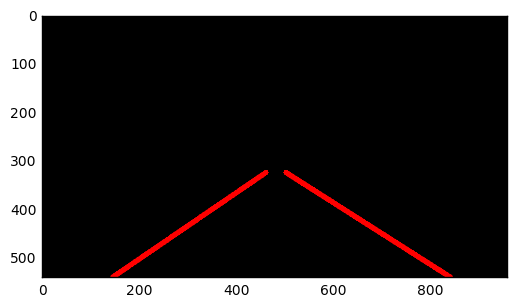

 71%|█████████████████████████████████████████████████████████▌                       | 485/682 [04:55<02:19,  1.41it/s]

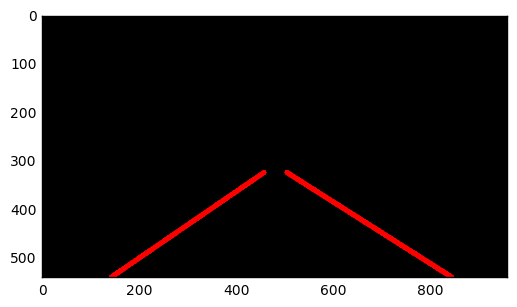

 71%|█████████████████████████████████████████████████████████▋                       | 486/682 [04:56<02:07,  1.54it/s]

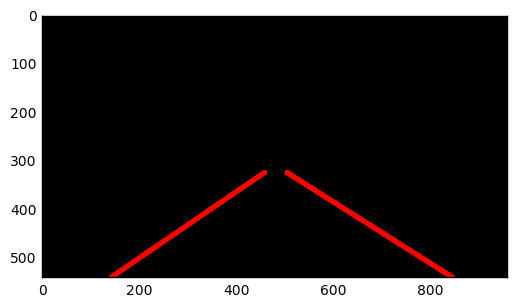

 71%|█████████████████████████████████████████████████████████▊                       | 487/682 [04:56<01:59,  1.64it/s]

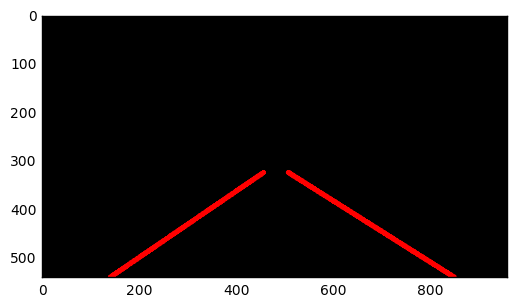

 72%|█████████████████████████████████████████████████████████▉                       | 488/682 [04:57<01:54,  1.70it/s]

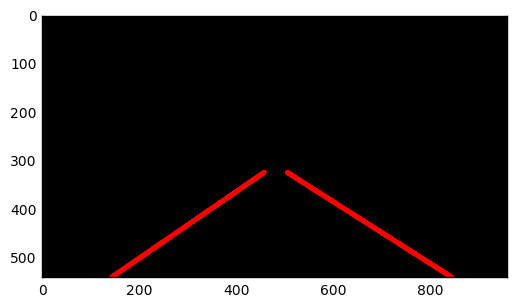

 72%|██████████████████████████████████████████████████████████                       | 489/682 [04:57<01:53,  1.71it/s]

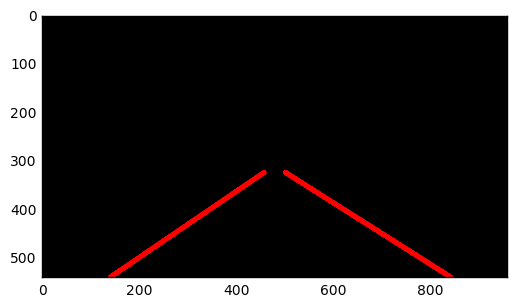

 72%|██████████████████████████████████████████████████████████▏                      | 490/682 [04:58<01:47,  1.78it/s]

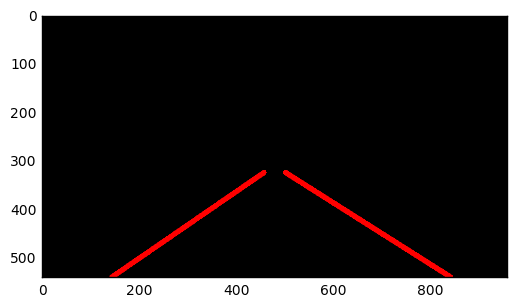

 72%|██████████████████████████████████████████████████████████▎                      | 491/682 [04:58<01:43,  1.84it/s]

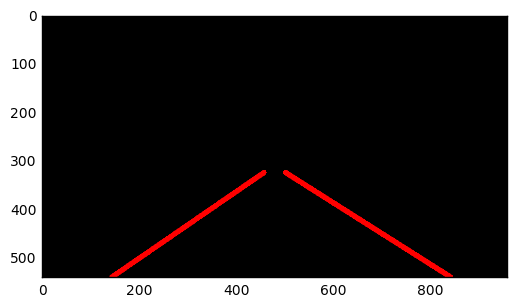

 72%|██████████████████████████████████████████████████████████▍                      | 492/682 [04:59<01:41,  1.87it/s]

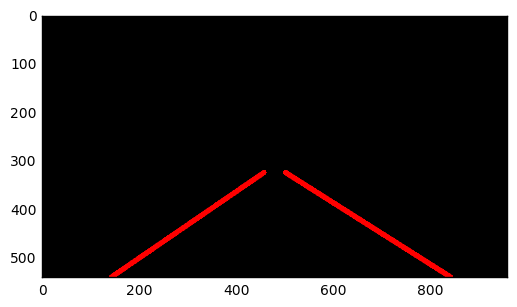

 72%|██████████████████████████████████████████████████████████▌                      | 493/682 [04:59<01:39,  1.90it/s]

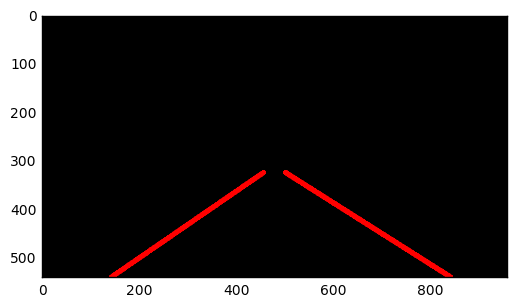

 72%|██████████████████████████████████████████████████████████▋                      | 494/682 [05:00<01:37,  1.93it/s]

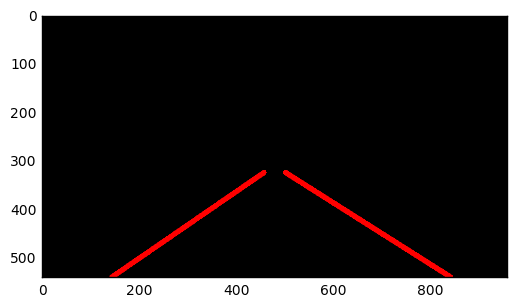

 73%|██████████████████████████████████████████████████████████▊                      | 495/682 [05:01<01:52,  1.67it/s]

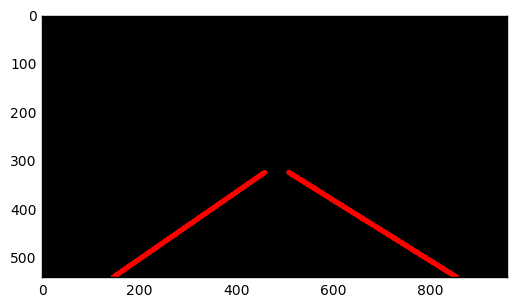

 73%|██████████████████████████████████████████████████████████▉                      | 496/682 [05:01<01:47,  1.72it/s]

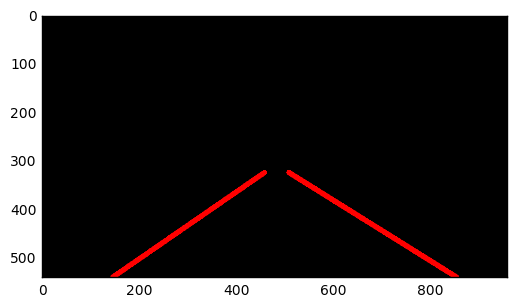

 73%|███████████████████████████████████████████████████████████                      | 497/682 [05:02<01:43,  1.78it/s]

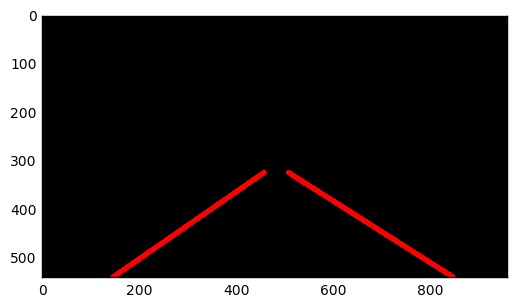

 73%|███████████████████████████████████████████████████████████▏                     | 498/682 [05:02<01:40,  1.83it/s]

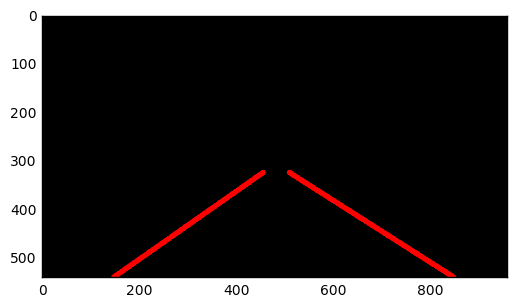

 73%|███████████████████████████████████████████████████████████▎                     | 499/682 [05:03<01:37,  1.88it/s]

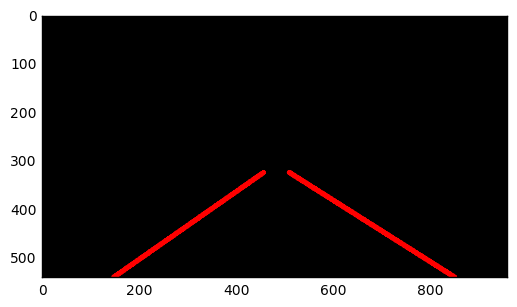

 73%|███████████████████████████████████████████████████████████▍                     | 500/682 [05:03<01:35,  1.92it/s]

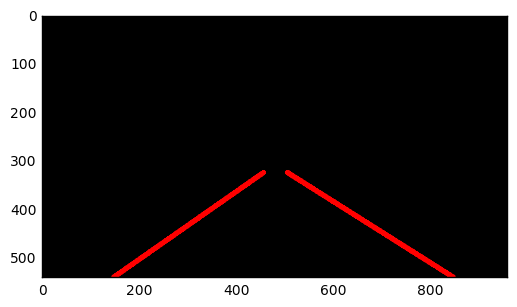

 73%|███████████████████████████████████████████████████████████▌                     | 501/682 [05:04<01:37,  1.86it/s]

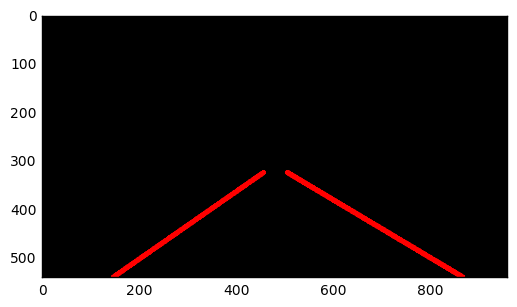

 74%|███████████████████████████████████████████████████████████▌                     | 502/682 [05:04<01:42,  1.76it/s]

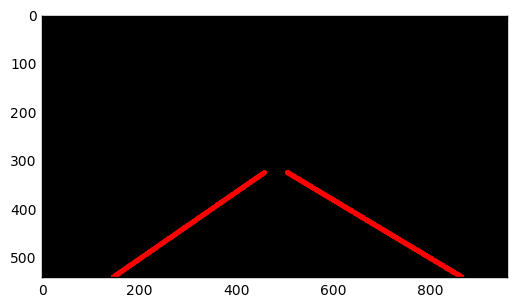

 74%|███████████████████████████████████████████████████████████▋                     | 503/682 [05:05<01:39,  1.80it/s]

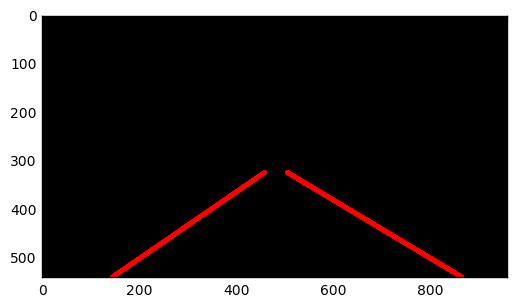

 74%|███████████████████████████████████████████████████████████▊                     | 504/682 [05:05<01:37,  1.83it/s]

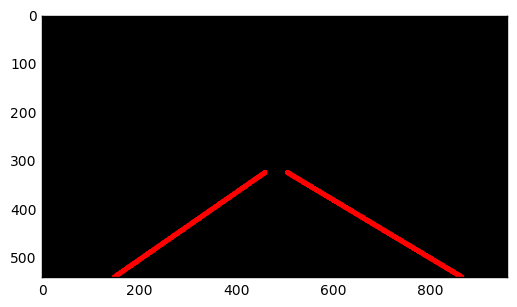

 74%|███████████████████████████████████████████████████████████▉                     | 505/682 [05:06<01:36,  1.84it/s]

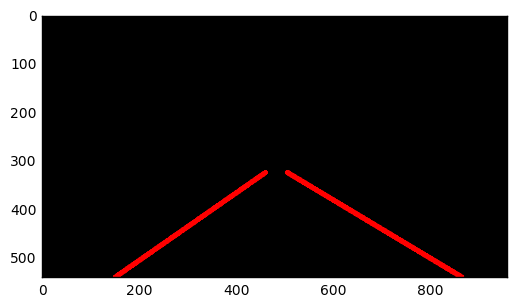

 74%|████████████████████████████████████████████████████████████                     | 506/682 [05:07<01:46,  1.65it/s]

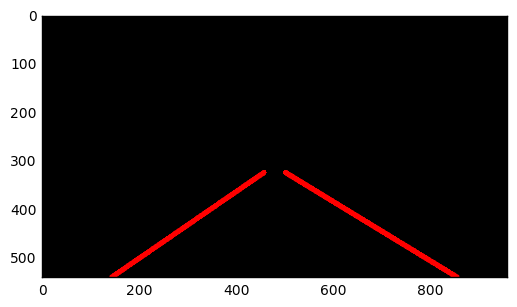

 74%|████████████████████████████████████████████████████████████▏                    | 507/682 [05:07<01:41,  1.73it/s]

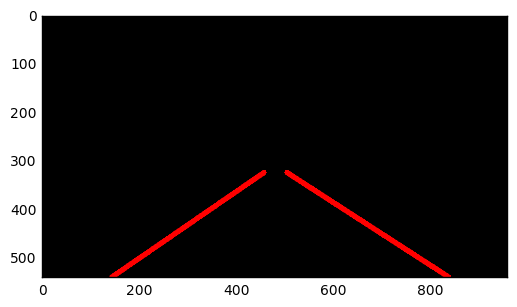

 74%|████████████████████████████████████████████████████████████▎                    | 508/682 [05:08<01:36,  1.80it/s]

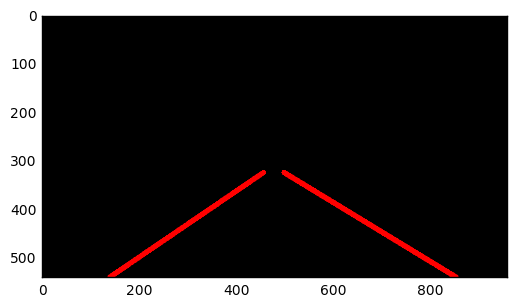

 75%|████████████████████████████████████████████████████████████▍                    | 509/682 [05:08<01:32,  1.86it/s]

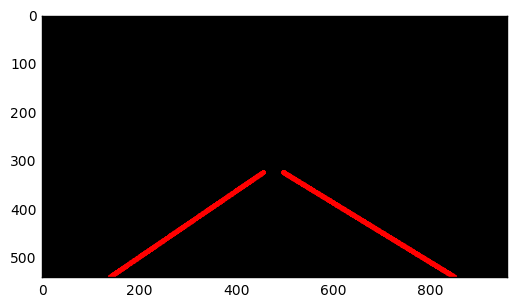

 75%|████████████████████████████████████████████████████████████▌                    | 510/682 [05:09<01:30,  1.90it/s]

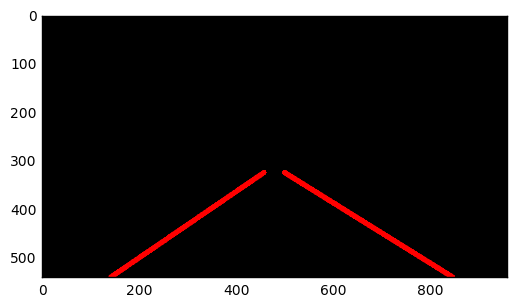

 75%|████████████████████████████████████████████████████████████▋                    | 511/682 [05:09<01:28,  1.92it/s]

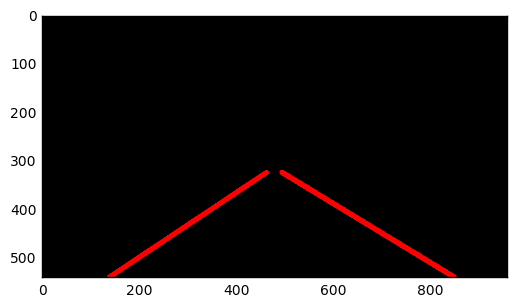

 75%|████████████████████████████████████████████████████████████▊                    | 512/682 [05:10<01:30,  1.87it/s]

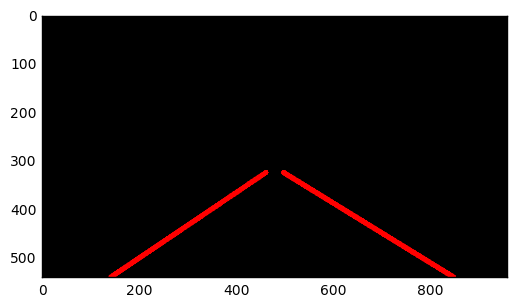

 75%|████████████████████████████████████████████████████████████▉                    | 513/682 [05:10<01:40,  1.68it/s]

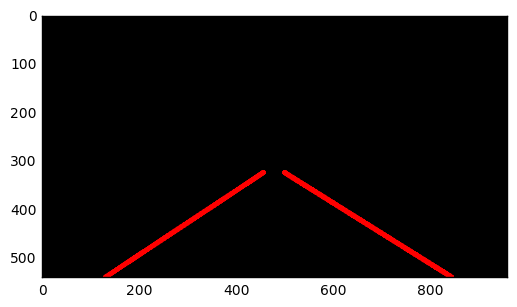

 75%|█████████████████████████████████████████████████████████████                    | 514/682 [05:11<01:44,  1.60it/s]

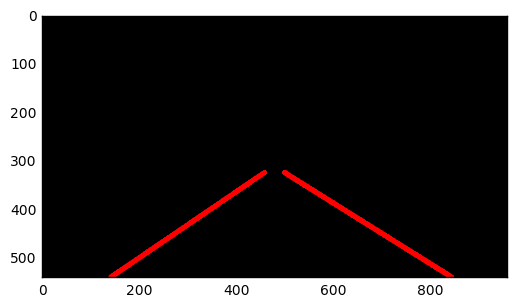

 76%|█████████████████████████████████████████████████████████████▏                   | 515/682 [05:12<01:43,  1.61it/s]

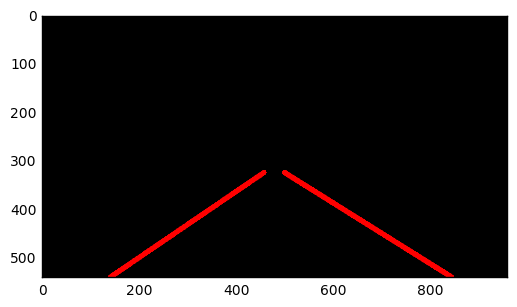

 76%|█████████████████████████████████████████████████████████████▎                   | 516/682 [05:12<01:39,  1.67it/s]

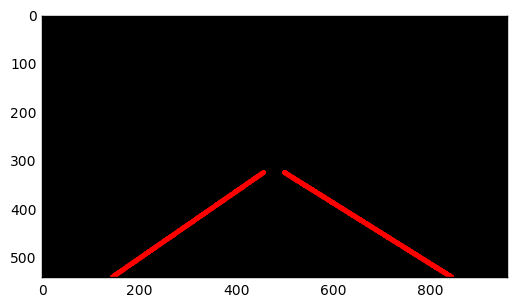

 76%|█████████████████████████████████████████████████████████████▍                   | 517/682 [05:13<01:47,  1.54it/s]

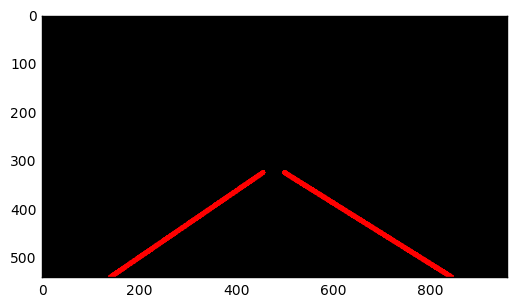

 76%|█████████████████████████████████████████████████████████████▌                   | 518/682 [05:14<01:39,  1.65it/s]

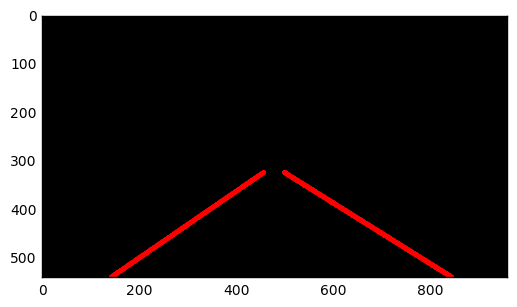

 76%|█████████████████████████████████████████████████████████████▋                   | 519/682 [05:14<01:39,  1.64it/s]

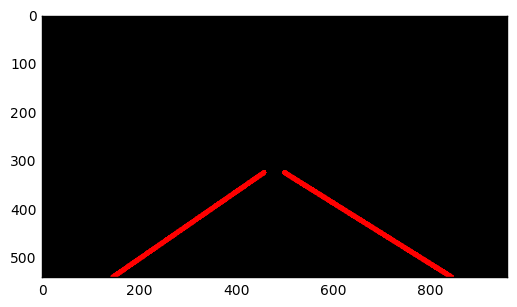

 76%|█████████████████████████████████████████████████████████████▊                   | 520/682 [05:15<01:33,  1.73it/s]

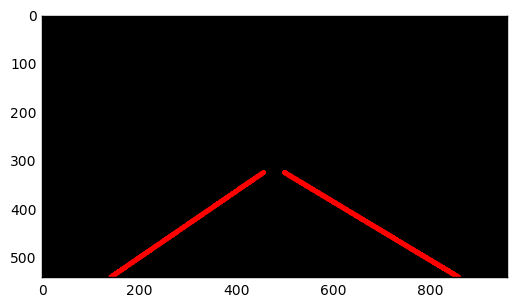

 76%|█████████████████████████████████████████████████████████████▉                   | 521/682 [05:15<01:29,  1.79it/s]

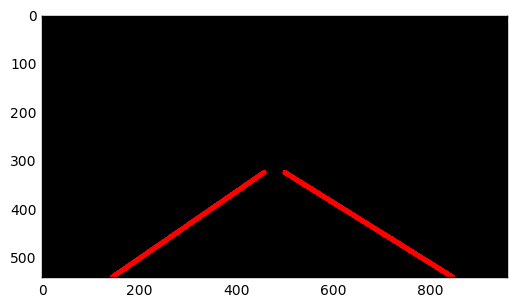

 77%|█████████████████████████████████████████████████████████████▉                   | 522/682 [05:16<01:26,  1.84it/s]

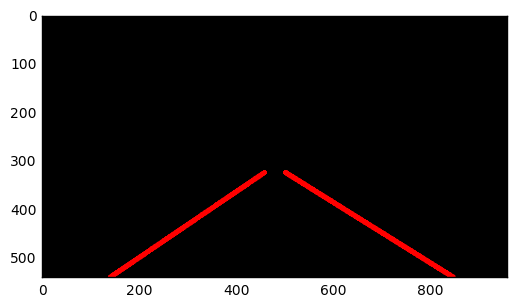

 77%|██████████████████████████████████████████████████████████████                   | 523/682 [05:16<01:25,  1.87it/s]

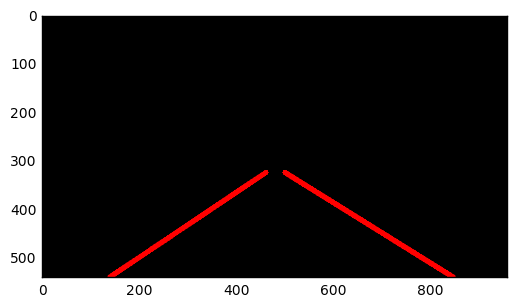

 77%|██████████████████████████████████████████████████████████████▏                  | 524/682 [05:17<01:23,  1.89it/s]

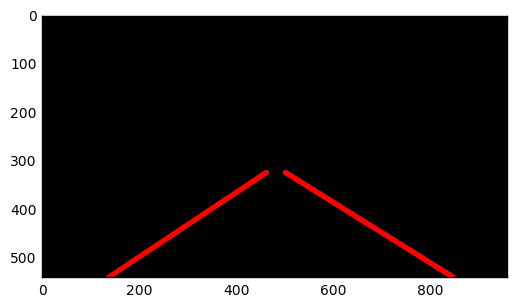

 77%|██████████████████████████████████████████████████████████████▎                  | 525/682 [05:17<01:21,  1.93it/s]

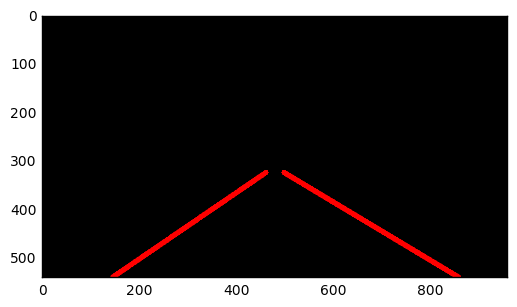

 77%|██████████████████████████████████████████████████████████████▍                  | 526/682 [05:18<01:20,  1.94it/s]

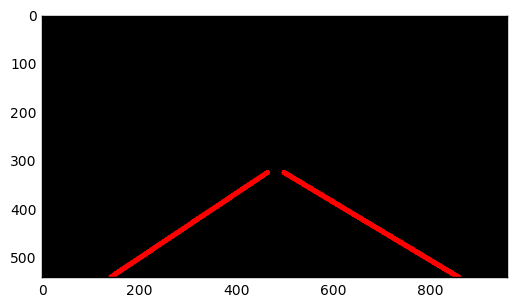

 77%|██████████████████████████████████████████████████████████████▌                  | 527/682 [05:18<01:19,  1.96it/s]

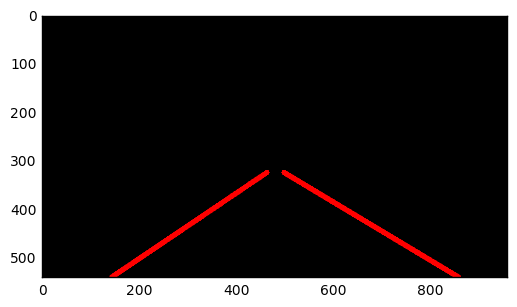

 77%|██████████████████████████████████████████████████████████████▋                  | 528/682 [05:19<01:29,  1.71it/s]

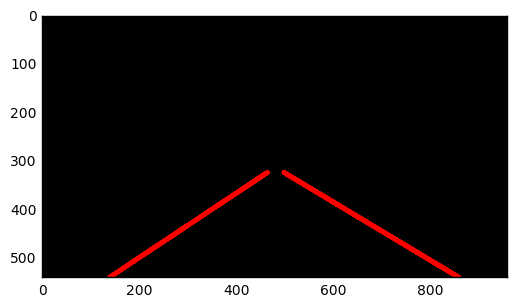

 78%|██████████████████████████████████████████████████████████████▊                  | 529/682 [05:20<01:25,  1.78it/s]

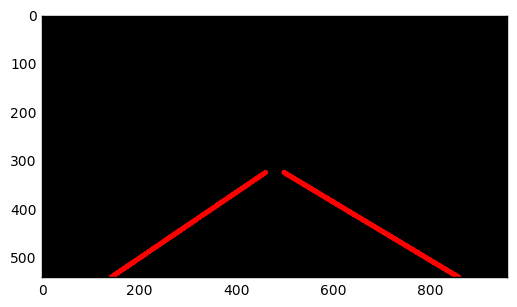

 78%|██████████████████████████████████████████████████████████████▉                  | 530/682 [05:20<01:22,  1.84it/s]

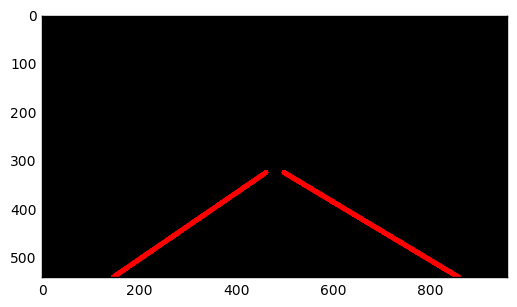

 78%|███████████████████████████████████████████████████████████████                  | 531/682 [05:21<01:21,  1.86it/s]

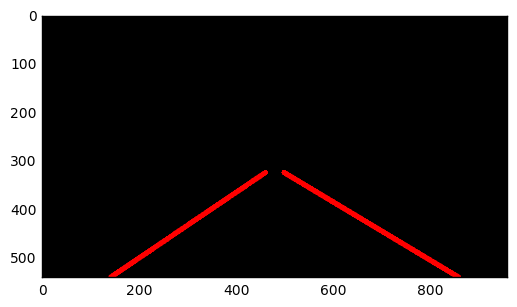

 78%|███████████████████████████████████████████████████████████████▏                 | 532/682 [05:21<01:18,  1.91it/s]

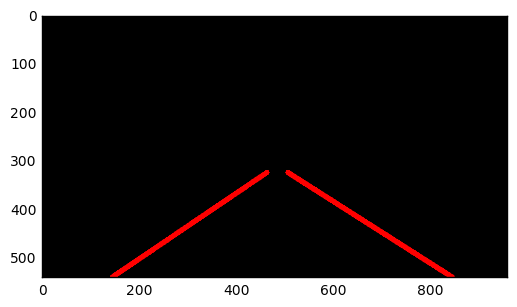

 78%|███████████████████████████████████████████████████████████████▎                 | 533/682 [05:22<01:18,  1.89it/s]

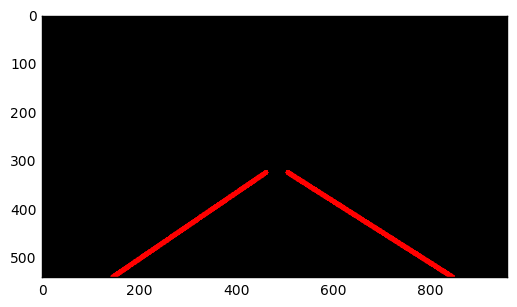

 78%|███████████████████████████████████████████████████████████████▍                 | 534/682 [05:22<01:18,  1.89it/s]

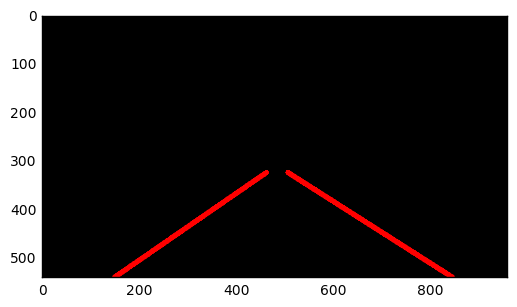

 78%|███████████████████████████████████████████████████████████████▌                 | 535/682 [05:23<01:16,  1.93it/s]

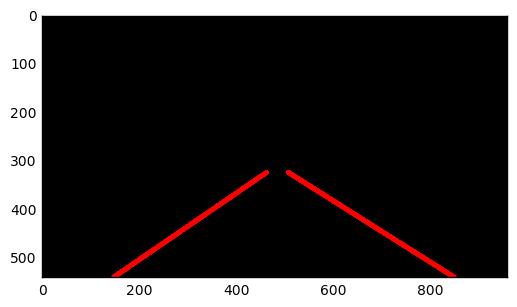

 79%|███████████████████████████████████████████████████████████████▋                 | 536/682 [05:23<01:15,  1.94it/s]

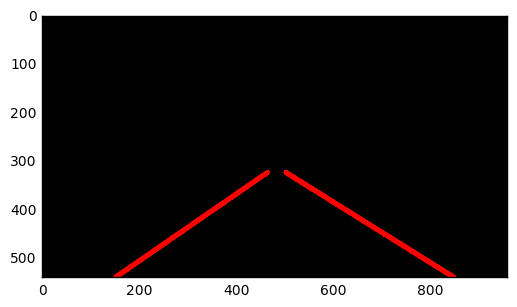

 79%|███████████████████████████████████████████████████████████████▊                 | 537/682 [05:24<01:13,  1.97it/s]

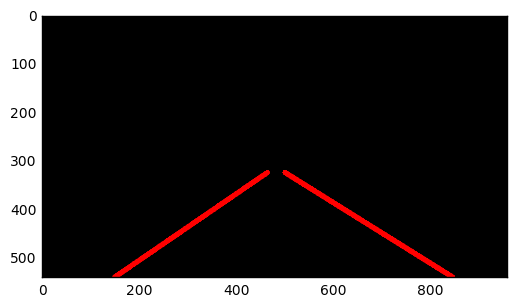

 79%|███████████████████████████████████████████████████████████████▉                 | 538/682 [05:24<01:13,  1.97it/s]

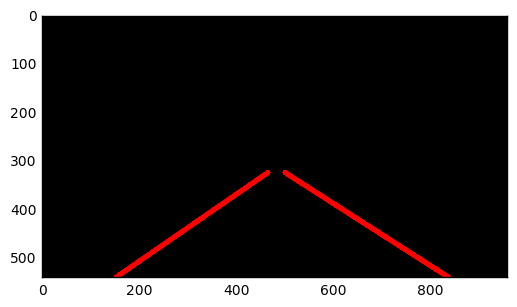

 79%|████████████████████████████████████████████████████████████████                 | 539/682 [05:25<01:26,  1.64it/s]

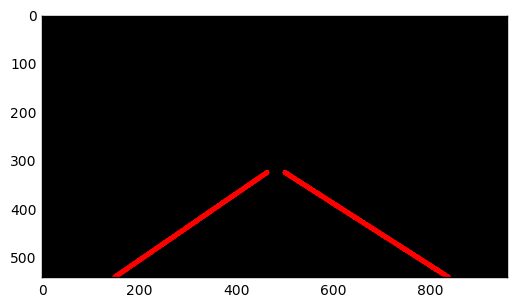

 79%|████████████████████████████████████████████████████████████████▏                | 540/682 [05:26<01:25,  1.65it/s]

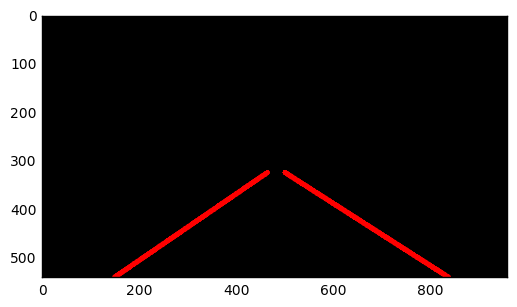

 79%|████████████████████████████████████████████████████████████████▎                | 541/682 [05:26<01:23,  1.68it/s]

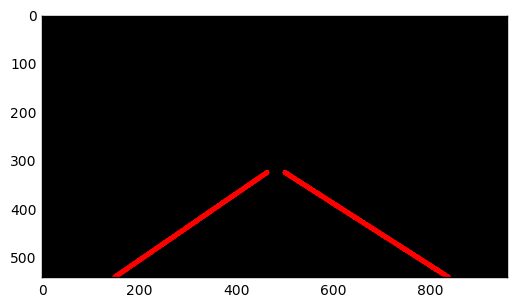

 79%|████████████████████████████████████████████████████████████████▎                | 542/682 [05:27<01:23,  1.69it/s]

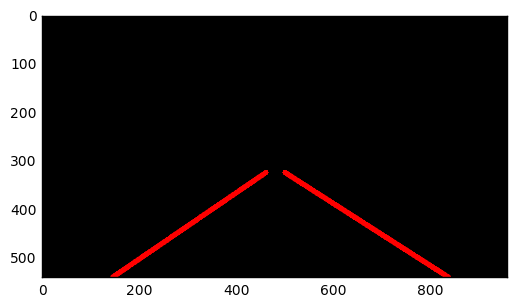

 80%|████████████████████████████████████████████████████████████████▍                | 543/682 [05:27<01:19,  1.75it/s]

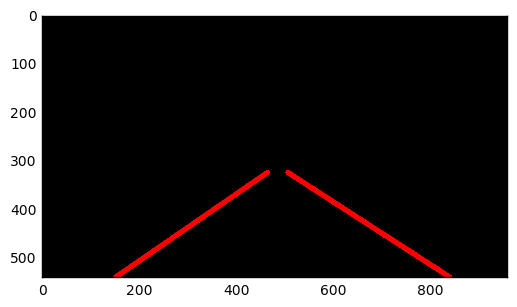

 80%|████████████████████████████████████████████████████████████████▌                | 544/682 [05:28<01:15,  1.82it/s]

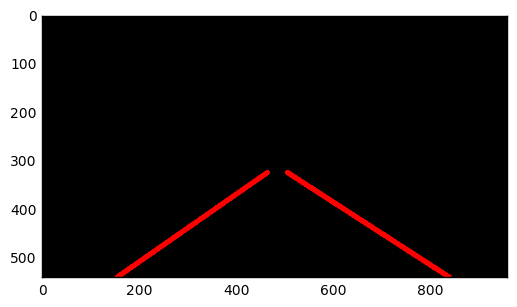

 80%|████████████████████████████████████████████████████████████████▋                | 545/682 [05:28<01:15,  1.81it/s]

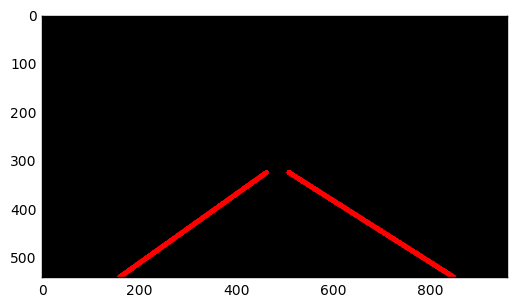

 80%|████████████████████████████████████████████████████████████████▊                | 546/682 [05:29<01:14,  1.84it/s]

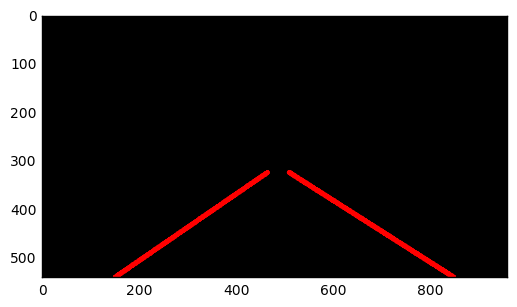

 80%|████████████████████████████████████████████████████████████████▉                | 547/682 [05:29<01:11,  1.89it/s]

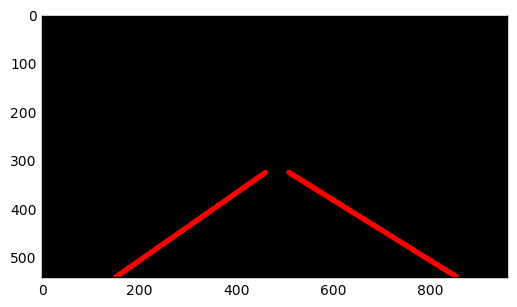

 80%|█████████████████████████████████████████████████████████████████                | 548/682 [05:30<01:11,  1.88it/s]

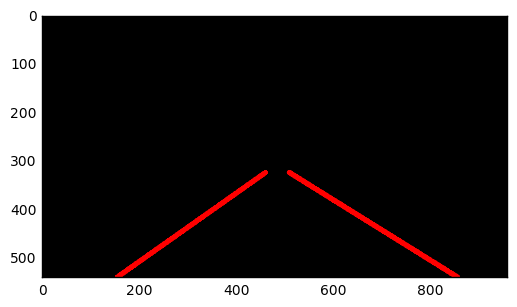

 80%|█████████████████████████████████████████████████████████████████▏               | 549/682 [05:30<01:12,  1.84it/s]

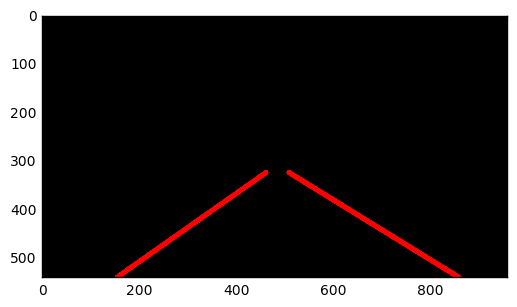

 81%|█████████████████████████████████████████████████████████████████▎               | 550/682 [05:31<01:22,  1.61it/s]

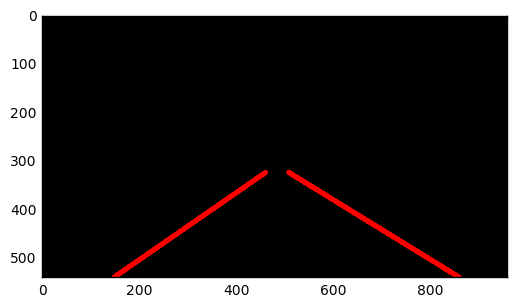

 81%|█████████████████████████████████████████████████████████████████▍               | 551/682 [05:32<01:17,  1.70it/s]

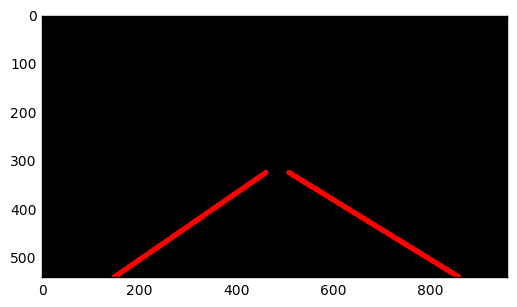

 81%|█████████████████████████████████████████████████████████████████▌               | 552/682 [05:32<01:13,  1.78it/s]

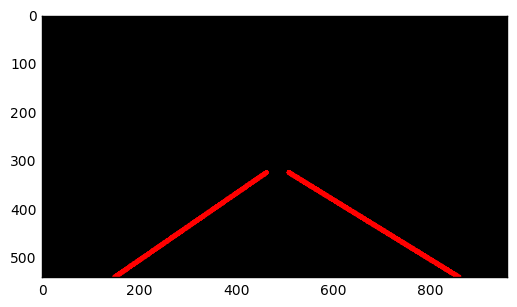

 81%|█████████████████████████████████████████████████████████████████▋               | 553/682 [05:33<01:10,  1.83it/s]

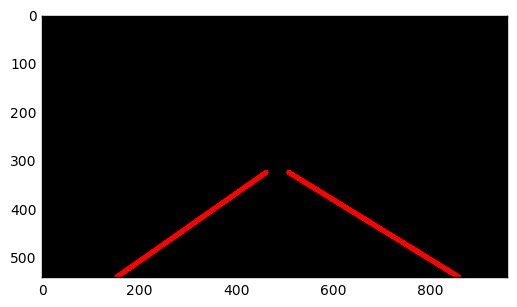

 81%|█████████████████████████████████████████████████████████████████▊               | 554/682 [05:33<01:08,  1.88it/s]

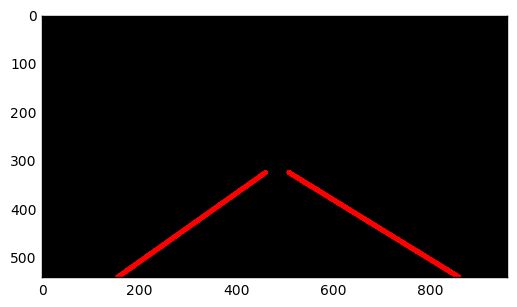

 81%|█████████████████████████████████████████████████████████████████▉               | 555/682 [05:34<01:05,  1.92it/s]

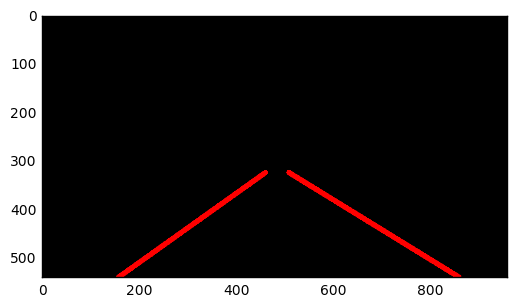

 82%|██████████████████████████████████████████████████████████████████               | 556/682 [05:34<01:06,  1.90it/s]

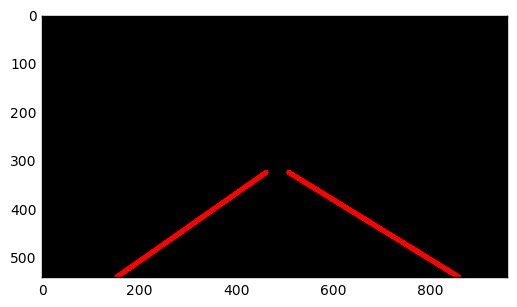

 82%|██████████████████████████████████████████████████████████████████▏              | 557/682 [05:35<01:06,  1.87it/s]

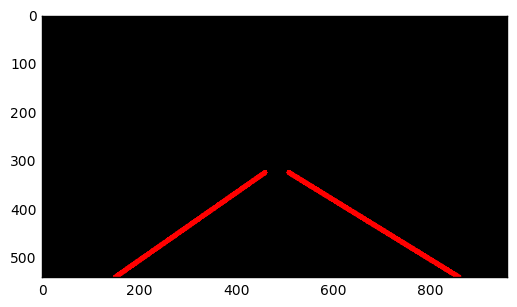

 82%|██████████████████████████████████████████████████████████████████▎              | 558/682 [05:35<01:06,  1.85it/s]

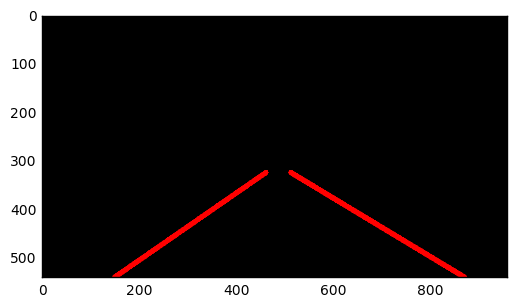

 82%|██████████████████████████████████████████████████████████████████▍              | 559/682 [05:36<01:09,  1.77it/s]

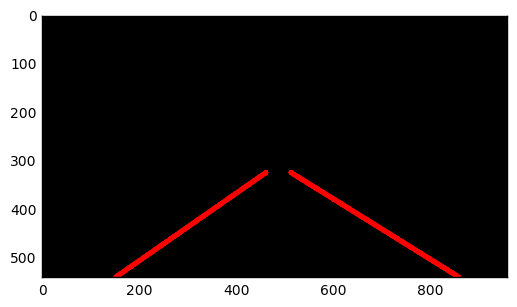

 82%|██████████████████████████████████████████████████████████████████▌              | 560/682 [05:37<01:09,  1.75it/s]

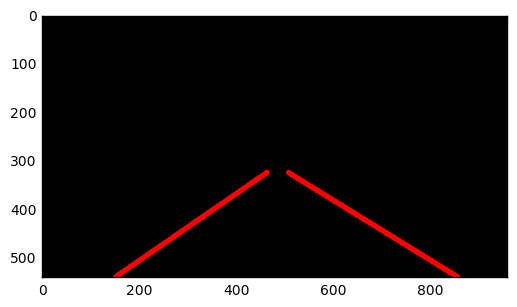

 82%|██████████████████████████████████████████████████████████████████▋              | 561/682 [05:37<01:15,  1.59it/s]

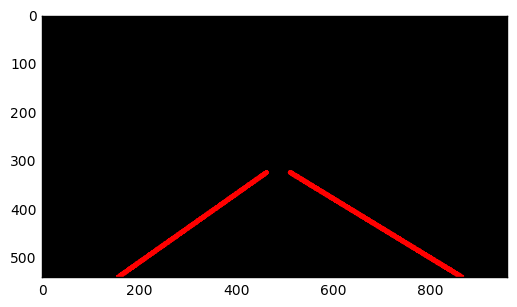

 82%|██████████████████████████████████████████████████████████████████▋              | 562/682 [05:38<01:11,  1.67it/s]

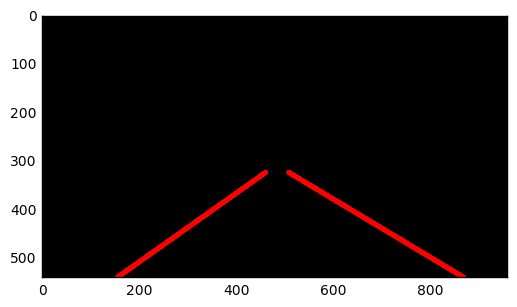

 83%|██████████████████████████████████████████████████████████████████▊              | 563/682 [05:38<01:10,  1.69it/s]

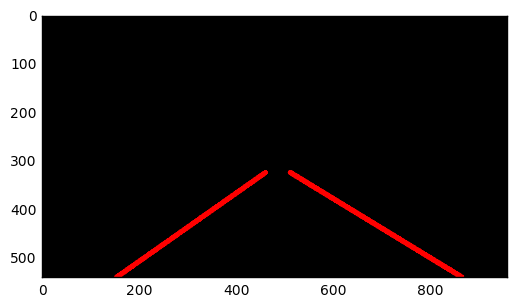

 83%|██████████████████████████████████████████████████████████████████▉              | 564/682 [05:39<01:09,  1.71it/s]

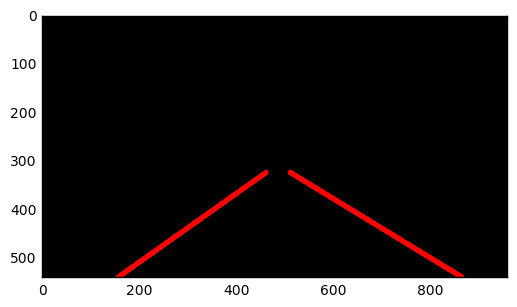

 83%|███████████████████████████████████████████████████████████████████              | 565/682 [05:40<01:06,  1.76it/s]

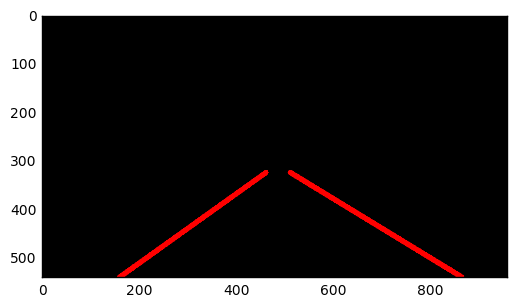

 83%|███████████████████████████████████████████████████████████████████▏             | 566/682 [05:40<01:04,  1.79it/s]

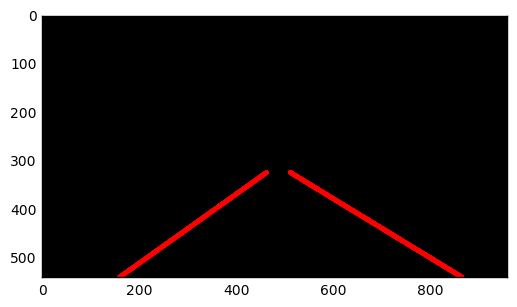

 83%|███████████████████████████████████████████████████████████████████▎             | 567/682 [05:41<01:02,  1.83it/s]

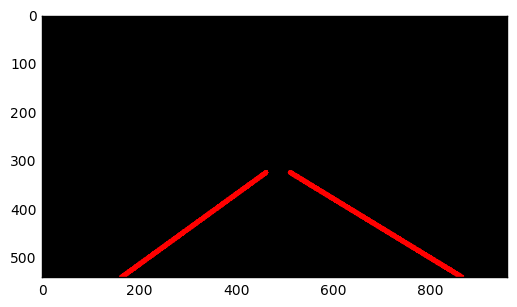

 83%|███████████████████████████████████████████████████████████████████▍             | 568/682 [05:41<01:02,  1.83it/s]

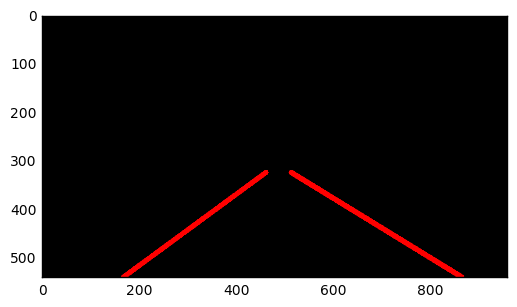

 83%|███████████████████████████████████████████████████████████████████▌             | 569/682 [05:42<01:03,  1.79it/s]

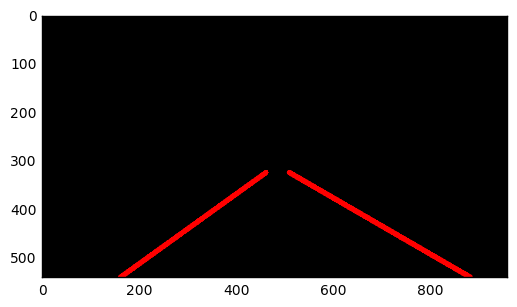

 84%|███████████████████████████████████████████████████████████████████▋             | 570/682 [05:42<01:00,  1.84it/s]

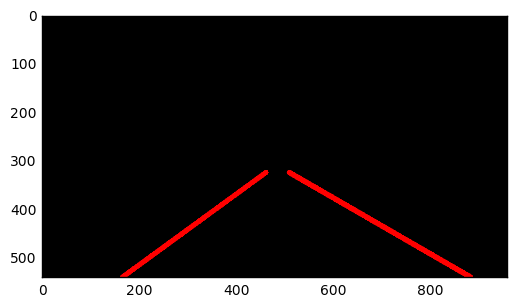

 84%|███████████████████████████████████████████████████████████████████▊             | 571/682 [05:43<01:00,  1.84it/s]

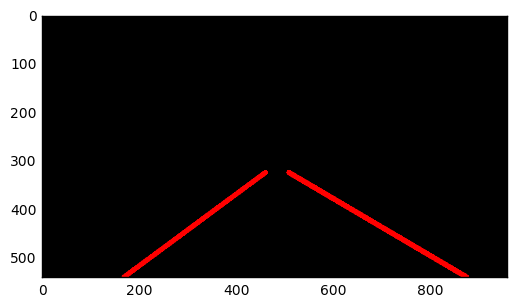

 84%|███████████████████████████████████████████████████████████████████▉             | 572/682 [05:44<01:06,  1.66it/s]

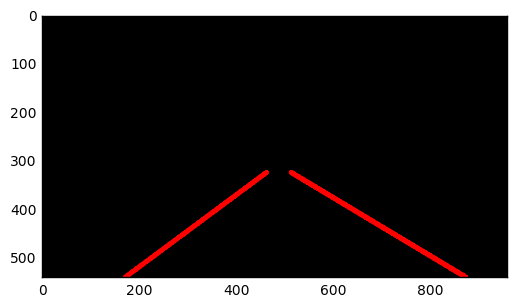

 84%|████████████████████████████████████████████████████████████████████             | 573/682 [05:44<01:04,  1.68it/s]

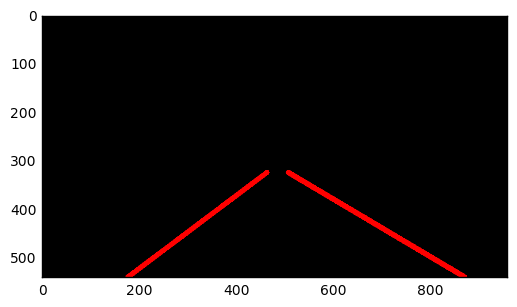

 84%|████████████████████████████████████████████████████████████████████▏            | 574/682 [05:45<01:01,  1.75it/s]

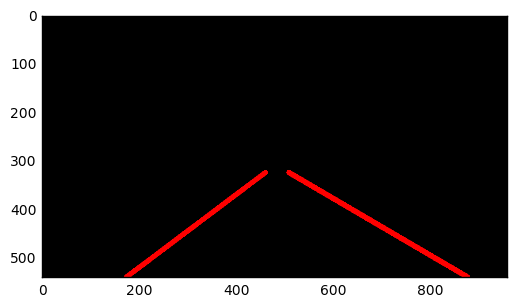

 84%|████████████████████████████████████████████████████████████████████▎            | 575/682 [05:45<00:59,  1.79it/s]

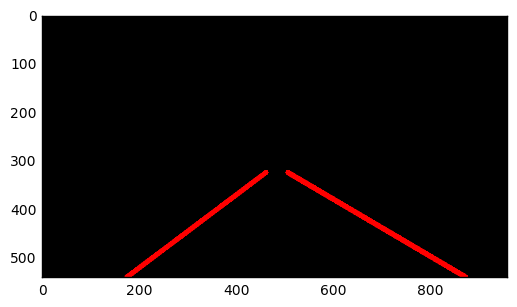

 84%|████████████████████████████████████████████████████████████████████▍            | 576/682 [05:46<00:57,  1.84it/s]

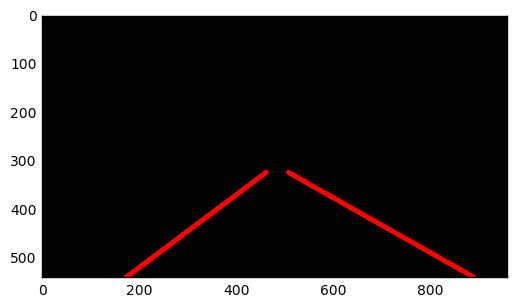

 85%|████████████████████████████████████████████████████████████████████▌            | 577/682 [05:46<00:57,  1.82it/s]

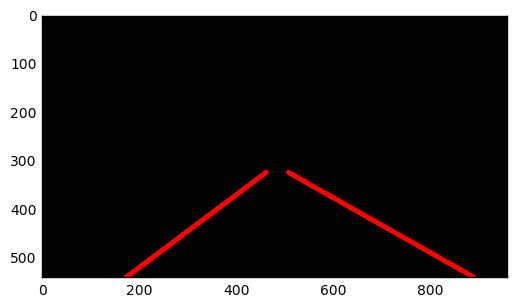

 85%|████████████████████████████████████████████████████████████████████▋            | 578/682 [05:47<00:56,  1.84it/s]

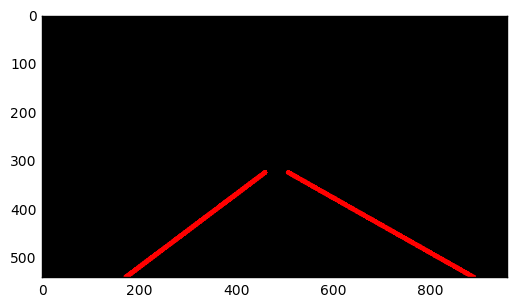

 85%|████████████████████████████████████████████████████████████████████▊            | 579/682 [05:47<00:54,  1.88it/s]

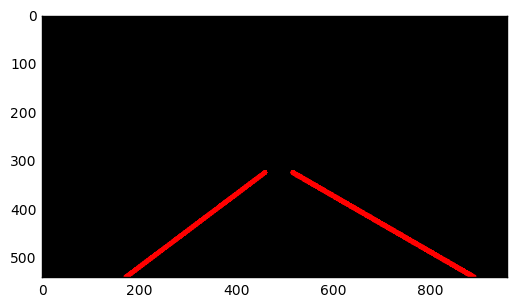

 85%|████████████████████████████████████████████████████████████████████▉            | 580/682 [05:48<00:54,  1.89it/s]

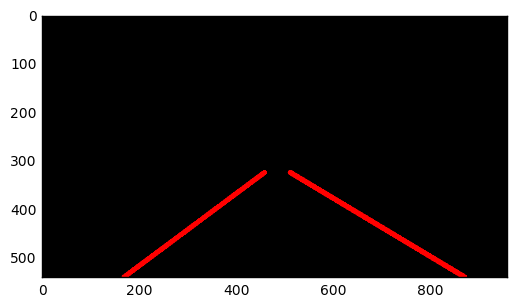

 85%|█████████████████████████████████████████████████████████████████████            | 581/682 [05:48<00:53,  1.90it/s]

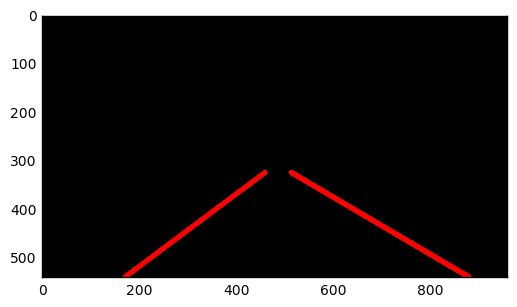

 85%|█████████████████████████████████████████████████████████████████████            | 582/682 [05:49<00:54,  1.84it/s]

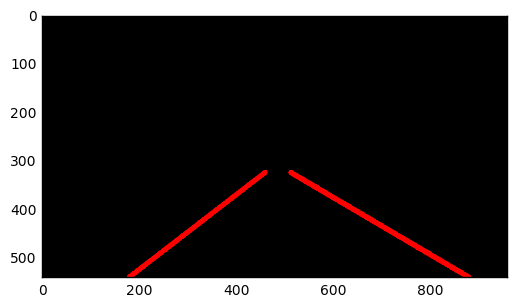

 85%|█████████████████████████████████████████████████████████████████████▏           | 583/682 [05:50<01:01,  1.62it/s]

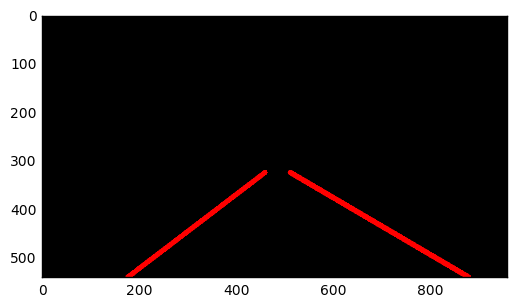

 86%|█████████████████████████████████████████████████████████████████████▎           | 584/682 [05:50<00:59,  1.65it/s]

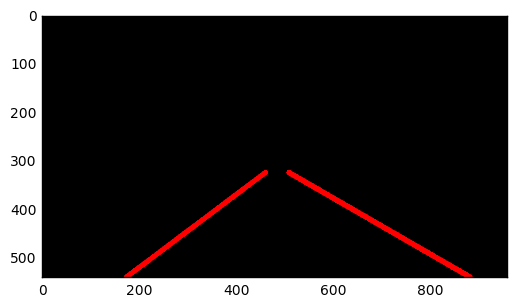

 86%|█████████████████████████████████████████████████████████████████████▍           | 585/682 [05:51<00:55,  1.74it/s]

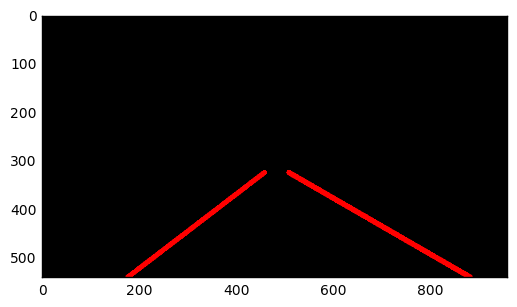

 86%|█████████████████████████████████████████████████████████████████████▌           | 586/682 [05:51<00:53,  1.79it/s]

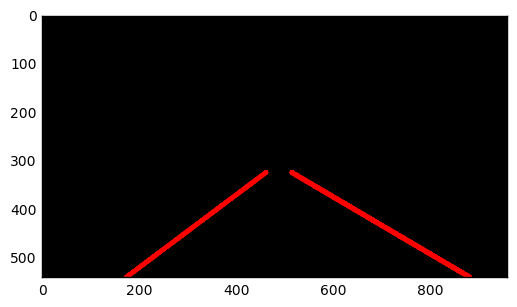

 86%|█████████████████████████████████████████████████████████████████████▋           | 587/682 [05:52<00:54,  1.75it/s]

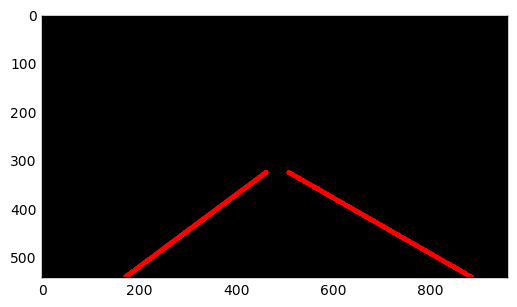

 86%|█████████████████████████████████████████████████████████████████████▊           | 588/682 [05:52<00:52,  1.78it/s]

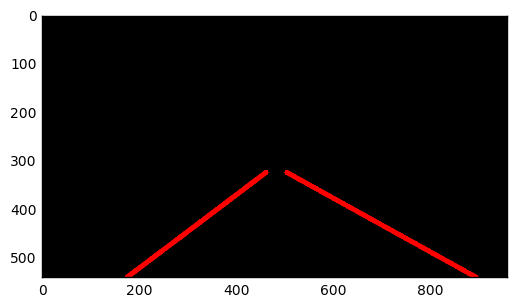

 86%|█████████████████████████████████████████████████████████████████████▉           | 589/682 [05:53<00:53,  1.73it/s]

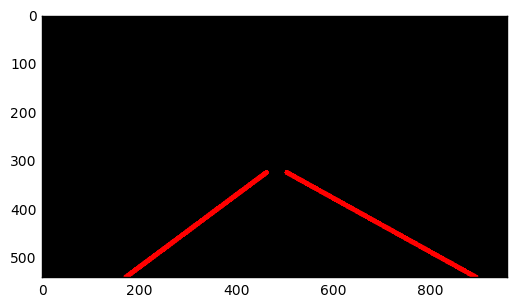

 87%|██████████████████████████████████████████████████████████████████████           | 590/682 [05:54<00:55,  1.66it/s]

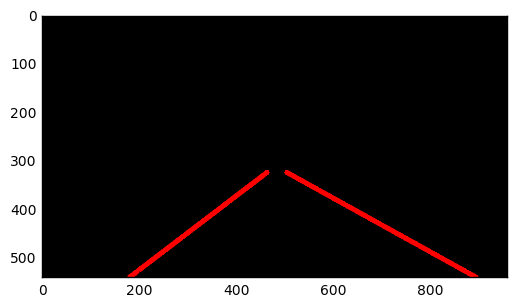

 87%|██████████████████████████████████████████████████████████████████████▏          | 591/682 [05:55<00:59,  1.52it/s]

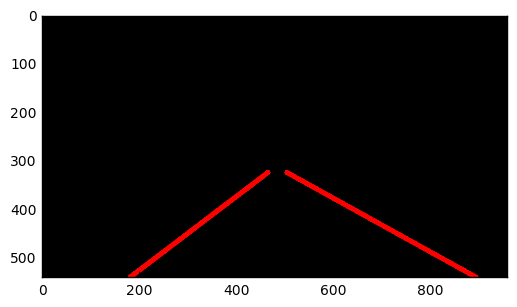

 87%|██████████████████████████████████████████████████████████████████████▎          | 592/682 [05:55<00:59,  1.52it/s]

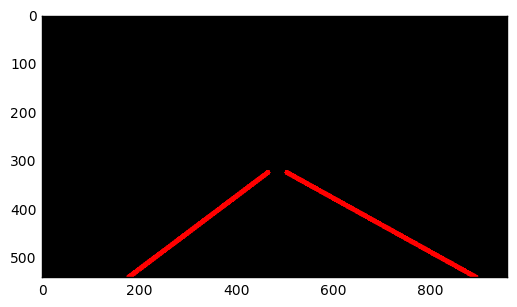

 87%|██████████████████████████████████████████████████████████████████████▍          | 593/682 [05:56<01:02,  1.42it/s]

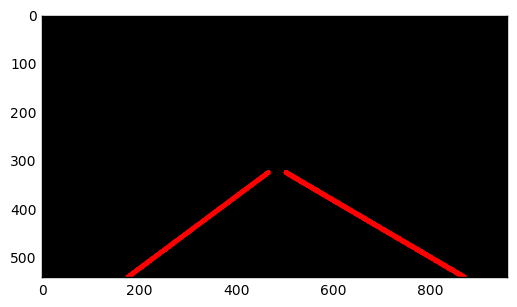

 87%|██████████████████████████████████████████████████████████████████████▌          | 594/682 [05:57<01:12,  1.22it/s]

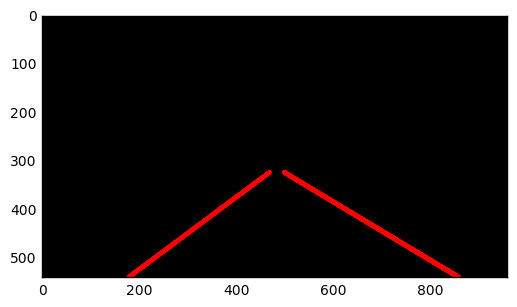

 87%|██████████████████████████████████████████████████████████████████████▋          | 595/682 [05:58<01:06,  1.30it/s]

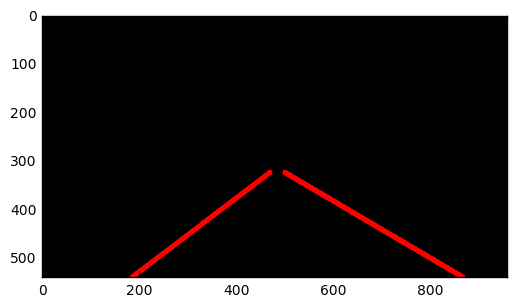

 87%|██████████████████████████████████████████████████████████████████████▊          | 596/682 [05:58<01:05,  1.31it/s]

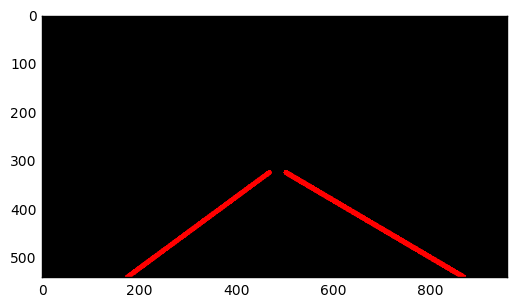

 88%|██████████████████████████████████████████████████████████████████████▉          | 597/682 [05:59<01:00,  1.40it/s]

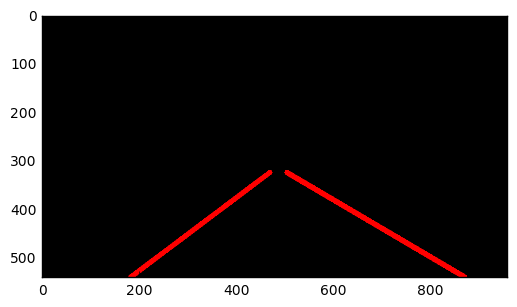

 88%|███████████████████████████████████████████████████████████████████████          | 598/682 [06:00<01:00,  1.40it/s]

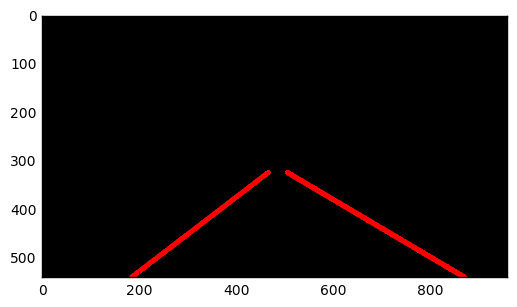

 88%|███████████████████████████████████████████████████████████████████████▏         | 599/682 [06:01<01:02,  1.33it/s]

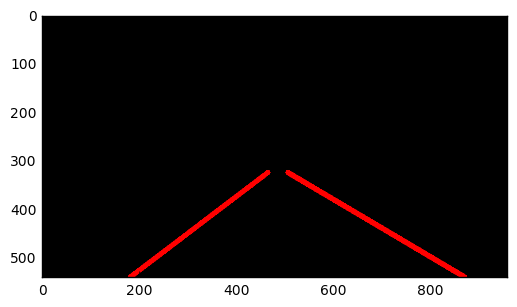

 88%|███████████████████████████████████████████████████████████████████████▎         | 600/682 [06:01<01:02,  1.32it/s]

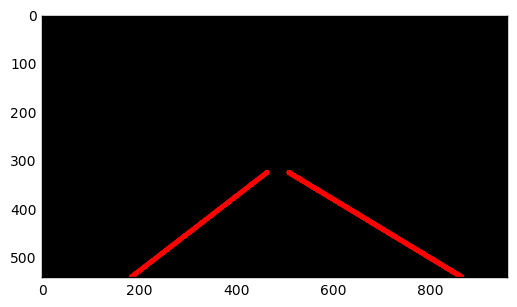

 88%|███████████████████████████████████████████████████████████████████████▍         | 601/682 [06:02<00:57,  1.40it/s]

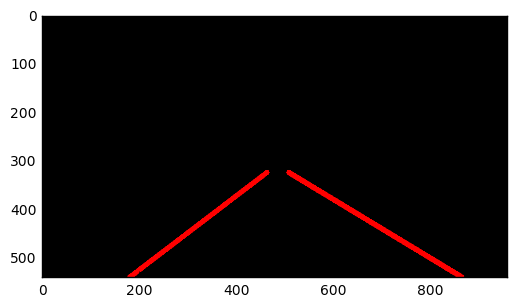

 88%|███████████████████████████████████████████████████████████████████████▍         | 602/682 [06:03<00:59,  1.34it/s]

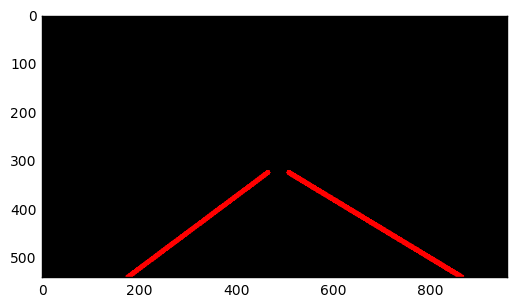

 88%|███████████████████████████████████████████████████████████████████████▌         | 603/682 [06:04<00:59,  1.33it/s]

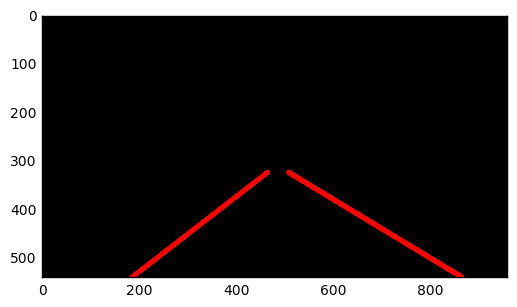

 89%|███████████████████████████████████████████████████████████████████████▋         | 604/682 [06:04<00:58,  1.32it/s]

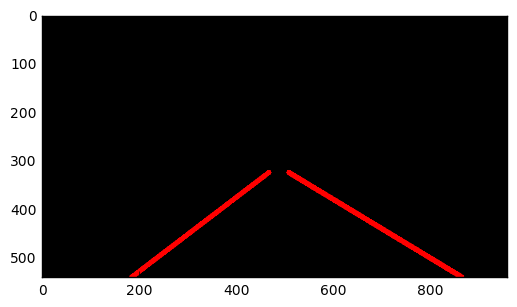

 89%|███████████████████████████████████████████████████████████████████████▊         | 605/682 [06:05<00:58,  1.31it/s]

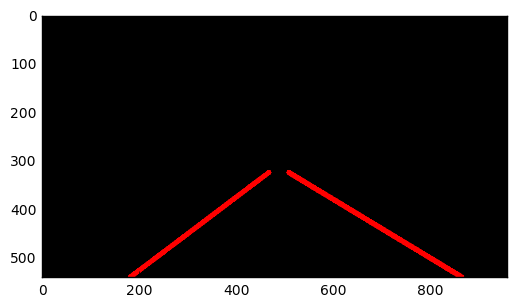

 89%|███████████████████████████████████████████████████████████████████████▉         | 606/682 [06:06<00:52,  1.46it/s]

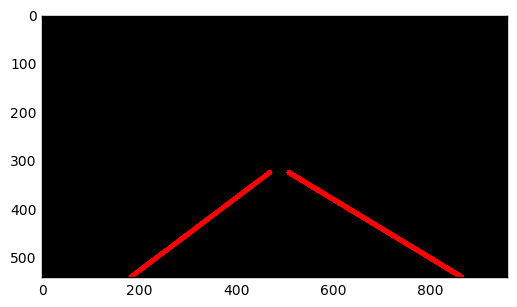

 89%|████████████████████████████████████████████████████████████████████████         | 607/682 [06:06<00:48,  1.56it/s]

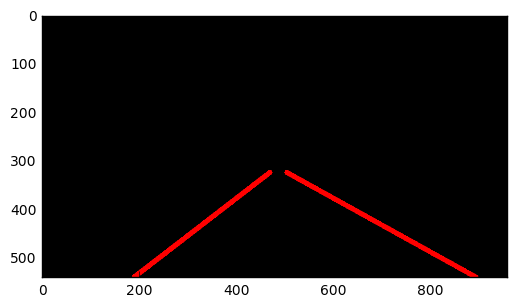

 89%|████████████████████████████████████████████████████████████████████████▏        | 608/682 [06:07<00:44,  1.66it/s]

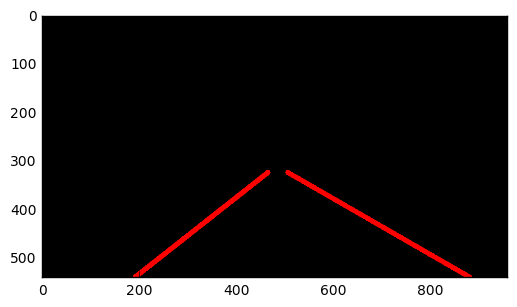

 89%|████████████████████████████████████████████████████████████████████████▎        | 609/682 [06:07<00:42,  1.72it/s]

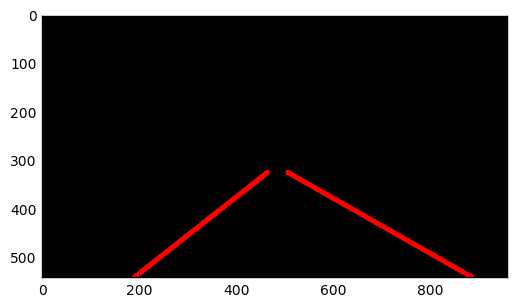

 89%|████████████████████████████████████████████████████████████████████████▍        | 610/682 [06:08<00:40,  1.79it/s]

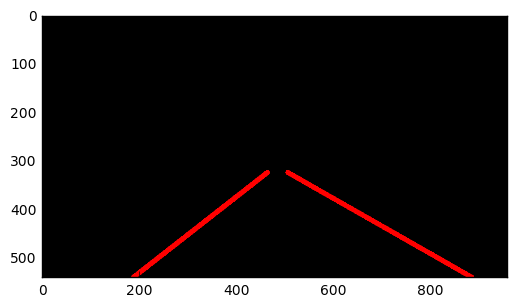

 90%|████████████████████████████████████████████████████████████████████████▌        | 611/682 [06:08<00:38,  1.85it/s]

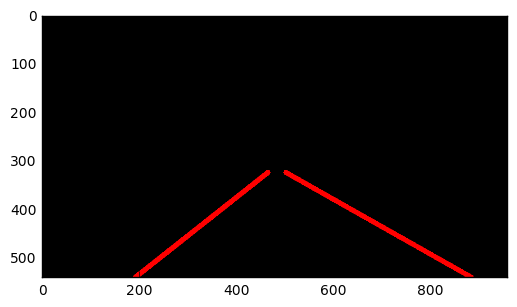

 90%|████████████████████████████████████████████████████████████████████████▋        | 612/682 [06:09<00:37,  1.88it/s]

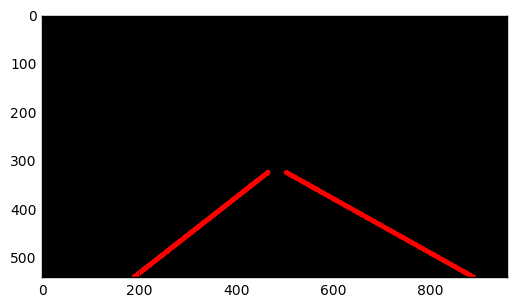

 90%|████████████████████████████████████████████████████████████████████████▊        | 613/682 [06:09<00:37,  1.86it/s]

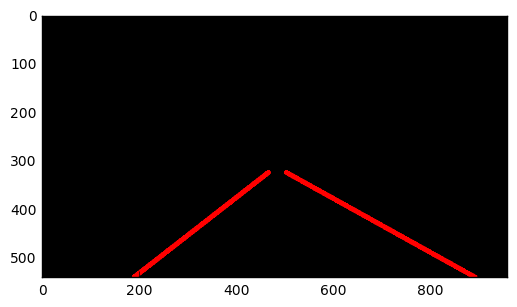

 90%|████████████████████████████████████████████████████████████████████████▉        | 614/682 [06:10<00:36,  1.86it/s]

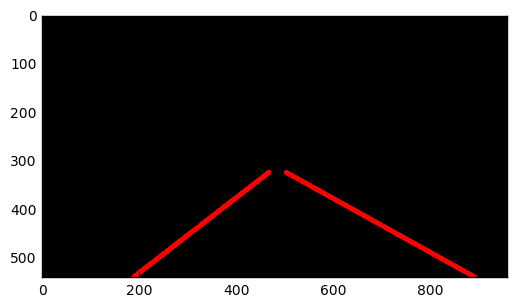

 90%|█████████████████████████████████████████████████████████████████████████        | 615/682 [06:10<00:35,  1.87it/s]

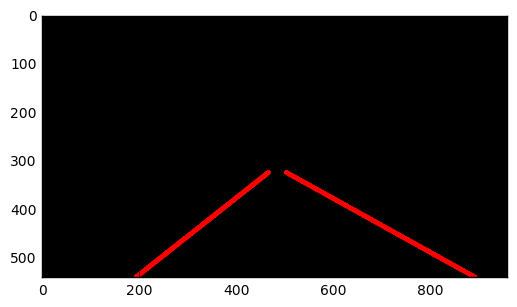

 90%|█████████████████████████████████████████████████████████████████████████▏       | 616/682 [06:11<00:39,  1.69it/s]

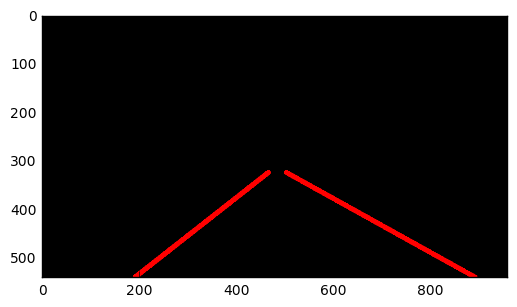

 90%|█████████████████████████████████████████████████████████████████████████▎       | 617/682 [06:12<00:39,  1.65it/s]

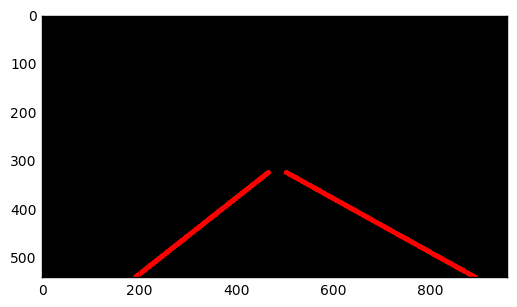

 91%|█████████████████████████████████████████████████████████████████████████▍       | 618/682 [06:12<00:39,  1.63it/s]

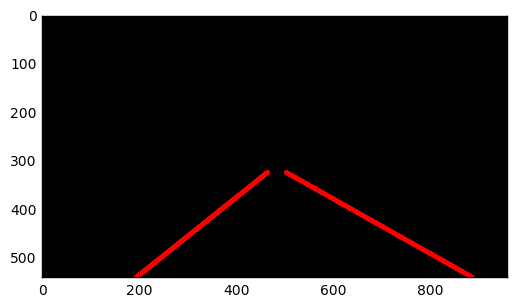

 91%|█████████████████████████████████████████████████████████████████████████▌       | 619/682 [06:13<00:36,  1.71it/s]

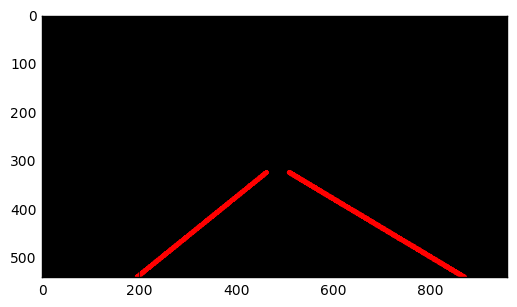

 91%|█████████████████████████████████████████████████████████████████████████▋       | 620/682 [06:13<00:34,  1.78it/s]

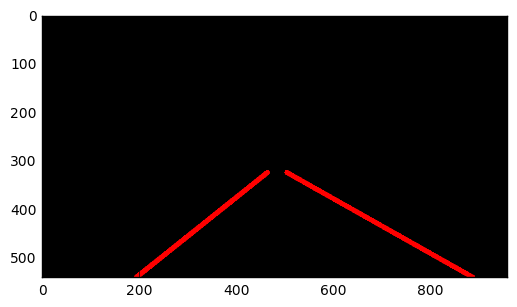

 91%|█████████████████████████████████████████████████████████████████████████▊       | 621/682 [06:14<00:33,  1.84it/s]

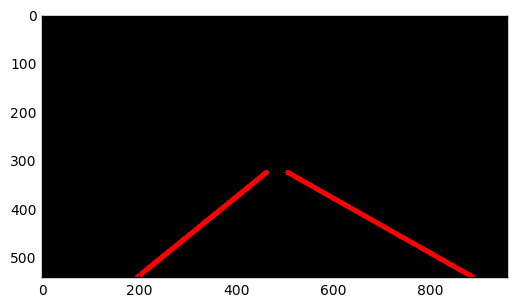

 91%|█████████████████████████████████████████████████████████████████████████▊       | 622/682 [06:14<00:32,  1.87it/s]

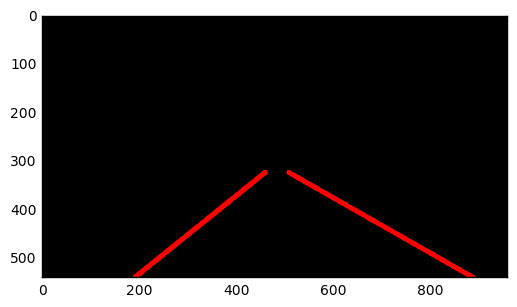

 91%|█████████████████████████████████████████████████████████████████████████▉       | 623/682 [06:15<00:31,  1.88it/s]

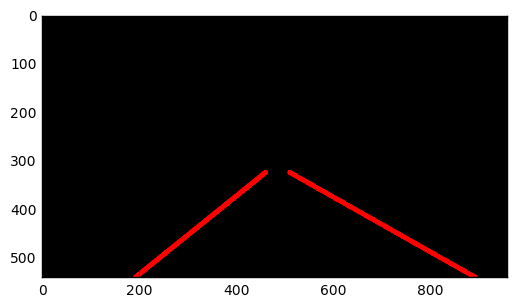

 91%|██████████████████████████████████████████████████████████████████████████       | 624/682 [06:16<00:32,  1.79it/s]

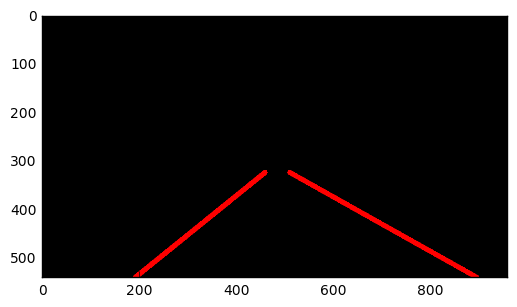

 92%|██████████████████████████████████████████████████████████████████████████▏      | 625/682 [06:16<00:36,  1.55it/s]

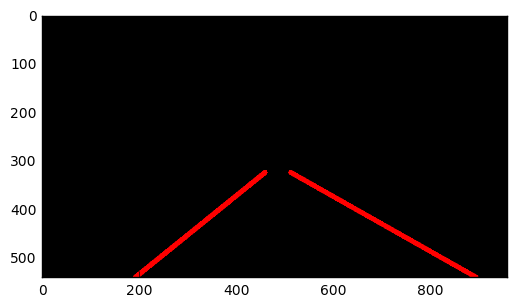

 92%|██████████████████████████████████████████████████████████████████████████▎      | 626/682 [06:17<00:34,  1.61it/s]

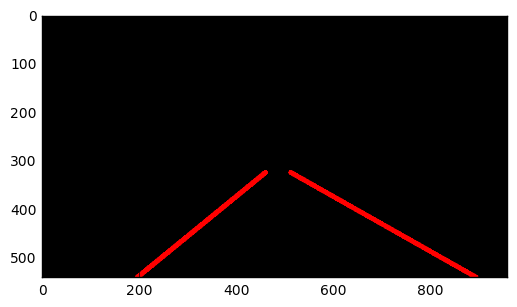

 92%|██████████████████████████████████████████████████████████████████████████▍      | 627/682 [06:18<00:36,  1.52it/s]

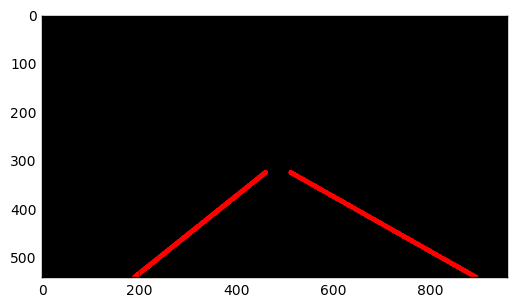

 92%|██████████████████████████████████████████████████████████████████████████▌      | 628/682 [06:18<00:33,  1.60it/s]

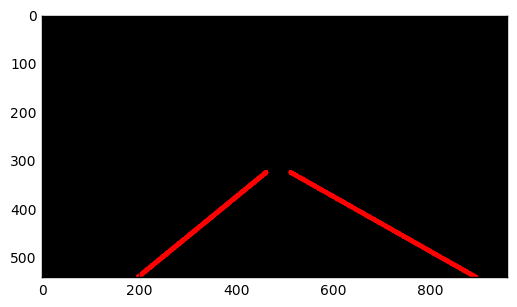

 92%|██████████████████████████████████████████████████████████████████████████▋      | 629/682 [06:19<00:31,  1.71it/s]

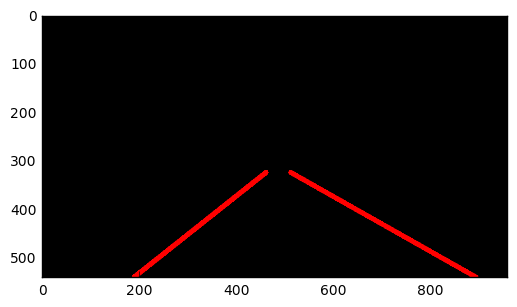

 92%|██████████████████████████████████████████████████████████████████████████▊      | 630/682 [06:19<00:29,  1.78it/s]

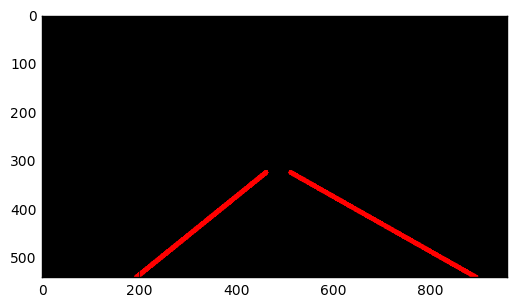

 93%|██████████████████████████████████████████████████████████████████████████▉      | 631/682 [06:20<00:27,  1.83it/s]

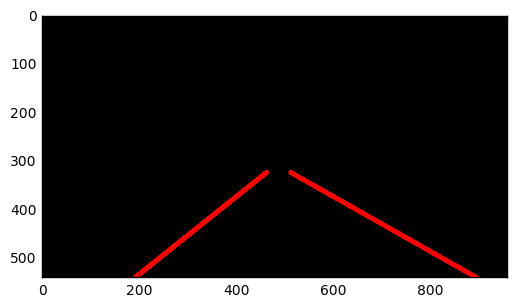

 93%|███████████████████████████████████████████████████████████████████████████      | 632/682 [06:20<00:27,  1.81it/s]

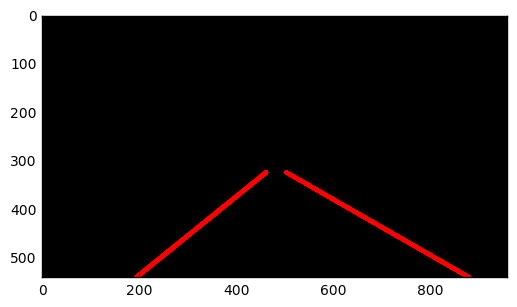

 93%|███████████████████████████████████████████████████████████████████████████▏     | 633/682 [06:21<00:26,  1.86it/s]

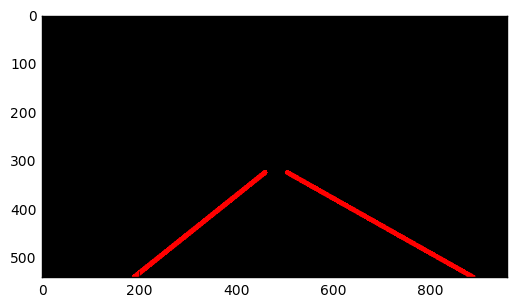

 93%|███████████████████████████████████████████████████████████████████████████▎     | 634/682 [06:21<00:25,  1.91it/s]

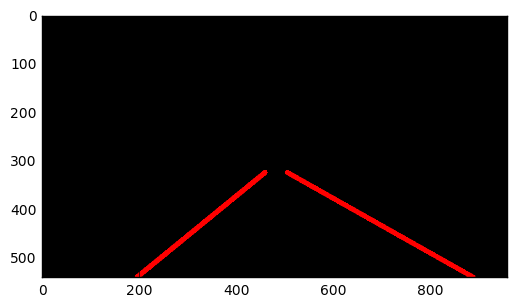

 93%|███████████████████████████████████████████████████████████████████████████▍     | 635/682 [06:22<00:24,  1.94it/s]

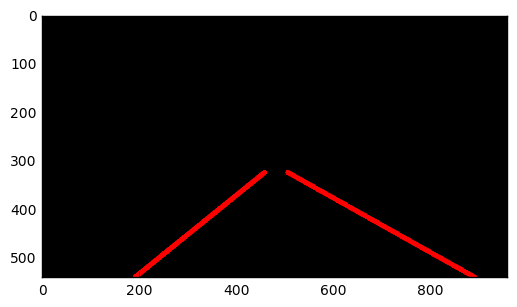

 93%|███████████████████████████████████████████████████████████████████████████▌     | 636/682 [06:22<00:23,  1.94it/s]

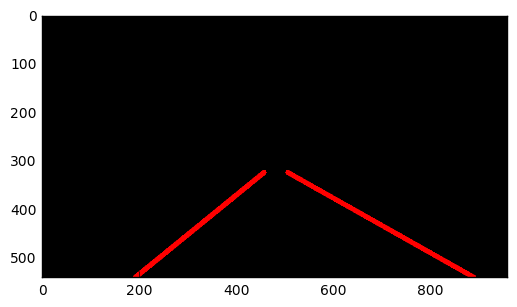

 93%|███████████████████████████████████████████████████████████████████████████▋     | 637/682 [06:23<00:22,  1.98it/s]

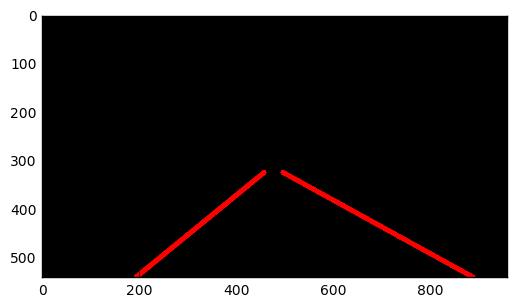

 94%|███████████████████████████████████████████████████████████████████████████▊     | 638/682 [06:23<00:24,  1.78it/s]

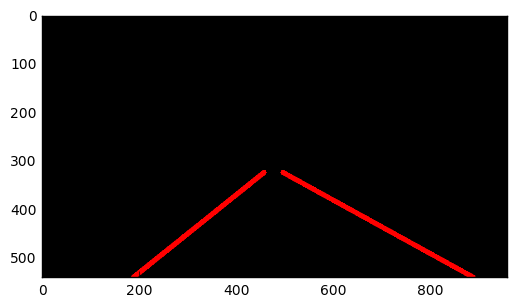

 94%|███████████████████████████████████████████████████████████████████████████▉     | 639/682 [06:24<00:23,  1.85it/s]

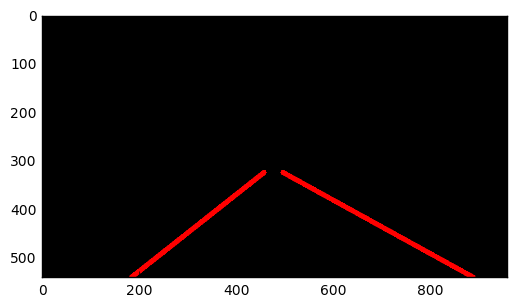

 94%|████████████████████████████████████████████████████████████████████████████     | 640/682 [06:25<00:22,  1.87it/s]

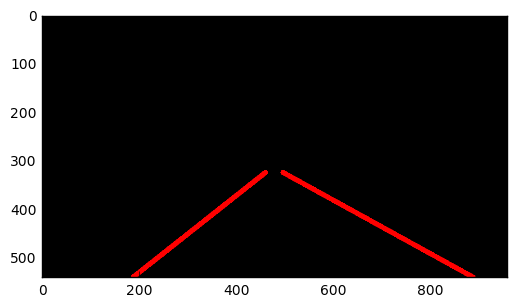

 94%|████████████████████████████████████████████████████████████████████████████▏    | 641/682 [06:25<00:21,  1.91it/s]

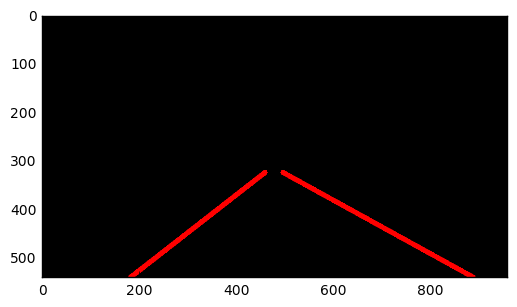

 94%|████████████████████████████████████████████████████████████████████████████▏    | 642/682 [06:26<00:20,  1.93it/s]

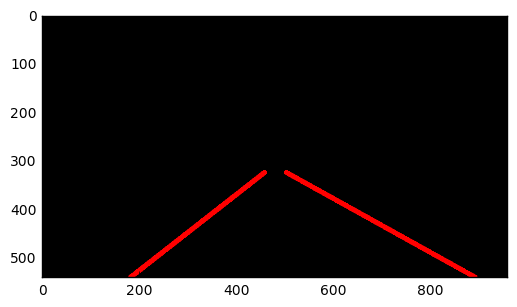

 94%|████████████████████████████████████████████████████████████████████████████▎    | 643/682 [06:26<00:19,  1.96it/s]

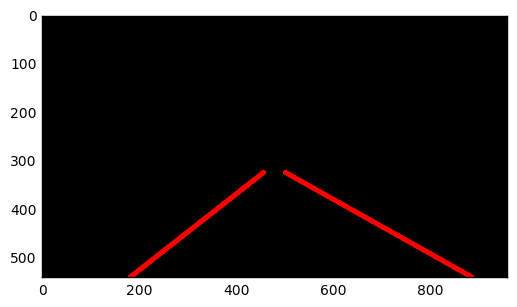

 94%|████████████████████████████████████████████████████████████████████████████▍    | 644/682 [06:27<00:19,  1.96it/s]

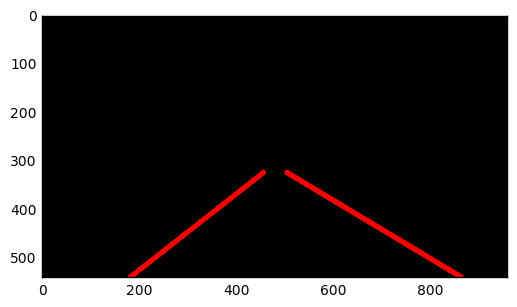

 95%|████████████████████████████████████████████████████████████████████████████▌    | 645/682 [06:27<00:18,  1.96it/s]

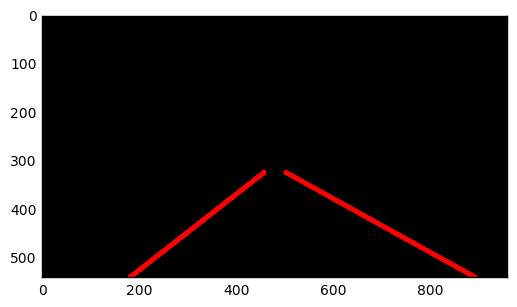

 95%|████████████████████████████████████████████████████████████████████████████▋    | 646/682 [06:28<00:18,  1.94it/s]

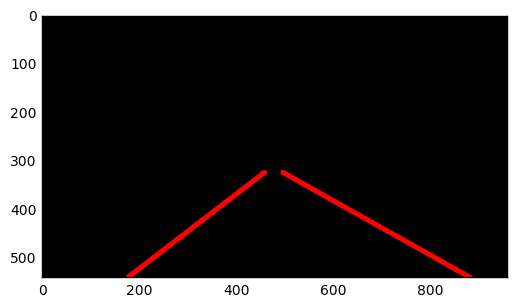

 95%|████████████████████████████████████████████████████████████████████████████▊    | 647/682 [06:28<00:17,  1.96it/s]

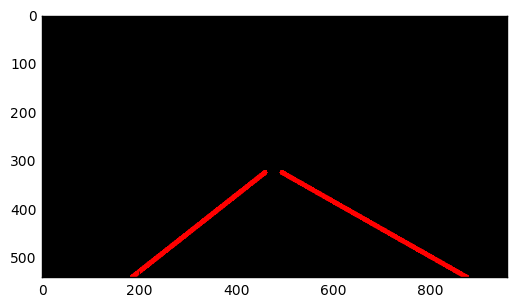

 95%|████████████████████████████████████████████████████████████████████████████▉    | 648/682 [06:29<00:17,  1.96it/s]

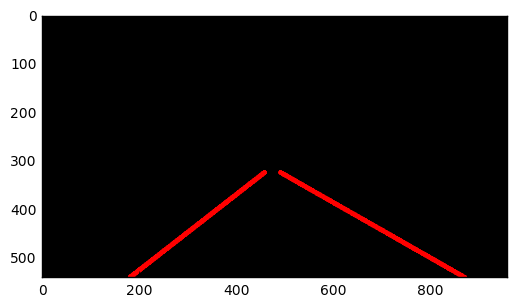

 95%|█████████████████████████████████████████████████████████████████████████████    | 649/682 [06:29<00:18,  1.77it/s]

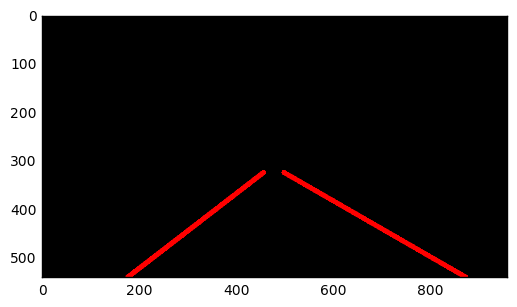

 95%|█████████████████████████████████████████████████████████████████████████████▏   | 650/682 [06:30<00:17,  1.79it/s]

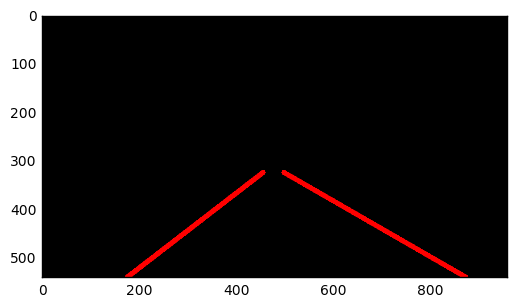

 95%|█████████████████████████████████████████████████████████████████████████████▎   | 651/682 [06:30<00:17,  1.77it/s]

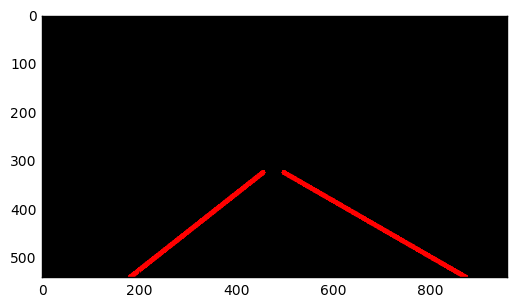

 96%|█████████████████████████████████████████████████████████████████████████████▍   | 652/682 [06:31<00:16,  1.84it/s]

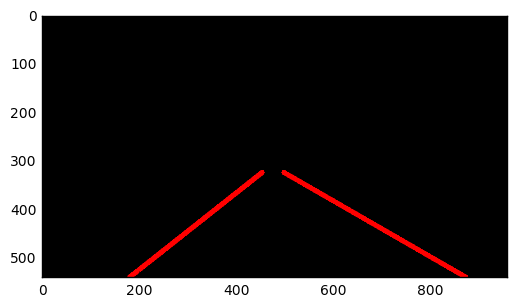

 96%|█████████████████████████████████████████████████████████████████████████████▌   | 653/682 [06:31<00:15,  1.88it/s]

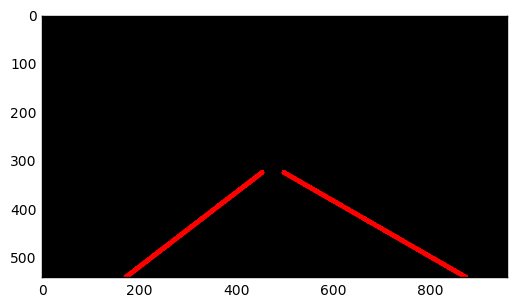

 96%|█████████████████████████████████████████████████████████████████████████████▋   | 654/682 [06:32<00:14,  1.90it/s]

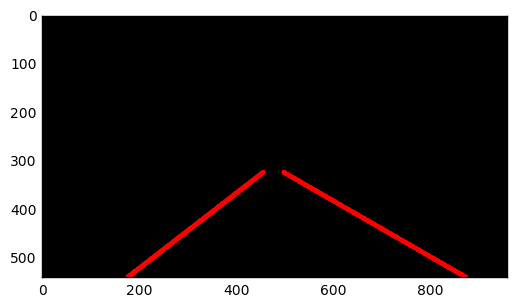

 96%|█████████████████████████████████████████████████████████████████████████████▊   | 655/682 [06:32<00:14,  1.83it/s]

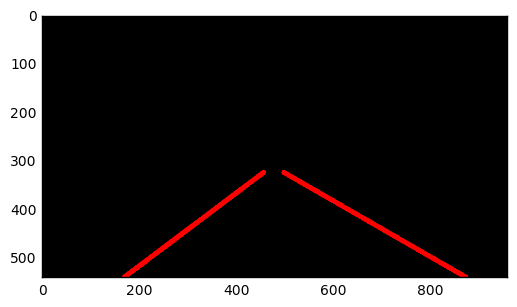

 96%|█████████████████████████████████████████████████████████████████████████████▉   | 656/682 [06:33<00:14,  1.77it/s]

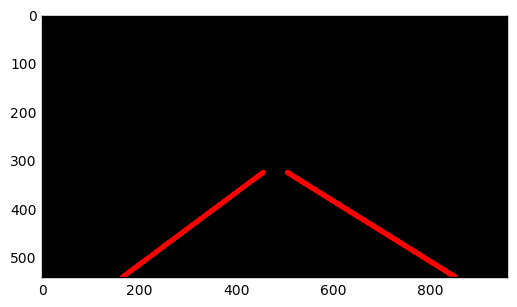

 96%|██████████████████████████████████████████████████████████████████████████████   | 657/682 [06:34<00:14,  1.73it/s]

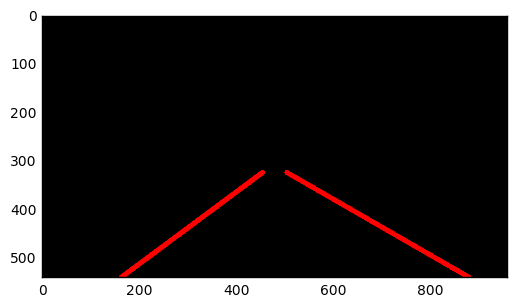

 96%|██████████████████████████████████████████████████████████████████████████████▏  | 658/682 [06:34<00:13,  1.79it/s]

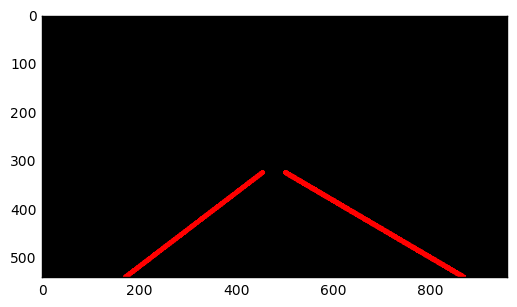

 97%|██████████████████████████████████████████████████████████████████████████████▎  | 659/682 [06:35<00:13,  1.66it/s]

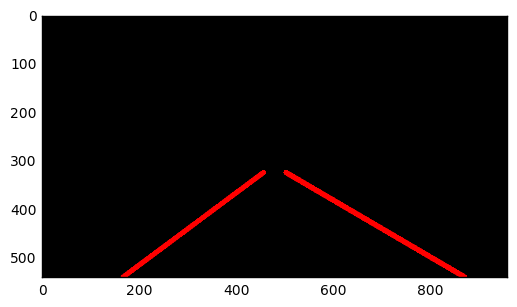

 97%|██████████████████████████████████████████████████████████████████████████████▍  | 660/682 [06:36<00:15,  1.44it/s]

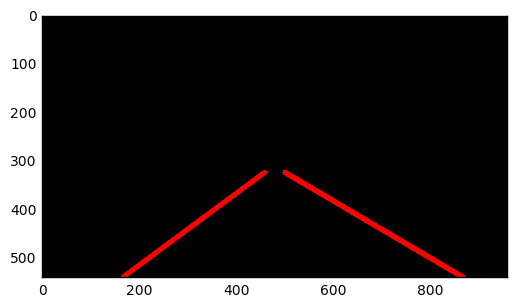

 97%|██████████████████████████████████████████████████████████████████████████████▌  | 661/682 [06:36<00:13,  1.52it/s]

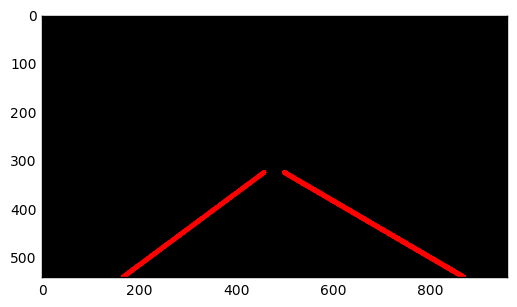

 97%|██████████████████████████████████████████████████████████████████████████████▌  | 662/682 [06:37<00:12,  1.62it/s]

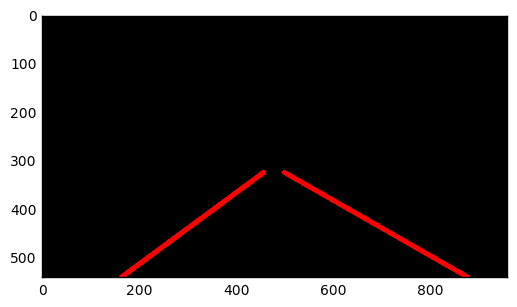

 97%|██████████████████████████████████████████████████████████████████████████████▋  | 663/682 [06:37<00:11,  1.72it/s]

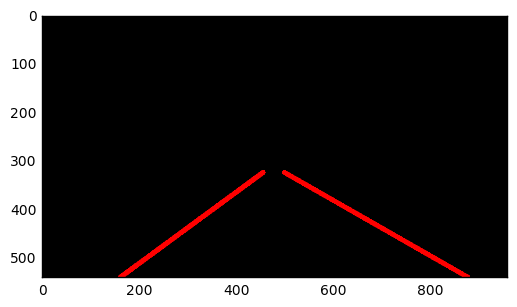

 97%|██████████████████████████████████████████████████████████████████████████████▊  | 664/682 [06:38<00:09,  1.80it/s]

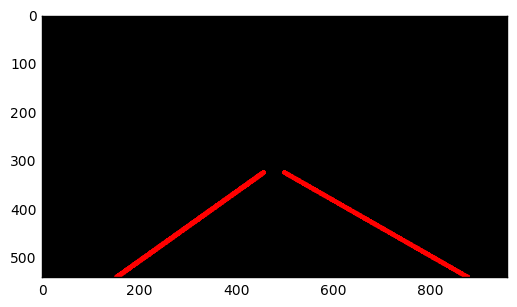

 98%|██████████████████████████████████████████████████████████████████████████████▉  | 665/682 [06:38<00:09,  1.86it/s]

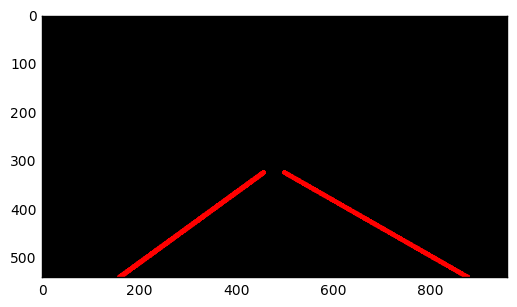

 98%|███████████████████████████████████████████████████████████████████████████████  | 666/682 [06:39<00:08,  1.83it/s]

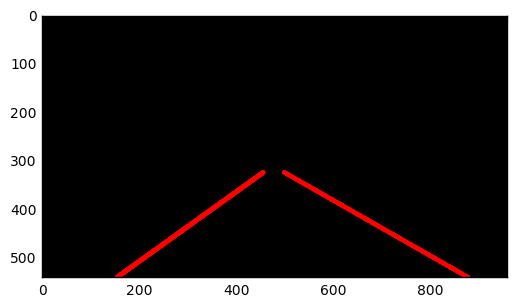

 98%|███████████████████████████████████████████████████████████████████████████████▏ | 667/682 [06:40<00:08,  1.81it/s]

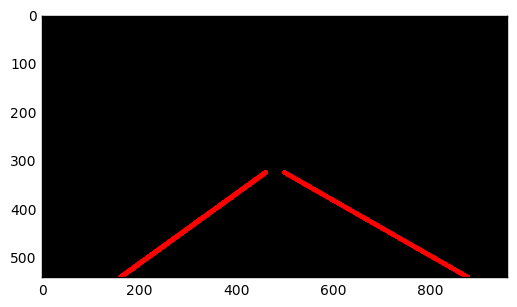

 98%|███████████████████████████████████████████████████████████████████████████████▎ | 668/682 [06:40<00:07,  1.81it/s]

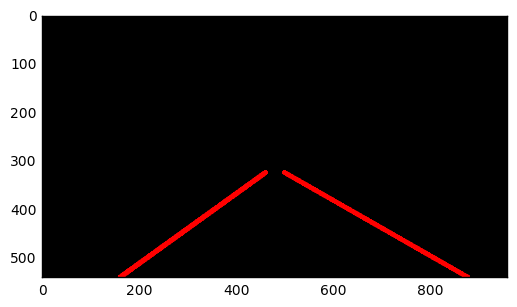

 98%|███████████████████████████████████████████████████████████████████████████████▍ | 669/682 [06:41<00:07,  1.83it/s]

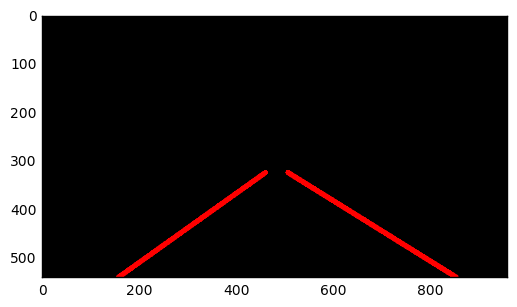

 98%|███████████████████████████████████████████████████████████████████████████████▌ | 670/682 [06:41<00:06,  1.78it/s]

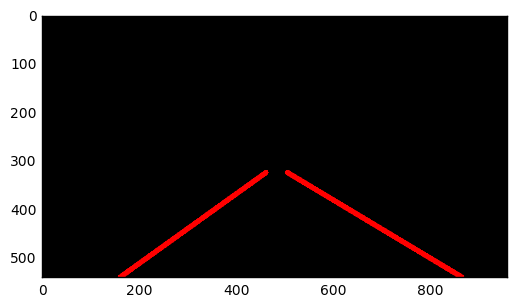

 98%|███████████████████████████████████████████████████████████████████████████████▋ | 671/682 [06:42<00:07,  1.56it/s]

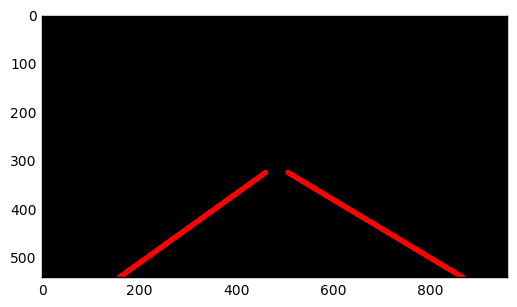

 99%|███████████████████████████████████████████████████████████████████████████████▊ | 672/682 [06:43<00:06,  1.65it/s]

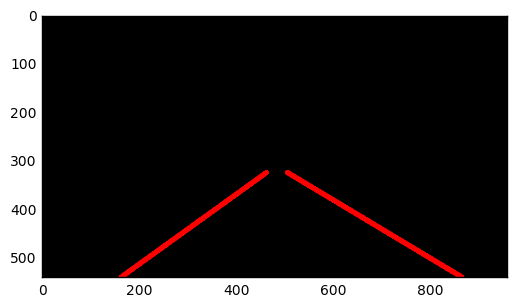

 99%|███████████████████████████████████████████████████████████████████████████████▉ | 673/682 [06:43<00:05,  1.73it/s]

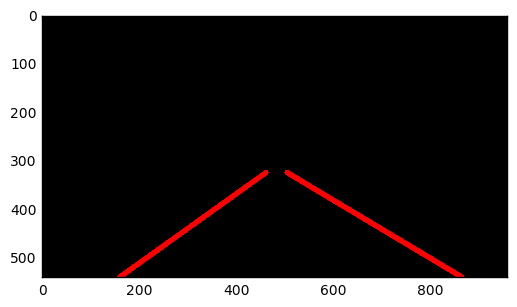

 99%|████████████████████████████████████████████████████████████████████████████████ | 674/682 [06:44<00:04,  1.80it/s]

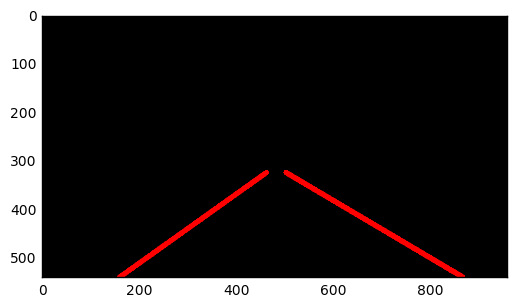

 99%|████████████████████████████████████████████████████████████████████████████████▏| 675/682 [06:44<00:03,  1.84it/s]

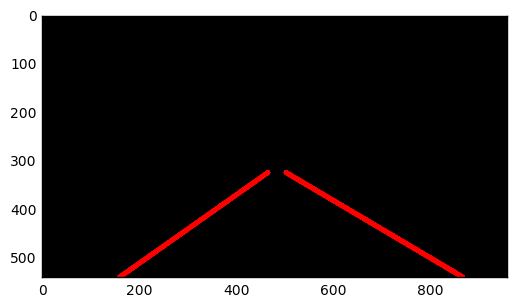

 99%|████████████████████████████████████████████████████████████████████████████████▎| 676/682 [06:45<00:03,  1.86it/s]

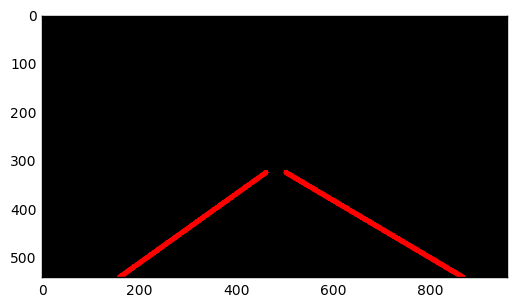

 99%|████████████████████████████████████████████████████████████████████████████████▍| 677/682 [06:45<00:02,  1.86it/s]

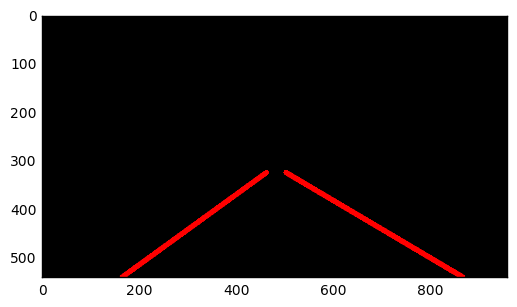

 99%|████████████████████████████████████████████████████████████████████████████████▌| 678/682 [06:46<00:02,  1.88it/s]

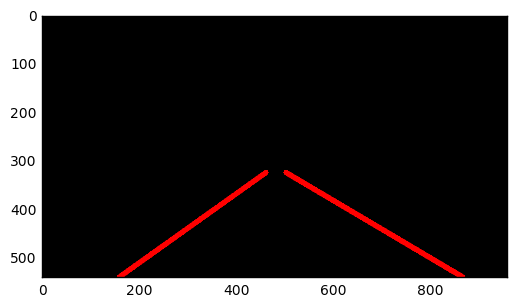

100%|████████████████████████████████████████████████████████████████████████████████▋| 679/682 [06:46<00:01,  1.84it/s]

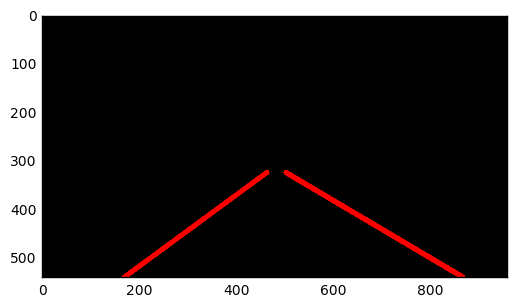

100%|████████████████████████████████████████████████████████████████████████████████▊| 680/682 [06:47<00:01,  1.90it/s]

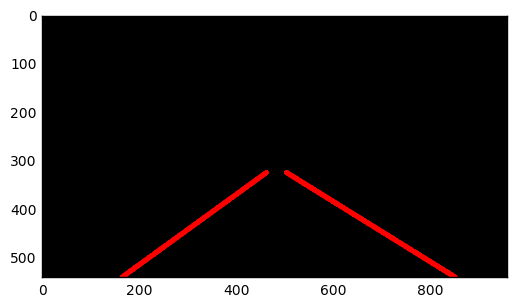

100%|████████████████████████████████████████████████████████████████████████████████▉| 681/682 [06:47<00:00,  1.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: yellow.mp4 

Wall time: 6min 49s


In [16]:
yellow_output = 'yellow.mp4'
clip2 = VideoFileClip('solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Reflections

Congratulations on finding the lane lines!  As the final step in this project, we would like you to share your thoughts on your lane finding pipeline... specifically, how could you imagine making your algorithm better / more robust?  Where will your current algorithm be likely to fail?

Please add your thoughts below,  and if you're up for making your pipeline more robust, be sure to scroll down and check out the optional challenge video below!


## Submission

If you're satisfied with your video outputs it's time to submit!  Submit this ipython notebook for review.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

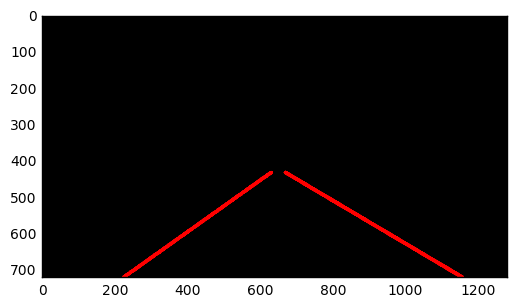

[MoviePy] >>>> Building video extra.mp4
[MoviePy] Writing video extra.mp4


  0%|                                                                                           | 0/251 [00:00<?, ?it/s]

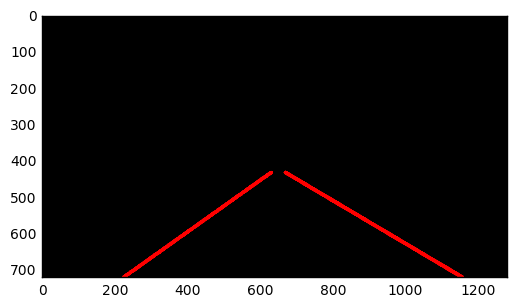

  0%|▎                                                                                  | 1/251 [00:00<02:41,  1.55it/s]

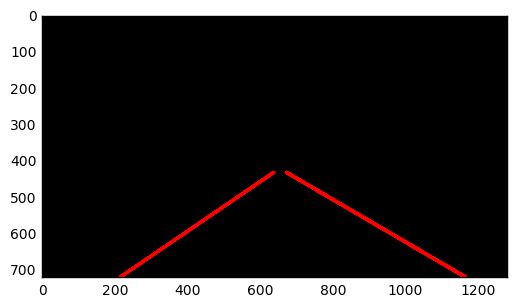

  1%|▋                                                                                  | 2/251 [00:01<02:42,  1.53it/s]

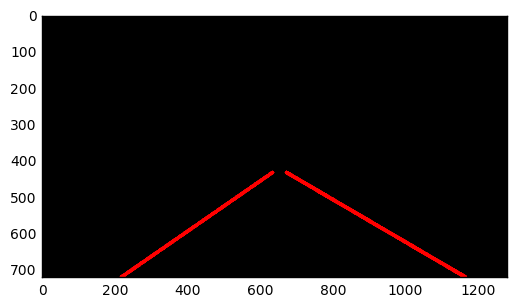

  1%|▉                                                                                  | 3/251 [00:02<02:48,  1.47it/s]

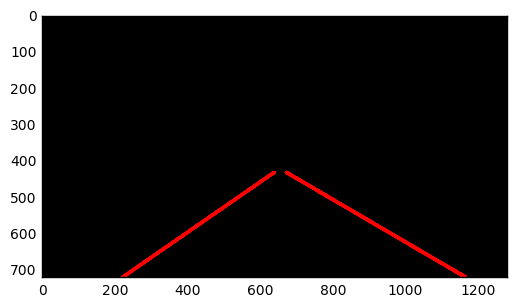

  2%|█▎                                                                                 | 4/251 [00:02<02:47,  1.48it/s]

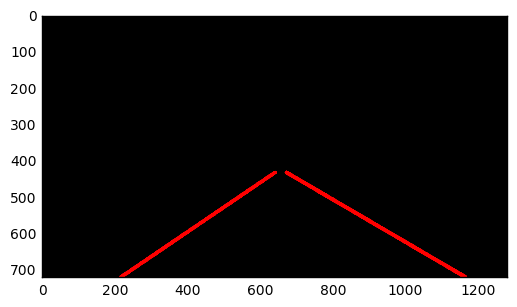

  2%|█▋                                                                                 | 5/251 [00:03<02:45,  1.48it/s]

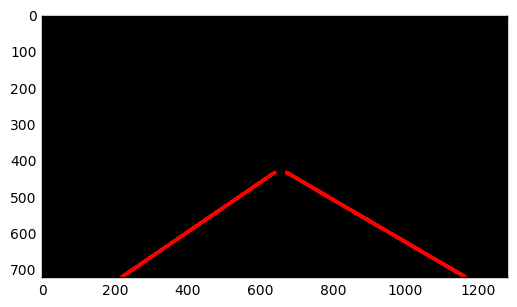

  2%|█▉                                                                                 | 6/251 [00:04<02:46,  1.47it/s]

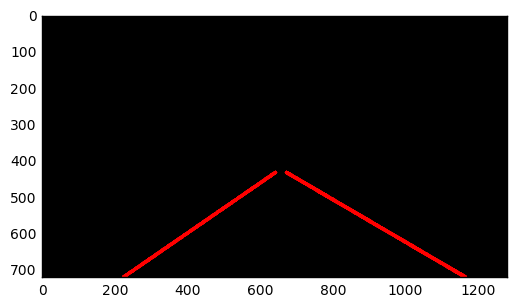

  3%|██▎                                                                                | 7/251 [00:04<02:47,  1.46it/s]

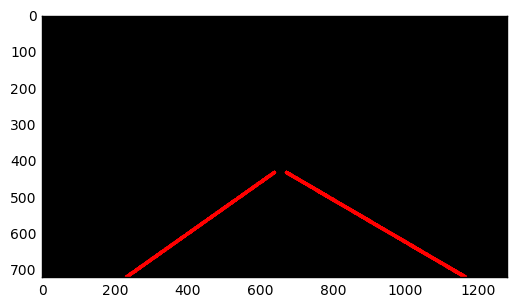

  3%|██▋                                                                                | 8/251 [00:05<02:51,  1.42it/s]

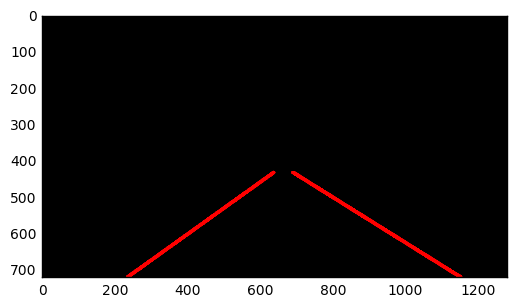

  4%|██▉                                                                                | 9/251 [00:06<02:50,  1.42it/s]

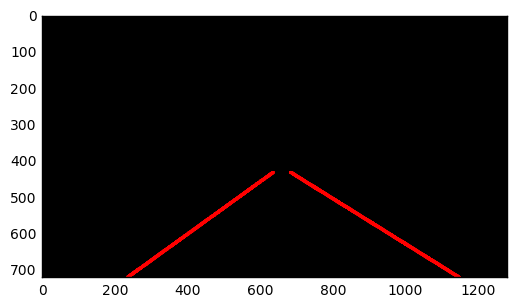

  4%|███▎                                                                              | 10/251 [00:06<02:46,  1.45it/s]

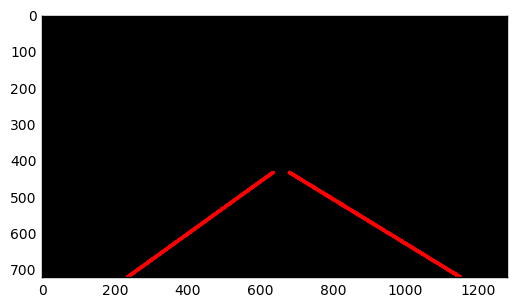

  4%|███▌                                                                              | 11/251 [00:07<03:00,  1.33it/s]

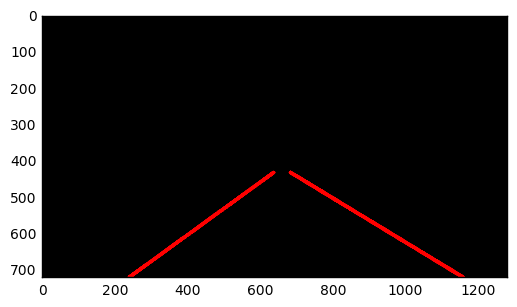

  5%|███▉                                                                              | 12/251 [00:08<02:56,  1.35it/s]

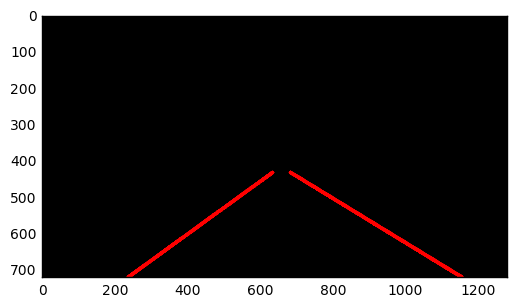

  5%|████▏                                                                             | 13/251 [00:09<02:53,  1.37it/s]

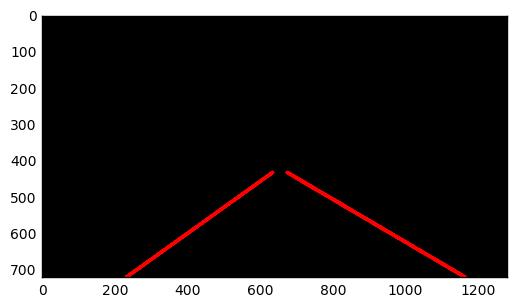

  6%|████▌                                                                             | 14/251 [00:09<02:51,  1.38it/s]

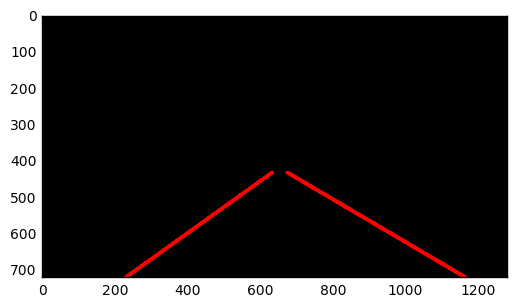

  6%|████▉                                                                             | 15/251 [00:10<02:57,  1.33it/s]

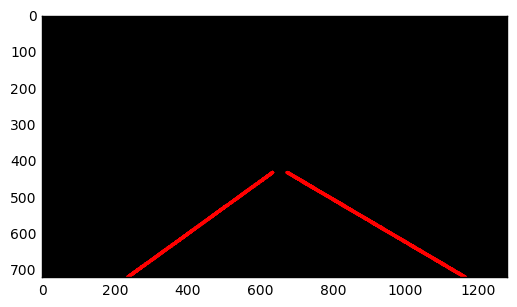

  6%|█████▏                                                                            | 16/251 [00:11<03:05,  1.27it/s]

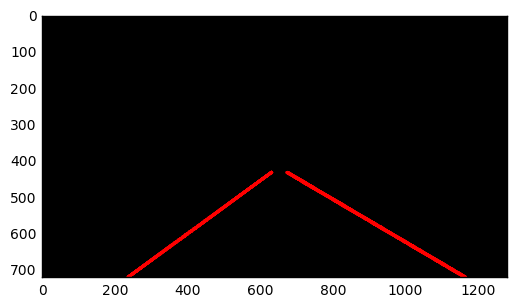

  7%|█████▌                                                                            | 17/251 [00:12<03:04,  1.27it/s]

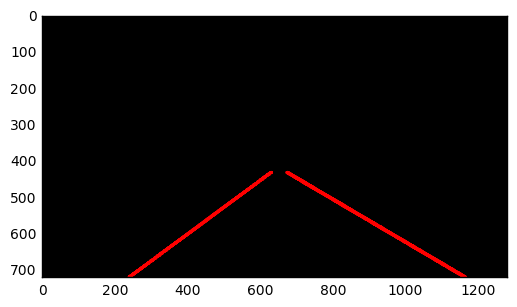

  7%|█████▉                                                                            | 18/251 [00:13<02:57,  1.31it/s]

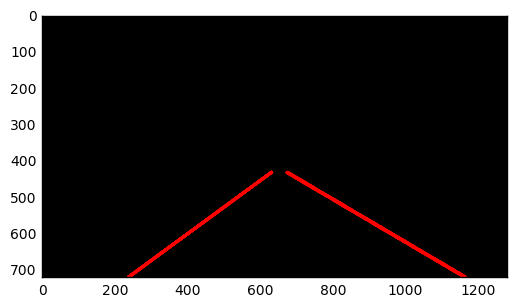

  8%|██████▏                                                                           | 19/251 [00:13<02:56,  1.31it/s]

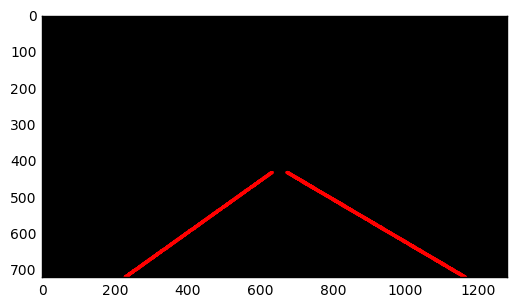

  8%|██████▌                                                                           | 20/251 [00:14<03:11,  1.20it/s]

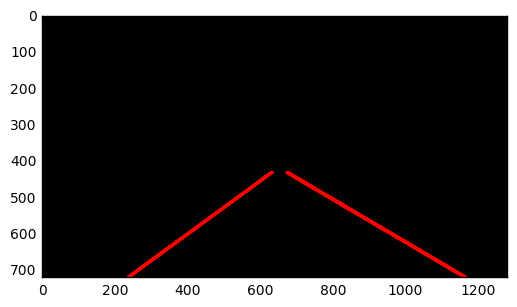

  8%|██████▊                                                                           | 21/251 [00:15<03:19,  1.15it/s]

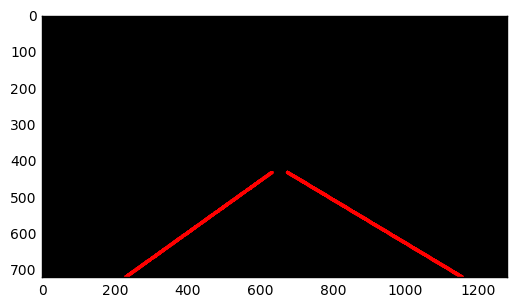

  9%|███████▏                                                                          | 22/251 [00:16<03:26,  1.11it/s]

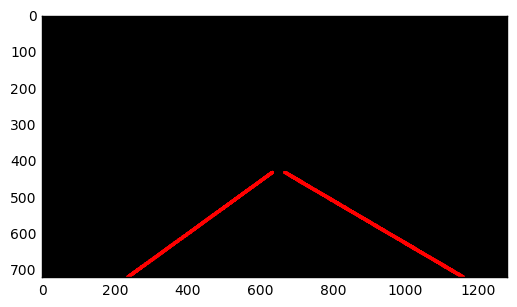

  9%|███████▌                                                                          | 23/251 [00:17<03:18,  1.15it/s]

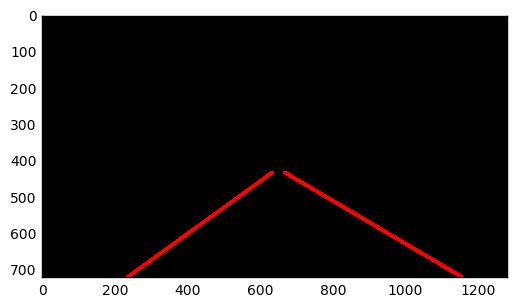

 10%|███████▊                                                                          | 24/251 [00:18<03:12,  1.18it/s]

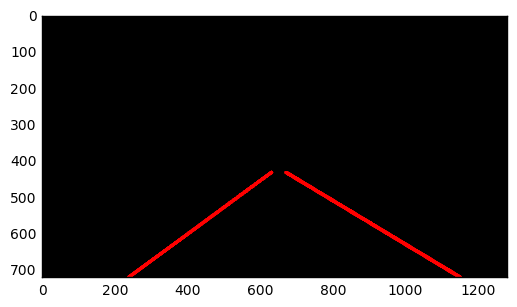

 10%|████████▏                                                                         | 25/251 [00:19<03:10,  1.19it/s]

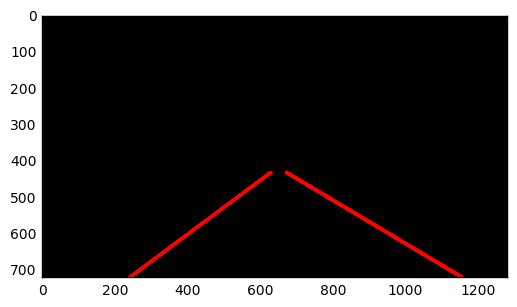

 10%|████████▍                                                                         | 26/251 [00:20<03:07,  1.20it/s]

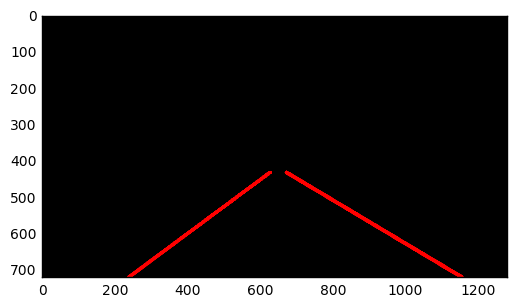

 11%|████████▊                                                                         | 27/251 [00:20<03:02,  1.23it/s]

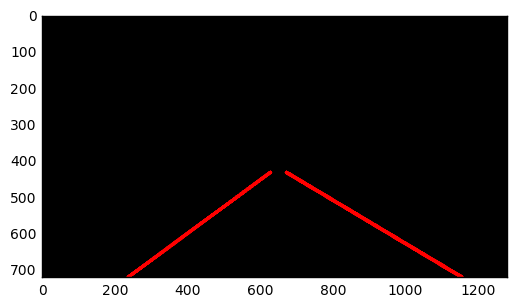

 11%|█████████▏                                                                        | 28/251 [00:21<03:05,  1.20it/s]

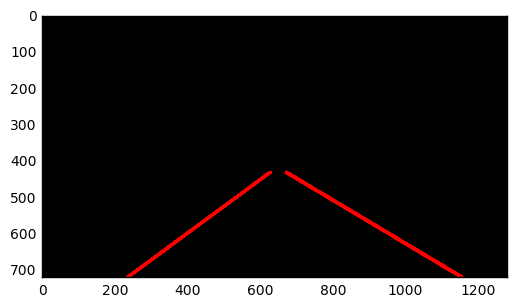

 12%|█████████▍                                                                        | 29/251 [00:23<03:45,  1.02s/it]

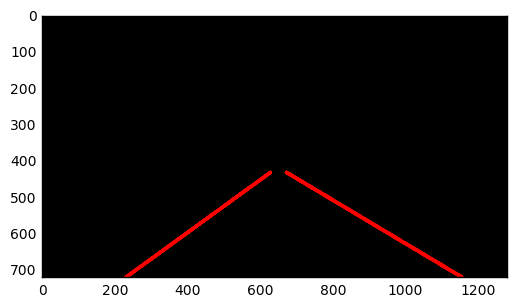

 12%|█████████▊                                                                        | 30/251 [00:24<04:06,  1.12s/it]

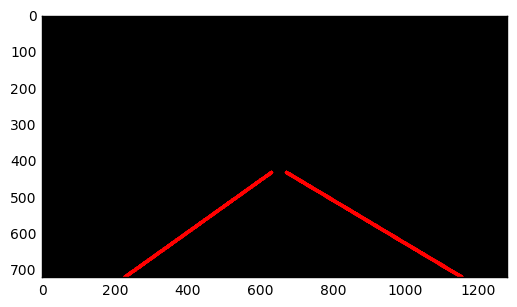

 12%|██████████▏                                                                       | 31/251 [00:25<04:03,  1.11s/it]

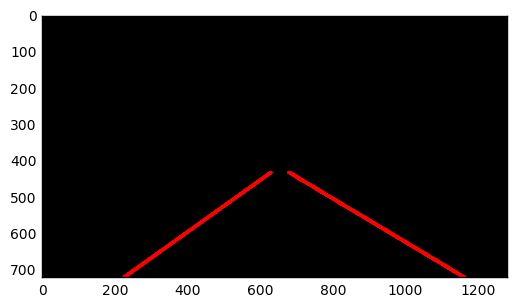

 13%|██████████▍                                                                       | 32/251 [00:26<03:36,  1.01it/s]

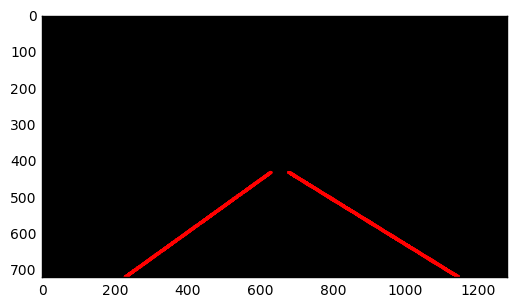

 13%|██████████▊                                                                       | 33/251 [00:27<03:29,  1.04it/s]

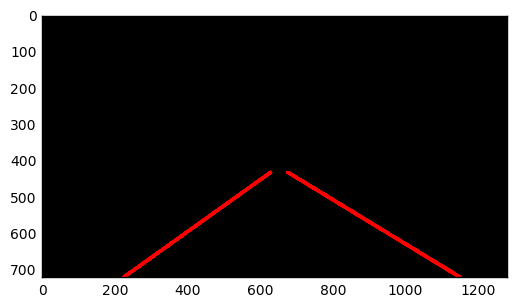

 14%|███████████                                                                       | 34/251 [00:27<03:12,  1.13it/s]

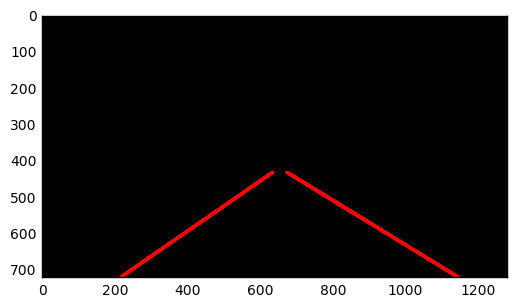

 14%|███████████▍                                                                      | 35/251 [00:28<03:06,  1.16it/s]

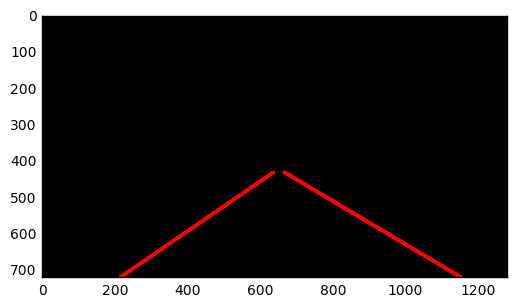

 14%|███████████▊                                                                      | 36/251 [00:29<03:06,  1.16it/s]

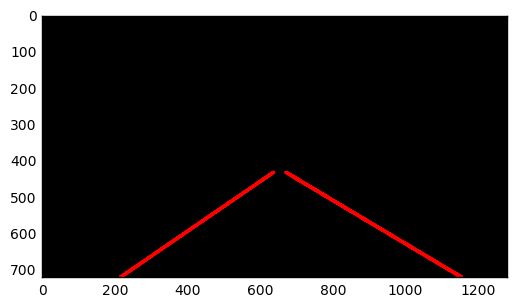

 15%|████████████                                                                      | 37/251 [00:30<02:59,  1.19it/s]

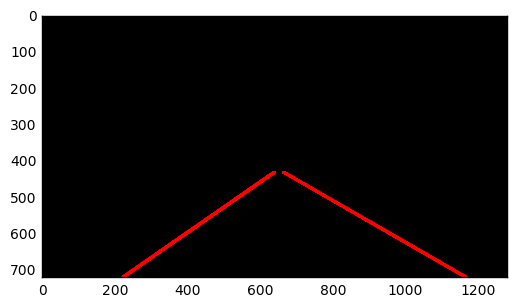

 15%|████████████▍                                                                     | 38/251 [00:31<03:02,  1.17it/s]

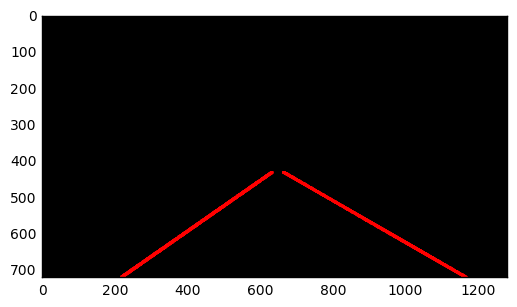

 16%|████████████▋                                                                     | 39/251 [00:32<03:13,  1.10it/s]

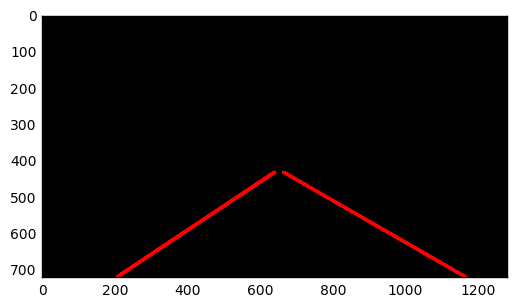

 16%|█████████████                                                                     | 40/251 [00:33<04:02,  1.15s/it]

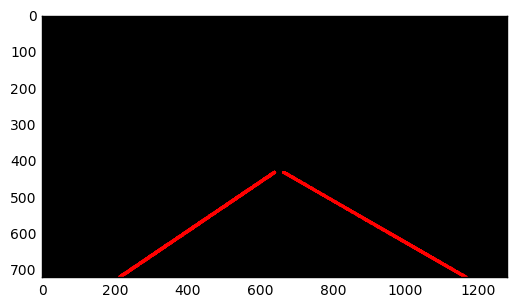

 16%|█████████████▍                                                                    | 41/251 [00:34<03:48,  1.09s/it]

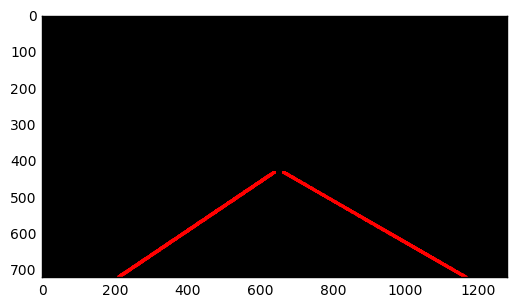

 17%|█████████████▋                                                                    | 42/251 [00:35<03:46,  1.08s/it]

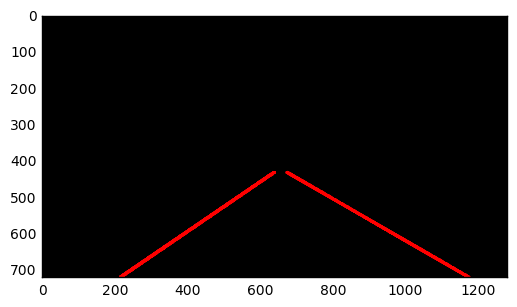

 17%|██████████████                                                                    | 43/251 [00:38<04:55,  1.42s/it]

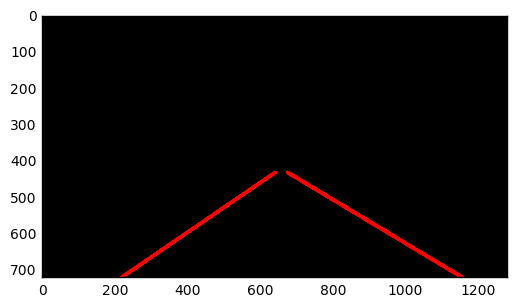

 18%|██████████████▎                                                                   | 44/251 [00:39<05:10,  1.50s/it]

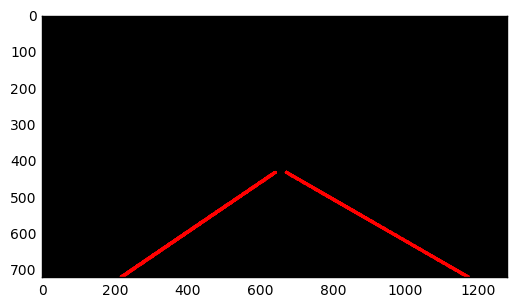

 18%|██████████████▋                                                                   | 45/251 [00:40<04:31,  1.32s/it]

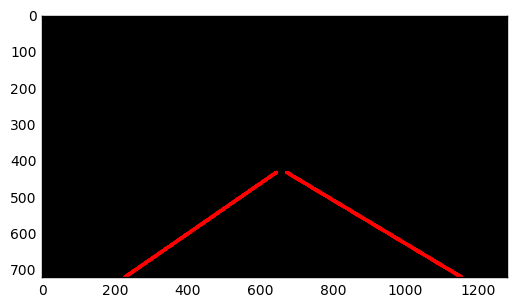

 18%|███████████████                                                                   | 46/251 [00:41<03:53,  1.14s/it]

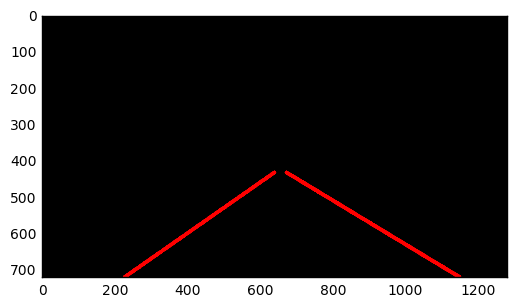

 19%|███████████████▎                                                                  | 47/251 [00:42<03:24,  1.00s/it]

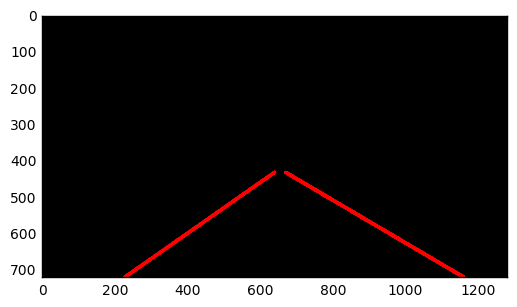

 19%|███████████████▋                                                                  | 48/251 [00:42<03:06,  1.09it/s]

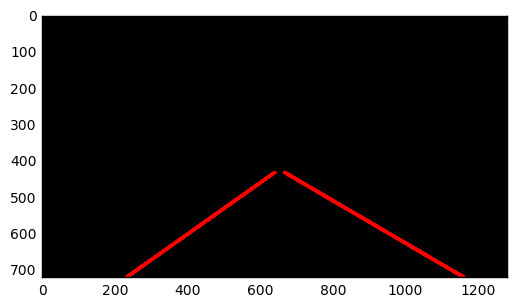

 20%|████████████████                                                                  | 49/251 [00:43<02:53,  1.17it/s]

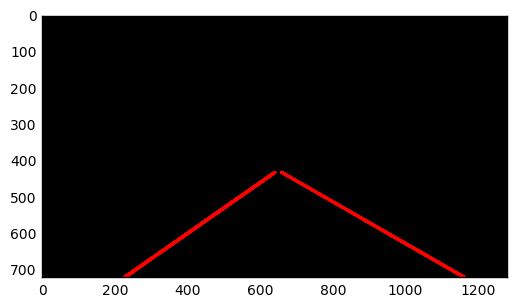

 20%|████████████████▎                                                                 | 50/251 [00:44<02:48,  1.19it/s]

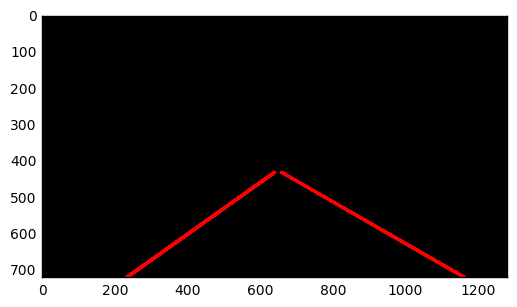

 20%|████████████████▋                                                                 | 51/251 [00:45<02:40,  1.24it/s]

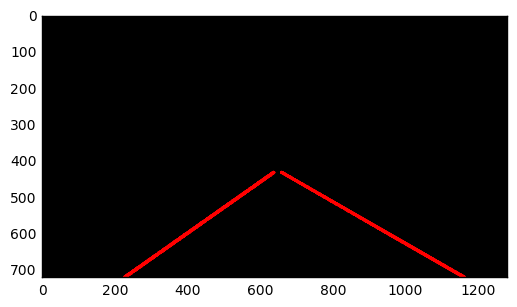

 21%|████████████████▉                                                                 | 52/251 [00:46<02:59,  1.11it/s]

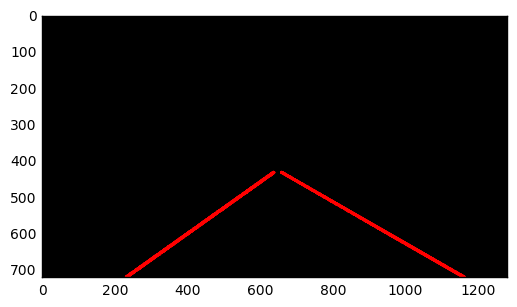

 21%|█████████████████▎                                                                | 53/251 [00:47<02:52,  1.15it/s]

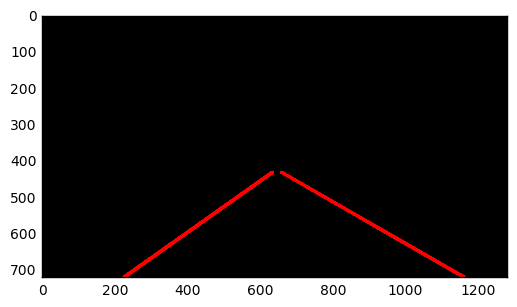

 22%|█████████████████▋                                                                | 54/251 [00:47<02:47,  1.18it/s]

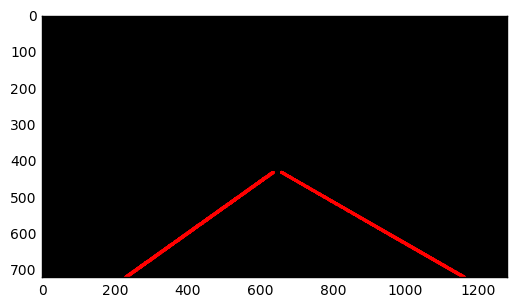

 22%|█████████████████▉                                                                | 55/251 [00:49<03:29,  1.07s/it]

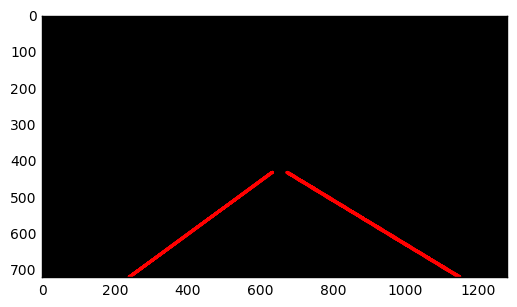

 22%|██████████████████▎                                                               | 56/251 [00:50<03:09,  1.03it/s]

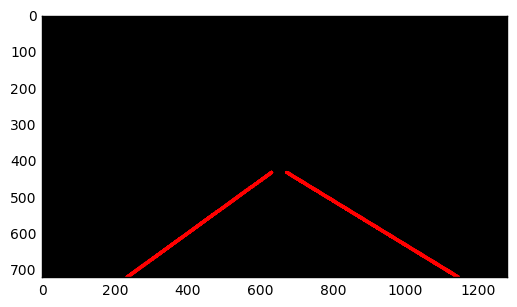

 23%|██████████████████▌                                                               | 57/251 [00:50<02:57,  1.09it/s]

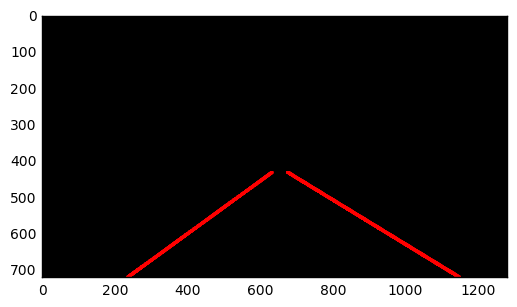

 23%|██████████████████▉                                                               | 58/251 [00:51<02:57,  1.09it/s]

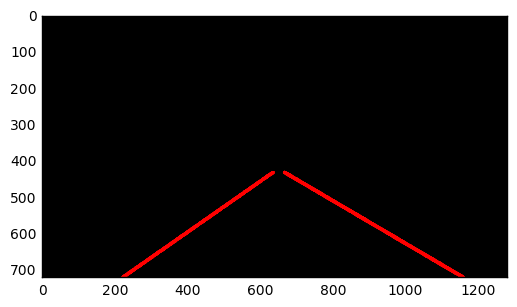

 24%|███████████████████▎                                                              | 59/251 [00:52<03:00,  1.07it/s]

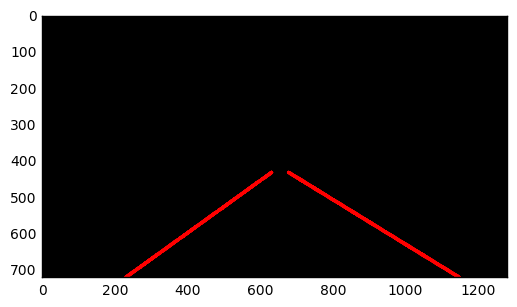

 24%|███████████████████▌                                                              | 60/251 [00:53<02:48,  1.13it/s]

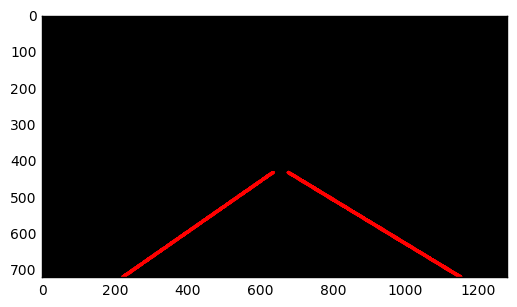

 24%|███████████████████▉                                                              | 61/251 [00:54<02:40,  1.18it/s]

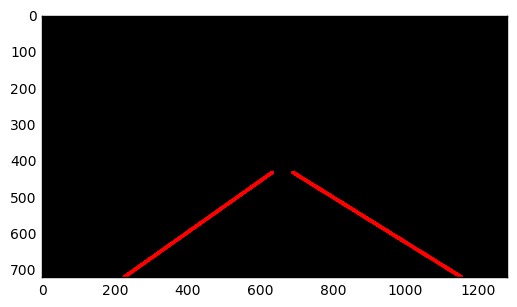

 25%|████████████████████▎                                                             | 62/251 [00:55<02:32,  1.24it/s]

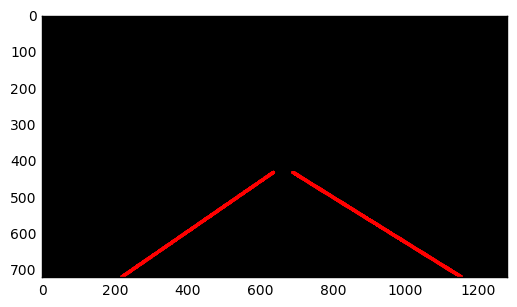

 25%|████████████████████▌                                                             | 63/251 [00:55<02:28,  1.27it/s]

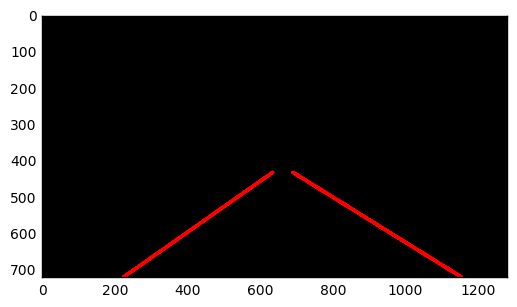

 25%|████████████████████▉                                                             | 64/251 [00:56<02:23,  1.30it/s]

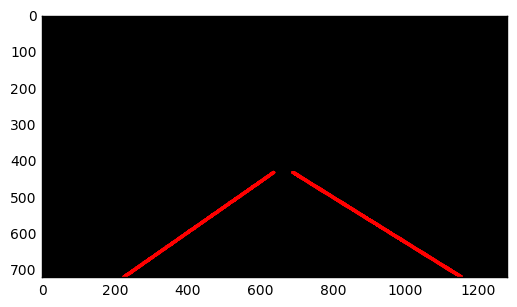

 26%|█████████████████████▏                                                            | 65/251 [00:57<02:17,  1.35it/s]

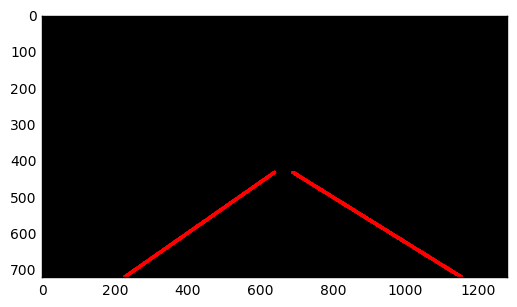

 26%|█████████████████████▌                                                            | 66/251 [00:58<02:29,  1.24it/s]

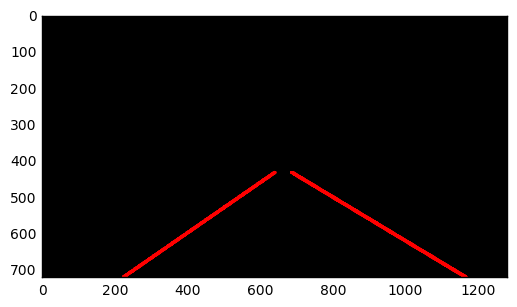

 27%|█████████████████████▉                                                            | 67/251 [00:58<02:23,  1.29it/s]

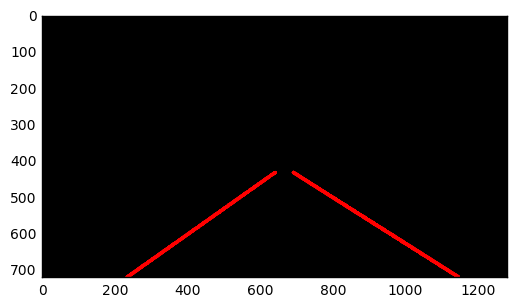

 27%|██████████████████████▏                                                           | 68/251 [00:59<02:22,  1.28it/s]

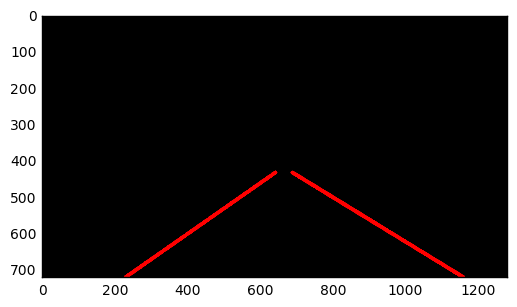

 27%|██████████████████████▌                                                           | 69/251 [01:00<02:22,  1.28it/s]

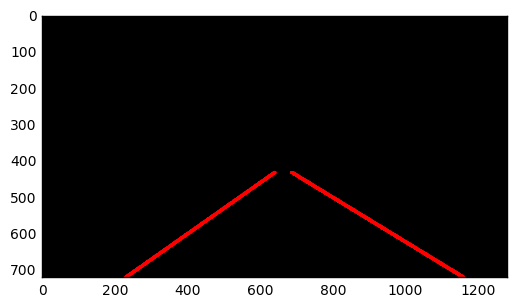

 28%|██████████████████████▊                                                           | 70/251 [01:01<02:17,  1.32it/s]

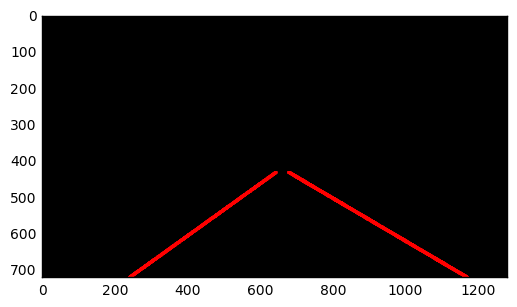

 28%|███████████████████████▏                                                          | 71/251 [01:01<02:17,  1.31it/s]

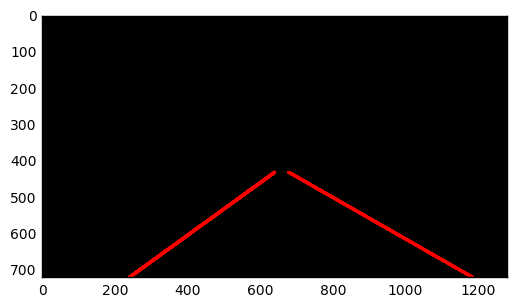

 29%|███████████████████████▌                                                          | 72/251 [01:02<02:12,  1.35it/s]

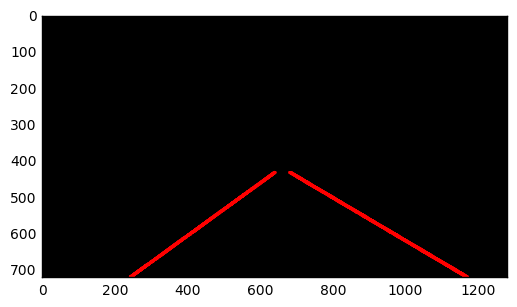

 29%|███████████████████████▊                                                          | 73/251 [01:03<02:10,  1.36it/s]

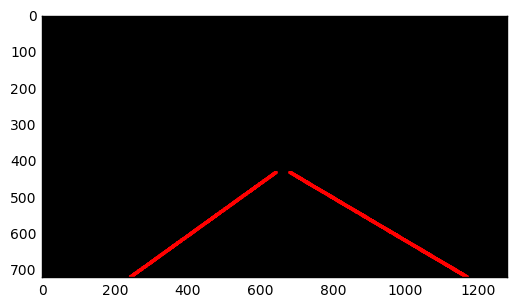

 29%|████████████████████████▏                                                         | 74/251 [01:04<02:07,  1.38it/s]

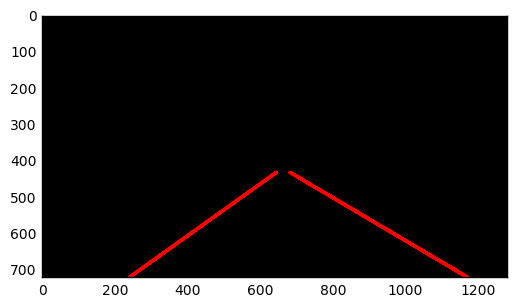

 30%|████████████████████████▌                                                         | 75/251 [01:04<02:08,  1.37it/s]

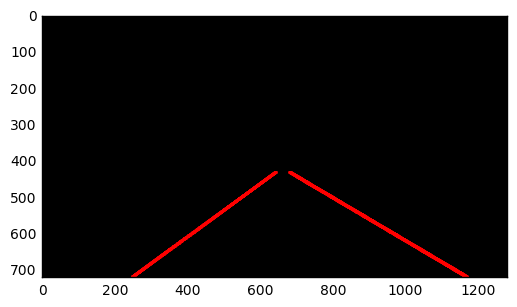

 30%|████████████████████████▊                                                         | 76/251 [01:05<02:08,  1.36it/s]

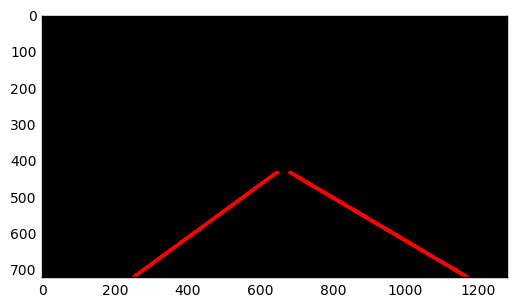

 31%|█████████████████████████▏                                                        | 77/251 [01:06<02:17,  1.26it/s]

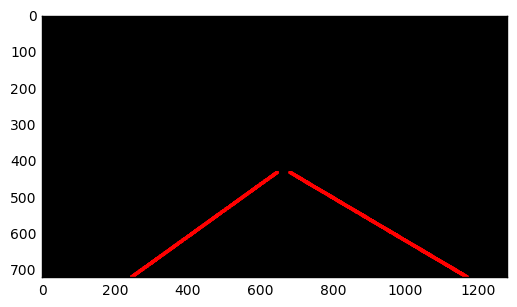

 31%|█████████████████████████▍                                                        | 78/251 [01:07<02:12,  1.31it/s]

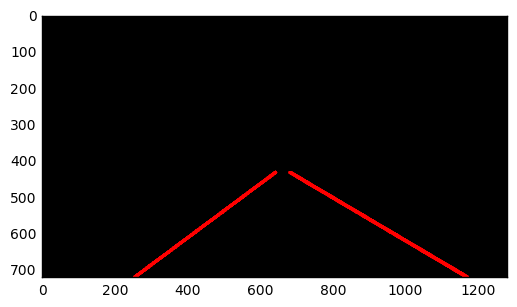

 31%|█████████████████████████▊                                                        | 79/251 [01:07<02:10,  1.32it/s]

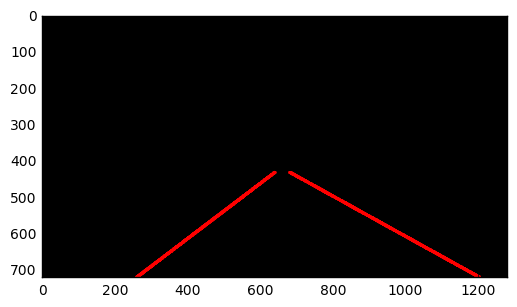

 32%|██████████████████████████▏                                                       | 80/251 [01:08<02:07,  1.34it/s]

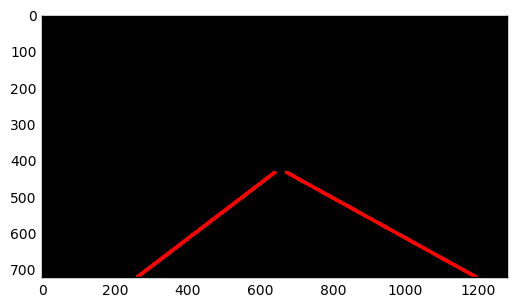

 32%|██████████████████████████▍                                                       | 81/251 [01:09<02:06,  1.34it/s]

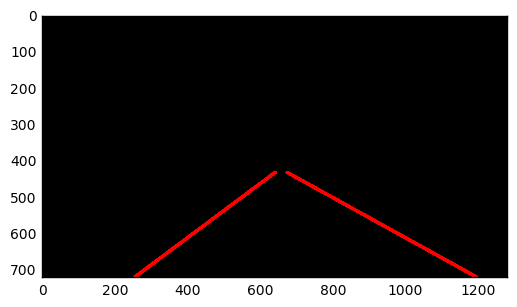

 33%|██████████████████████████▊                                                       | 82/251 [01:10<02:06,  1.34it/s]

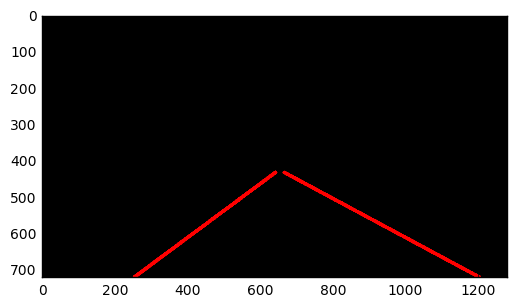

 33%|███████████████████████████                                                       | 83/251 [01:10<02:06,  1.33it/s]

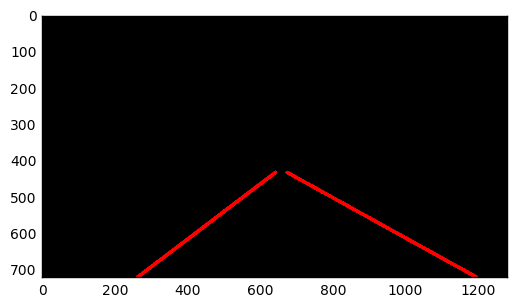

 33%|███████████████████████████▍                                                      | 84/251 [01:11<02:07,  1.31it/s]

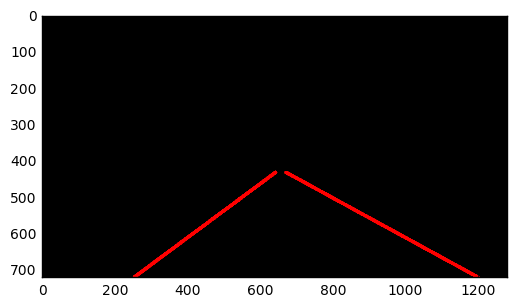

 34%|███████████████████████████▊                                                      | 85/251 [01:12<02:12,  1.25it/s]

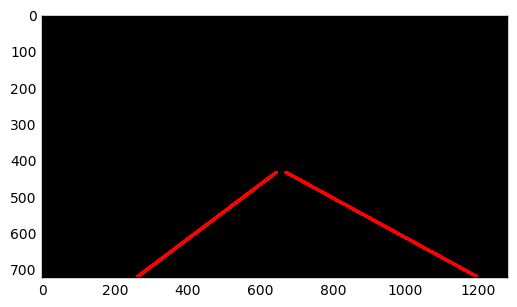

 34%|████████████████████████████                                                      | 86/251 [01:13<02:06,  1.31it/s]

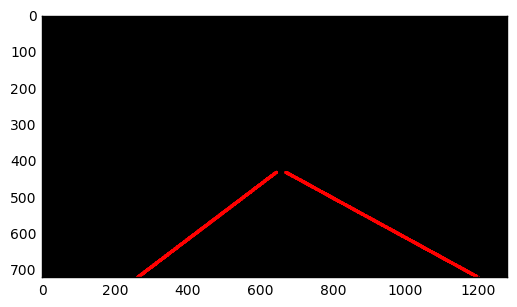

 35%|████████████████████████████▍                                                     | 87/251 [01:14<02:05,  1.30it/s]

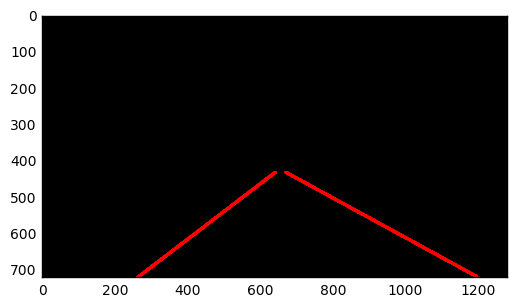

 35%|████████████████████████████▋                                                     | 88/251 [01:15<02:19,  1.17it/s]

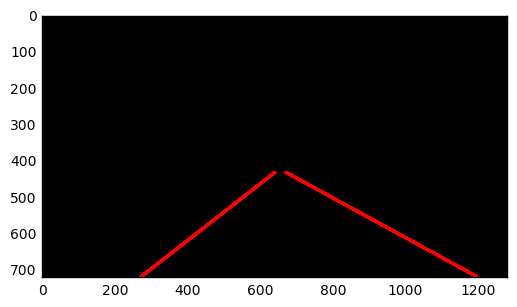

 35%|█████████████████████████████                                                     | 89/251 [01:15<02:14,  1.20it/s]

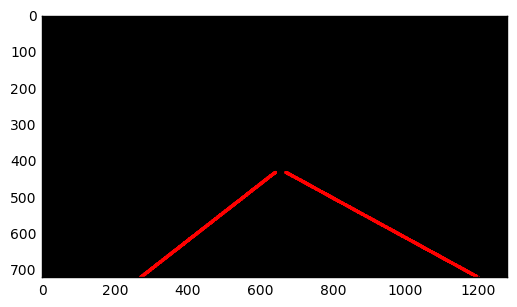

 36%|█████████████████████████████▍                                                    | 90/251 [01:16<02:07,  1.26it/s]

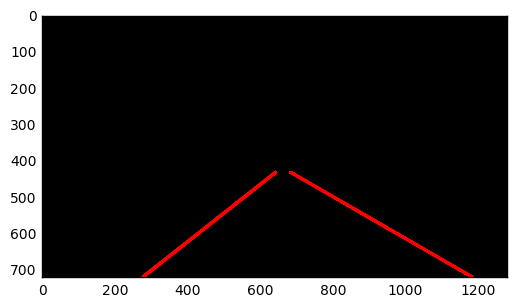

 36%|█████████████████████████████▋                                                    | 91/251 [01:17<02:01,  1.31it/s]

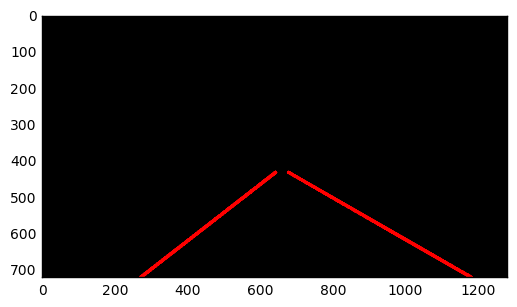

 37%|██████████████████████████████                                                    | 92/251 [01:18<02:00,  1.32it/s]

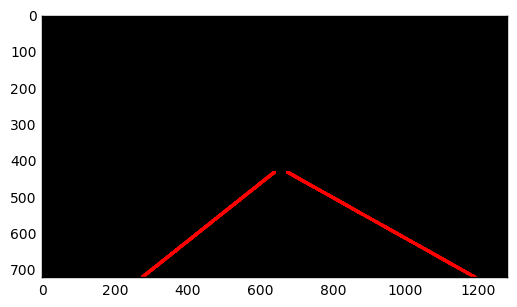

 37%|██████████████████████████████▍                                                   | 93/251 [01:18<02:00,  1.31it/s]

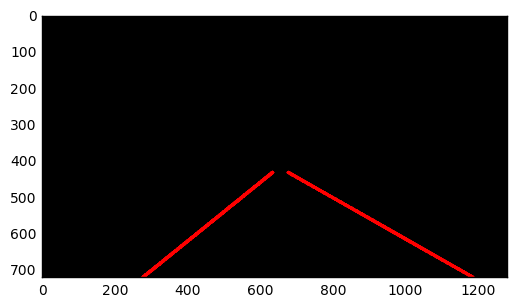

 37%|██████████████████████████████▋                                                   | 94/251 [01:19<02:02,  1.29it/s]

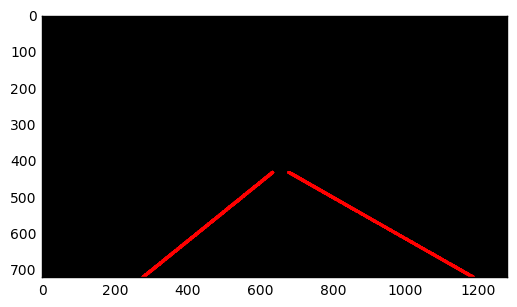

 38%|███████████████████████████████                                                   | 95/251 [01:20<02:00,  1.29it/s]

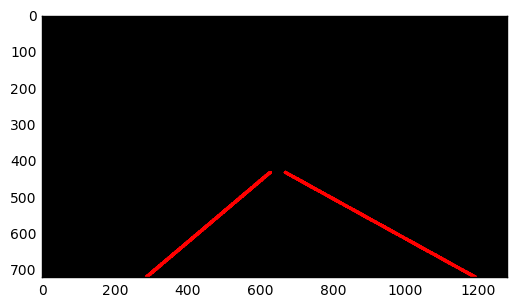

 38%|███████████████████████████████▎                                                  | 96/251 [01:21<01:57,  1.32it/s]

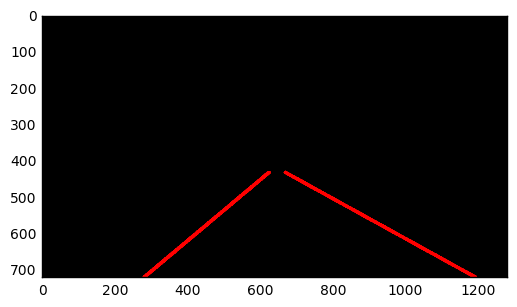

 39%|███████████████████████████████▋                                                  | 97/251 [01:21<01:54,  1.35it/s]

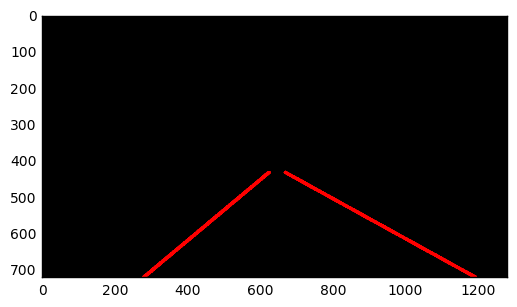

 39%|████████████████████████████████                                                  | 98/251 [01:22<01:52,  1.36it/s]

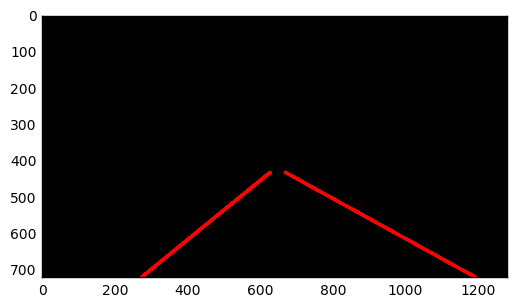

 39%|████████████████████████████████▎                                                 | 99/251 [01:23<02:00,  1.26it/s]

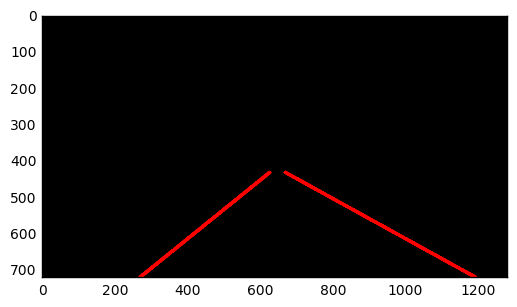

 40%|████████████████████████████████▎                                                | 100/251 [01:24<02:08,  1.18it/s]

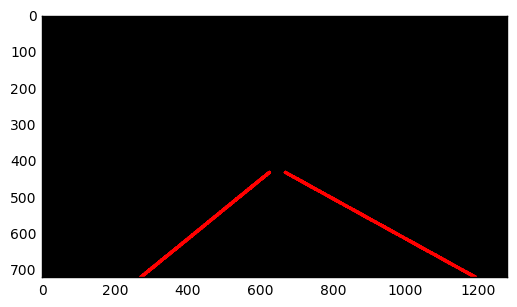

 40%|████████████████████████████████▌                                                | 101/251 [01:25<02:13,  1.12it/s]

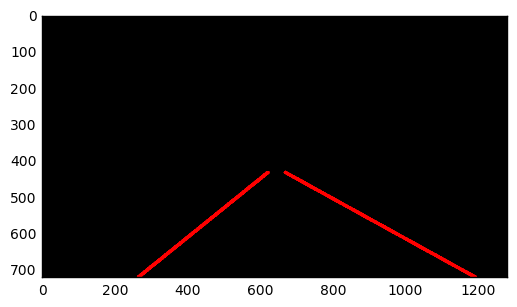

 41%|████████████████████████████████▉                                                | 102/251 [01:26<02:11,  1.14it/s]

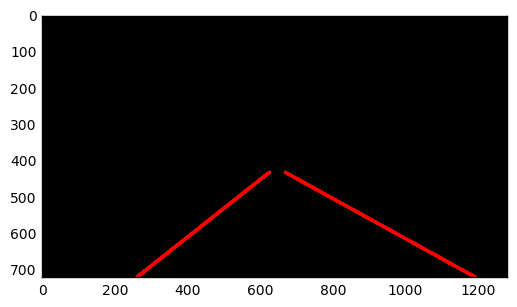

 41%|█████████████████████████████████▏                                               | 103/251 [01:27<02:10,  1.13it/s]

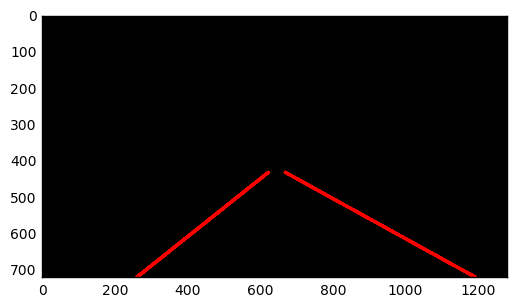

 41%|█████████████████████████████████▌                                               | 104/251 [01:28<02:09,  1.14it/s]

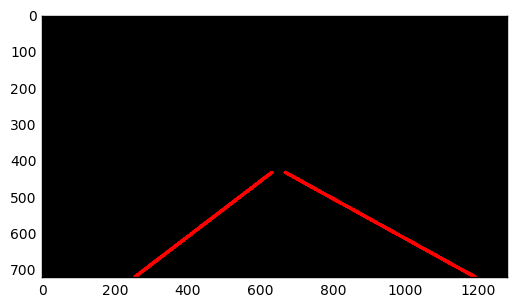

 42%|█████████████████████████████████▉                                               | 105/251 [01:28<02:05,  1.17it/s]

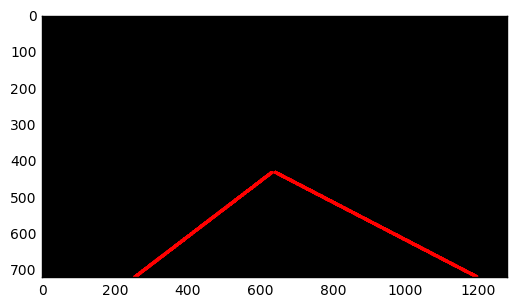

 42%|██████████████████████████████████▏                                              | 106/251 [01:29<02:04,  1.16it/s]

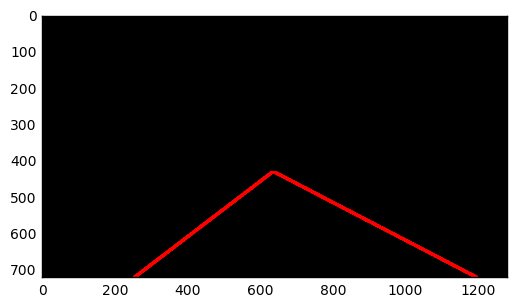

 43%|██████████████████████████████████▌                                              | 107/251 [01:30<02:09,  1.11it/s]

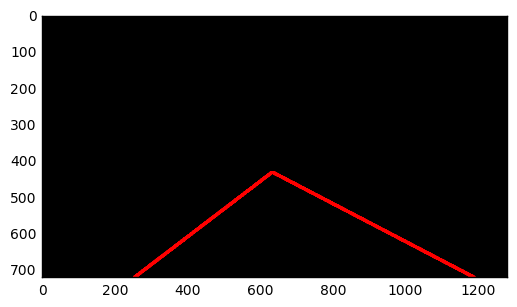

 43%|██████████████████████████████████▊                                              | 108/251 [01:31<02:03,  1.16it/s]

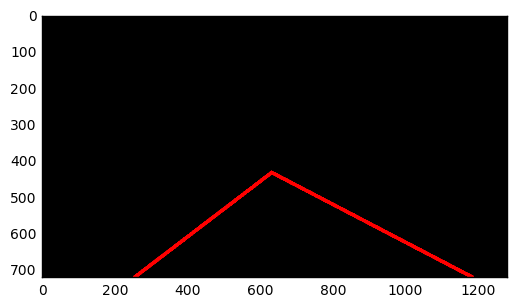

 43%|███████████████████████████████████▏                                             | 109/251 [01:32<02:05,  1.13it/s]

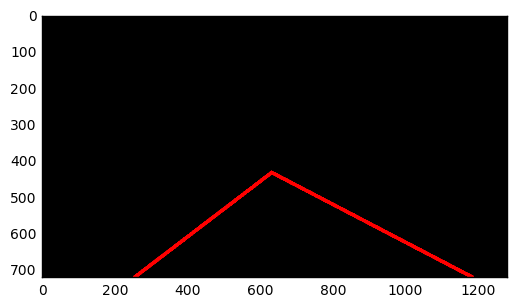

 44%|███████████████████████████████████▍                                             | 110/251 [01:33<02:21,  1.00s/it]

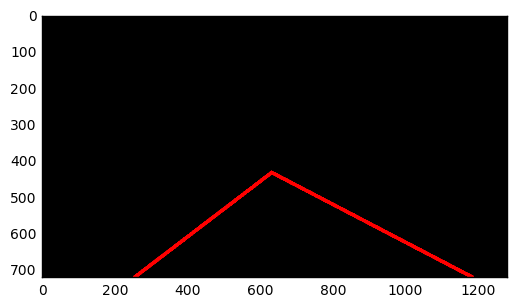

 44%|███████████████████████████████████▊                                             | 111/251 [01:34<02:16,  1.03it/s]

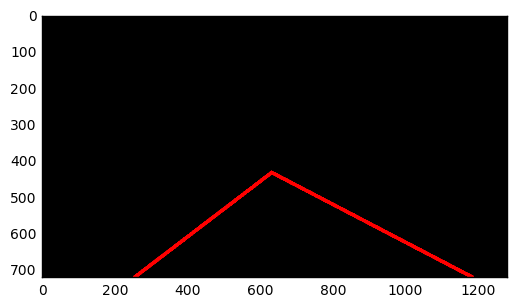

 45%|████████████████████████████████████▏                                            | 112/251 [01:35<02:10,  1.06it/s]

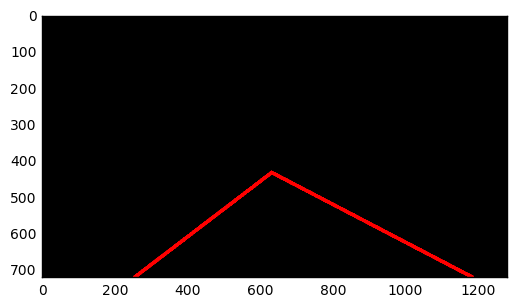

 45%|████████████████████████████████████▍                                            | 113/251 [01:36<02:01,  1.13it/s]

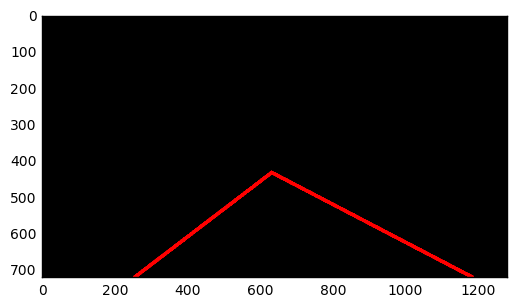

 45%|████████████████████████████████████▊                                            | 114/251 [01:36<01:53,  1.20it/s]

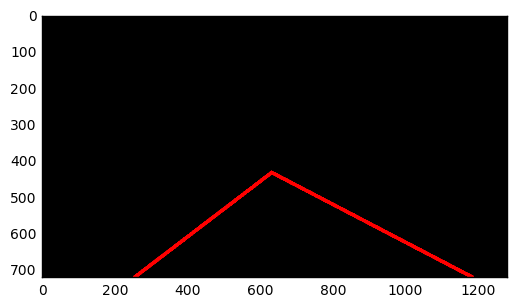

 46%|█████████████████████████████████████                                            | 115/251 [01:37<01:48,  1.25it/s]

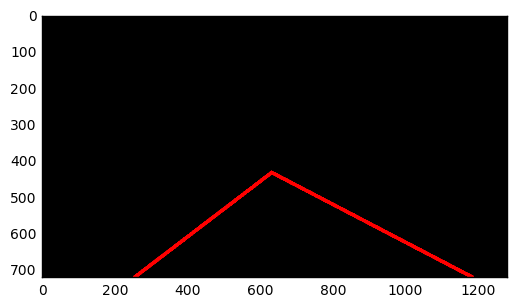

 46%|█████████████████████████████████████▍                                           | 116/251 [01:38<01:45,  1.28it/s]

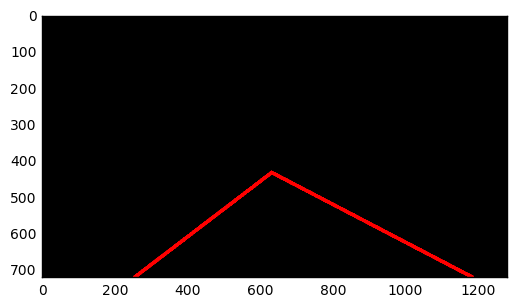

 47%|█████████████████████████████████████▊                                           | 117/251 [01:39<01:40,  1.33it/s]

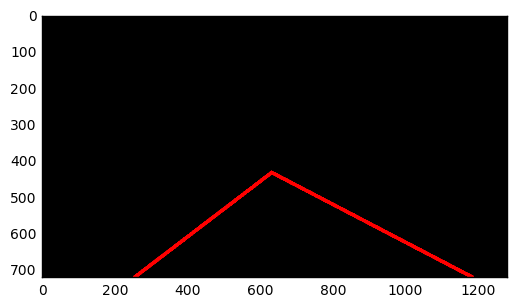

 47%|██████████████████████████████████████                                           | 118/251 [01:39<01:41,  1.31it/s]

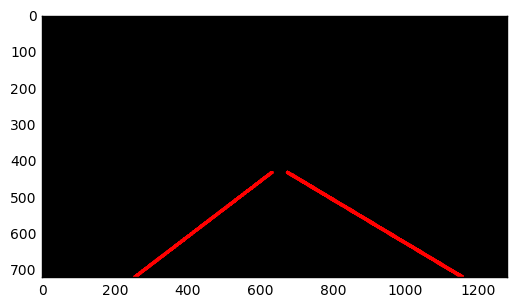

 47%|██████████████████████████████████████▍                                          | 119/251 [01:40<01:41,  1.30it/s]

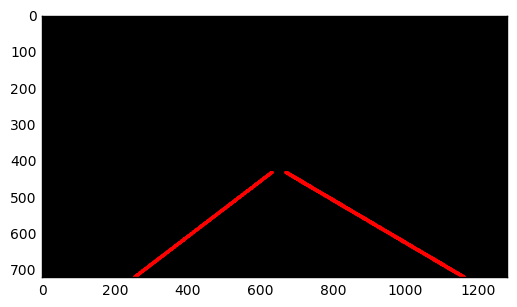

 48%|██████████████████████████████████████▋                                          | 120/251 [01:41<01:40,  1.30it/s]

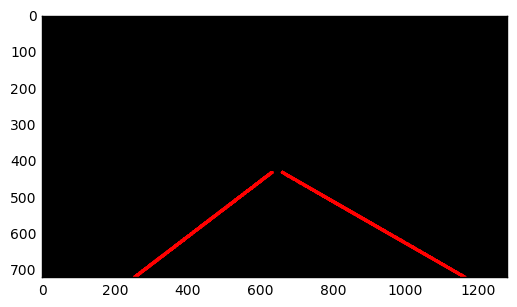

 48%|███████████████████████████████████████                                          | 121/251 [01:42<01:48,  1.20it/s]

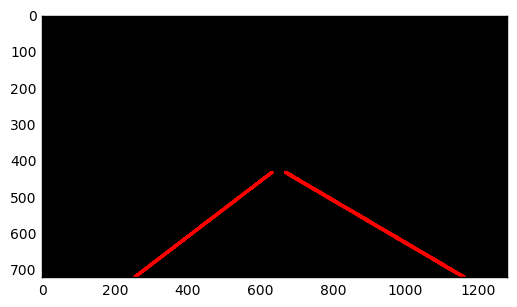

 49%|███████████████████████████████████████▎                                         | 122/251 [01:43<01:41,  1.27it/s]

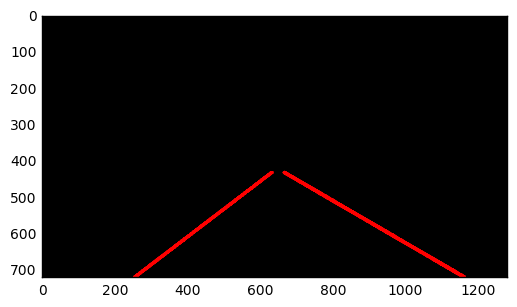

 49%|███████████████████████████████████████▋                                         | 123/251 [01:43<01:40,  1.27it/s]

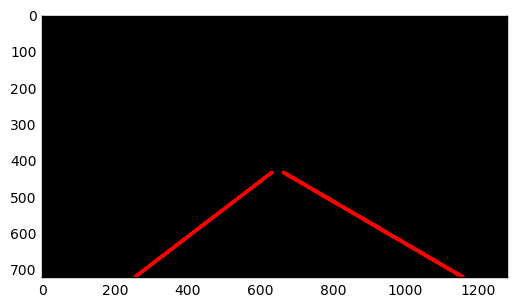

 49%|████████████████████████████████████████                                         | 124/251 [01:44<01:44,  1.22it/s]

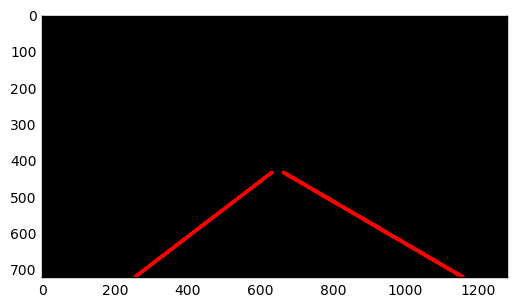

 50%|████████████████████████████████████████▎                                        | 125/251 [01:45<01:41,  1.24it/s]

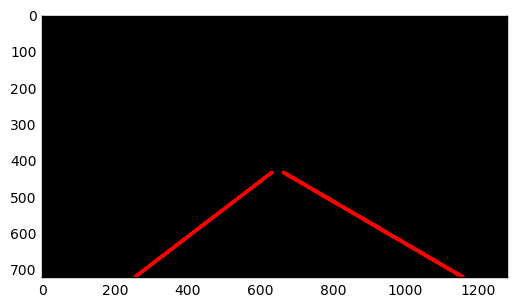

 50%|████████████████████████████████████████▋                                        | 126/251 [01:46<01:38,  1.27it/s]

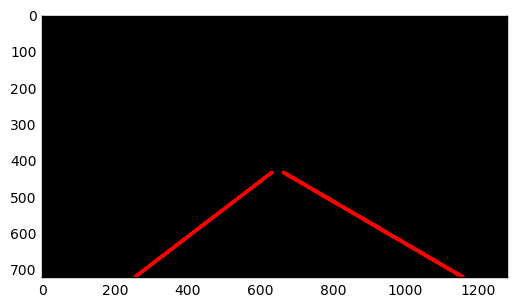

 51%|████████████████████████████████████████▉                                        | 127/251 [01:47<01:36,  1.29it/s]

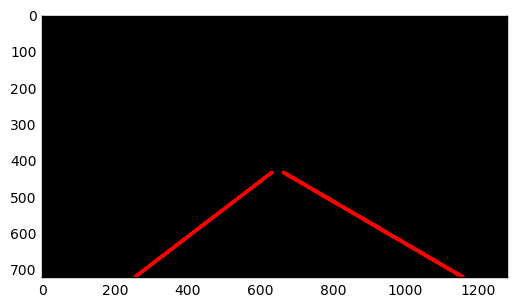

 51%|█████████████████████████████████████████▎                                       | 128/251 [01:48<01:43,  1.19it/s]

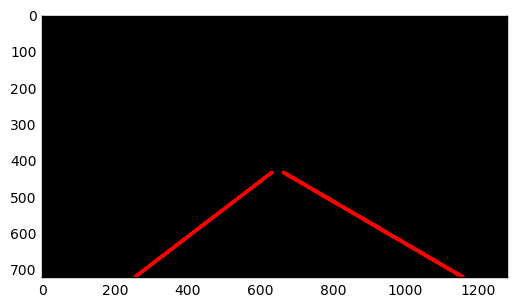

 51%|█████████████████████████████████████████▋                                       | 129/251 [01:48<01:42,  1.19it/s]

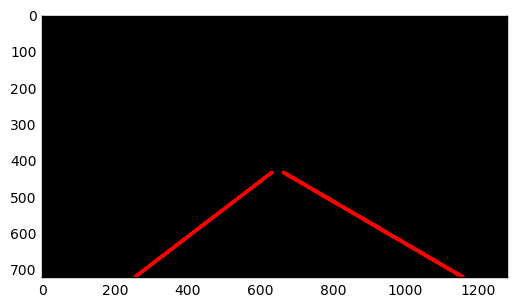

 52%|█████████████████████████████████████████▉                                       | 130/251 [01:49<01:47,  1.12it/s]

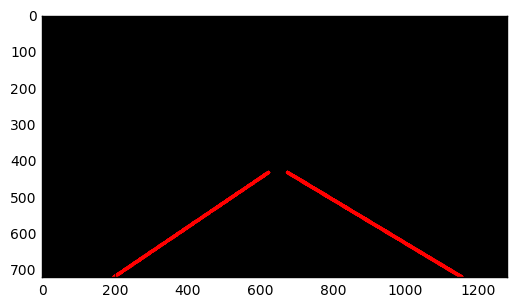

 52%|██████████████████████████████████████████▎                                      | 131/251 [01:51<02:09,  1.08s/it]

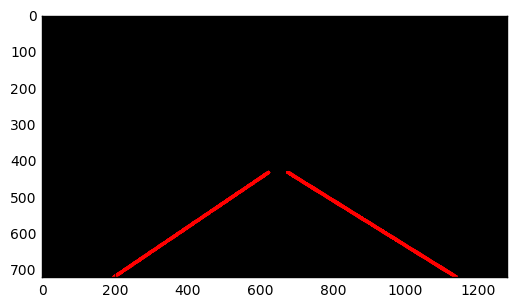

 53%|██████████████████████████████████████████▌                                      | 132/251 [01:52<02:21,  1.19s/it]

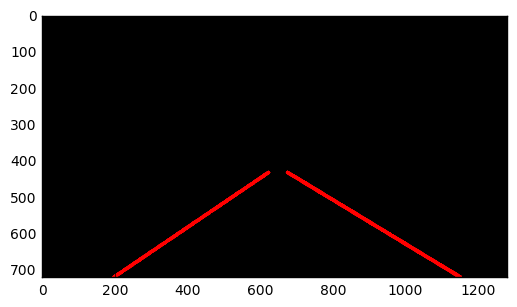

 53%|██████████████████████████████████████████▉                                      | 133/251 [01:54<02:24,  1.23s/it]

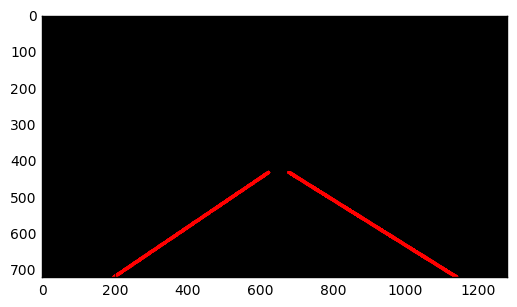

 53%|███████████████████████████████████████████▏                                     | 134/251 [01:55<02:19,  1.19s/it]

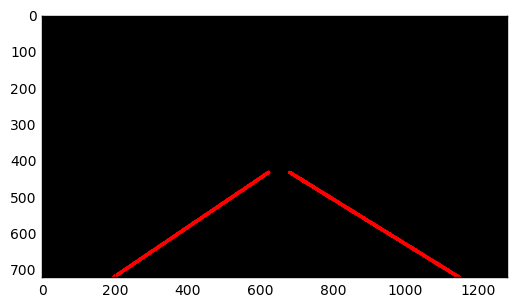

 54%|███████████████████████████████████████████▌                                     | 135/251 [01:56<02:18,  1.19s/it]

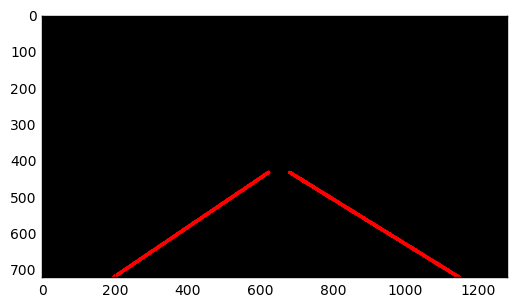

 54%|███████████████████████████████████████████▉                                     | 136/251 [01:57<02:08,  1.12s/it]

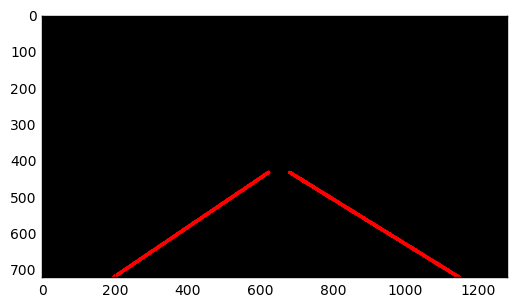

 55%|████████████████████████████████████████████▏                                    | 137/251 [01:58<02:00,  1.05s/it]

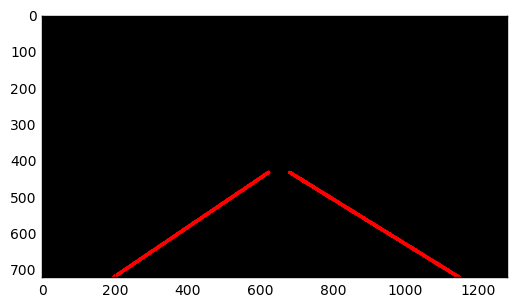

 55%|████████████████████████████████████████████▌                                    | 138/251 [01:59<02:02,  1.08s/it]

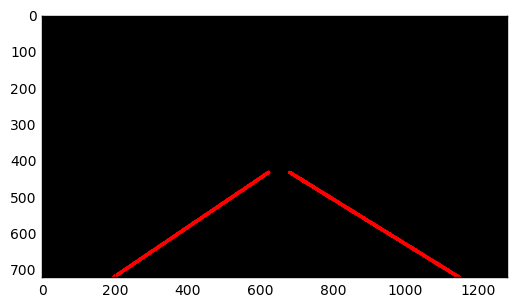

 55%|████████████████████████████████████████████▊                                    | 139/251 [02:00<02:09,  1.15s/it]

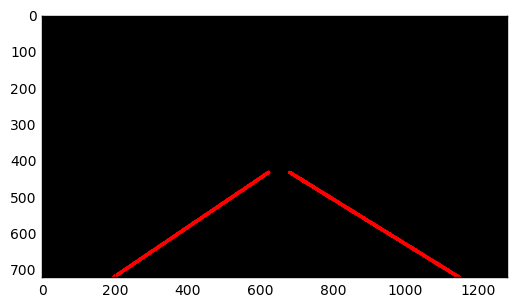

 56%|█████████████████████████████████████████████▏                                   | 140/251 [02:02<02:34,  1.39s/it]

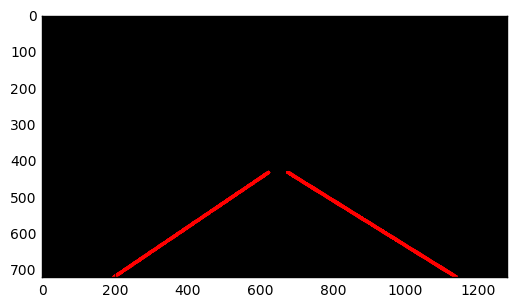

 56%|█████████████████████████████████████████████▌                                   | 141/251 [02:03<02:16,  1.24s/it]

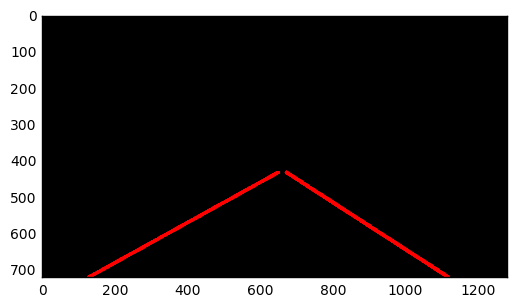

 57%|█████████████████████████████████████████████▊                                   | 142/251 [02:04<02:06,  1.16s/it]

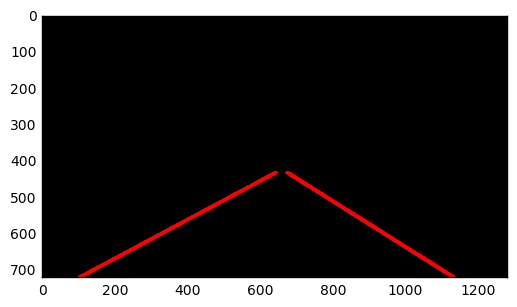

 57%|██████████████████████████████████████████████▏                                  | 143/251 [02:05<02:08,  1.19s/it]

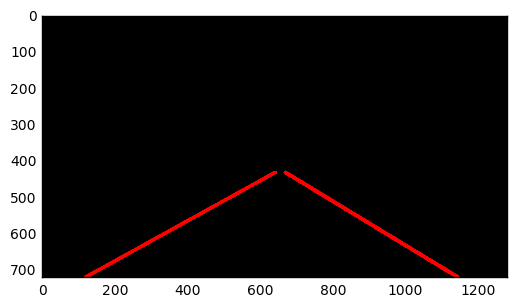

 57%|██████████████████████████████████████████████▍                                  | 144/251 [02:06<01:55,  1.08s/it]

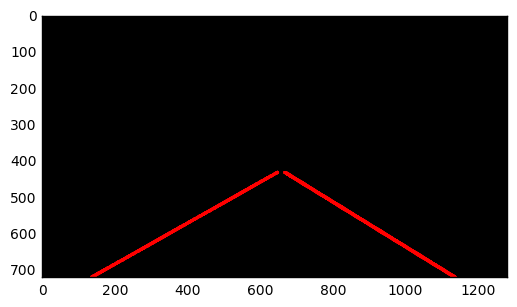

 58%|██████████████████████████████████████████████▊                                  | 145/251 [02:07<01:43,  1.02it/s]

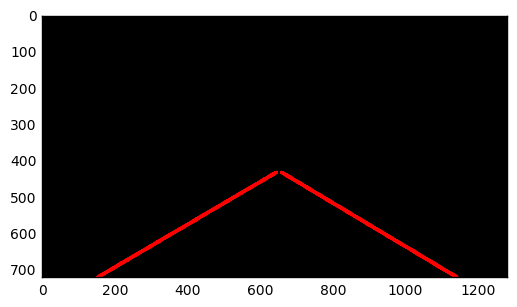

 58%|███████████████████████████████████████████████                                  | 146/251 [02:08<01:37,  1.08it/s]

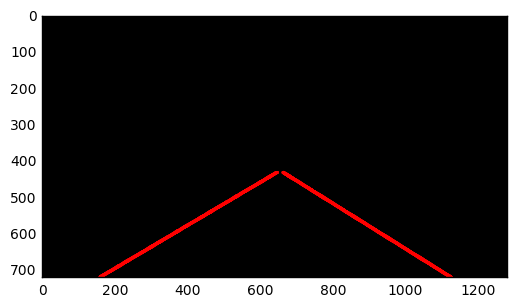

 59%|███████████████████████████████████████████████▍                                 | 147/251 [02:08<01:33,  1.12it/s]

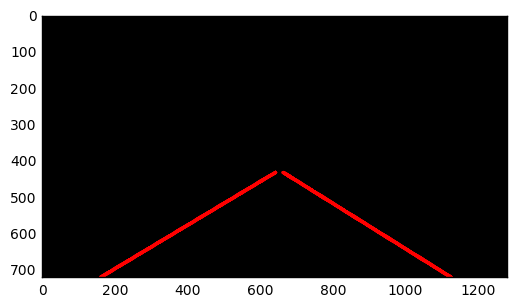

 59%|███████████████████████████████████████████████▊                                 | 148/251 [02:09<01:28,  1.16it/s]

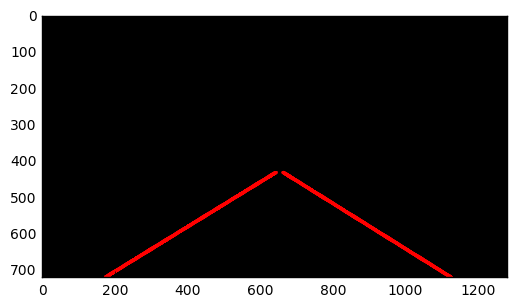

 59%|████████████████████████████████████████████████                                 | 149/251 [02:10<01:25,  1.19it/s]

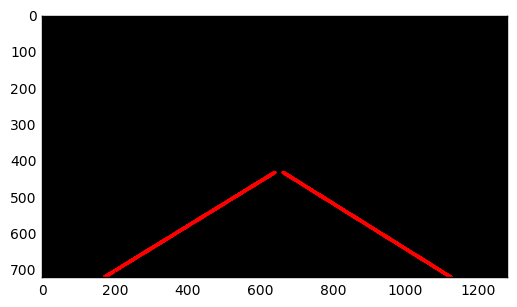

 60%|████████████████████████████████████████████████▍                                | 150/251 [02:11<01:20,  1.26it/s]

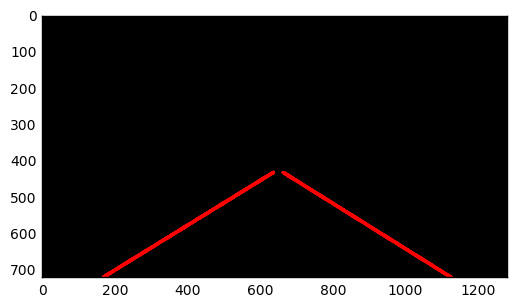

 60%|████████████████████████████████████████████████▋                                | 151/251 [02:11<01:16,  1.30it/s]

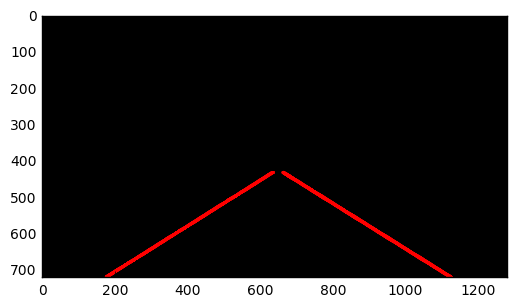

 61%|█████████████████████████████████████████████████                                | 152/251 [02:12<01:14,  1.33it/s]

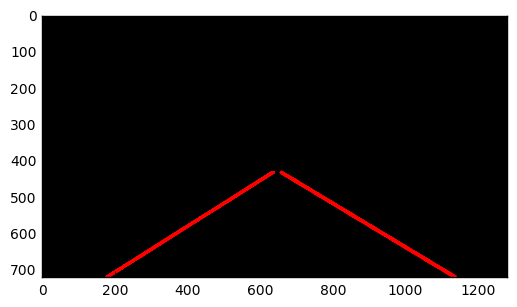

 61%|█████████████████████████████████████████████████▎                               | 153/251 [02:13<01:14,  1.31it/s]

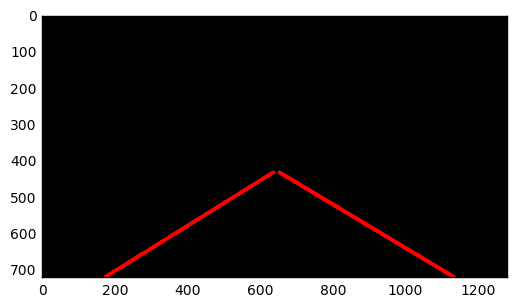

 61%|█████████████████████████████████████████████████▋                               | 154/251 [02:14<01:24,  1.14it/s]

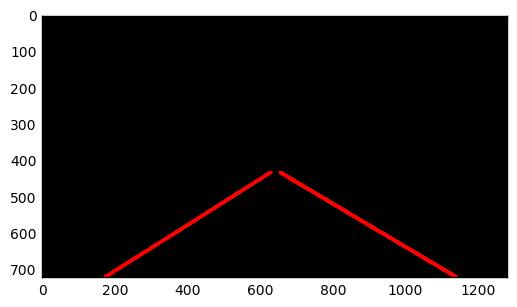

 62%|██████████████████████████████████████████████████                               | 155/251 [02:15<01:23,  1.15it/s]

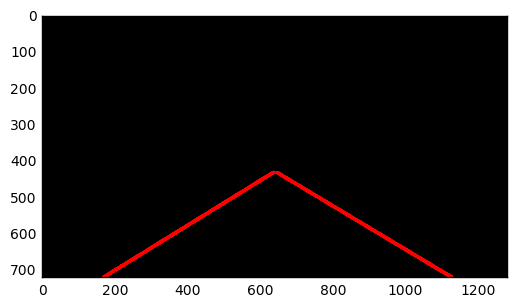

 62%|██████████████████████████████████████████████████▎                              | 156/251 [02:16<01:18,  1.21it/s]

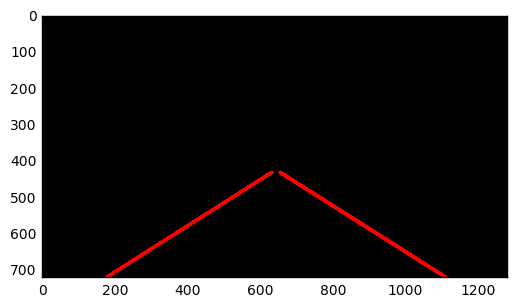

 63%|██████████████████████████████████████████████████▋                              | 157/251 [02:16<01:15,  1.24it/s]

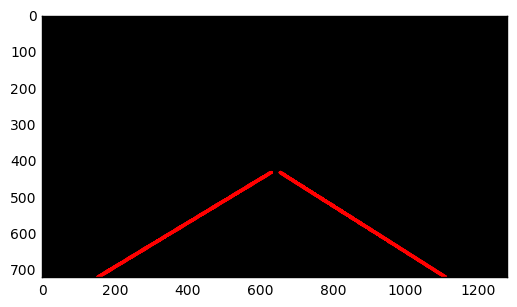

 63%|██████████████████████████████████████████████████▉                              | 158/251 [02:17<01:12,  1.29it/s]

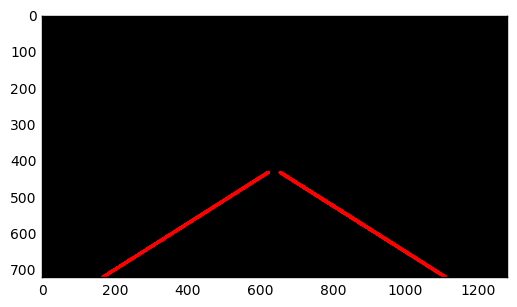

 63%|███████████████████████████████████████████████████▎                             | 159/251 [02:18<01:09,  1.32it/s]

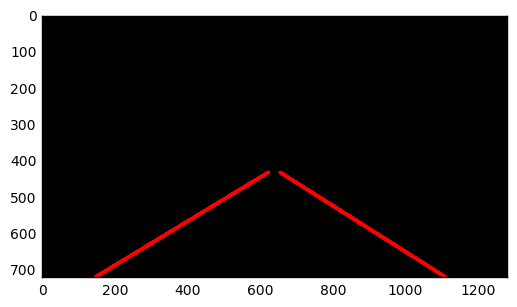

 64%|███████████████████████████████████████████████████▋                             | 160/251 [02:19<01:08,  1.33it/s]

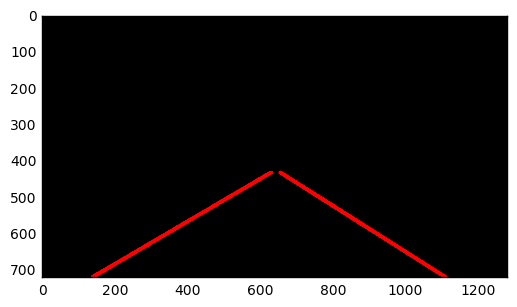

 64%|███████████████████████████████████████████████████▉                             | 161/251 [02:19<01:08,  1.32it/s]

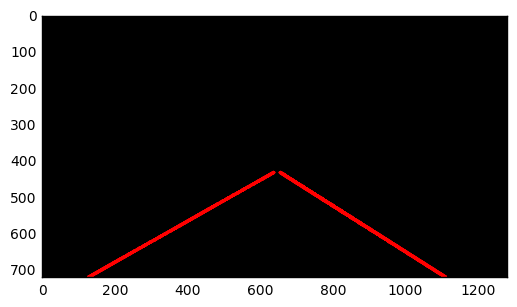

 65%|████████████████████████████████████████████████████▎                            | 162/251 [02:20<01:09,  1.29it/s]

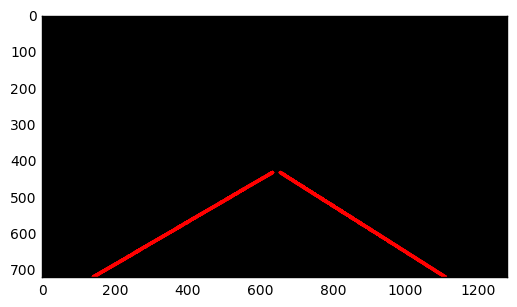

 65%|████████████████████████████████████████████████████▌                            | 163/251 [02:21<01:10,  1.25it/s]

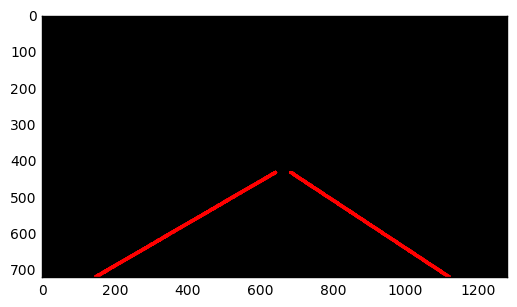

 65%|████████████████████████████████████████████████████▉                            | 164/251 [02:22<01:07,  1.30it/s]

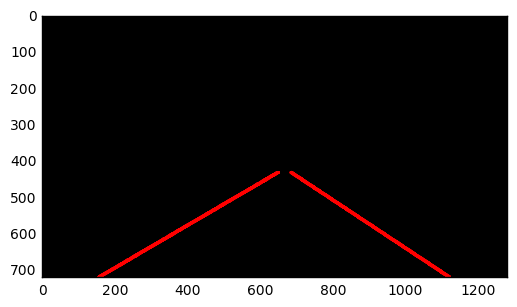

 66%|█████████████████████████████████████████████████████▏                           | 165/251 [02:23<01:10,  1.22it/s]

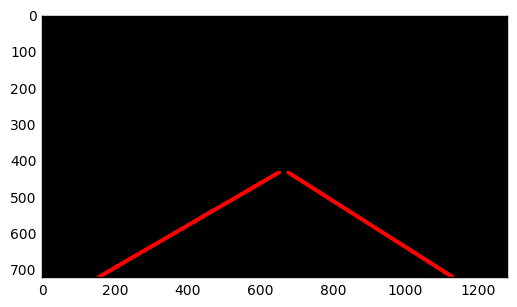

 66%|█████████████████████████████████████████████████████▌                           | 166/251 [02:23<01:07,  1.27it/s]

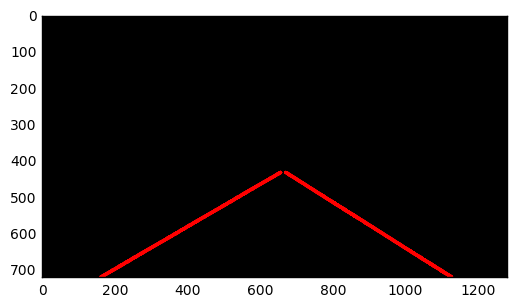

 67%|█████████████████████████████████████████████████████▉                           | 167/251 [02:24<01:04,  1.31it/s]

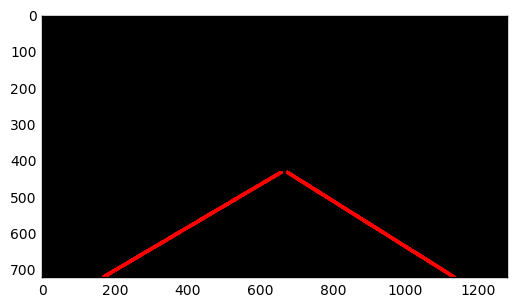

 67%|██████████████████████████████████████████████████████▏                          | 168/251 [02:25<01:05,  1.27it/s]

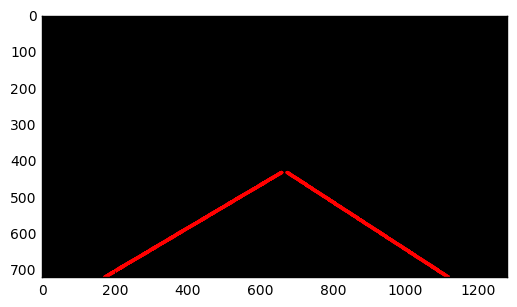

 67%|██████████████████████████████████████████████████████▌                          | 169/251 [02:26<01:07,  1.22it/s]

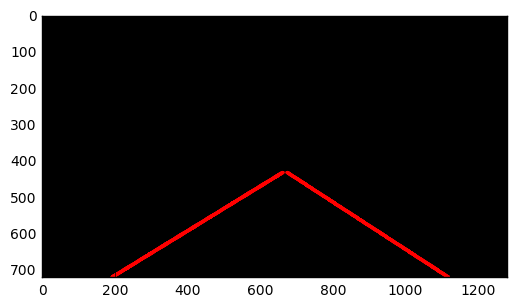

 68%|██████████████████████████████████████████████████████▊                          | 170/251 [02:27<01:03,  1.27it/s]

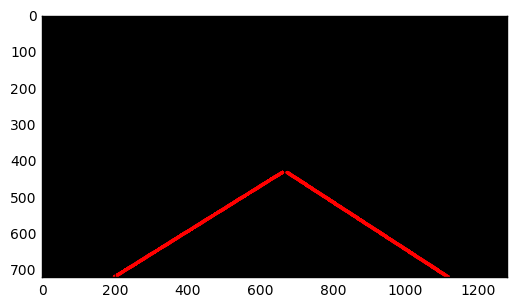

 68%|███████████████████████████████████████████████████████▏                         | 171/251 [02:27<01:00,  1.33it/s]

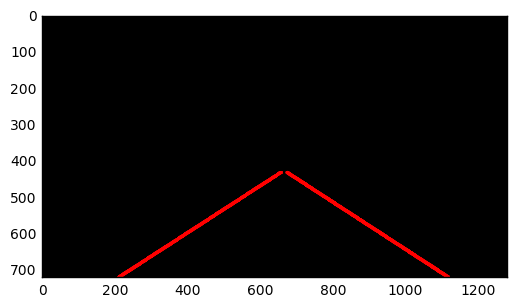

 69%|███████████████████████████████████████████████████████▌                         | 172/251 [02:28<00:58,  1.35it/s]

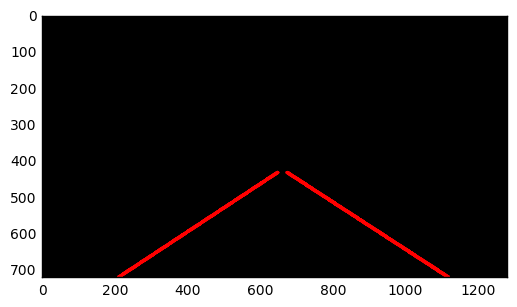

 69%|███████████████████████████████████████████████████████▊                         | 173/251 [02:29<00:58,  1.34it/s]

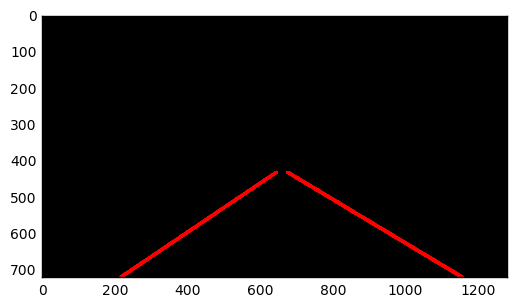

 69%|████████████████████████████████████████████████████████▏                        | 174/251 [02:29<00:58,  1.32it/s]

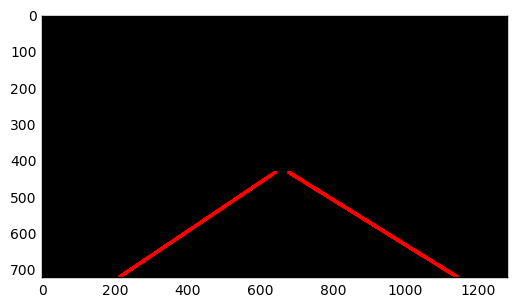

 70%|████████████████████████████████████████████████████████▍                        | 175/251 [02:30<00:57,  1.33it/s]

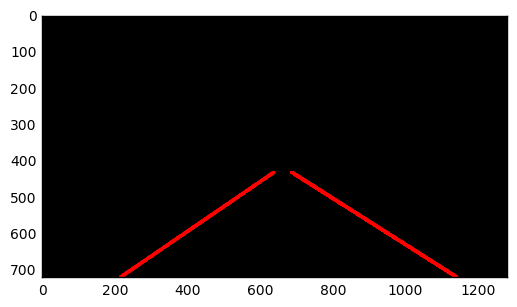

 70%|████████████████████████████████████████████████████████▊                        | 176/251 [02:31<01:01,  1.22it/s]

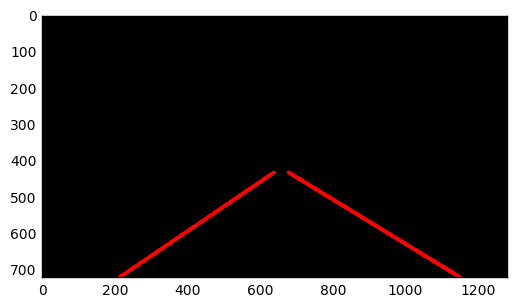

 71%|█████████████████████████████████████████████████████████                        | 177/251 [02:32<00:59,  1.25it/s]

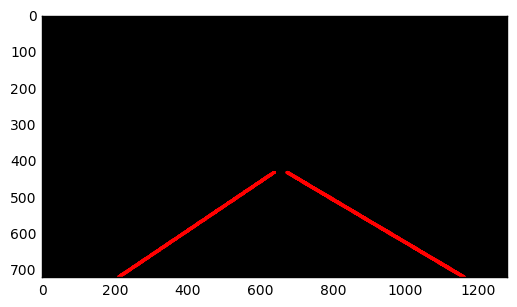

 71%|█████████████████████████████████████████████████████████▍                       | 178/251 [02:33<00:57,  1.27it/s]

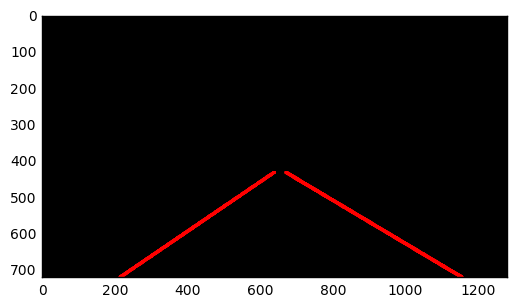

 71%|█████████████████████████████████████████████████████████▊                       | 179/251 [02:34<01:00,  1.19it/s]

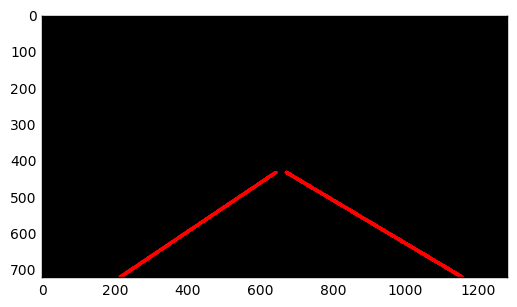

 72%|██████████████████████████████████████████████████████████                       | 180/251 [02:35<01:06,  1.06it/s]

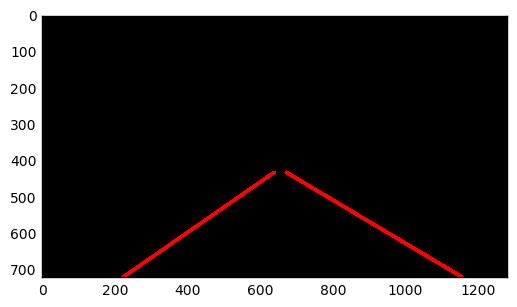

 72%|██████████████████████████████████████████████████████████▍                      | 181/251 [02:36<01:11,  1.02s/it]

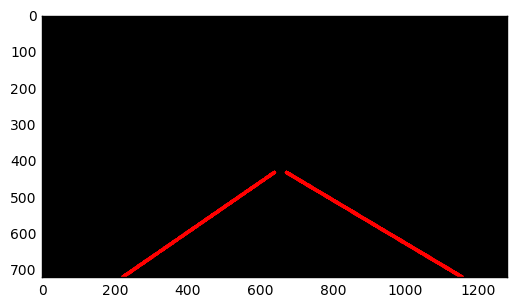

 73%|██████████████████████████████████████████████████████████▋                      | 182/251 [02:37<01:09,  1.01s/it]

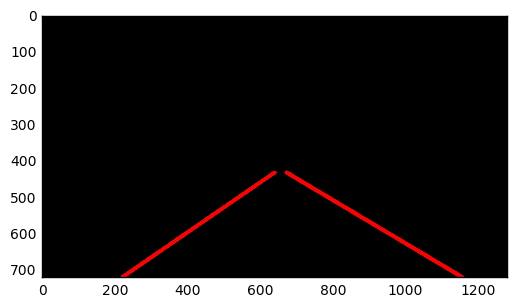

 73%|███████████████████████████████████████████████████████████                      | 183/251 [02:38<01:13,  1.08s/it]

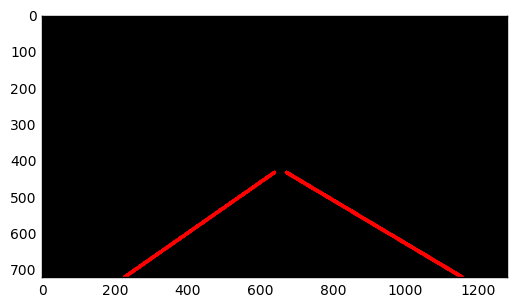

 73%|███████████████████████████████████████████████████████████▍                     | 184/251 [02:39<01:11,  1.06s/it]

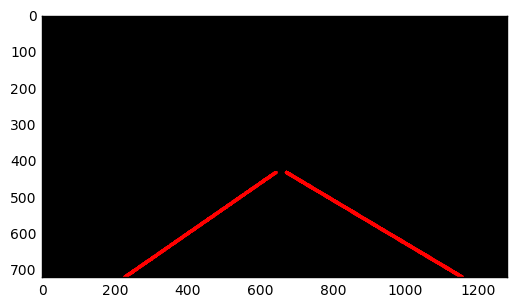

 74%|███████████████████████████████████████████████████████████▋                     | 185/251 [02:40<01:11,  1.09s/it]

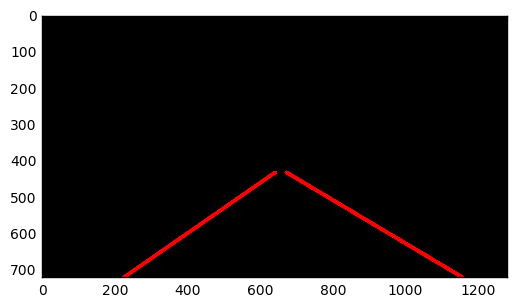

 74%|████████████████████████████████████████████████████████████                     | 186/251 [02:41<01:07,  1.03s/it]

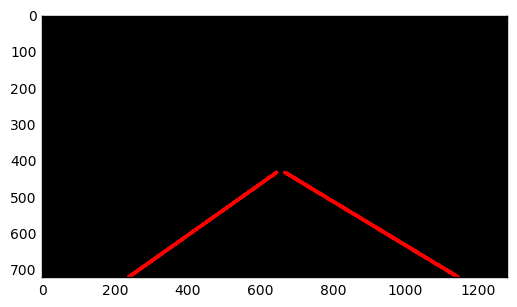

 75%|████████████████████████████████████████████████████████████▎                    | 187/251 [02:42<01:05,  1.03s/it]

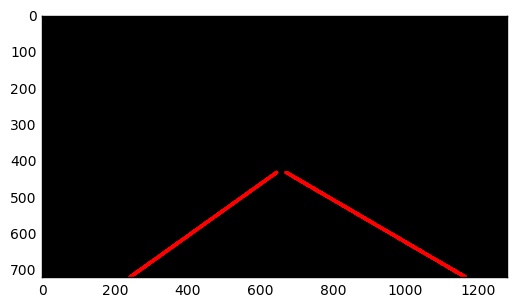

 75%|████████████████████████████████████████████████████████████▋                    | 188/251 [02:43<00:59,  1.06it/s]

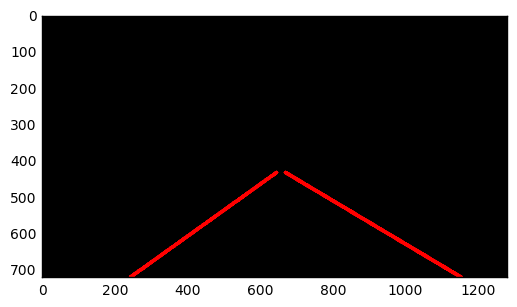

 75%|████████████████████████████████████████████████████████████▉                    | 189/251 [02:44<00:54,  1.13it/s]

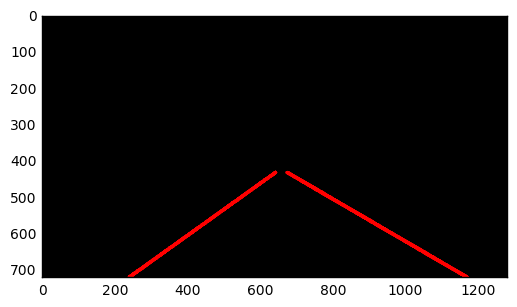

 76%|█████████████████████████████████████████████████████████████▎                   | 190/251 [02:45<00:50,  1.20it/s]

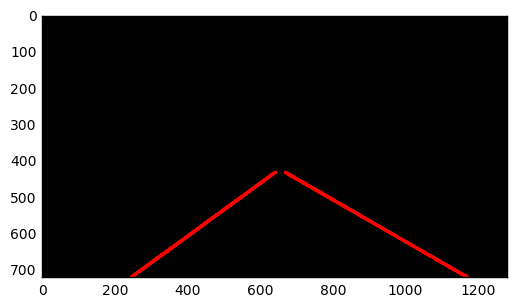

 76%|█████████████████████████████████████████████████████████████▋                   | 191/251 [02:45<00:48,  1.23it/s]

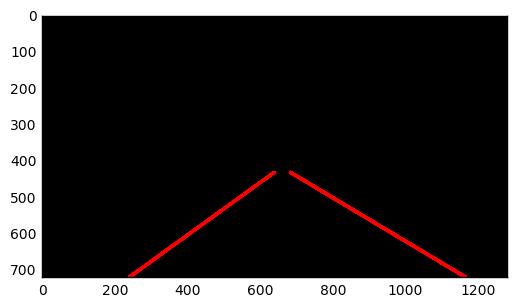

 76%|█████████████████████████████████████████████████████████████▉                   | 192/251 [02:46<00:48,  1.21it/s]

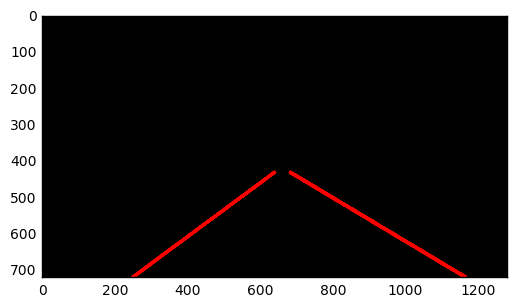

 77%|██████████████████████████████████████████████████████████████▎                  | 193/251 [02:47<00:50,  1.16it/s]

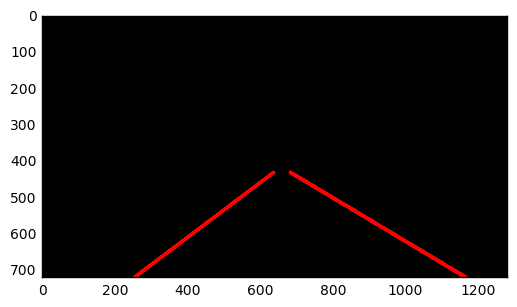

 77%|██████████████████████████████████████████████████████████████▌                  | 194/251 [02:48<00:48,  1.17it/s]

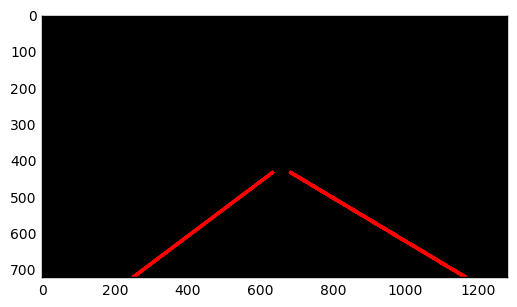

 78%|██████████████████████████████████████████████████████████████▉                  | 195/251 [02:49<00:46,  1.21it/s]

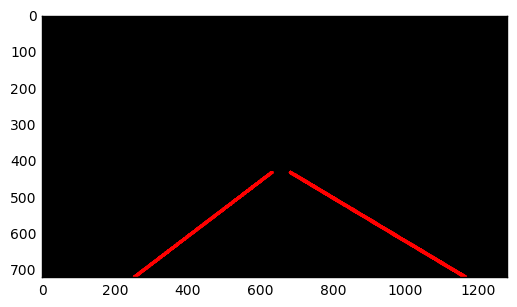

 78%|███████████████████████████████████████████████████████████████▎                 | 196/251 [02:50<00:53,  1.03it/s]

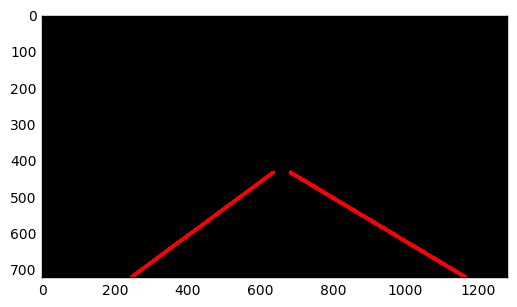

 78%|███████████████████████████████████████████████████████████████▌                 | 197/251 [02:51<00:52,  1.03it/s]

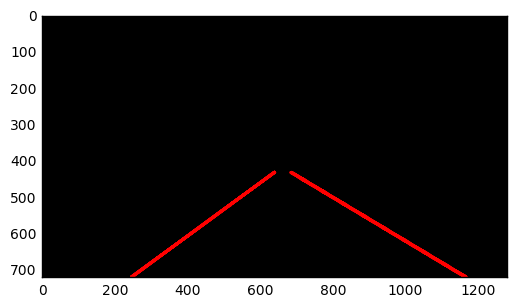

 79%|███████████████████████████████████████████████████████████████▉                 | 198/251 [02:52<00:52,  1.01it/s]

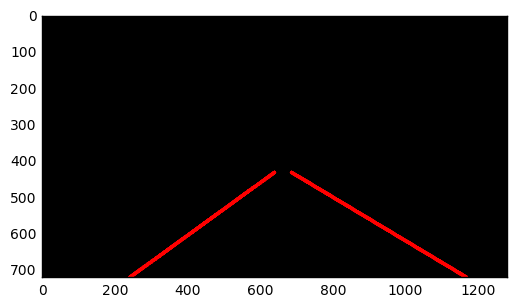

 79%|████████████████████████████████████████████████████████████████▏                | 199/251 [02:53<00:50,  1.04it/s]

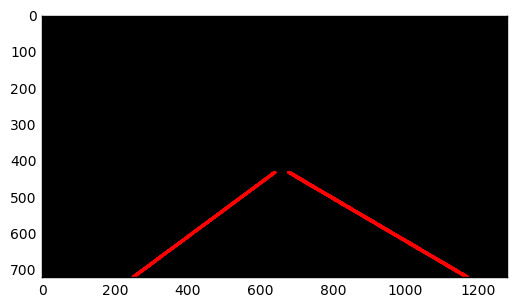

 80%|████████████████████████████████████████████████████████████████▌                | 200/251 [02:54<00:47,  1.06it/s]

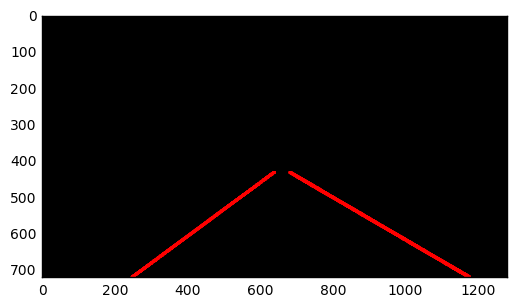

 80%|████████████████████████████████████████████████████████████████▊                | 201/251 [02:55<00:44,  1.12it/s]

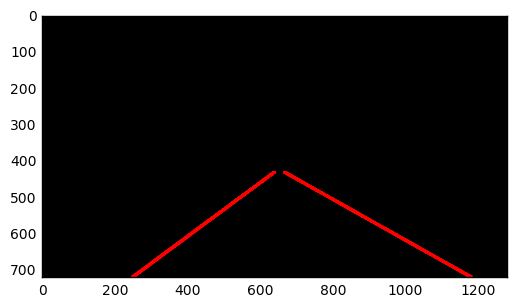

 80%|█████████████████████████████████████████████████████████████████▏               | 202/251 [02:56<00:48,  1.01it/s]

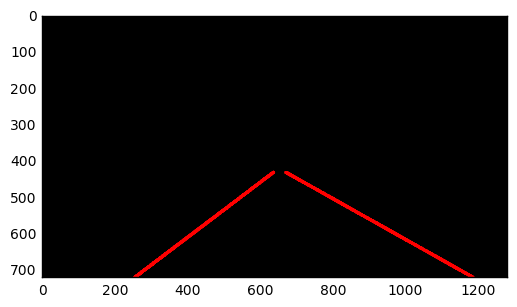

 81%|█████████████████████████████████████████████████████████████████▌               | 203/251 [02:57<00:46,  1.04it/s]

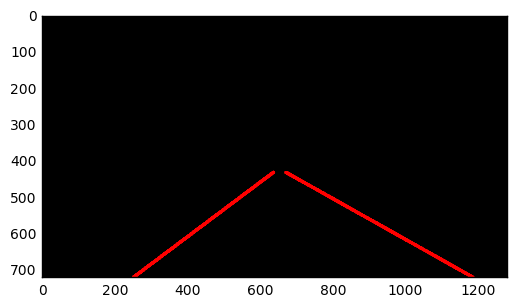

 81%|█████████████████████████████████████████████████████████████████▊               | 204/251 [02:58<00:43,  1.08it/s]

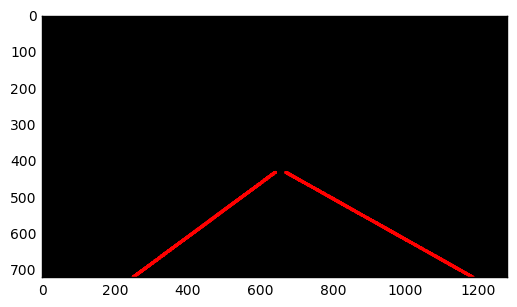

 82%|██████████████████████████████████████████████████████████████████▏              | 205/251 [02:58<00:42,  1.09it/s]

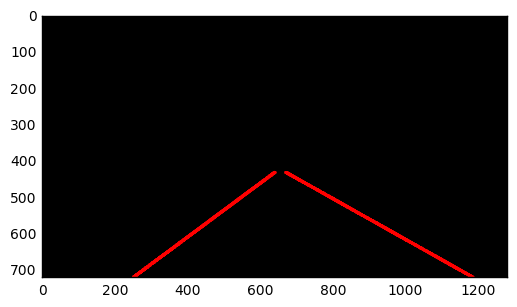

 82%|██████████████████████████████████████████████████████████████████▍              | 206/251 [03:00<00:43,  1.04it/s]

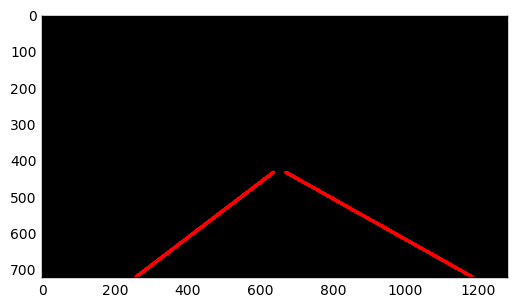

 82%|██████████████████████████████████████████████████████████████████▊              | 207/251 [03:00<00:41,  1.05it/s]

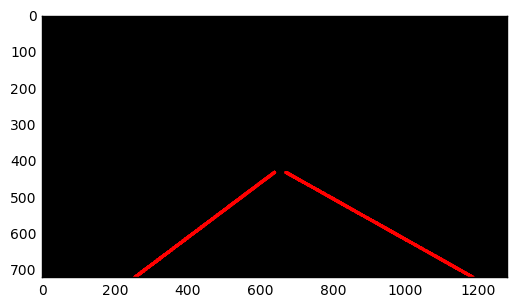

 83%|███████████████████████████████████████████████████████████████████              | 208/251 [03:01<00:38,  1.10it/s]

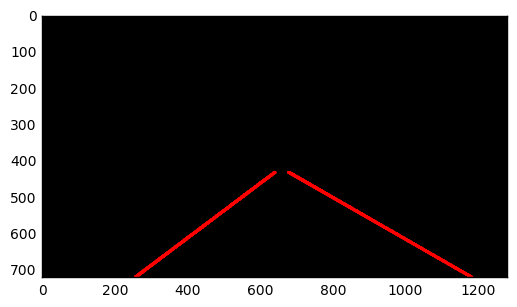

 83%|███████████████████████████████████████████████████████████████████▍             | 209/251 [03:03<00:48,  1.14s/it]

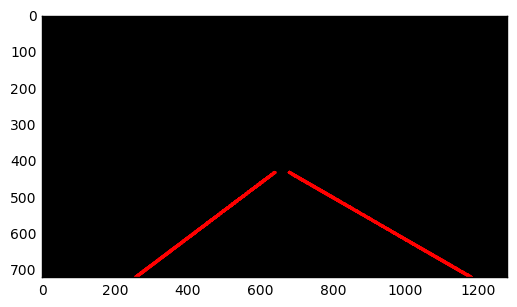

 84%|███████████████████████████████████████████████████████████████████▊             | 210/251 [03:04<00:50,  1.24s/it]

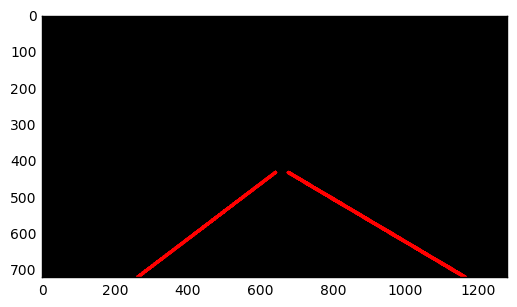

 84%|████████████████████████████████████████████████████████████████████             | 211/251 [03:06<00:58,  1.45s/it]

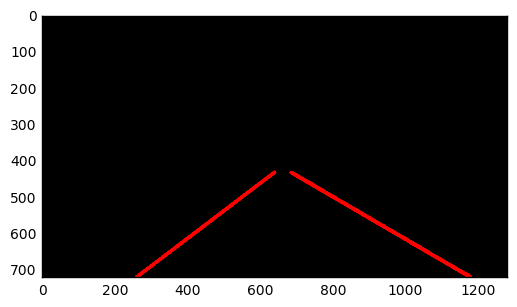

 84%|████████████████████████████████████████████████████████████████████▍            | 212/251 [03:08<00:59,  1.54s/it]

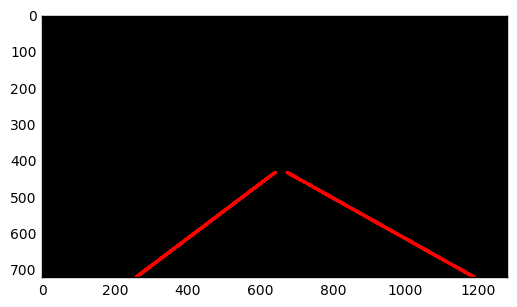

 85%|████████████████████████████████████████████████████████████████████▋            | 213/251 [03:10<00:57,  1.51s/it]

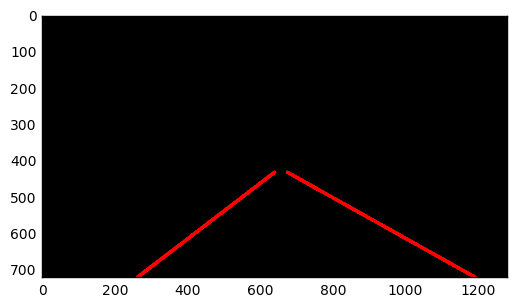

 85%|█████████████████████████████████████████████████████████████████████            | 214/251 [03:11<00:53,  1.43s/it]

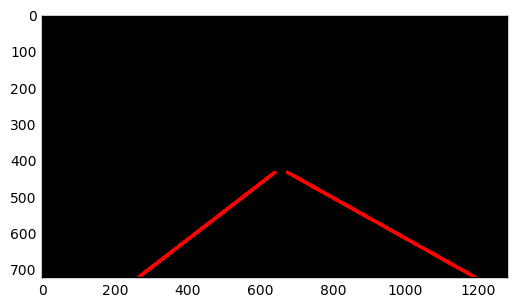

 86%|█████████████████████████████████████████████████████████████████████▍           | 215/251 [03:12<00:44,  1.25s/it]

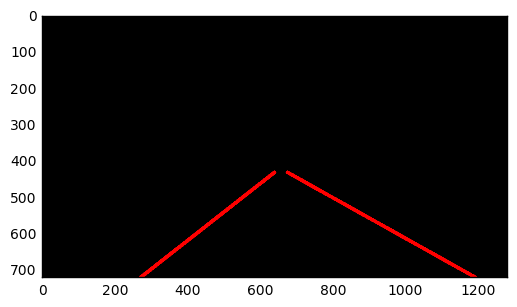

 86%|█████████████████████████████████████████████████████████████████████▋           | 216/251 [03:12<00:39,  1.12s/it]

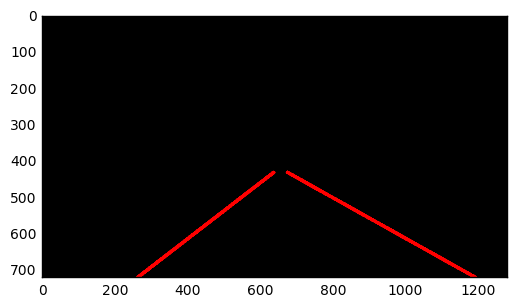

 86%|██████████████████████████████████████████████████████████████████████           | 217/251 [03:13<00:34,  1.00s/it]

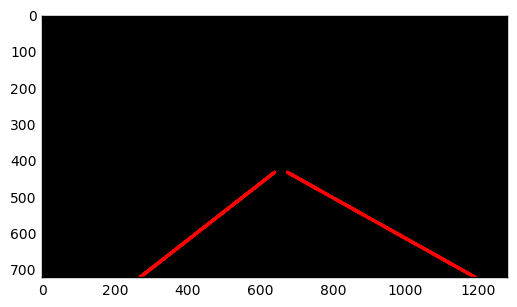

 87%|██████████████████████████████████████████████████████████████████████▎          | 218/251 [03:14<00:31,  1.06it/s]

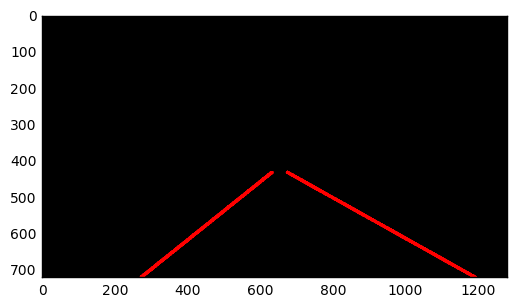

 87%|██████████████████████████████████████████████████████████████████████▋          | 219/251 [03:15<00:28,  1.11it/s]

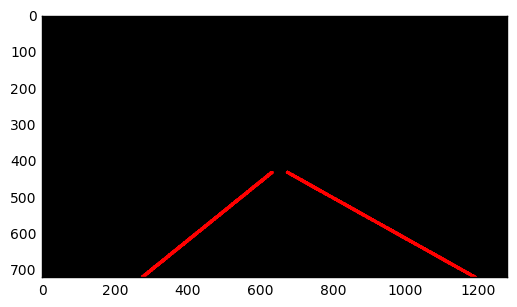

 88%|██████████████████████████████████████████████████████████████████████▉          | 220/251 [03:16<00:29,  1.05it/s]

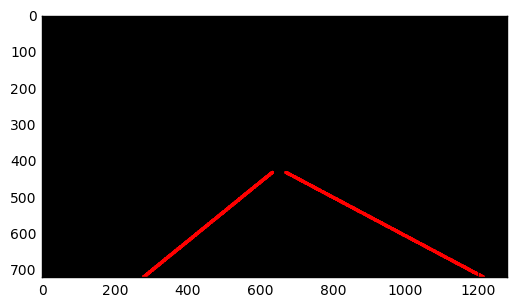

 88%|███████████████████████████████████████████████████████████████████████▎         | 221/251 [03:17<00:27,  1.10it/s]

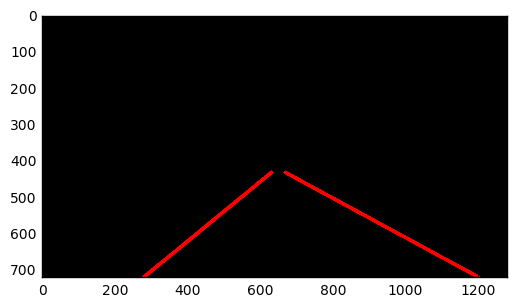

 88%|███████████████████████████████████████████████████████████████████████▋         | 222/251 [03:17<00:24,  1.17it/s]

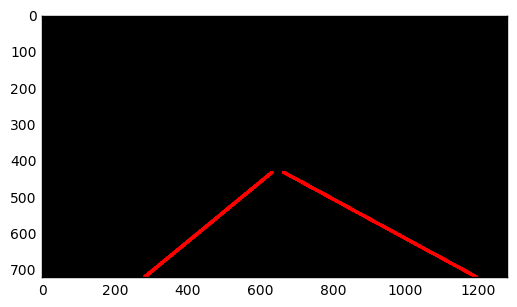

 89%|███████████████████████████████████████████████████████████████████████▉         | 223/251 [03:18<00:23,  1.18it/s]

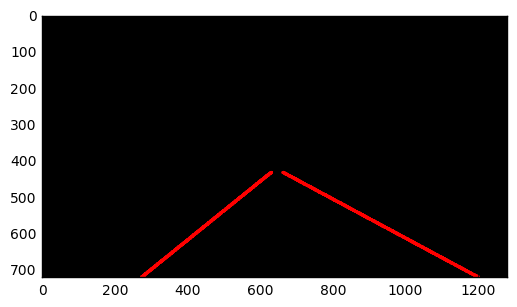

 89%|████████████████████████████████████████████████████████████████████████▎        | 224/251 [03:19<00:22,  1.22it/s]

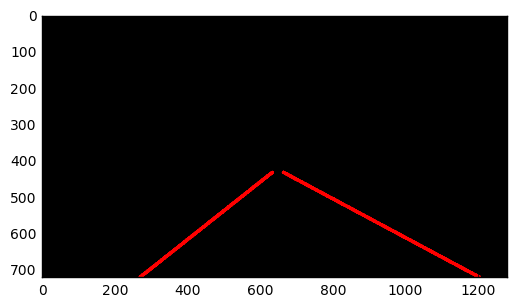

 90%|████████████████████████████████████████████████████████████████████████▌        | 225/251 [03:20<00:20,  1.25it/s]

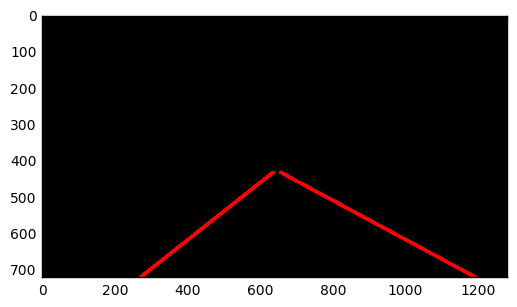

 90%|████████████████████████████████████████████████████████████████████████▉        | 226/251 [03:21<00:20,  1.23it/s]

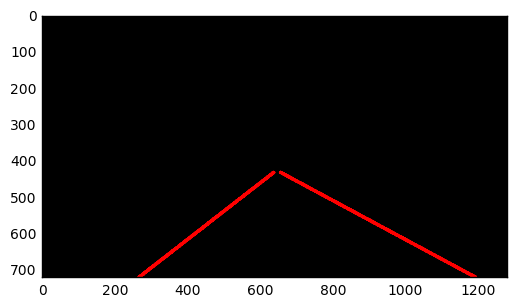

 90%|█████████████████████████████████████████████████████████████████████████▎       | 227/251 [03:21<00:18,  1.27it/s]

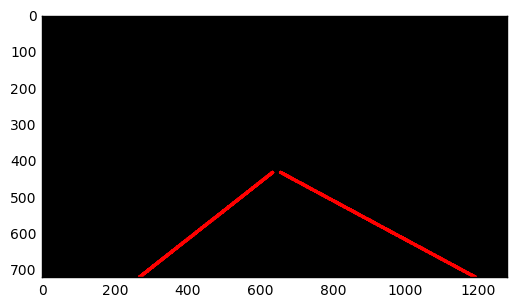

 91%|█████████████████████████████████████████████████████████████████████████▌       | 228/251 [03:22<00:17,  1.32it/s]

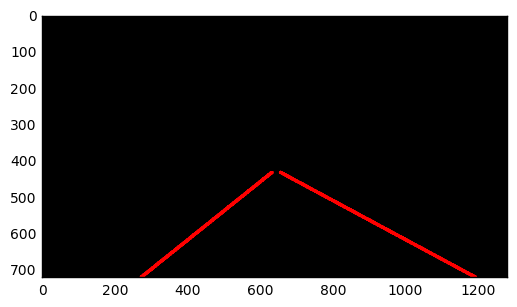

 91%|█████████████████████████████████████████████████████████████████████████▉       | 229/251 [03:23<00:16,  1.36it/s]

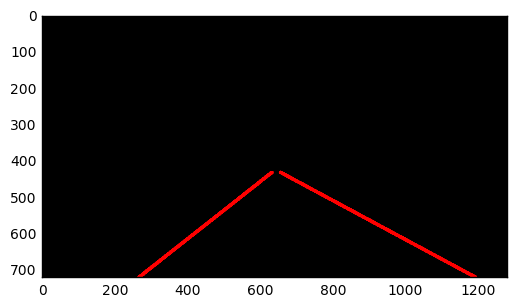

 92%|██████████████████████████████████████████████████████████████████████████▏      | 230/251 [03:23<00:15,  1.37it/s]

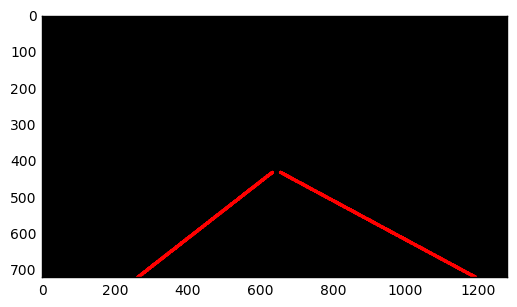

 92%|██████████████████████████████████████████████████████████████████████████▌      | 231/251 [03:24<00:16,  1.23it/s]

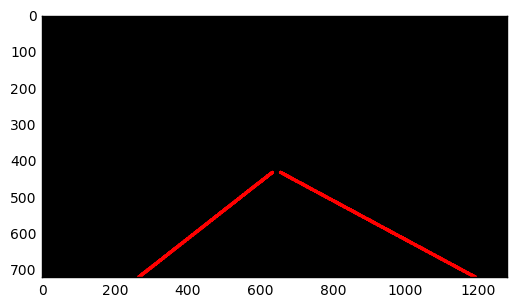

 92%|██████████████████████████████████████████████████████████████████████████▊      | 232/251 [03:25<00:15,  1.26it/s]

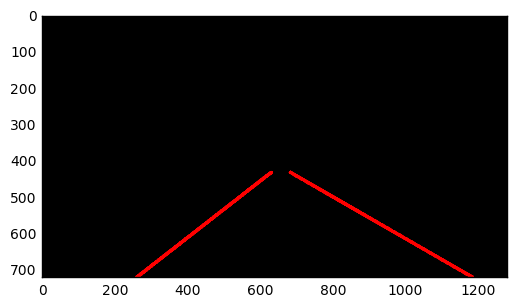

 93%|███████████████████████████████████████████████████████████████████████████▏     | 233/251 [03:26<00:14,  1.21it/s]

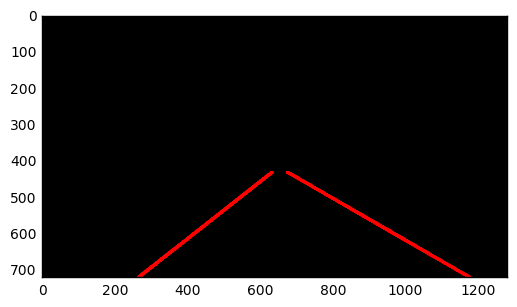

 93%|███████████████████████████████████████████████████████████████████████████▌     | 234/251 [03:27<00:14,  1.18it/s]

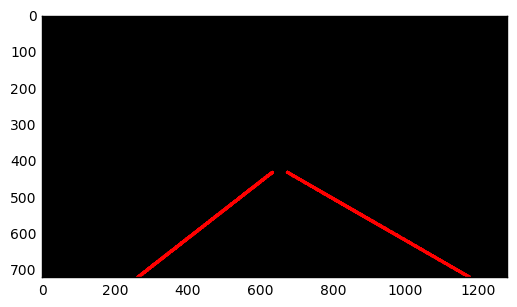

 94%|███████████████████████████████████████████████████████████████████████████▊     | 235/251 [03:28<00:12,  1.25it/s]

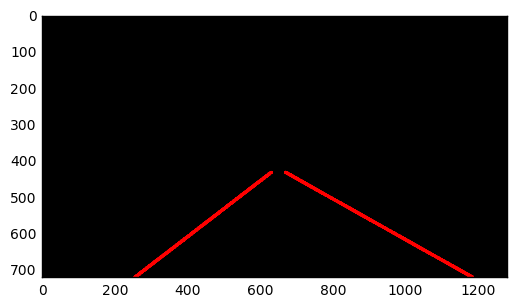

 94%|████████████████████████████████████████████████████████████████████████████▏    | 236/251 [03:28<00:11,  1.30it/s]

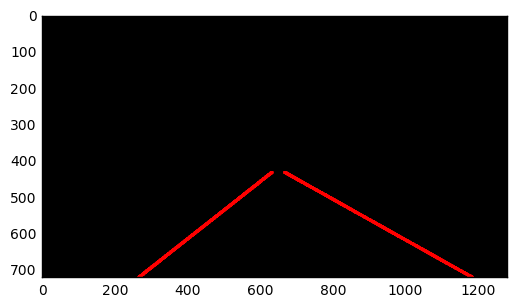

 94%|████████████████████████████████████████████████████████████████████████████▍    | 237/251 [03:29<00:10,  1.34it/s]

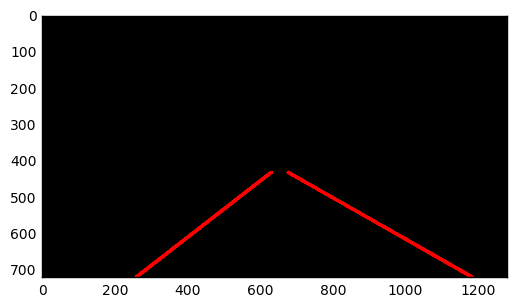

 95%|████████████████████████████████████████████████████████████████████████████▊    | 238/251 [03:30<00:09,  1.37it/s]

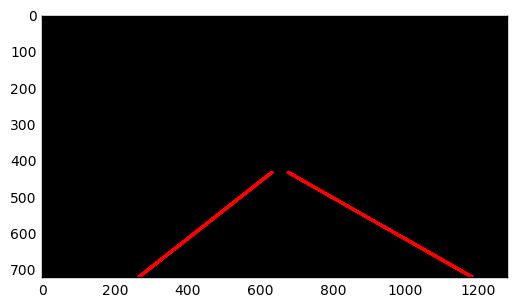

 95%|█████████████████████████████████████████████████████████████████████████████▏   | 239/251 [03:30<00:08,  1.38it/s]

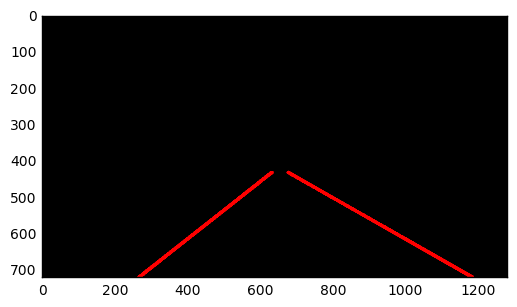

 96%|█████████████████████████████████████████████████████████████████████████████▍   | 240/251 [03:31<00:07,  1.40it/s]

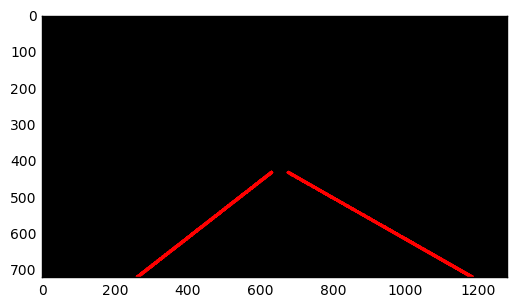

 96%|█████████████████████████████████████████████████████████████████████████████▊   | 241/251 [03:32<00:07,  1.40it/s]

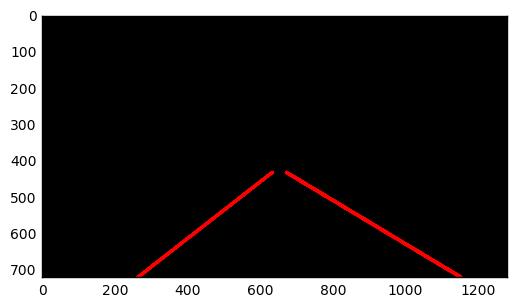

 96%|██████████████████████████████████████████████████████████████████████████████   | 242/251 [03:33<00:06,  1.30it/s]

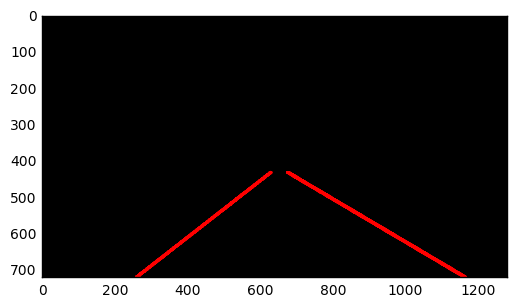

 97%|██████████████████████████████████████████████████████████████████████████████▍  | 243/251 [03:33<00:06,  1.33it/s]

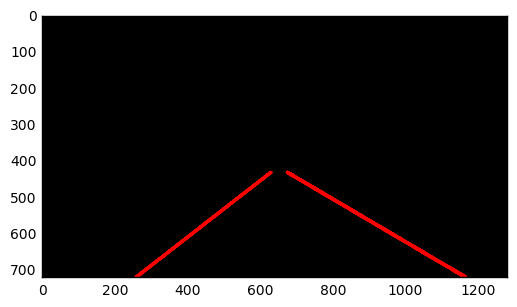

 97%|██████████████████████████████████████████████████████████████████████████████▋  | 244/251 [03:34<00:05,  1.35it/s]

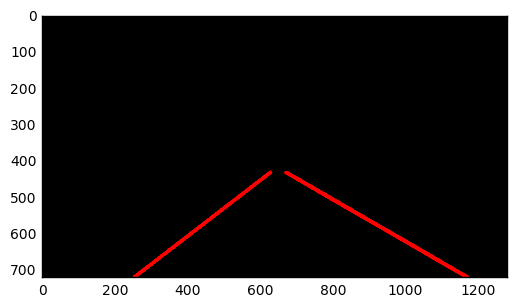

 98%|███████████████████████████████████████████████████████████████████████████████  | 245/251 [03:35<00:04,  1.32it/s]

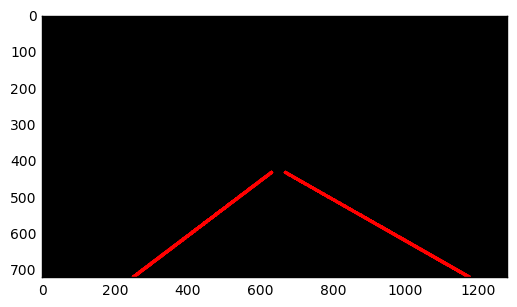

 98%|███████████████████████████████████████████████████████████████████████████████▍ | 246/251 [03:36<00:03,  1.34it/s]

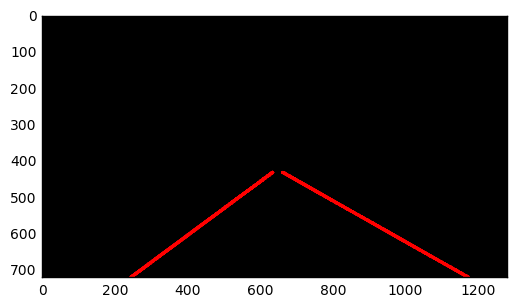

 98%|███████████████████████████████████████████████████████████████████████████████▋ | 247/251 [03:36<00:02,  1.37it/s]

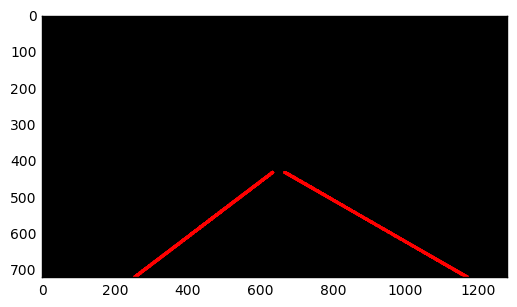

 99%|████████████████████████████████████████████████████████████████████████████████ | 248/251 [03:37<00:02,  1.39it/s]

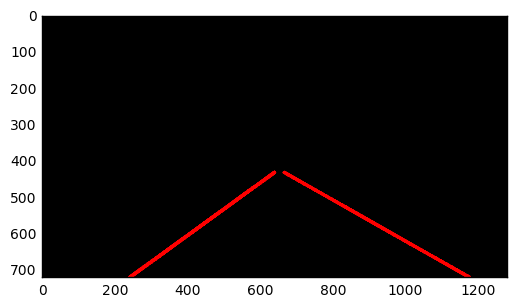

 99%|████████████████████████████████████████████████████████████████████████████████▎| 249/251 [03:38<00:01,  1.42it/s]

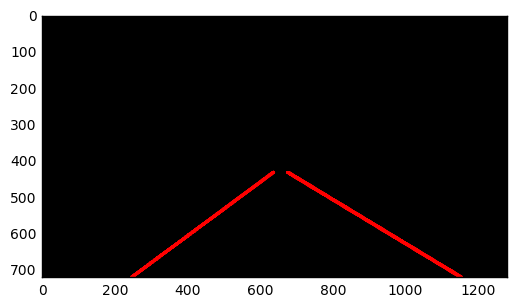

100%|████████████████████████████████████████████████████████████████████████████████▋| 250/251 [03:38<00:00,  1.43it/s]

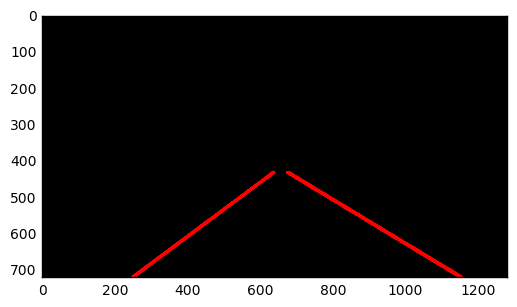

100%|█████████████████████████████████████████████████████████████████████████████████| 251/251 [03:39<00:00,  1.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: extra.mp4 

Wall time: 3min 42s


In [20]:
challenge_output = 'extra.mp4'
clip2 = VideoFileClip('challenge.mp4')
challenge_clip = clip2.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))